In [1]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
# sys.path.append("./Grab_TNGgalaxy")
import illustris_python as il
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'
from astroML.plotting import setup_text_plots
#Lets text in plots use latex
# setup_text_plots(usetex=True)

/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/astroML/linear_model/linear_regression_errors.py:10: UserWarning: LinearRegressionwithErrors requires PyMC3 to be installed
  warnings.warn('LinearRegressionwithErrors requires PyMC3 to be installed')


In [2]:
'''Tranfer SnapNum to Redshift'''

import numpy as np
import h5py, scipy
from pynbody import units as units_conv

Redshift_snapshot = np.loadtxt('/home/bianyuan/workspace/data/Redshift_snapshot.txt',comments='Snapshot')

def redshift_snapshot(snapshots, datafile='/home/bianyuan/workspace/data/Redshift_snapshot.txt', return_opt=None):
    snapshots0, redshifts0 = np.loadtxt(datafile, skiprows=1, unpack=True, usecols=[0, 2])
    n_snap = np.size(snapshots)
    if n_snap == 1: 
        redshifts = redshifts0[np.where(snapshots0 == snapshots)][0]
    elif n_snap >1:
        redshifts = np.zeros(n_snap)
        for ii in range(n_snap): 
            if  snapshots[ii] is np.nan: 
                redshifts[ii] = np.nan
            else:
                redshifts[ii] = redshifts0[np.where(snapshots0 == snapshots[ii])][0]
    if return_opt is None: 
        return redshifts
#   elif return_opt == 'age':
#       return age(redshifts)
    elif return_opt == 'FT':
        return FT(redshifts)

def _a_dot(a, h0, om_m, om_l):                                
    om_k = 1.0 - om_m - om_l      
    return h0 * a * np.sqrt(om_m * (a ** -3) + om_k * (a ** -2) + om_l)  

def _a_dot_recip(*args):
    return 1. / _a_dot(*args) 

# The formation time of stars in unit of Gyr
def FT(redshift, h0=0.6774, OmegaM=0.3089, OmegaL=0.6911):
    conv = units_conv.Unit("0.01 s Mpc km^-1").ratio('Gyr')
    redshift = 1./(1. + redshift)
    ns = np.size(redshift)
    if ns > 1:
        FT = np.zeros(ns)
        for ii in range(ns): FT[ii] = scipy.integrate.quad(_a_dot_recip, 0, redshift[ii], (h0, OmegaM, OmegaL))[0] * conv
    else:
        FT = scipy.integrate.quad(_a_dot_recip, 0, redshift, (h0, OmegaM, OmegaL))[0] * conv
    return FT

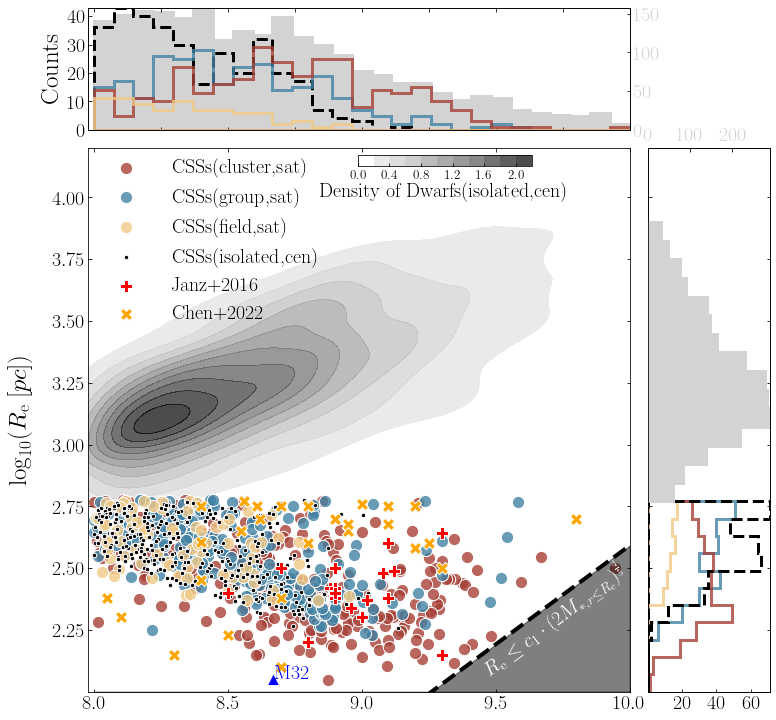

In [3]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)
ND = (223/255,224/255,217/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

import pandas as pd

# Load the CSV data
CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

# # Define the boundaries for the "d" region
# x_min, x_max = 0, 3.4
# y_min, y_max = 0.085, 0.61

# # Filter out points from the "d" region
# mask_d = ~((13.8 - CSSs3["MWted-Age"] >= x_min) & (13.8 - CSSs3["MWted-Age"] <= x_max) & (CSSs3["[Z/H]_r"] >= y_min) & (CSSs3["[Z/H]_r"] <= y_max))
# CSSs3 = CSSs3[mask_d]

Re_fl_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Re_grp_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
Re_cl_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
Re_iso_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
Re_iso_ND =np.array(Normal_Dwarf['Re'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Re_iso_ND1 =np.array(Normal_Dwarf['Re'])[np.where((np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

Star_fl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Star_grp_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
# Star_grp_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 12) & (np.log10(CSSs3['Groupmass']) <= 13))]
Star_cl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
# Star_cl_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 13))]
Star_iso_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
Star_iso_ND = np.array(Normal_Dwarf['Star mass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Star_iso_ND1 = np.array(Normal_Dwarf['Star mass'])[np.where( (np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]


Re_CSSs = np.array(CSSs3['Re'])[np.where((np.log10(CSSs3['Star mass'])<10))]
Star_CSSs = np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Star mass'])<10))]

# plt.figure(figsize=(10,7))
# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 7))
fig = plt.figure(figsize=(11, 10))
plt.subplots_adjust(left=0.12, bottom=0.03, right=0.98, top=0.98, wspace=0.15, hspace=0.07)
grid = plt.GridSpec(5, 5, hspace=0.15, wspace=0.15)
plt.rcParams['xtick.direction'] = 'in'#将x周的刻度线方向设置向内
plt.rcParams['ytick.direction'] = 'in'#将y轴的刻度方向设置向内


# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
ax_top = fig.add_subplot(grid[0,:-1], xticklabels=[])

# 创建一个与 ax_top 共享 x 轴的新轴
ax_top2 = ax_top.twinx()

# 将 ax_top（原始的左轴）移动到右边
ax_top.yaxis.tick_right()
ax_top.yaxis.set_label_position("right")

# 将 ax_top2（通常是右轴）移动到左边
ax_top2.yaxis.tick_left()
ax_top2.yaxis.set_label_position("left")

# ax_top = fig.add_subplot(grid[0, 0:6], xticklabels=[])

# ax_top.tick_params(axis='y', which='both', labelsize=20)
ax_top2.set_yticks([0, 10, 20, 30, 40, 50])
ax_top2.set_yticklabels([0, 10, 20, 30, 40, 50], fontsize=20)
ax_top.set_yticks([0, 50, 100, 150])
ax_top.set_yticklabels([0, 50, 100, 150], fontsize=20, color='lightgrey')

ax_top2.set_ylabel('Counts', fontsize=25)
# ax_top.set_xticks([])
# ax_top.set_yticks([])
# ax_main = fig.add_subplot(grid[1:5,0:6])

# weights = np.ones_like(Star_iso_ND1) * 0.25
ax_top.hist(np.log10(Star_iso_ND1), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor='lightgrey', facecolor='lightgrey', zorder=1)
ax_top2.hist(np.log10(Star_iso_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', linestyle='--', edgecolor='black', facecolor='none', zorder=2)
ax_top2.hist(np.log10(Star_grp_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=grp, facecolor='none', zorder=2)
ax_top2.hist(np.log10(Star_cl_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=cl, facecolor='none', zorder=2)
ax_top2.hist(np.log10(Star_fl_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=fl, facecolor='none', zorder=2)

ax_top.set_xlim(8-0.02,10) 
ax_top2.set_xlim(8-0.02,10) 

# sns.kdeplot(data=np.log10(Star_grp_CSSs), ax=ax_top,color=grp, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_cl_CSSs), ax=ax_top, color=cl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_fl_CSSs), ax=ax_top, color=fl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_iso_CSSs), ax=ax_top, color='black', linestyle='--', linewidth=1)

ax_right2 = ax_right.twiny()

ax_right.set_xticks([20, 40, 60, 80])
ax_right.set_xticklabels([20, 40, 60, 80], fontsize=20)
ax_right2.set_xticks([0, 100, 200, 300])
ax_right2.set_xticklabels([0, 100, 200, 300], fontsize=20, color='lightgrey')
# ax_right.set_xlabel('Counts', fontsize=25)

# weights = np.ones_like(Re_iso_ND1) * 0.25
ax_right2.hist(np.log10(Re_iso_ND1), bins = np.linspace(2.77,3.9,16), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='lightgrey', facecolor='lightgrey')
ax_right.hist(np.log10(Re_grp_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, facecolor='none')
ax_right.hist(np.log10(Re_cl_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, facecolor='none')
ax_right.hist(np.log10(Re_fl_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='-', 
                                                                edgecolor=fl, facecolor='none')
ax_right.hist(np.log10(Re_iso_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='--', 
                                                                edgecolor='black', facecolor='none')

ax_right.set_ylim(2+1e-5,3.8) 
ax_right2.set_ylim(2+1e-5,3.8) 

# ax_top.set_xscale('log') 
# ax_top.set_yscale('log')

# 从CSSs3中提取数据
x = np.log10(Star_iso_ND)
y = np.log10(Re_iso_ND)

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.1, x.max()+0.2, 100)
yi = np.linspace(y.min()-0.01, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')


# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=10, colors=colors, alpha=0.7)


ax_main.scatter(np.log10(Star_cl_CSSs), np.log10(Re_cl_CSSs), s=150, label='CSSs(cluster,sat)', marker='o', edgecolor='white', color=cl)
ax_main.scatter(np.log10(Star_grp_CSSs), np.log10(Re_grp_CSSs), s=150, label='CSSs(group,sat)', marker='o', edgecolor='white', color=grp)
ax_main.scatter(np.log10(Star_fl_CSSs), np.log10(Re_fl_CSSs), s=150, label='CSSs(field,sat)', marker='o', edgecolor='white', color=fl)
ax_main.scatter(np.log10(Star_iso_CSSs), np.log10(Re_iso_CSSs), s=20, label='CSSs(isolated,cen)', marker='o', edgecolor='white', color='black')

ax_main.scatter(8.67,2.05, s=150, marker='^', edgecolor='white', color='blue')

ax_main.annotate('M32', xy=(0.378, 0.033), xycoords='axes fraction', fontsize=20, color='blue', ha="center", va="center")

AIMSSIII_x = [7.8, 8.8, 8.5, 9.0, 8.96, 9.02, 9.3, 8.7, 8.88, 8.9, 8.9, 8.9, 8.9, 9.1, 9.08, 9.12, 9.1, 9.3]

AIMSSIII_y = [2.3, 2.2, 2.4, 2.3, 2.34, 2.37, 2.15, 2.5, 2.42, 2.38, 2.42, 2.4, 2.5, 2.38, 2.48, 2.49, 2.6, 2.64]

ax_main.scatter(AIMSSIII_x, AIMSSIII_y, s=150, label='Janz+2016', marker='P', edgecolor='white', color='red')

Chen_x = [8.3, 8.5, 8.1, 8.05, 8.4, 8.7, 8.4, 8.4, 8.55, 8.56, 8.62, 8.61, 8.7, 8.8, 8.7, 8.8, 9.0, 9.1, 8.9, 8.95, 8.95, 9.1, 9.2, 9.25, 9.2, 9.3, 9.8]

Chen_y = [2.15, 2.23, 2.3, 2.38, 2.45, 2.38, 2.606, 2.75, 2.65, 2.77, 2.7, 2.75, 2.1, 2.6, 2.75, 2.75, 2.76, 2.75, 2.7, 2.65, 2.68, 2.68, 2.58, 2.6, 2.75, 2.5, 2.7]

ax_main.scatter(Chen_x, Chen_y, s=150, label='Chen+2022', marker='X', edgecolor='white', color='orange')

# 给定的公式参数
c1 = 2.24e-6

# 创建一个对数空间的x值数组，范围从8到10，因为主图的x轴范围是8-10
x = np.linspace(8, 10, 400)

# 计算y值，因为我们在对数坐标中工作，所以要使用对数变换
y = c1 * (2*10**x)**(4/5)

# 转换为对数尺度
log_x = x
log_y = np.log10(y)

# 绘制线条
ax_main.plot(log_x, log_y, linestyle='--', color='black', linewidth=4)

# Calculate the angle of the regression line
angle = np.arctan(0.75) * (180 / np.pi)
# Display the equation of the regression line rotated along the line
equation = r'$R_{\mathrm{e}} \leq c_1 \cdot (2M_{*,r\leq R_{\mathrm{e}}})^{\frac{4}{5}}$'
ax_main.annotate(equation, xy=(0.86, 0.13), xycoords='axes fraction', fontsize=20, color='white', rotation=angle, ha="center", va="center")

# 填充线下方区域为深灰色
ax_main.fill_between(log_x, 2, log_y, color='black', alpha=0.5)

# ax_main.scatter(np.log10(Star_iso_ND), np.log10(Re_iso_ND), s=5, label='Dwarf(field)', marker='o', alpha=0.3, edgecolor='white', color='grey')

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_iso_ND1.min()), np.log10(Star_iso_ND1.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_CSSs.min()), np.log10(Star_CSSs.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# ax_main.set_xscale('log') 
# ax_main.set_yscale('log')
ax_main.set_xlim(8-0.02,10) 
ax_main.set_xticks([8.0, 8.5, 9.0, 9.5, 10.0])
ax_main.set_ylim(2+1e-5,4.2) 
ax_main.tick_params(axis='x', which='both', labelsize=20)
ax_main.tick_params(axis='y', which='both', labelsize=20)
 
# ax_main.set_xlabel(r'$\mathrm{log}_{10}(M_{*}\ [M_{\odot}])$',fontsize=25)
ax_main.set_ylabel(r'$\mathrm{log}_{10}(R_{\mathrm{e}}\ [pc])$',fontsize=25,labelpad=20)
# plt.xlim(0,4)
ax_main.legend(frameon=False,bbox_to_anchor=(0.46,1.015),fontsize=20)

# 添加colorbar
cax = fig.add_axes([0.46, 0.76, 0.22, 0.015])  # 调整colorbar的位置和大小
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
cbar.set_label('Density of Dwarfs(isolated,cen)', fontsize=20)
cbar.ax.tick_params(labelsize=13)
# cbar.set_ticks([])
cbar.ax.xaxis.set_label_coords(0.5, -1.5)  # Increase the y-coordinate value (-1.2 in this example)
plt.savefig('/home/bianyuan/workspace/pic/mass-Size'+'.pdf')
# plt.savefig('/home/bianyuan/workspace/pic/mass-Z-Size'+'.pdf')

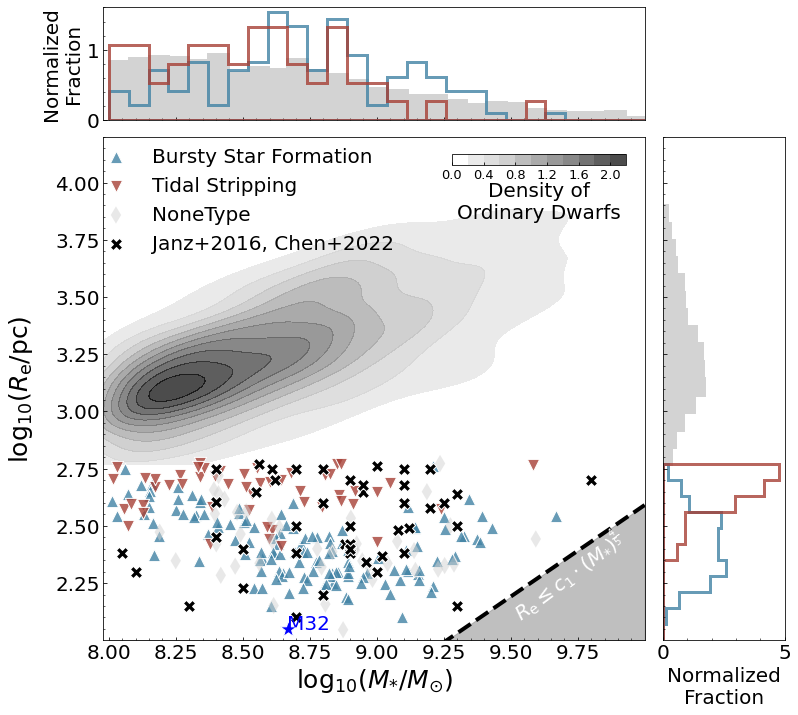

In [3]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)
ND = (223/255,224/255,217/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

import pandas as pd

# Load the CSV data
CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

filter_condition_TS = (np.array(CSSs3['Form_Type']) == 'Tidal Stripping') & (np.array(CSSs3['TS_strength'] >= 0.6))
filter_condition_BSF = (np.array(CSSs3['Form_Type']) == 'Bursty Star Formation') & (np.array(CSSs3['BSF_strength'] > 0.6)) & (np.array(CSSs3['TS_strength'] < 0.6))
filter_condition_None = ((np.array(CSSs3['Form_Type']) == 'Bursty Star Formation') | (np.array(CSSs3['Form_Type']) == 'Tidal Stripping')) & (np.array(CSSs3['BSF_strength'] <= 0.6)) & (np.array(CSSs3['TS_strength'] < 0.6))
filter_condition_TSBSF = (np.array(CSSs3['Form_Type']) == 'TS+BSF')

Re_iso_ND =np.array(Normal_Dwarf['Re'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Re_iso_ND1 =np.array(Normal_Dwarf['Re'])[np.where((np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

Re_BSF = np.concatenate((np.array(CSSs3['Re'])[filter_condition_BSF],np.array(CSSs3['BSF_strength'])[np.array(CSSs3['ID']) == 436946], 
                                  np.array(CSSs3['BSF_strength'])[np.array(CSSs3['ID']) == 275692]),axis=0)
Re_TS = np.concatenate((np.array(CSSs3['Re'])[filter_condition_TS],np.array(CSSs3['BSF_strength'])[np.array(CSSs3['ID']) == 410046], 
                                  np.array(CSSs3['BSF_strength'])[np.array(CSSs3['ID']) == 220728]),axis=0)

Re_None = np.array(CSSs3['Re'])[filter_condition_None]

Star_iso_ND = np.array(Normal_Dwarf['Star mass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Star_iso_ND1 = np.array(Normal_Dwarf['Star mass'])[np.where( (np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

Star_BSF = np.concatenate((np.array(CSSs3['Star mass'])[filter_condition_BSF],np.array(CSSs3['BSF_strength'])[np.array(CSSs3['ID']) == 436946], 
                                  np.array(CSSs3['BSF_strength'])[np.array(CSSs3['ID']) == 275692]),axis=0)
Star_TS = np.concatenate((np.array(CSSs3['Star mass'])[filter_condition_TS],np.array(CSSs3['BSF_strength'])[np.array(CSSs3['ID']) == 410046], 
                                  np.array(CSSs3['BSF_strength'])[np.array(CSSs3['ID']) == 220728]),axis=0)
Star_None = np.array(CSSs3['Star mass'])[filter_condition_None]

Re_CSSs = np.array(CSSs3['Re'])[np.where((np.log10(CSSs3['Star mass'])<10))]
Star_CSSs = np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Star mass'])<10))]

# plt.figure(figsize=(10,7))
# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 7))
fig = plt.figure(figsize=(11, 10))
plt.subplots_adjust(left=0.12, bottom=0.10, right=0.98, top=0.98, wspace=0.15, hspace=0.07)
grid = plt.GridSpec(5, 5, hspace=0.15, wspace=0.15)
plt.rcParams['xtick.direction'] = 'in'#将x周的刻度线方向设置向内
plt.rcParams['ytick.direction'] = 'in'#将y轴的刻度方向设置向内


# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
ax_top = fig.add_subplot(grid[0,:-1], xticklabels=[])

# 创建一个与 ax_top 共享 x 轴的新轴
# ax_top2 = ax_top.twinx()

# # 将 ax_top（原始的左轴）移动到右边
# ax_top.yaxis.tick_right()
# ax_top.yaxis.set_label_position("right")

# # 将 ax_top2（通常是右轴）移动到左边
# ax_top2.yaxis.tick_left()
# ax_top2.yaxis.set_label_position("left")

# ax_top = fig.add_subplot(grid[0, 0:6], xticklabels=[])

# ax_top.tick_params(axis='y', which='both', labelsize=20)
# ax_top2.set_yticks([0, 10, 20, 30, 40, 50])
# ax_top2.set_yticklabels([0, 10, 20, 30, 40, 50], fontsize=20)
# ax_top.set_yticks([0, 50, 100, 150])
# ax_top.set_yticklabels([0, 50, 100, 150], fontsize=20, color='lightgrey')

ax_top.tick_params(axis='both', which='both', labelsize=20)

# ax_top2.set_ylabel('Counts', fontsize=25)
# ax_top.set_xticks([])
# ax_top.set_yticks([])
# ax_main = fig.add_subplot(grid[1:5,0:6])

# weights = np.ones_like(Star_iso_ND1) * 0.25
ax_top.hist(np.log10(Star_iso_ND1), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor='lightgrey', facecolor='lightgrey', zorder=1, density=True)
# ax_top2.hist(np.log10(Star_iso_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', linestyle='--', edgecolor='black', facecolor='none', zorder=2)
ax_top.hist(np.log10(Star_BSF), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=grp, facecolor='none', zorder=2, density=True)
ax_top.hist(np.log10(Star_TS), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=cl, facecolor='none', zorder=2, density=True)
ax_top.minorticks_on()
# ax_top2.minorticks_on()
ax_top.set_xlim(8-0.02,10-1e-5) 
ax_top.set_ylabel('Normalized\nFraction', fontsize=20)
# ax_top2.set_xlim(8-0.02,10) 

# sns.kdeplot(data=np.log10(Star_grp_CSSs), ax=ax_top,color=grp, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_cl_CSSs), ax=ax_top, color=cl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_fl_CSSs), ax=ax_top, color=fl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_iso_CSSs), ax=ax_top, color='black', linestyle='--', linewidth=1)

# ax_right2 = ax_right.twiny()

# ax_right.set_xticks([20, 40, 60, 80])
# ax_right.set_xticklabels([20, 40, 60, 80], fontsize=20)
# ax_right2.set_xticks([0, 100, 200, 300])
# ax_right2.set_xticklabels([0, 100, 200, 300], fontsize=20, color='lightgrey')
# ax_right.set_xlabel('Counts', fontsize=25)
ax_right.tick_params(axis='both', which='both', labelsize=20)
# ax_right.set_xlabel('Counts', fontsize=25)

# weights = np.ones_like(Re_iso_ND1) * 0.25
ax_right.hist(np.log10(Re_iso_ND1), bins = np.linspace(2.77,3.9,16), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='lightgrey', facecolor='lightgrey',density=True)
ax_right.hist(np.log10(Re_BSF), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, facecolor='none',density=True)
ax_right.hist(np.log10(Re_TS), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, facecolor='none',density=True)
# ax_right.hist(np.log10(Re_iso_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='--', 
#                                                                 edgecolor='black', facecolor='none')
ax_right.minorticks_on()
# ax_right2.minorticks_on()
ax_right.set_ylim(2+1e-5,4.2) 
ax_right.set_xlabel('Normalized\nFraction', fontsize=20)
# ax_right2.set_ylim(2+1e-5,4.2) 

# ax_top.set_xscale('log') 
# ax_top.set_yscale('log')

# 从CSSs3中提取数据
x = np.log10(Star_iso_ND)
y = np.log10(Re_iso_ND)

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.1, x.max()+0.2, 100)
yi = np.linspace(y.min()-0.01, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')


# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=10, colors=colors, alpha=0.7)


ax_main.scatter(np.log10(Star_BSF), np.log10(Re_BSF), s=150, label='Bursty Star Formation', marker='^', edgecolor='white', color=grp)
ax_main.scatter(np.log10(Star_TS), np.log10(Re_TS), s=150, label='Tidal Stripping', marker='v', edgecolor='white', color=cl)
ax_main.scatter(np.log10(Star_None), np.log10(Re_None), s=150, label='NoneType', marker='d', edgecolor='None', color='lightgrey', alpha=0.5)
# ax_main.scatter(np.log10(Star_iso_CSSs), np.log10(Re_iso_CSSs), s=20, label='CSSs(isolated,cen)', marker='o', edgecolor='white', color='black')

ax_main.scatter(8.67,2.05, s=300, marker='*', edgecolor='white', color='blue')

ax_main.annotate('M32', xy=(0.378, 0.033), xycoords='axes fraction', fontsize=20, color='blue', ha="center", va="center")

AIMSSIII_x = [7.8, 8.8, 8.5, 9.0, 8.96, 9.02, 9.3, 8.7, 8.88, 8.9, 8.9, 8.9, 8.9, 9.1, 9.08, 9.12, 9.1, 9.3]

AIMSSIII_y = [2.3, 2.2, 2.4, 2.3, 2.34, 2.37, 2.15, 2.5, 2.42, 2.38, 2.42, 2.4, 2.5, 2.38, 2.48, 2.49, 2.6, 2.64]

ax_main.scatter(AIMSSIII_x, AIMSSIII_y, s=150, marker='X', edgecolor='white', color='black')

Chen_x = [8.3, 8.5, 8.1, 8.05, 8.4, 8.7, 8.4, 8.4, 8.55, 8.56, 8.62, 8.61, 8.7, 8.8, 8.7, 8.8, 9.0, 9.1, 8.9, 8.95, 8.95, 9.1, 9.2, 9.25, 9.2, 9.3, 9.8]

Chen_y = [2.15, 2.23, 2.3, 2.38, 2.45, 2.38, 2.606, 2.75, 2.65, 2.77, 2.7, 2.75, 2.1, 2.6, 2.75, 2.75, 2.76, 2.75, 2.7, 2.65, 2.68, 2.68, 2.58, 2.6, 2.75, 2.5, 2.7]

ax_main.scatter(Chen_x, Chen_y, s=150, label='Janz+2016, Chen+2022', marker='X', edgecolor='white', color='black')

# 给定的公式参数
c1 = 2.24e-6

# 创建一个对数空间的x值数组，范围从8到10，因为主图的x轴范围是8-10
x = np.linspace(8, 10, 400)

# 计算y值，因为我们在对数坐标中工作，所以要使用对数变换
y = c1 * (2*10**x)**(4/5)

# 转换为对数尺度
log_x = x
log_y = np.log10(y)

# 绘制线条
ax_main.plot(log_x, log_y, linestyle='--', color='black', linewidth=4)

# Calculate the angle of the regression line
angle = np.arctan(0.75) * (180 / np.pi)
# Display the equation of the regression line rotated along the line
equation = r'$R_{\mathrm{e}} \leq c_1 \cdot (M_{*})^{\frac{4}{5}}$'
ax_main.annotate(equation, xy=(0.86, 0.13), xycoords='axes fraction', fontsize=20, color='white', rotation=angle, ha="center", va="center")

# 填充线下方区域为深灰色
ax_main.fill_between(log_x, 2, log_y, color='grey', alpha=0.5)

# ax_main.scatter(np.log10(Star_iso_ND), np.log10(Re_iso_ND), s=5, label='Dwarf(field)', marker='o', alpha=0.3, edgecolor='white', color='grey')

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_iso_ND1.min()), np.log10(Star_iso_ND1.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_CSSs.min()), np.log10(Star_CSSs.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# ax_main.set_xscale('log') 
# ax_main.set_yscale('log')
ax_main.set_xlim(8-0.02,10-1e-5) 
# ax_main.set_xticks([8.0, 8.5, 9.0, 9.5, 10.0])
ax_main.set_ylim(2+1e-5,4.2) 
ax_main.tick_params(axis='x', which='both', labelsize=20)
ax_main.tick_params(axis='y', which='both', labelsize=20)
ax_main.minorticks_on()
ax_main.set_xlabel(r'$\mathrm{log}_{10}(M_{*}/M_{\odot})$',fontsize=25)
ax_main.set_ylabel(r'$\mathrm{log}_{10}(R_{\mathrm{e}}/\mathrm{pc})$',fontsize=25,labelpad=20)
# plt.xlim(0,4)
ax_main.legend(frameon=False,bbox_to_anchor=(0.57,1.015),fontsize=20)

# 添加colorbar
cax = fig.add_axes([0.56, 0.76, 0.22, 0.015])  # 调整colorbar的位置和大小
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
cbar.set_label('Density of\nOrdinary Dwarfs', fontsize=20)
cbar.ax.tick_params(labelsize=13)
# cbar.set_ticks([])
cbar.ax.xaxis.set_label_coords(0.5, -1.5)  # Increase the y-coordinate value (-1.2 in this example)
plt.savefig('/home/bianyuan/workspace/pic/mass-Size_1'+'.pdf')
# plt.savefig('/home/bianyuan/workspace/pic/mass-Z-Size'+'.pdf')

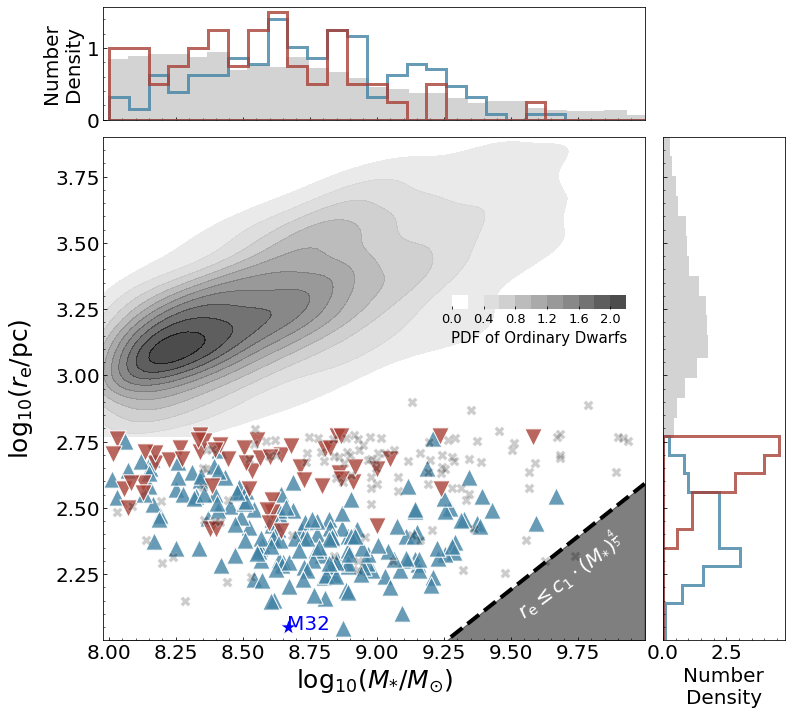

In [6]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)
ND = (223/255,224/255,217/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

filter_condition_TS = (np.array(CSSs3['Form_Type']) == 'Tidal Stripping')
filter_condition_BSF = (np.array(CSSs3['Form_Type']) == 'Bursty Star Formation')

Re_iso_ND =np.array(Normal_Dwarf['Re'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Re_iso_ND1 =np.array(Normal_Dwarf['Re'])[np.where((np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

Re_BSF = np.array(CSSs3['Re'])[filter_condition_BSF]
Re_TS = np.array(CSSs3['Re'])[filter_condition_TS]

Star_iso_ND = np.array(Normal_Dwarf['Star mass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Star_iso_ND1 = np.array(Normal_Dwarf['Star mass'])[np.where( (np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

Star_BSF = np.array(CSSs3['Star mass'])[filter_condition_BSF]
Star_TS = np.array(CSSs3['Star mass'])[filter_condition_TS]

Re_CSSs = np.array(CSSs3['Re'])[np.where((np.log10(CSSs3['Star mass'])<10))]
Star_CSSs = np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Star mass'])<10))]

# plt.figure(figsize=(10,7))
# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 7))
fig = plt.figure(figsize=(11, 10))
plt.subplots_adjust(left=0.12, bottom=0.10, right=0.98, top=0.98, wspace=0.15, hspace=0.07)
grid = plt.GridSpec(5, 5, hspace=0.15, wspace=0.15)
plt.rcParams['xtick.direction'] = 'in'#将x周的刻度线方向设置向内
plt.rcParams['ytick.direction'] = 'in'#将y轴的刻度方向设置向内


# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
ax_top = fig.add_subplot(grid[0,:-1], xticklabels=[])

# 创建一个与 ax_top 共享 x 轴的新轴
# ax_top2 = ax_top.twinx()

# # 将 ax_top（原始的左轴）移动到右边
# ax_top.yaxis.tick_right()
# ax_top.yaxis.set_label_position("right")

# # 将 ax_top2（通常是右轴）移动到左边
# ax_top2.yaxis.tick_left()
# ax_top2.yaxis.set_label_position("left")

# ax_top = fig.add_subplot(grid[0, 0:6], xticklabels=[])

# ax_top.tick_params(axis='y', which='both', labelsize=20)
# ax_top2.set_yticks([0, 10, 20, 30, 40, 50])
# ax_top2.set_yticklabels([0, 10, 20, 30, 40, 50], fontsize=20)
# ax_top.set_yticks([0, 50, 100, 150])
# ax_top.set_yticklabels([0, 50, 100, 150], fontsize=20, color='lightgrey')

ax_top.tick_params(axis='both', which='both', labelsize=20)

# ax_top2.set_ylabel('Counts', fontsize=25)
# ax_top.set_xticks([])
# ax_top.set_yticks([])
# ax_main = fig.add_subplot(grid[1:5,0:6])

# weights = np.ones_like(Star_iso_ND1) * 0.25
ax_top.hist(np.log10(Star_iso_ND1), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor='lightgrey', facecolor='lightgrey', zorder=1, density=True)
# ax_top2.hist(np.log10(Star_iso_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', linestyle='--', edgecolor='black', facecolor='none', zorder=2)
ax_top.hist(np.log10(Star_BSF), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=grp, facecolor='none', zorder=2, density=True)
ax_top.hist(np.log10(Star_TS), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=cl, facecolor='none', zorder=2, density=True)
ax_top.minorticks_on()
# ax_top2.minorticks_on()
ax_top.set_xlim(8-0.02,10-1e-5) 
ax_top.set_ylabel('Number\nDensity', fontsize=20)
# ax_top2.set_xlim(8-0.02,10) 

# sns.kdeplot(data=np.log10(Star_grp_CSSs), ax=ax_top,color=grp, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_cl_CSSs), ax=ax_top, color=cl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_fl_CSSs), ax=ax_top, color=fl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_iso_CSSs), ax=ax_top, color='black', linestyle='--', linewidth=1)

# ax_right2 = ax_right.twiny()

# ax_right.set_xticks([20, 40, 60, 80])
# ax_right.set_xticklabels([20, 40, 60, 80], fontsize=20)
# ax_right2.set_xticks([0, 100, 200, 300])
# ax_right2.set_xticklabels([0, 100, 200, 300], fontsize=20, color='lightgrey')
# ax_right.set_xlabel('Counts', fontsize=25)
ax_right.tick_params(axis='both', which='both', labelsize=20)
# ax_right.set_xlabel('Counts', fontsize=25)

# weights = np.ones_like(Re_iso_ND1) * 0.25
ax_right.hist(np.log10(Re_iso_ND1), bins = np.linspace(2.77,3.9,16), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='lightgrey', facecolor='lightgrey',density=True)
ax_right.hist(np.log10(Re_BSF), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, facecolor='none',density=True)
ax_right.hist(np.log10(Re_TS), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, facecolor='none',density=True)
# ax_right.hist(np.log10(Re_iso_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='--', 
#                                                                 edgecolor='black', facecolor='none')
ax_right.minorticks_on()
# ax_right2.minorticks_on()
ax_right.set_ylim(2+1e-5,3.9) 
ax_right.set_xlabel('Number\nDensity', fontsize=20)
# ax_right2.set_ylim(2+1e-5,4.2) 

# ax_top.set_xscale('log') 
# ax_top.set_yscale('log')

# 从CSSs3中提取数据
x = np.log10(Star_iso_ND)
y = np.log10(Re_iso_ND)

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.1, x.max()+0.2, 100)
yi = np.linspace(y.min()-0.01, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')


# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=10, colors=colors, alpha=0.7)


ax_main.scatter(np.log10(Star_BSF), np.log10(Re_BSF), s=300, label='CSSs Driven by Bursty Star Formation', marker='^', edgecolor='white', color=grp)
ax_main.scatter(np.log10(Star_TS), np.log10(Re_TS), s=300, label='CSSs Dominated by Tidal Stripping', marker='v', edgecolor='white', color=cl)
# ax_main.scatter(np.log10(Star_iso_CSSs), np.log10(Re_iso_CSSs), s=20, label='CSSs(isolated,cen)', marker='o', edgecolor='white', color='black')

ax_main.scatter(8.67,2.05, s=300, marker='*', edgecolor='white', color='blue')

ax_main.annotate('M32', xy=(0.378, 0.033), xycoords='axes fraction', fontsize=20, color='blue', ha="center", va="center")

data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/mass_size/Guerou2015.txt', delim_whitespace=True)

data_txt_Janz = pd.read_csv('/home/bianyuan/workspace/data/observations/mass_size/Janz2016.txt', delim_whitespace=True)

data_txt_Ferre = pd.read_csv('/home/bianyuan/workspace/data/observations/mass_size/Ferre2018.txt', delim_whitespace=True)

data_txt_Chen = pd.read_csv('/home/bianyuan/workspace/data/observations/mass_size/Chen2022.txt', delim_whitespace=True)

ax_main.scatter(np.log10(data_txt_guerou['Mstar(1e9Msun)'] * 1e9)-0.3, np.log10(data_txt_guerou['Re(pc)']), alpha=0.2, marker='X', color='black', edgecolor='white', s=100)

ax_main.scatter(data_txt_Janz['logMstar(Msun)']-0.3, np.log10(data_txt_Janz['Re(pc)']), alpha=0.2, marker='X', color='black', edgecolor='white', s=100)

ax_main.scatter(data_txt_Ferre['logMstar(Msun)']-0.3, np.log10(data_txt_Ferre['Re(pc)']), alpha=0.2, marker='X', color='black', edgecolor='white', s=100)

ax_main.scatter(data_txt_Chen['logMstar(Msun)']-0.3, np.log10(data_txt_Chen['Re(pc)']), alpha=0.2, marker='X', color='black', edgecolor='white', s=100)

# AIMSSIII_x = [7.8, 8.8, 8.5, 9.0, 8.96, 9.02, 9.3, 8.7, 8.88, 8.9, 8.9, 8.9, 8.9, 9.1, 9.08, 9.12, 9.1, 9.3]

# AIMSSIII_y = [2.3, 2.2, 2.4, 2.3, 2.34, 2.37, 2.15, 2.5, 2.42, 2.38, 2.42, 2.4, 2.5, 2.38, 2.48, 2.49, 2.6, 2.64]

# ax_main.scatter(AIMSSIII_x, AIMSSIII_y, s=150, marker='X', edgecolor='white', color='black', alpha=0.2)

# Chen_x = [8.3, 8.5, 8.1, 8.05, 8.4, 8.7, 8.4, 8.4, 8.55, 8.56, 8.62, 8.61, 8.7, 8.8, 8.7, 8.8, 9.0, 9.1, 8.9, 8.95, 8.95, 9.1, 9.2, 9.25, 9.2, 9.3, 9.8]

# Chen_y = [2.15, 2.23, 2.3, 2.38, 2.45, 2.38, 2.606, 2.75, 2.65, 2.77, 2.7, 2.75, 2.1, 2.6, 2.75, 2.75, 2.76, 2.75, 2.7, 2.65, 2.68, 2.68, 2.58, 2.6, 2.75, 2.5, 2.7]

# ax_main.scatter(Chen_x, Chen_y, s=150, label='Observed CSSs', marker='X', edgecolor='white', color='black', alpha=0.2)

# Gurou_x = [np.log10(4.5*1e8), np.log10(9.6*1e9), np.log10(1.4*1e8), np.log10(5.5*1e8), np.log10(1.1*1e10), np.log10(7*1e8), np.log10(4.5*1e9)]

# print(Gurou_x)

# Gurou_y = [5.6, 6.34, 5.17, 2.09, 2.64, 8.06, 9.13]

# ax_main.scatter(Gurou_x, Gurou_y, s=150, label='Observed CSSs', marker='X', edgecolor='white', color='black', alpha=0.2)

# 给定的公式参数
c1 = 2.24e-6

# 创建一个对数空间的x值数组，范围从8到10，因为主图的x轴范围是8-10
x = np.linspace(8, 10, 400)

# 计算y值，因为我们在对数坐标中工作，所以要使用对数变换
y = c1 * (2*10**x)**(4/5)

# 转换为对数尺度
log_x = x
log_y = np.log10(y)

# 绘制线条
ax_main.plot(log_x, log_y, linestyle='--', color='black', linewidth=4)

# Calculate the angle of the regression line
angle = np.arctan(0.75) * (180 / np.pi)
# Display the equation of the regression line rotated along the line
equation = r'$r_{\mathrm{e}} \leq c_1 \cdot (M_{*})^{\frac{4}{5}}$'
ax_main.annotate(equation, xy=(0.86, 0.13), xycoords='axes fraction', fontsize=20, color='white', rotation=angle, ha="center", va="center")

# 填充线下方区域为深灰色
ax_main.fill_between(log_x, 2, log_y, color='black', alpha=0.5)

# ax_main.scatter(np.log10(Star_iso_ND), np.log10(Re_iso_ND), s=5, label='Dwarf(field)', marker='o', alpha=0.3, edgecolor='white', color='grey')

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_iso_ND1.min()), np.log10(Star_iso_ND1.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_CSSs.min()), np.log10(Star_CSSs.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# ax_main.set_xscale('log') 
# ax_main.set_yscale('log')
ax_main.set_xlim(8-0.02,10-1e-5) 
# ax_main.set_xticks([8.0, 8.5, 9.0, 9.5, 10.0])
ax_main.set_ylim(2+1e-5,3.9) 
ax_main.tick_params(axis='x', which='both', labelsize=20)
ax_main.tick_params(axis='y', which='both', labelsize=20)
ax_main.minorticks_on()
ax_main.set_xlabel(r'$\mathrm{log}_{10}(M_{*}/M_{\odot})$',fontsize=25)
ax_main.set_ylabel(r'$\mathrm{log}_{10}(r_{\mathrm{e}}/\mathrm{pc})$',fontsize=25,labelpad=20)
# plt.xlim(0,4)
# ax_main.legend(fontsize=20)
# ax_main.legend(frameon=False,bbox_to_anchor=(0.57,1.015),fontsize=20)

# 添加colorbar
cax = fig.add_axes([0.56, 0.56, 0.22, 0.02])  # 调整colorbar的位置和大小
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
cbar.set_label('PDF of Ordinary Dwarfs', fontsize=15)
cbar.ax.tick_params(labelsize=13)
cbar.outline.set_edgecolor('none')  # 设置 colorbar 外框线颜色为 'none'
cbar.outline.set_linewidth(0)  # 设置 colorbar 外框线宽度为 0
# cbar.set_ticks([])
cbar.ax.xaxis.set_label_coords(0.5, -1.5)  # Increase the y-coordinate value (-1.2 in this example)
plt.savefig('/home/bianyuan/workspace/pic/mass-Size_1'+'.pdf')
# plt.savefig('/home/bianyuan/workspace/pic/mass-Z-Size'+'.pdf')

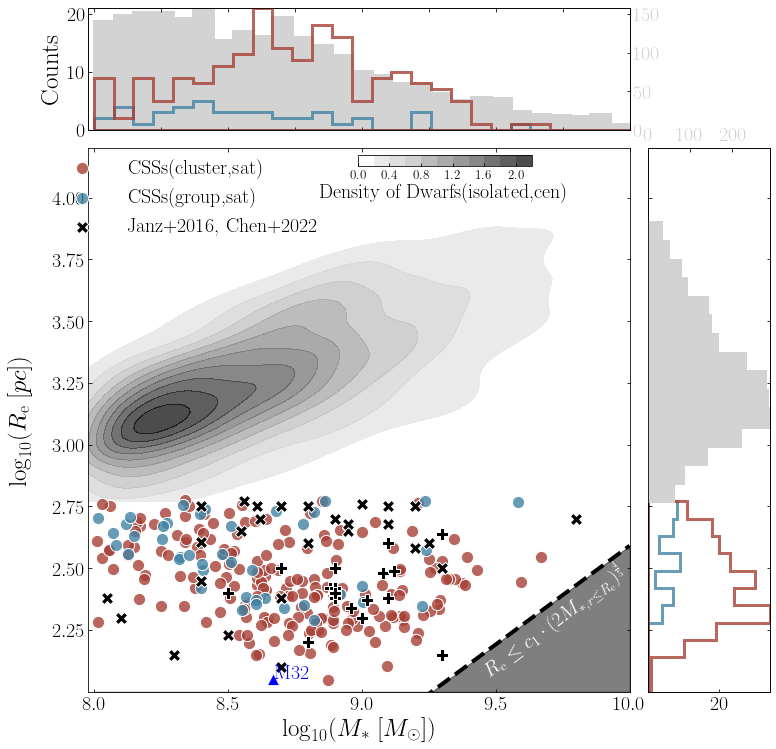

In [12]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)
ND = (223/255,224/255,217/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

import pandas as pd

# Load the CSV data
CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

# # Define the boundaries for the "d" region
# x_min, x_max = 0, 3.4
# y_min, y_max = 0.085, 0.61

# # Filter out points from the "d" region
# mask_d = ~((13.8 - CSSs3["MWted-Age"] >= x_min) & (13.8 - CSSs3["MWted-Age"] <= x_max) & (CSSs3["[Z/H]_r"] >= y_min) & (CSSs3["[Z/H]_r"] <= y_max))
# CSSs3 = CSSs3[mask_d]

# Re_fl_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Re_grp_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & ((13.8-CSSs3['MWted-Age']) >= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1))]
Re_cl_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & ((13.8-CSSs3['MWted-Age']) >= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1))]
# Re_iso_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
Re_iso_ND =np.array(Normal_Dwarf['Re'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Re_iso_ND1 =np.array(Normal_Dwarf['Re'])[np.where((np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

# Star_fl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Star_grp_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & ((13.8-CSSs3['MWted-Age']) >= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1))]
# Star_grp_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 12) & (np.log10(CSSs3['Groupmass']) <= 13))]
Star_cl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & ((13.8-CSSs3['MWted-Age']) >= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1))]
# Star_cl_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 13))]
# Star_iso_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
Star_iso_ND = np.array(Normal_Dwarf['Star mass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Star_iso_ND1 = np.array(Normal_Dwarf['Star mass'])[np.where( (np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]


Re_CSSs = np.array(CSSs3['Re'])[np.where((np.log10(CSSs3['Star mass'])<10) & ((13.8-CSSs3['MWted-Age']) >= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1))]
Star_CSSs = np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Star mass'])<10) & ((13.8-CSSs3['MWted-Age']) >= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1))]

# plt.figure(figsize=(10,7))
# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 7))
fig = plt.figure(figsize=(11, 10))
plt.subplots_adjust(left=0.12, bottom=0.03, right=0.98, top=0.98, wspace=0.15, hspace=0.07)
grid = plt.GridSpec(5, 5, hspace=0.15, wspace=0.15)
plt.rcParams['xtick.direction'] = 'in'#将x周的刻度线方向设置向内
plt.rcParams['ytick.direction'] = 'in'#将y轴的刻度方向设置向内


# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
ax_top = fig.add_subplot(grid[0,:-1], xticklabels=[])

# 创建一个与 ax_top 共享 x 轴的新轴
ax_top2 = ax_top.twinx()

# 将 ax_top（原始的左轴）移动到右边
ax_top.yaxis.tick_right()
ax_top.yaxis.set_label_position("right")

# 将 ax_top2（通常是右轴）移动到左边
ax_top2.yaxis.tick_left()
ax_top2.yaxis.set_label_position("left")

# ax_top = fig.add_subplot(grid[0, 0:6], xticklabels=[])

# ax_top.tick_params(axis='y', which='both', labelsize=20)
ax_top2.set_yticks([0, 10, 20, 30, 40, 50])
ax_top2.set_yticklabels([0, 10, 20, 30, 40, 50], fontsize=20)
ax_top.set_yticks([0, 50, 100, 150])
ax_top.set_yticklabels([0, 50, 100, 150], fontsize=20, color='lightgrey')

ax_top2.set_ylabel('Counts', fontsize=25)
# ax_top.set_xticks([])
# ax_top.set_yticks([])
# ax_main = fig.add_subplot(grid[1:5,0:6])

# weights = np.ones_like(Star_iso_ND1) * 0.25
ax_top.hist(np.log10(Star_iso_ND1), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor='lightgrey', facecolor='lightgrey', zorder=1)
# ax_top2.hist(np.log10(Star_iso_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', linestyle='--', edgecolor='black', facecolor='none', zorder=2)
ax_top2.hist(np.log10(Star_grp_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=grp, facecolor='none', zorder=2)
ax_top2.hist(np.log10(Star_cl_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=cl, facecolor='none', zorder=2)
# ax_top2.hist(np.log10(Star_fl_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=fl, facecolor='none', zorder=2)

ax_top.set_xlim(8-0.02,10) 
ax_top2.set_xlim(8-0.02,10) 

# sns.kdeplot(data=np.log10(Star_grp_CSSs), ax=ax_top,color=grp, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_cl_CSSs), ax=ax_top, color=cl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_fl_CSSs), ax=ax_top, color=fl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_iso_CSSs), ax=ax_top, color='black', linestyle='--', linewidth=1)

ax_right2 = ax_right.twiny()

ax_right.set_xticks([20, 40, 60, 80])
ax_right.set_xticklabels([20, 40, 60, 80], fontsize=20)
ax_right2.set_xticks([0, 100, 200, 300])
ax_right2.set_xticklabels([0, 100, 200, 300], fontsize=20, color='lightgrey')
# ax_right.set_xlabel('Counts', fontsize=25)

# weights = np.ones_like(Re_iso_ND1) * 0.25
ax_right2.hist(np.log10(Re_iso_ND1), bins = np.linspace(2.77,3.9,16), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='lightgrey', facecolor='lightgrey')
ax_right.hist(np.log10(Re_grp_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, facecolor='none')
ax_right.hist(np.log10(Re_cl_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, facecolor='none')
# ax_right.hist(np.log10(Re_fl_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='-', 
#                                                                 edgecolor=fl, facecolor='none')
# ax_right.hist(np.log10(Re_iso_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='--', 
#                                                                 edgecolor='black', facecolor='none')

ax_right.set_ylim(2+1e-5,3.9) 
ax_right2.set_ylim(2+1e-5,3.9) 

# ax_top.set_xscale('log') 
# ax_top.set_yscale('log')

# 从CSSs3中提取数据
x = np.log10(Star_iso_ND)
y = np.log10(Re_iso_ND)

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.1, x.max()+0.2, 100)
yi = np.linspace(y.min()-0.01, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')


# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=10, colors=colors, alpha=0.7)


ax_main.scatter(np.log10(Star_cl_CSSs), np.log10(Re_cl_CSSs), s=150, label='CSSs(cluster,sat)', marker='o', edgecolor='white', color=cl)
ax_main.scatter(np.log10(Star_grp_CSSs), np.log10(Re_grp_CSSs), s=150, label='CSSs(group,sat)', marker='o', edgecolor='white', color=grp)
# ax_main.scatter(np.log10(Star_fl_CSSs), np.log10(Re_fl_CSSs), s=150, label='CSSs(field,sat)', marker='o', edgecolor='white', color=fl)
# ax_main.scatter(np.log10(Star_iso_CSSs), np.log10(Re_iso_CSSs), s=20, label='CSSs(isolated,cen)', marker='o', edgecolor='white', color='black')

ax_main.scatter(8.67,2.05, s=150, marker='^', edgecolor='white', color='blue')

ax_main.annotate('M32', xy=(0.378, 0.033), xycoords='axes fraction', fontsize=20, color='blue', ha="center", va="center")

AIMSSIII_x = [7.8, 8.8, 8.5, 9.0, 8.96, 9.02, 9.3, 8.7, 8.88, 8.9, 8.9, 8.9, 8.9, 9.1, 9.08, 9.12, 9.1, 9.3]

AIMSSIII_y = [2.3, 2.2, 2.4, 2.3, 2.34, 2.37, 2.15, 2.5, 2.42, 2.38, 2.42, 2.4, 2.5, 2.38, 2.48, 2.49, 2.6, 2.64]

ax_main.scatter(AIMSSIII_x, AIMSSIII_y, s=150, marker='P', edgecolor='white', color='black')

Chen_x = [8.3, 8.5, 8.1, 8.05, 8.4, 8.7, 8.4, 8.4, 8.55, 8.56, 8.62, 8.61, 8.7, 8.8, 8.7, 8.8, 9.0, 9.1, 8.9, 8.95, 8.95, 9.1, 9.2, 9.25, 9.2, 9.3, 9.8]

Chen_y = [2.15, 2.23, 2.3, 2.38, 2.45, 2.38, 2.606, 2.75, 2.65, 2.77, 2.7, 2.75, 2.1, 2.6, 2.75, 2.75, 2.76, 2.75, 2.7, 2.65, 2.68, 2.68, 2.58, 2.6, 2.75, 2.5, 2.7]

ax_main.scatter(Chen_x, Chen_y, s=150, label='Janz+2016, Chen+2022', marker='X', edgecolor='white', color='black')

# 给定的公式参数
c1 = 2.24e-6

# 创建一个对数空间的x值数组，范围从8到10，因为主图的x轴范围是8-10
x = np.linspace(8, 10, 400)

# 计算y值，因为我们在对数坐标中工作，所以要使用对数变换
y = c1 * (2*10**x)**(4/5)

# 转换为对数尺度
log_x = x
log_y = np.log10(y)

# 绘制线条
ax_main.plot(log_x, log_y, linestyle='--', color='black', linewidth=4)

# Calculate the angle of the regression line
angle = np.arctan(0.75) * (180 / np.pi)
# Display the equation of the regression line rotated along the line
equation = r'$R_{\mathrm{e}} \leq c_1 \cdot (2M_{*,r\leq R_{\mathrm{e}}})^{\frac{4}{5}}$'
ax_main.annotate(equation, xy=(0.86, 0.13), xycoords='axes fraction', fontsize=20, color='white', rotation=angle, ha="center", va="center")

# 填充线下方区域为深灰色
ax_main.fill_between(log_x, 2, log_y, color='black', alpha=0.5)

# ax_main.scatter(np.log10(Star_iso_ND), np.log10(Re_iso_ND), s=5, label='Dwarf(field)', marker='o', alpha=0.3, edgecolor='white', color='grey')

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_iso_ND1.min()), np.log10(Star_iso_ND1.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_CSSs.min()), np.log10(Star_CSSs.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# ax_main.set_xscale('log') 
# ax_main.set_yscale('log')
ax_main.set_xlim(8-0.02,10) 
ax_main.set_xticks([8.0, 8.5, 9.0, 9.5, 10.0])
ax_main.set_ylim(2+1e-5,4.2) 
ax_main.tick_params(axis='x', which='both', labelsize=20)
ax_main.tick_params(axis='y', which='both', labelsize=20)
 
ax_main.set_xlabel(r'$\mathrm{log}_{10}(M_{*}\ [M_{\odot}])$',fontsize=25)
ax_main.set_ylabel(r'$\mathrm{log}_{10}(R_{\mathrm{e}}\ [pc])$',fontsize=25,labelpad=20)
# plt.xlim(0,4)
ax_main.legend(frameon=False,bbox_to_anchor=(0.46,1.015),fontsize=20)

# 添加colorbar
cax = fig.add_axes([0.46, 0.76, 0.22, 0.015])  # 调整colorbar的位置和大小
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
cbar.set_label('Density of Dwarfs(isolated,cen)', fontsize=20)
cbar.ax.tick_params(labelsize=13)
# cbar.set_ticks([])
cbar.ax.xaxis.set_label_coords(0.5, -1.5)  # Increase the y-coordinate value (-1.2 in this example)
plt.savefig('/home/bianyuan/workspace/pic/mass-Size_NA'+'.pdf')
# plt.savefig('/home/bianyuan/workspace/pic/mass-Z-Size'+'.pdf')

In [ ]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)
ND = (223/255,224/255,217/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

import pandas as pd

# Load the CSV data
CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

# # Define the boundaries for the "d" region
# x_min, x_max = 0, 3.4
# y_min, y_max = 0.085, 0.61

# # Filter out points from the "d" region
# mask_d = ~((13.8 - CSSs3["MWted-Age"] >= x_min) & (13.8 - CSSs3["MWted-Age"] <= x_max) & (CSSs3["[Z/H]_r"] >= y_min) & (CSSs3["[Z/H]_r"] <= y_max))
# CSSs3 = CSSs3[mask_d]

Re_fl_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Re_grp_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
Re_cl_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
Re_iso_CSSs = np.array(CSSs3['Re'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
Re_iso_ND =np.array(Normal_Dwarf['Re'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Re_iso_ND1 =np.array(Normal_Dwarf['Re'])[np.where((np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

Star_fl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Star_grp_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
# Star_grp_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 12) & (np.log10(CSSs3['Groupmass']) <= 13))]
Star_cl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
# Star_cl_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 13))]
Star_iso_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
Star_iso_ND = np.array(Normal_Dwarf['Star mass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Star_iso_ND1 = np.array(Normal_Dwarf['Star mass'])[np.where( (np.log10(Normal_Dwarf['Star mass']) <= 10) & (np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]


Re_CSSs = np.array(CSSs3['Re'])[np.where((np.log10(CSSs3['Star mass'])<10))]
Star_CSSs = np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Star mass'])<10))]

# plt.figure(figsize=(10,7))
# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 7))
fig = plt.figure(figsize=(11, 10))
plt.subplots_adjust(left=0.12, bottom=0.03, right=0.98, top=0.98, wspace=0.15, hspace=0.07)
grid = plt.GridSpec(5, 5, hspace=0.15, wspace=0.15)
plt.rcParams['xtick.direction'] = 'in'#将x周的刻度线方向设置向内
plt.rcParams['ytick.direction'] = 'in'#将y轴的刻度方向设置向内


# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
ax_top = fig.add_subplot(grid[0,:-1], xticklabels=[])

# 创建一个与 ax_top 共享 x 轴的新轴
ax_top2 = ax_top.twinx()

# 将 ax_top（原始的左轴）移动到右边
ax_top.yaxis.tick_right()
ax_top.yaxis.set_label_position("right")

# 将 ax_top2（通常是右轴）移动到左边
ax_top2.yaxis.tick_left()
ax_top2.yaxis.set_label_position("left")

# ax_top = fig.add_subplot(grid[0, 0:6], xticklabels=[])

# ax_top.tick_params(axis='y', which='both', labelsize=20)
ax_top2.set_yticks([0, 10, 20, 30, 40, 50])
ax_top2.set_yticklabels([0, 10, 20, 30, 40, 50], fontsize=20)
ax_top.set_yticks([0, 50, 100, 150])
ax_top.set_yticklabels([0, 50, 100, 150], fontsize=20, color='lightgrey')

ax_top2.set_ylabel('Counts', fontsize=25)
# ax_top.set_xticks([])
# ax_top.set_yticks([])
# ax_main = fig.add_subplot(grid[1:5,0:6])

# weights = np.ones_like(Star_iso_ND1) * 0.25
ax_top.hist(np.log10(Star_iso_ND1), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor='lightgrey', facecolor='lightgrey', zorder=1)
ax_top2.hist(np.log10(Star_iso_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', linestyle='--', edgecolor='black', facecolor='none', zorder=2)
ax_top2.hist(np.log10(Star_grp_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=grp, facecolor='none', zorder=2)
ax_top2.hist(np.log10(Star_cl_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=cl, facecolor='none', zorder=2)
ax_top2.hist(np.log10(Star_fl_CSSs), bins = np.linspace(8,10,28), linewidth=3, histtype='stepfilled', orientation='vertical', edgecolor=fl, facecolor='none', zorder=2)

ax_top.set_xlim(8-0.02,10) 
ax_top2.set_xlim(8-0.02,10) 

# sns.kdeplot(data=np.log10(Star_grp_CSSs), ax=ax_top,color=grp, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_cl_CSSs), ax=ax_top, color=cl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_fl_CSSs), ax=ax_top, color=fl, linestyle='-', linewidth=2)
# sns.kdeplot(data=np.log10(Star_iso_CSSs), ax=ax_top, color='black', linestyle='--', linewidth=1)

ax_right2 = ax_right.twiny()

ax_right.set_xticks([20, 40, 60, 80])
ax_right.set_xticklabels([20, 40, 60, 80], fontsize=20)
ax_right2.set_xticks([0, 100, 200, 300])
ax_right2.set_xticklabels([0, 100, 200, 300], fontsize=20, color='lightgrey')
# ax_right.set_xlabel('Counts', fontsize=25)

# weights = np.ones_like(Re_iso_ND1) * 0.25
ax_right2.hist(np.log10(Re_iso_ND1), bins = np.linspace(2.77,3.9,16), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='lightgrey', facecolor='lightgrey')
ax_right.hist(np.log10(Re_grp_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, facecolor='none')
ax_right.hist(np.log10(Re_cl_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, facecolor='none')
ax_right.hist(np.log10(Re_fl_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='-', 
                                                                edgecolor=fl, facecolor='none')
ax_right.hist(np.log10(Re_iso_CSSs), bins = np.linspace(2+1e-5,2.77,12), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='--', 
                                                                edgecolor='black', facecolor='none')

ax_right.set_ylim(2+1e-5,4.2) 
ax_right2.set_ylim(2+1e-5,4.2) 

# ax_top.set_xscale('log') 
# ax_top.set_yscale('log')

# 从CSSs3中提取数据
x = np.log10(Star_iso_ND)
y = np.log10(Re_iso_ND)

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.1, x.max()+0.2, 100)
yi = np.linspace(y.min()-0.01, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')


# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=10, colors=colors, alpha=0.7)


ax_main.scatter(np.log10(Star_cl_CSSs), np.log10(Re_cl_CSSs), s=150, label='CSSs(cluster,sat)', marker='o', edgecolor='white', color=cl)
ax_main.scatter(np.log10(Star_grp_CSSs), np.log10(Re_grp_CSSs), s=150, label='CSSs(group,sat)', marker='o', edgecolor='white', color=grp)
ax_main.scatter(np.log10(Star_fl_CSSs), np.log10(Re_fl_CSSs), s=150, label='CSSs(field,sat)', marker='o', edgecolor='white', color=fl)
ax_main.scatter(np.log10(Star_iso_CSSs), np.log10(Re_iso_CSSs), s=20, label='CSSs(isolated,cen)', marker='o', edgecolor='white', color='black')

ax_main.scatter(8.67,2.05, s=150, marker='^', edgecolor='white', color='blue')

ax_main.annotate('M32', xy=(0.378, 0.033), xycoords='axes fraction', fontsize=20, color='blue', ha="center", va="center")

AIMSSIII_x = [7.8, 8.8, 8.5, 9.0, 8.96, 9.02, 9.3, 8.7, 8.88, 8.9, 8.9, 8.9, 8.9, 9.1, 9.08, 9.12, 9.1, 9.3]

AIMSSIII_y = [2.3, 2.2, 2.4, 2.3, 2.34, 2.37, 2.15, 2.5, 2.42, 2.38, 2.42, 2.4, 2.5, 2.38, 2.48, 2.49, 2.6, 2.64]

ax_main.scatter(AIMSSIII_x, AIMSSIII_y, s=150, label='Janz+2016', marker='P', edgecolor='white', color='red')

Chen_x = [8.3, 8.5, 8.1, 8.05, 8.4, 8.7, 8.4, 8.4, 8.55, 8.56, 8.62, 8.61, 8.7, 8.8, 8.7, 8.8, 9.0, 9.1, 8.9, 8.95, 8.95, 9.1, 9.2, 9.25, 9.2, 9.3, 9.8]

Chen_y = [2.15, 2.23, 2.3, 2.38, 2.45, 2.38, 2.606, 2.75, 2.65, 2.77, 2.7, 2.75, 2.1, 2.6, 2.75, 2.75, 2.76, 2.75, 2.7, 2.65, 2.68, 2.68, 2.58, 2.6, 2.75, 2.5, 2.7]

ax_main.scatter(Chen_x, Chen_y, s=150, label='Chen+2022', marker='X', edgecolor='white', color='orange')

# 给定的公式参数
c1 = 2.24e-6

# 创建一个对数空间的x值数组，范围从8到10，因为主图的x轴范围是8-10
x = np.linspace(8, 10, 400)

# 计算y值，因为我们在对数坐标中工作，所以要使用对数变换
y = c1 * (2*10**x)**(4/5)

# 转换为对数尺度
log_x = x
log_y = np.log10(y)

# 绘制线条
ax_main.plot(log_x, log_y, linestyle='--', color='black', linewidth=4)

# Calculate the angle of the regression line
angle = np.arctan(0.75) * (180 / np.pi)
# Display the equation of the regression line rotated along the line
equation = r'$R_{\mathrm{e}} \leq c_1 \cdot (2M_{*,r\leq R_{\mathrm{e}}})^{\frac{4}{5}}$'
ax_main.annotate(equation, xy=(0.86, 0.13), xycoords='axes fraction', fontsize=20, color='white', rotation=angle, ha="center", va="center")

# 填充线下方区域为深灰色
ax_main.fill_between(log_x, 2, log_y, color='black', alpha=0.5)

# ax_main.scatter(np.log10(Star_iso_ND), np.log10(Re_iso_ND), s=5, label='Dwarf(field)', marker='o', alpha=0.3, edgecolor='white', color='grey')

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_iso_ND1.min()), np.log10(Star_iso_ND1.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_iso_ND1), np.log10(Re_iso_ND1), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# # Define the bin edges for Group_cl_CSSs
# bin_edges = np.linspace(np.log10(Star_CSSs.min()), np.log10(Star_CSSs.max()), num=6)

# # Compute the mean and standard deviation for each bin
# mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='mean', bins=bin_edges)
# std_vals, _, _ = binned_statistic(np.log10(Star_CSSs), np.log10(Re_CSSs), statistic='std', bins=bin_edges)

# # Compute the bin centers
# bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# # Plot the data with error bars
# ax_main.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.8)

# ax_main.set_xscale('log') 
# ax_main.set_yscale('log')
ax_main.set_xlim(8-0.02,10) 
ax_main.set_xticks([8.0, 8.5, 9.0, 9.5, 10.0])
ax_main.set_ylim(2+1e-5,4.2) 
ax_main.tick_params(axis='x', which='both', labelsize=20)
ax_main.tick_params(axis='y', which='both', labelsize=20)
 
# ax_main.set_xlabel(r'$\mathrm{log}_{10}(M_{*}\ [M_{\odot}])$',fontsize=25)
ax_main.set_ylabel(r'$\mathrm{log}_{10}(R_{\mathrm{e}}\ [pc])$',fontsize=25,labelpad=20)
# plt.xlim(0,4)
ax_main.legend(frameon=False,bbox_to_anchor=(0.46,1.015),fontsize=20)

# 添加colorbar
cax = fig.add_axes([0.46, 0.76, 0.22, 0.015])  # 调整colorbar的位置和大小
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
cbar.set_label('Density of Dwarfs(isolated,cen)', fontsize=20)
cbar.ax.tick_params(labelsize=13)
# cbar.set_ticks([])
cbar.ax.xaxis.set_label_coords(0.5, -1.5)  # Increase the y-coordinate value (-1.2 in this example)
plt.savefig('/home/bianyuan/workspace/pic/mass-Size_1'+'.pdf')

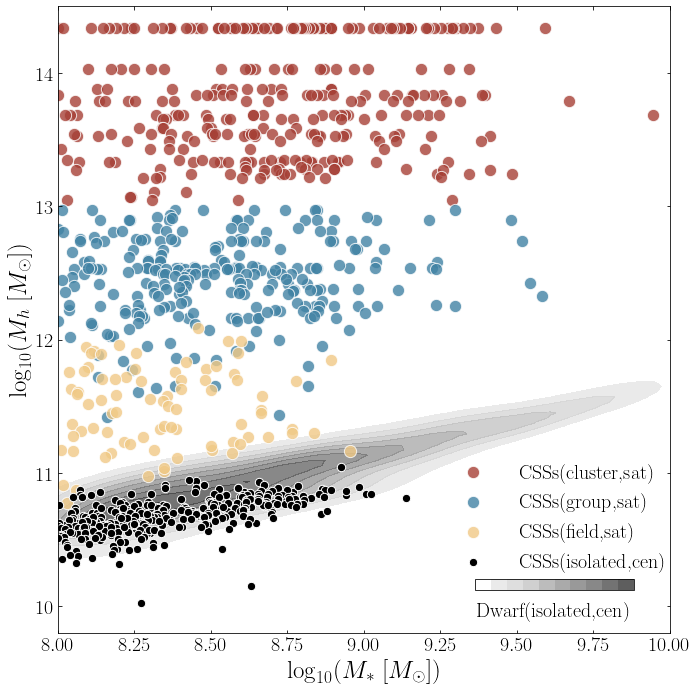

In [91]:
import seaborn as sns
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)
'''color'''
grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

Star_fl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Star_grp_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
# Star_grp_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 12) & (np.log10(CSSs3['Groupmass']) <= 13))]
Star_cl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
# Star_cl_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 13))]
Star_iso_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
Star_iso_ND = np.array(Normal_Dwarf['Star mass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

# Group_grp_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.log10(np.array(CSSs3['Number']))<1) & (np.array(CSSs3['Distance_grpvir']) > 0))]
Group_fl_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Group_grp_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
# Group_grp_cen_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 12) & (np.log10(CSSs3['Groupmass']) <= 13))]
Group_cl_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
# Group_cl_cen_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 13))]
Group_iso_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
Group_iso_ND = np.array(Normal_Dwarf['Groupmass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

# print(len(Group_grp_cen_CSSs),len(Group_cl_cen_CSSs))

fig = plt.figure(figsize=(10, 10))
plt.subplots_adjust(left=0.10, bottom=0.08, right=0.95, top=0.95, wspace=0.15, hspace=0.07)
ax = fig.add_subplot(111)

# 从CSSs3中提取数据
x = np.log10(Star_iso_ND)
y = np.log10(Group_iso_ND)

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.1, x.max()+0.2, 100)
yi = np.linspace(y.min()-0.01, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')


# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = plt.contourf(xi, yi, zi, levels=10, colors=colors, alpha=0.7)
plt.scatter(np.log10(Star_cl_CSSs), np.log10(Group_cl_CSSs), s=150, label='CSSs(cluster,sat)', marker='o', edgecolor='white', color=cl, alpha=0.8)
# plt.scatter(np.log10(Star_cl_cen_CSSs), np.log10(Group_cl_cen_CSSs), s=70, label='CSSs(cluster,w/o)', marker='o', edgecolor='white', color='red')
plt.scatter(np.log10(Star_grp_CSSs), np.log10(Group_grp_CSSs), s=150, label='CSSs(group,sat)', marker='o', edgecolor='white', color=grp, alpha=0.8)
# plt.scatter(np.log10(Star_grp_cen_CSSs), np.log10(Group_grp_cen_CSSs), s=70, label='CSSs(group,w/o)', marker='o', edgecolor='white', color='blue')
plt.scatter(np.log10(Star_fl_CSSs), np.log10(Group_fl_CSSs), s=150, label='CSSs(field,sat)', marker='o', edgecolor='white', color=fl, alpha=0.8)
plt.scatter(np.log10(Star_iso_CSSs), np.log10(Group_iso_CSSs), s=70, label='CSSs(isolated,cen)', marker='o', edgecolor='white', color='black')

# plt.xscale('log') 
# plt.yscale('log')
plt.xlim(8,10)
plt.ylim(9.8,14.5) 
plt.tick_params(axis='x', which='both', labelsize=20)
plt.tick_params(axis='y', which='both', labelsize=20)
 

plt.xlabel(r'$\mathrm{log}_{10}(M_{*}\ [M_{\odot}])$',fontsize=25)
plt.ylabel(r'$\mathrm{log}_{10}(M_{h}\ [M_{\odot}])$',fontsize=25)
# plt.xlabel('$M_{*}\ [M_{\odot}]$',fontsize=20)
# plt.ylabel('$M_{h}\ [M_{\odot}]$',fontsize=20)
plt.rcParams['legend.fontsize'] = 20
# plt.xlim(0,4)
plt.legend(frameon=False,bbox_to_anchor=(0.6,0.3))

# 添加colorbar
cax = fig.add_axes([0.68, 0.14, 0.22, 0.015])  # 调整colorbar的位置和大小
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
cbar.set_label('Dwarf(isolated,cen)', fontsize=20)
cbar.set_ticks([])
cbar.ax.xaxis.set_label_coords(0.5, -1.1)  # Increase the y-coordinate value (-1.2 in this example)

plt.savefig('/home/bianyuan/workspace/pic/m-mh'+'.pdf')

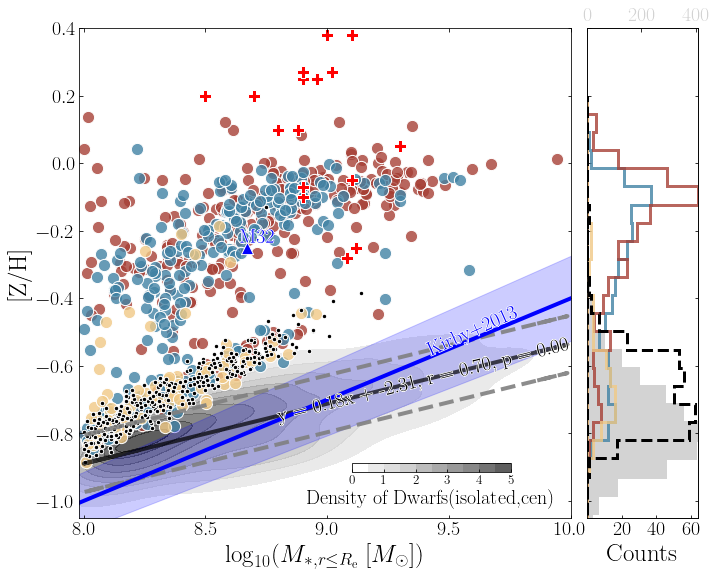

In [4]:
import seaborn as sns
from scipy.stats import linregress
from matplotlib import patheffects as path_effects
import pandas as pd

# Load the CSV data
CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

dex = 0.55

# # Define the boundaries for the "d" region
# x_min, x_max = 0, 3.4
# y_min, y_max = 0.085, 0.61

# # Filter out points from the "d" region
# mask_d = ~((13.8 - CSSs3["MWted-Age"] >= x_min) & (13.8 - CSSs3["MWted-Age"] <= x_max) & (CSSs3["[Z/H]_r"] >= y_min) & (CSSs3["[Z/H]_r"] <= y_max))
# CSSs3 = CSSs3[mask_d]

Star_fl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Star_grp_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
# Star_grp_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 12) & (np.log10(CSSs3['Groupmass']) <= 13))]
Star_cl_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
# Star_cl_cen_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 13))]
Star_iso_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
Star_iso_ND = np.array(Normal_Dwarf['Star mass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

Z_fl_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))] - dex
# Z_grp_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.log10(np.array(CSSs3['Number']))<1) & (np.array(CSSs3['Distance_grpvir']) > 0))]
Z_grp_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))] - dex
# Z_subgrp_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) < 12.2))]
# Z_cl_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.log10(np.array(CSSs3['Number']))>1) & (np.array(CSSs3['Distance_grpvir']) > 0))]
Z_cl_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))] - dex
Z_iso_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))] - dex
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
# Group_iso_ND = np.array(Normal_Dwarf['Groupmass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Z_iso_ND =np.array(Normal_Dwarf['[Z/H]'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))] - dex

fig = plt.figure(figsize=(10, 8))
plt.subplots_adjust(left=0.12, bottom=0.10, right=0.98, top=0.95, wspace=0.15, hspace=0.07)
grid = plt.GridSpec(5, 5, hspace=0, wspace=0.15)
# ax_right = fig.add_subplot(grid[0, 0:6], xticklabels=[], yticklabels=[])
ax_right = fig.add_subplot(grid[0:5, -1], yticklabels=[])
ax_right2 = ax_right.twiny()

# 将 ax_top（原始的左轴）移动到右边
ax_right.xaxis.tick_top()
ax_right.xaxis.set_label_position("top")

# 将 ax_top2（通常是右轴）移动到左边
ax_right2.xaxis.tick_bottom()
ax_right2.xaxis.set_label_position("bottom")

ax_right.set_xticks([0, 200, 400])
ax_right.set_xticklabels([0, 200, 400], fontsize=20, color='lightgrey')

ax_right2.set_xticks([20, 40, 60])
ax_right2.set_xticklabels([20, 40, 60], fontsize=20)
ax_right2.set_xlabel('Counts', fontsize=25)

ax_right.set_ylim(-0.5-dex,0.95-dex) 
ax_main = fig.add_subplot(grid[0:5,0:4])

ax_right2.hist(Z_grp_CSSs, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, facecolor='none')
ax_right2.hist(Z_cl_CSSs, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, facecolor='none')
ax_right2.hist(Z_fl_CSSs, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='-', 
                                                                edgecolor=fl, facecolor='none')
ax_right2.hist(Z_iso_CSSs, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='--', 
                                                                edgecolor='black', facecolor='none')

ax_right.hist(Z_iso_ND, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='lightgrey', facecolor='lightgrey')

ax_right2.set_ylim(-0.5-dex,0.95-dex) 

# sns.kdeplot(data=Z_grp_CSSs, ax=ax_right,color=grp, linestyle='-', linewidth=2, vertical=True)
# sns.kdeplot(data=Z_cl_CSSs, ax=ax_right, color=cl, linestyle='-', linewidth=2, vertical=True)
# sns.kdeplot(data=Z_fl_CSSs, ax=ax_right, color=fl, linestyle='-', linewidth=2, vertical=True)
# sns.kdeplot(data=Z_iso_CSSs, ax=ax_right, color='black', linestyle='--', linewidth=1, vertical=True)

ax_right.set_ylim(-0.5-dex,0.95-dex)  # 设置水平方向的坐标轴范围
# ax_right.invert_xaxis()  # 反转水平方向的坐标轴

# ax_right.set_yticks([])  # 隐藏y轴刻度

# 从CSSs3中提取数据
x = np.log10(Star_iso_ND)
y = Z_iso_ND

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.1, x.max()+0.2, 100)
yi = np.linspace(y.min()-0.01, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=10, colors=colors, alpha=0.7)

ax_main.scatter(np.log10(Star_cl_CSSs), Z_cl_CSSs, s=150, label='CSSs(cluster,sat)', marker='o', edgecolor='white', color=cl)
ax_main.scatter(np.log10(Star_grp_CSSs), Z_grp_CSSs, s=150, label='CSSs(group,sat)', marker='o', edgecolor='white', color=grp)
ax_main.scatter(np.log10(Star_fl_CSSs), Z_fl_CSSs, s=150, label='CSSs(field,sat)', marker='o', edgecolor='white', color=fl)
ax_main.scatter(np.log10(Star_iso_CSSs), Z_iso_CSSs, s=20, label='CSSs(isolated,cen)', marker='o', edgecolor='white', color='black')

ax_main.scatter(8.67,-0.25, s=150, marker='^', edgecolor='white', color='blue')

# ax_main.annotate('M32', xy=(0.388, 0.208), xycoords='axes fraction', fontsize=20, color='blue', ha="center", va="center")
text = ax_main.annotate('M32', xy=(8.67, -0.25), xytext=(10, 10), textcoords='offset points', 
                 fontsize=20, color='blue', ha="center", va="center")

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

AIMSSIII_x = [7.8, 8.8, 8.5, 9.0, 8.96, 9.02, 9.3, 8.7, 8.88, 8.9, 8.9, 8.9, 8.9, 9.1, 9.08, 9.12, 9.1, 9.3]

# AIMSSIII_x = [8.1, 9.1, 8.8, 9.3, 9.26, 9.32, 9.6, 9.0, 9.18, 9.2, 9.2, 9.2, 9.2, 9.4, 9.38, 9.42, 9.4, 9.6]

AIMSSIII_y = [0.2, 0.1, 0.2, 0.38, 0.25, 0.27, 0.05, 0.2, 0.1, -0.1, -0.07, 0.25, 0.27, -0.05, -0.28, -0.25, 0.38, 0.05]

ax_main.scatter(AIMSSIII_x, AIMSSIII_y, s=150, label='Janz+2016', marker='X', edgecolor='white', color='red')

x = np.log10(Star_iso_ND)
y = Z_iso_ND

# 执行线性回归
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Calculate the angle of the regression line
angle = np.arctan(0.25) * (180 / np.pi)

# 计算预测值
predicted_values = slope * x + intercept

# 计算残差
residuals = Z_iso_ND - predicted_values

# 计算1σ偏差
deviation = np.std(residuals)

# point_on_line = (9,slope * np.median(x) + intercept)

# print(point_on_line)

# 绘制散点图和拟合直线
ax_main.plot(x, predicted_values, linestyle='-', linewidth=4, color='black',alpha=0.7)

# 绘制误差直线
ax_main.plot(x, predicted_values-deviation, linestyle='--', linewidth=4, color='grey',alpha=0.9)
ax_main.plot(x, predicted_values+deviation, linestyle='--', linewidth=4, color='grey',alpha=0.9)

# Display the equation of the regression line rotated along the line
equation = f"y = {slope:.2f}x + {intercept:.2f}, r = {r_value:.2f}, p = {p_value:.2f}"
text = ax_main.annotate(equation, xy=(0.7,0.28), xycoords='axes fraction', fontsize=20, rotation=angle, ha="center", va="center")

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# # Given points
# point1 = (8, -0.6)
# point2 = (10, -0.35)

# # Extracting the coordinates for use in equation calculations
# x_coords = [point1[0], point2[0]]
# y_coords = [point1[1], point2[1]]

# # Calculate the coefficients. This line is in the format of y = mx + b
# m, b = np.polyfit(x_coords, y_coords, 1)

# # Generate a range of x values from the smallest x to the largest x
# x_range = np.linspace(min(x_coords), max(x_coords), 100)

# # Calculate the y values based on the slope and intercept
# y_range = m * x_range + b

# ax_main.plot(x_range, y_range, 'b-', linewidth=4, alpha=0.7)  # Plot the line

# ax_main.annotate('Paudel+2011', xy=(0.88, 0.12), xycoords='axes fraction', fontsize=20, rotation=np.arctan(0.18) * (180 / np.pi), ha="center", va="center")

# Given linear relationship parameters and errors
slope = 0.30
intercept = -1.69
slope_error = 0.02
intercept_error = 0.04

# Choose a range of stellar masses (in log scale)
log_mass_range = np.linspace(8-0.2, 10, 400)  # considering from 10^6 to 10^11 solar masses

# Calculate y values (metallicity) using the slope and intercept
z_h_values = slope * (log_mass_range + 0.3 - 6) + intercept

# Calculate y values for upper and lower error bounds
z_h_upper = (slope + slope_error) * (log_mass_range + 0.3 - 6) + (intercept + intercept_error)
z_h_lower = (slope - slope_error) * (log_mass_range + 0.3 - 6) + (intercept - intercept_error)


ax_main.plot(log_mass_range, z_h_values, 'b-', linewidth=4)

angle = np.arctan(0.45) * (180 / np.pi)

text = ax_main.annotate('Kirby+2013', xy=(0.8,0.38), xycoords='axes fraction', color='blue', fontsize=20, rotation=angle, ha="center", va="center")

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])
ax_main.fill_between(log_mass_range, z_h_lower, z_h_upper, color='blue', alpha=0.2)  # Fill in the error range

# # Given points
# point1 = (8, -0.2)
# point2 = (10, 0.15)

# # Extracting the coordinates for use in equation calculations
# x_coords = [point1[0], point2[0]]
# y_coords = [point1[1], point2[1]]

# # Calculate the coefficients. This line is in the format of y = mx + b
# m, b = np.polyfit(x_coords, y_coords, 1)

# # Generate a range of x values from the smallest x to the largest x
# x_range = np.linspace(min(x_coords), max(x_coords), 100)

# # Calculate the y values based on the slope and intercept
# y_range = m * x_range + b

# ax_main.plot(x_range, y_range, linestyle='-', color='purple', linewidth=4, alpha=0.4)  # Plot the line

# ax_main.annotate('McDermid+2015', xy=(0.85, 0.5), xycoords='axes fraction', fontsize=20, rotation=np.arctan(0.28) * (180 / np.pi), ha="center", va="center")

# plt.xscale('log') 
# plt.yscale('log')
# plt.xlim(1e8,1e10)
ax_main.set_xlim(8-0.02,10) 
ax_main.set_xticks([8.0, 8.5, 9.0, 9.5, 10.0])
ax_main.set_ylim(-0.5-dex,0.95-dex) 

ax_main.tick_params(axis='x', which='both', labelsize=20)
ax_main.tick_params(axis='y', which='both', labelsize=20)
 
ax_main.set_xlabel(r'$\mathrm{log}_{10}(M_{*,r\leq R_{\mathrm{e}}}\ [M_{\odot}])$',fontsize=25)
ax_main.set_ylabel('[Z/H]',fontsize=25)
# plt.rcParams['legend.fontsize'] = 20
# ax_main.legend(frameon=False,bbox_to_anchor=(0.50,0.28),fontsize=20)
# plt.xlim(0,4)
# plt.legend(frameon=False,loc='lower right')

# 添加colorbar
cax = fig.add_axes([0.5, 0.18, 0.22, 0.015])  # 调整colorbar的位置和大小
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
cbar.set_label('Density of Dwarfs(isolated,cen)', fontsize=20)
cbar.ax.tick_params(labelsize=13)
# cbar.set_ticks([])
cbar.ax.xaxis.set_label_coords(0.5, -2)  # Increase the y-coordinate value (-1.2 in this example)
# plt.xlabel(r'$\mathrm{log}_{10}(M_{*}\ [M_{\odot}])$',fontsize=20)
# plt.ylabel(r'$\mathrm{log}_{10}(M_{h}\ [M_{\odot}])$',fontsize=20)
plt.savefig('/home/bianyuan/workspace/pic/m-ZH'+'.pdf')

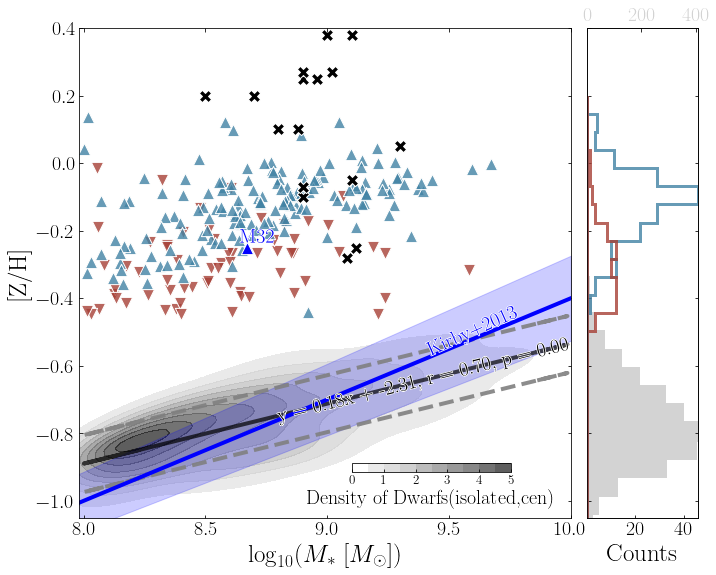

In [19]:
import seaborn as sns
from scipy.stats import linregress
from matplotlib import patheffects as path_effects
import pandas as pd

# Load the CSV data
CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

dex = 0.55

# # Define the boundaries for the "d" region
# x_min, x_max = 0, 3.4
# y_min, y_max = 0.085, 0.61

# # Filter out points from the "d" region
# mask_d = ~((13.8 - CSSs3["MWted-Age"] >= x_min) & (13.8 - CSSs3["MWted-Age"] <= x_max) & (CSSs3["[Z/H]_r"] >= y_min) & (CSSs3["[Z/H]_r"] <= y_max))
# CSSs3 = CSSs3[mask_d]

Star_BSF = np.array(CSSs3['Star mass'])[filter_condition_BSF]
Star_TS = np.array(CSSs3['Star mass'])[filter_condition_TS]
Star_iso_CSSs = np.array(CSSs3['Star mass'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
Star_iso_ND = np.array(Normal_Dwarf['Star mass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

Z_BSF = np.array(CSSs3['[Z/H]_r'])[filter_condition_BSF] - dex
Z_TS = np.array(CSSs3['[Z/H]_r'])[filter_condition_TS] - dex
Z_iso_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))] - dex
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
# Group_iso_ND = np.array(Normal_Dwarf['Groupmass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]
Z_iso_ND =np.array(Normal_Dwarf['[Z/H]'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))] - dex

fig = plt.figure(figsize=(10, 8))
plt.subplots_adjust(left=0.12, bottom=0.10, right=0.98, top=0.95, wspace=0.15, hspace=0.07)
grid = plt.GridSpec(5, 5, hspace=0, wspace=0.15)
# ax_right = fig.add_subplot(grid[0, 0:6], xticklabels=[], yticklabels=[])
ax_right = fig.add_subplot(grid[0:5, -1], yticklabels=[])
ax_right2 = ax_right.twiny()

# 将 ax_top（原始的左轴）移动到右边
ax_right.xaxis.tick_top()
ax_right.xaxis.set_label_position("top")

# 将 ax_top2（通常是右轴）移动到左边
ax_right2.xaxis.tick_bottom()
ax_right2.xaxis.set_label_position("bottom")

ax_right.set_xticks([0, 200, 400])
ax_right.set_xticklabels([0, 200, 400], fontsize=20, color='lightgrey')

ax_right2.set_xticks([20, 40, 60])
ax_right2.set_xticklabels([20, 40, 60], fontsize=20)
ax_right2.set_xlabel('Counts', fontsize=25)

ax_right.set_ylim(-0.5-dex,0.95-dex) 
ax_main = fig.add_subplot(grid[0:5,0:4])

ax_right2.hist(Z_BSF, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, facecolor='none')
ax_right2.hist(Z_TS, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, facecolor='none')
# ax_right2.hist(Z_iso_CSSs, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', linestyle='--', 
#                                                                 edgecolor='black', facecolor='none')

ax_right.hist(Z_iso_ND, bins = np.linspace(-0.7-dex,0.75-dex,28), linewidth=3, histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='lightgrey', facecolor='lightgrey')

ax_right2.set_ylim(-0.5-dex,0.95-dex) 

# sns.kdeplot(data=Z_grp_CSSs, ax=ax_right,color=grp, linestyle='-', linewidth=2, vertical=True)
# sns.kdeplot(data=Z_cl_CSSs, ax=ax_right, color=cl, linestyle='-', linewidth=2, vertical=True)
# sns.kdeplot(data=Z_fl_CSSs, ax=ax_right, color=fl, linestyle='-', linewidth=2, vertical=True)
# sns.kdeplot(data=Z_iso_CSSs, ax=ax_right, color='black', linestyle='--', linewidth=1, vertical=True)

ax_right.set_ylim(-0.5-dex,0.95-dex)  # 设置水平方向的坐标轴范围
# ax_right.invert_xaxis()  # 反转水平方向的坐标轴

# ax_right.set_yticks([])  # 隐藏y轴刻度

# 从CSSs3中提取数据
x = np.log10(Star_iso_ND)
y = Z_iso_ND

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.1, x.max()+0.2, 100)
yi = np.linspace(y.min()-0.01, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=10, colors=colors, alpha=0.7)

ax_main.scatter(np.log10(Star_TS), Z_TS, s=150, label='Tidal Stripping', marker='v', edgecolor='white', color=cl)
ax_main.scatter(np.log10(Star_BSF), Z_BSF, s=150, label='Bursty Star Formation', marker='^', edgecolor='white', color=grp)
# ax_main.scatter(np.log10(Star_fl_CSSs), Z_fl_CSSs, s=150, label='CSSs(field,sat)', marker='o', edgecolor='white', color=fl)
# ax_main.scatter(np.log10(Star_iso_CSSs), Z_iso_CSSs, s=20, label='CSSs(isolated,cen)', marker='o', edgecolor='white', color='black')

ax_main.scatter(8.67,-0.25, s=150, marker='^', edgecolor='white', color='blue')

# ax_main.annotate('M32', xy=(0.388, 0.208), xycoords='axes fraction', fontsize=20, color='blue', ha="center", va="center")
text = ax_main.annotate('M32', xy=(8.67, -0.25), xytext=(10, 10), textcoords='offset points', 
                 fontsize=20, color='blue', ha="center", va="center")

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

AIMSSIII_x = [7.8, 8.8, 8.5, 9.0, 8.96, 9.02, 9.3, 8.7, 8.88, 8.9, 8.9, 8.9, 8.9, 9.1, 9.08, 9.12, 9.1, 9.3]

# AIMSSIII_x = [8.1, 9.1, 8.8, 9.3, 9.26, 9.32, 9.6, 9.0, 9.18, 9.2, 9.2, 9.2, 9.2, 9.4, 9.38, 9.42, 9.4, 9.6]

AIMSSIII_y = [0.2, 0.1, 0.2, 0.38, 0.25, 0.27, 0.05, 0.2, 0.1, -0.1, -0.07, 0.25, 0.27, -0.05, -0.28, -0.25, 0.38, 0.05]

ax_main.scatter(AIMSSIII_x, AIMSSIII_y, s=150, label='Janz+2016', marker='X', edgecolor='white', color='black')

x = np.log10(Star_iso_ND)
y = Z_iso_ND

# 执行线性回归
slope, intercept, r_value, p_value, std_err = linregress(x, y)

# Calculate the angle of the regression line
angle = np.arctan(0.25) * (180 / np.pi)

# 计算预测值
predicted_values = slope * x + intercept

# 计算残差
residuals = Z_iso_ND - predicted_values

# 计算1σ偏差
deviation = np.std(residuals)

# point_on_line = (9,slope * np.median(x) + intercept)

# print(point_on_line)

# 绘制散点图和拟合直线
ax_main.plot(x, predicted_values, linestyle='-', linewidth=4, color='black',alpha=0.7)

# 绘制误差直线
ax_main.plot(x, predicted_values-deviation, linestyle='--', linewidth=4, color='grey',alpha=0.9)
ax_main.plot(x, predicted_values+deviation, linestyle='--', linewidth=4, color='grey',alpha=0.9)

# Display the equation of the regression line rotated along the line
equation = f"y = {slope:.2f}x + {intercept:.2f}, r = {r_value:.2f}, p = {p_value:.2f}"
text = ax_main.annotate(equation, xy=(0.7,0.28), xycoords='axes fraction', fontsize=20, rotation=angle, ha="center", va="center")

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# # Given points
# point1 = (8, -0.6)
# point2 = (10, -0.35)

# # Extracting the coordinates for use in equation calculations
# x_coords = [point1[0], point2[0]]
# y_coords = [point1[1], point2[1]]

# # Calculate the coefficients. This line is in the format of y = mx + b
# m, b = np.polyfit(x_coords, y_coords, 1)

# # Generate a range of x values from the smallest x to the largest x
# x_range = np.linspace(min(x_coords), max(x_coords), 100)

# # Calculate the y values based on the slope and intercept
# y_range = m * x_range + b

# ax_main.plot(x_range, y_range, 'b-', linewidth=4, alpha=0.7)  # Plot the line

# ax_main.annotate('Paudel+2011', xy=(0.88, 0.12), xycoords='axes fraction', fontsize=20, rotation=np.arctan(0.18) * (180 / np.pi), ha="center", va="center")

# Given linear relationship parameters and errors
slope = 0.30
intercept = -1.69
slope_error = 0.02
intercept_error = 0.04

# Choose a range of stellar masses (in log scale)
log_mass_range = np.linspace(8-0.2, 10, 400)  # considering from 10^6 to 10^11 solar masses

# Calculate y values (metallicity) using the slope and intercept
z_h_values = slope * (log_mass_range + 0.3 - 6) + intercept

# Calculate y values for upper and lower error bounds
z_h_upper = (slope + slope_error) * (log_mass_range + 0.3 - 6) + (intercept + intercept_error)
z_h_lower = (slope - slope_error) * (log_mass_range + 0.3 - 6) + (intercept - intercept_error)


ax_main.plot(log_mass_range, z_h_values, 'b-', linewidth=4)

angle = np.arctan(0.45) * (180 / np.pi)

text = ax_main.annotate('Kirby+2013', xy=(0.8,0.38), xycoords='axes fraction', color='blue', fontsize=20, rotation=angle, ha="center", va="center")

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])
ax_main.fill_between(log_mass_range, z_h_lower, z_h_upper, color='blue', alpha=0.2)  # Fill in the error range

# # Given points
# point1 = (8, -0.2)
# point2 = (10, 0.15)

# # Extracting the coordinates for use in equation calculations
# x_coords = [point1[0], point2[0]]
# y_coords = [point1[1], point2[1]]

# # Calculate the coefficients. This line is in the format of y = mx + b
# m, b = np.polyfit(x_coords, y_coords, 1)

# # Generate a range of x values from the smallest x to the largest x
# x_range = np.linspace(min(x_coords), max(x_coords), 100)

# # Calculate the y values based on the slope and intercept
# y_range = m * x_range + b

# ax_main.plot(x_range, y_range, linestyle='-', color='purple', linewidth=4, alpha=0.4)  # Plot the line

# ax_main.annotate('McDermid+2015', xy=(0.85, 0.5), xycoords='axes fraction', fontsize=20, rotation=np.arctan(0.28) * (180 / np.pi), ha="center", va="center")

# plt.xscale('log') 
# plt.yscale('log')
# plt.xlim(1e8,1e10)
ax_main.set_xlim(8-0.02,10) 
ax_main.set_xticks([8.0, 8.5, 9.0, 9.5, 10.0])
ax_main.set_ylim(-0.5-dex,0.95-dex) 

ax_main.tick_params(axis='x', which='both', labelsize=20)
ax_main.tick_params(axis='y', which='both', labelsize=20)
 
ax_main.set_xlabel(r'$\mathrm{log}_{10}(M_{*}\ [M_{\odot}])$',fontsize=25)
ax_main.set_ylabel('[Z/H]',fontsize=25)
# plt.rcParams['legend.fontsize'] = 20
# ax_main.legend(frameon=False,bbox_to_anchor=(0.50,0.28),fontsize=20)
# plt.xlim(0,4)
# plt.legend(frameon=False,loc='lower right')

# 添加colorbar
cax = fig.add_axes([0.5, 0.18, 0.22, 0.015])  # 调整colorbar的位置和大小
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
cbar.set_label('Density of Dwarfs(isolated,cen)', fontsize=20)
cbar.ax.tick_params(labelsize=13)
# cbar.set_ticks([])
cbar.ax.xaxis.set_label_coords(0.5, -2)  # Increase the y-coordinate value (-1.2 in this example)
# plt.xlabel(r'$\mathrm{log}_{10}(M_{*}\ [M_{\odot}])$',fontsize=20)
# plt.ylabel(r'$\mathrm{log}_{10}(M_{h}\ [M_{\odot}])$',fontsize=20)
plt.savefig('/home/bianyuan/workspace/pic/m-ZH_1'+'.pdf')

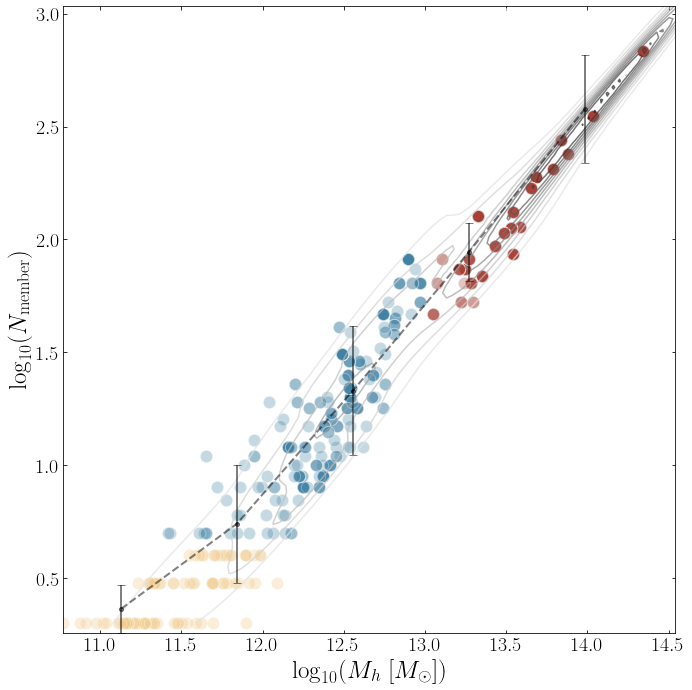

In [93]:
from scipy.stats import binned_statistic

# Group_grp_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.log10(np.array(CSSs3['Number']))<1) & (np.array(CSSs3['Distance_grpvir']) > 0))]
Group_fl_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Group_grp_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
# Group_grp_cen_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 12) & (np.log10(CSSs3['Groupmass']) <= 13))]
Group_cl_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
# Group_cl_cen_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) == 0) & (np.log10(CSSs3['Groupmass']) > 13))]
Group_iso_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
# Star_Normal_sat_Dwarf =np.array(Normal_Dwarf['Star mass'])[np.where(np.array(Normal_Dwarf['Number'])>1)]
Group_iso_ND = np.array(Normal_Dwarf['Groupmass'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

N_fl_CSSs = np.array(CSSs3['Number'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
N_grp_CSSs = np.array(CSSs3['Number'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
N_cl_CSSs = np.array(CSSs3['Number'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
N_iso_CSSs = np.array(CSSs3['Number'])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
N_iso_ND = np.array(Normal_Dwarf['Number'])[np.where((np.array(Normal_Dwarf['Number'])==1) & (np.array(Normal_Dwarf['Distance']) == 0))]

N_CSSs = np.array(CSSs3['Number'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0))]
Group_CSSs = np.array(CSSs3['Groupmass'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0))]

fig = plt.figure(figsize=(10, 10))
plt.subplots_adjust(left=0.10, bottom=0.08, right=0.95, top=0.95, wspace=0.15, hspace=0.07)
# 从CSSs3中提取数据
x = np.log10(Group_CSSs)
y = np.log10(N_CSSs)

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min(), x.max()+0.2, 100)
yi = np.linspace(y.min(), y.max()+0.2, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = plt.contour(xi, yi, zi, levels=10, colors=colors, alpha=0.7)

plt.scatter(np.log10(Group_cl_CSSs), np.log10(N_cl_CSSs), s=150, marker='o', edgecolor='white', color=cl, alpha=0.3)
plt.scatter(np.log10(Group_grp_CSSs), np.log10(N_grp_CSSs), s=150, marker='o', edgecolor='white', color=grp, alpha=0.3)
plt.scatter(np.log10(Group_fl_CSSs), np.log10(N_fl_CSSs), s=150, marker='o', edgecolor='white', color=fl, alpha=0.3)

# Define the bin edges for Group_cl_CSSs
bin_edges = np.linspace(np.log10(Group_CSSs.min()), np.log10(Group_CSSs.max()), num=6)

# Compute the mean and standard deviation for each bin
mean_vals, bin_edges, bin_numbers = binned_statistic(np.log10(Group_CSSs), np.log10(N_CSSs), statistic='mean', bins=bin_edges)
std_vals, _, _ = binned_statistic(np.log10(Group_CSSs), np.log10(N_CSSs), statistic='std', bins=bin_edges)

# Compute the bin centers
bin_centers = 0.5 * (bin_edges[1:] + bin_edges[:-1])

# Plot the data with error bars
plt.errorbar(bin_centers, mean_vals, yerr=std_vals, fmt='o', markersize=4, linestyle='--', capsize=4, linewidth=2, color='black',alpha=0.5)

# plt.xscale('log') 
# plt.yscale('log')
# plt.xlim(10.5,14.5)
# plt.ylim(1e-5,3)
plt.tick_params(axis='x', which='both', labelsize=20)
plt.tick_params(axis='y', which='both', labelsize=20)
 
plt.xlabel(r'$\mathrm{log}_{10}(M_{h}\ [M_{\odot}])$',fontsize=25)
plt.ylabel(r'$\mathrm{log}_{10}(N_{\mathrm{member}})$',fontsize=25)


# plt.scatter([],[], s=150, marker='o', edgecolor='white', color=cl, label='CSSs(cluster,sat)')
# plt.scatter([],[], s=150, marker='o', edgecolor='white', color=grp, label='CSSs(group,sat)')
# plt.scatter([],[], s=150, marker='o', edgecolor='white', color=fl, label='CSSs(field,sat)')
# plt.legend(frameon=False)
# plt.rcParams['legend.fontsize'] = 20

plt.savefig('/home/bianyuan/workspace/pic/mh-N'+'.pdf')

In [ ]:
fig = plt.figure(figsize=(10, 10))

plt.scatter(Group_cl_CSSs, N_cl_CSSs, s=100, label='CSSs(cluster)', marker='o', edgecolor='white', color=cl)
plt.scatter(Group_grp_CSSs, N_grp_CSSs, s=100, label='CSSs(group)', marker='o', edgecolor='white', color=grp)
plt.scatter(Group_iso_CSSs, N_iso_CSSs, s=10, label='CSSs(field)', marker='o', edgecolor='white', color='black')

plt.xscale('log') 
plt.yscale('log')
plt.xlim(pow(10,10.4),pow(10,14.1)) 
plt.ylim(pow(10,0.2),pow(10,2.6)) 
plt.tick_params(axis='x', which='both', labelsize=20)
plt.tick_params(axis='y', which='both', labelsize=20)
 
plt.xlabel('$M_{h}\ [M_{\odot}]$',fontsize=20)
plt.ylabel(r'$N_{\mathrm{member}}$',fontsize=20)
plt.savefig('/home/bianyuan/workspace/pic/mh-N'+'.pdf')

In [ ]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import illustris_python as il
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib
from matplotlib.patches import Rectangle
from scipy.stats import gaussian_kde
from matplotlib.patches import Ellipse
from matplotlib import patheffects as path_effects
from astroML.plotting import setup_text_plots
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'

setup_text_plots(usetex=True)

def truncate_colormap(cmap, minval=0.0, maxval=1.0, n=100):
    new_cmap = colors.LinearSegmentedColormap.from_list(
        "trunc({n},{a:.2f},{b:.2f})".format(n=cmap.name, a=minval, b=maxval),
        cmap(np.linspace(minval, maxval, n)),
    )
    return new_cmap

cmap = plt.get_cmap("CMRmap_r")
# cmap = plt.get_cmap("RdBu")
# cmap = plt.get_cmap("tab20b")
trunc_cmap = truncate_colormap(cmap, 0.1, 0.9)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf',data_home='/home/bianyuan/workspace/data',cache=True)

fig = plt.figure(figsize=(10, 10), dpi=160, facecolor='white')
plt.subplots_adjust(left=0.1, bottom=0.000001, right=0.95, top=0.95)
grid = plt.GridSpec(5, 4, hspace=0, wspace=0)



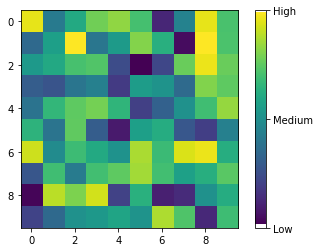

In [1]:
import numpy as np
import matplotlib.pyplot as plt

# 生成示例数据
data = np.random.rand(10, 10)

# 绘制热力图
plt.imshow(data, cmap='viridis')

# 创建colorbar
cbar = plt.colorbar()

# 设置colorbar的数值位置
cbar.set_ticks([0, 0.5, 1])  # 设置刻度位置
cbar.set_ticklabels(['Low', 'Medium', 'High'])  # 设置刻度标签

[Text(1, 0.0, 'Very Low'),
 Text(1, 0.2, 'Low'),
 Text(1, 0.5, 'Medium'),
 Text(1, 0.8, 'High'),
 Text(1, 1.0, 'Very High')]

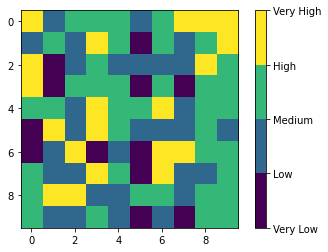

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.ticker as mticker

# 生成示例数据
data = np.random.rand(10, 10)

# 定义非均匀分布的边界值
bounds = [0, 0.2, 0.5, 0.8, 1]
values = ['Very Low','Low', 'Medium', 'High', 'Very High']

# 创建归一化器和颜色映射
norm = mcolors.BoundaryNorm(bounds, len(values) - 1)
cmap = plt.cm.get_cmap('viridis', len(values) - 1)

# 绘制热力图
plt.imshow(data, cmap=cmap, norm=norm)

# 创建colorbar
cbar = plt.colorbar(ticks=bounds, boundaries=bounds, format='%1.1f')

# 设置colorbar的刻度标签
cbar.ax.set_yticklabels(values)

/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/tmp/ipykernel_3359/2491854945.py:325: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "X" (-> marker='X'). The keyword argument will take precedence.
  ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
/tmp/ipykernel_3359/2491854945.py:334: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "X" (-> marker='X'). The keyword argument will take precedence.
  ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
/tmp/ipykernel_3359/2491854945.py:368: UserWarning: *c* argument looks like a single numeric RGB or RGBA s

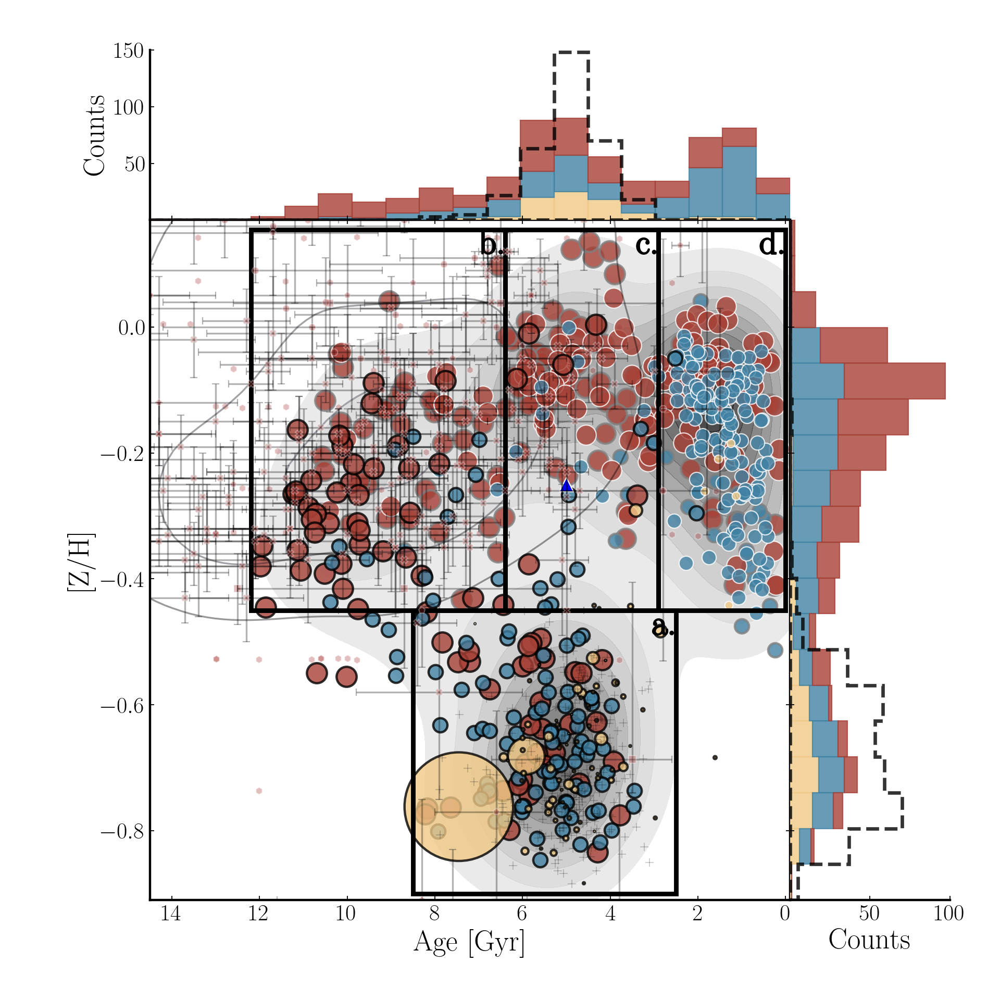

In [6]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import illustris_python as il
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib
from matplotlib.patches import Rectangle
from scipy.stats import gaussian_kde
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
from matplotlib.patches import Ellipse
from matplotlib import patheffects as path_effects
import pandas as pd
from astroML.plotting import setup_text_plots
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'

setup_text_plots(usetex=True)

# def stacked_hist(ax, data, bins, orientation, colors, edgecolors, alpha):
#     n = len(data)
#     base = np.zeros_like(bins[:-1])
#     for i in range(n):
#         hist, _ = np.histogram(data[i], bins=bins)
#         if orientation == 'horizontal':
#             ax.barh(bins[:-1], hist, left=base, height=np.diff(bins), color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
#         elif orientation == 'vertical':
#             ax.bar(bins[:-1], hist, bottom=base, width=np.diff(bins), color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
#         base += hist
def stacked_hist(ax, data, bins, orientation='vertical', colors=None, edgecolors=None, alpha=0.8):
    n = len(data)
    bottoms = np.zeros_like(bins[:-1])
    for i in range(n):
        counts, _ = np.histogram(data[i], bins=bins)
        if orientation == 'vertical':
            ax.bar(bins[:-1], counts, width=bins[1] - bins[0], bottom=bottoms, align='edge',
                   color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        else:
            ax.barh(bins[:-1], counts, height=bins[1] - bins[0], left=bottoms, align='edge',
                    color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        bottoms += counts


dex = 0.55

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

# sizes = np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]/np.max(np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]) * len(np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]) / 3
M = np.concatenate((np.array(CSSs3['Star mass']), np.array(Normal_Dwarf['Star mass'])),axis=0)
sizes = (M/np.max(M) * len(M)/20) * 5

sizes_0 = sizes[np.array(np.argwhere(np.array((CSSs3['Number'] >= 2) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Distance_grpvir'] > 0)))[:,0])]
# print(len(np.array(CSSs3["MWted-Age"])[np.where(np.array((CSSs3['Number'] >= 2)))]),len(sizes_0))
# sizes_0 = sizes[np.array(np.argwhere((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))[:,0])]
sizes_1 = sizes[np.where(np.array((CSSs3['Number'] < 2)))]
sizes_2 = sizes[np.array(np.argwhere(np.array((Normal_Dwarf['Number'] < 2) & (CSSs3['Distance_grpvir'] > 0)))[:,0])]

fig = plt.figure(figsize=(12, 12), dpi=160, facecolor='white')
plt.subplots_adjust(left=0.15, bottom=0.1, right=0.95, top=0.95)
grid = plt.GridSpec(5, 5, hspace=0, wspace=0)

# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
ax_right.tick_params(right=False, top=False)
ax_top = fig.add_subplot(grid[0, :-1], xticklabels=[])
ax_top.tick_params(right=False, top=False)

ax_main.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
ax_main.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
ax_main.spines['top'].set_linewidth(2)  # 修改顶部轴线宽度
ax_main.spines['right'].set_linewidth(2)  # 修改右部轴线宽度

ax_right.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
ax_top.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
ax_right.spines['bottom'].set_linewidth(2)
# ax_right.spines['right'].set_linewidth(2)
# ax_right.spines['top'].set_linewidth(2)
# ax_right.spines['left'].set_linewidth(2)

# ax_right.spines['bottom'].set_visible(False)
ax_right.spines['right'].set_visible(False)
ax_right.spines['top'].set_visible(False)
ax_right.spines['left'].set_visible(False)

# ax_top.spines['bottom'].set_linewidth(2)
# ax_top.spines['right'].set_linewidth(2)
# ax_top.spines['top'].set_linewidth(2)
ax_top.spines['left'].set_linewidth(2)

ax_top.spines['bottom'].set_visible(False)
ax_top.spines['right'].set_visible(False)
ax_top.spines['top'].set_visible(False)
# ax_top.spines['left'].set_visible(False)

breakingpoint = 67

cl_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
cl_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))] - dex
cl_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
cl_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))] - dex
cl_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0))]
cl_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0))] - dex

grp_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
grp_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))] - dex
grp_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
grp_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))] - dex
grp_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))]
grp_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))] - dex

fl_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
fl_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))] - dex
fl_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
fl_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))] - dex
fl_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))]
fl_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))] - dex
iso_CSSs_age = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
iso_CSSs_ZH = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))] - dex


Age_fl_CSSs = 13.8-np.array(CSSs3['MWted-Age'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Age_grp_CSSs = 13.8-np.array(CSSs3['MWted-Age'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
Age_cl_CSSs = 13.8-np.array(CSSs3['MWted-Age'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
ZH_fl_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))] - dex
ZH_grp_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))] - dex
ZH_cl_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))] - dex

# ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[np.where((CSSs3['Distance_grpvir'] > 0))], bins=np.linspace(0,12.2,12), histtype='stepfilled', orientation='vertical', 
#                                                                 edgecolor='black', facecolor='none', alpha=0.8, linewidth=3)

# ax_top.hist(Age_cl_CSSs, bins=np.linspace(0,12.2,12), orientation='vertical', color=cl, edgecolor=cl, alpha=0.8, linewidth=3)
# ax_top.hist(Age_grp_CSSs, bins=np.linspace(0,12.2,12), orientation='vertical', color=grp, edgecolor=grp, alpha=0.8, linewidth=3)
# ax_top.hist(Age_fl_CSSs, bins=np.linspace(0,12.2,12), orientation='vertical', color=fl, edgecolor=fl, alpha=0.8, linewidth=3)

stacked_hist(ax_top, [Age_fl_CSSs, Age_grp_CSSs, Age_cl_CSSs], bins=np.linspace(-0.1, 14.5, 20), orientation='vertical', colors=[fl, grp, cl], edgecolors=[fl, grp, cl], alpha=0.8)

ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[np.where((CSSs3['Distance_grpvir'] == 0) & (CSSs3['Number'] == 1))], bins=np.linspace(-0.1,14.5,20), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor='black', linestyle='--', facecolor='none', alpha=0.8, linewidth=3)                                                                                                                         


# sns.histplot(data=cl_CSSs_age, ax=ax_top,color=grp, linestyle='-', linewidth=2, kde=True, bins=10)
# sns.histplot(data=grp_CSSs_age, ax=ax_top, color=cl, linestyle='-', linewidth=2, kde=True, bins=10)
# sns.histplot(data=fl_CSSs_age, ax=ax_top, color=fl, linestyle='-', linewidth=2, kde=True, bins=5)
# sns.histplot(data=iso_CSSs_age, ax=ax_top, color='black', linestyle='--', linewidth=1, kde=True, bins=5)

ax_top.set_xlim(-0.1,14.5)

ax_top.invert_xaxis()
# ax_top.set_xticks([])
# ax_top.set_yticks([])
# ax_top.tick_params(axis='x', direction='in')
ax_top.tick_params(axis='y', which='both')
ax_top.tick_params(axis='x', which='major', labelsize=12)

# ax_right.hist(np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] > 0))], bins=np.linspace(-0.36, 0.72,12), histtype='stepfilled', orientation='horizontal', 
#                                                                 edgecolor='black', facecolor='none', alpha=0.8, linewidth=3)


# ax_right.hist(ZH_cl_CSSs, bins=np.linspace(-0.36, 0.72,12), orientation='horizontal', color=cl, edgecolor=cl, alpha=0.8, linewidth=3)
# ax_right.hist(ZH_grp_CSSs, bins=np.linspace(-0.36, 0.72,12), orientation='horizontal', color=grp, edgecolor=grp, alpha=0.8, linewidth=3)
# ax_right.hist(ZH_fl_CSSs, bins=np.linspace(-0.36, 0.72,12), orientation='horizontal', color=fl, edgecolor=fl, alpha=0.8, linewidth=3)


stacked_hist(ax_right, [ZH_fl_CSSs, ZH_grp_CSSs, ZH_cl_CSSs], bins=np.linspace(-0.36-dex, 0.72-dex, 20), orientation='horizontal', colors=[fl, grp, cl], edgecolors=[fl, grp, cl], alpha=0.8)

ax_right.hist(np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] == 0) & (CSSs3['Number'] == 1))] - dex, bins=np.linspace(-0.36-dex, 0.72-dex, 20), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='black', linestyle='--', facecolor='none', alpha=0.8, linewidth=3)                                                                                                                           
# sns.histplot(data=cl_CSSs_ZH, ax=ax_right,color=grp, linestyle='-', linewidth=2)
# sns.histplot(data=grp_CSSs_ZH, ax=ax_right, color=cl, linestyle='-', linewidth=2)
# sns.histplot(data=fl_CSSs_ZH, ax=ax_right, color=fl, linestyle='-', linewidth=2)
# sns.histplot(data=iso_CSSs_ZH, ax=ax_right, color='black', linestyle='--', linewidth=1)

ax_right.set_ylim(-0.36-dex, 0.72-dex)

ax_right.tick_params(axis='x', which='both')
ax_right.tick_params(axis='y', which='major', labelsize=12)
# ax_right.set_xticks([])
# ax_right.set_yticks([])


ax_top.set_yticks([50, 100, 150])
ax_top.set_yticklabels([50, 100, 150], fontsize=20)
ax_top.set_ylabel('Counts', fontsize=25)
ax_right.set_xticks([50, 100])
ax_right.set_xticklabels([50, 100], fontsize=20)
ax_right.set_xlabel('Counts', fontsize=25)

# 从CSSs3中提取数据
# x = 13.8-np.array(CSSs3["MWted-Age"])[np.where( ((13.8-CSSs3['MWted-Age']) >= 4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.085) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) ) ]
# y = np.array(CSSs3["[Z/H]_r"])[np.where( ((13.8-CSSs3['MWted-Age']) >= 4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.085) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) ) ]
x = 13.8-np.array(CSSs3["MWted-Age"])[np.where((CSSs3['Distance_grpvir'] > 0))]
y = np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] > 0))] - dex

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.5, x.max()+0.1, 100)
yi = np.linspace(y.min()-0.1, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colors = [(1, 1, 1, 0)] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=11, colors=colors, alpha=0.7)


########################################################################################################################
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')
Ferre2018_SSP_LW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_LW.txt', delim_whitespace=True)
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)
data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)
data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')
data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

# stacked_hist(ax_top, [Chilingarian2015[' age_ssp'],  Ferre2018_SSP_MW['Age(Gyr)'], data_txt_guerou['Age(Gyr)'], data_txt_janz['Age(Gyr)'], data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithouthost['Age'], data_txt_rey['Age(Gyr)']], 
#              bins=np.linspace(-0.1, 17.5, 12), orientation='vertical', 
#              colors=['none', 
#                      'none', 
#                      'none',
#                      'none',
#                      'none',
#                      'none',
#                      'none'], 
#                      edgecolors=[(251/255,227/255,213/255), 
#                      (114/255,170/255,207/255), 
#                      (168/255,3/255,38/255),
#                      (236/255,93/255,59/255),
#                      (253/255,185/255,107/255),
#                      (254/255,251/255,186/255),
#                      (57/255,81/255,162/255)], alpha=0.8)

combined_age = np.concatenate((Chilingarian2015[' age_ssp'], Ferre2018_SSP_LW['Age(Gyr)'], Ferre2018_SSP_MW['Age(Gyr)'], data_txt_guerou['Age(Gyr)'], data_txt_janz['Age(Gyr)'], data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithouthost['Age'], data_txt_rey['Age(Gyr)']), axis=0)

combined_ZH = np.concatenate((Chilingarian2015[' met_ssp'], Ferre2018_SSP_LW['[Z/H]'], Ferre2018_SSP_MW['[Z/H]'], data_txt_guerou['[Z/H]'], data_txt_janz['[Z/H]'], data_csv_kim2020_cEwithhost['ZH'], data_csv_kim2020_cEwithouthost['ZH'], data_txt_rey['[Z/H]']), axis=0)


# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(combined_age), ~np.isnan(combined_ZH))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_age))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_ZH))
combined_age = combined_age[valid_idx]
combined_ZH = combined_ZH[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([combined_age, combined_ZH]))
xmin, ymin = combined_age.min(), combined_ZH.min()
xmax, ymax = combined_age.max(), combined_ZH.max()

xi = np.linspace(combined_age.min()-0.5, combined_age.max()+0.1, 100)
yi = np.linspace(combined_ZH.min()-0.5, y.max()+0.5, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colormap = plt.cm.bone
colors = [(1, 1, 1, 0)] + list(colormap(np.linspace(0, 1, 10)))  # 添加白色作为最低值颜色

sm = ax_main.contour(xi, yi, zi, levels=3, colors=colors, alpha=0.4)


# Load the data from the uploaded Excel file
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')

# Extracting the correct columns for age and metallicity
age_ssp = Chilingarian2015[' age_ssp']
age_ssp_err = Chilingarian2015[' age_ssp_err']
met_ssp = Chilingarian2015[' met_ssp']
met_ssp_err = Chilingarian2015[' met_ssp_err']

# Creating the age-metallicity diagram
ax_main.errorbar(age_ssp, met_ssp, xerr=age_ssp_err, yerr=met_ssp_err, fmt='X', ecolor='black', alpha=0.3, markerfacecolor='brown', markeredgecolor='white', label='cEs (Chilingarian+2015)')

# Read the text file using whitespace as the delimiter
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)

# Extracting relevant data for the age-metallicity diagram
age_ssp_txt = Ferre2018_SSP_MW['Age(Gyr)']
age_ssp_err_txt = Ferre2018_SSP_MW['Age_err']
met_ssp_txt = Ferre2018_SSP_MW['[Z/H]']
met_ssp_err_txt = Ferre2018_SSP_MW['[Z/H]_err']

# Creating the age-metallicity diagram
ax_main.errorbar(age_ssp_txt, met_ssp_txt, xerr=age_ssp_err_txt, yerr=met_ssp_err_txt, fmt='o', ecolor='black', alpha=0.3, markerfacecolor='brown', markeredgecolor='white', label='cEs (Ferre+2018)')

data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
             xerr=[data_txt_guerou['Age_err-'], data_txt_guerou['Age_err+']], 
             yerr=[data_txt_guerou['[Z/H]_err-'], data_txt_guerou['[Z/H]_err+']],
             fmt='X', ecolor='black', alpha=0.3, marker='s', markerfacecolor='brown', markeredgecolor='white', label='cEs (Guerou+2015)')

# Load the data from the uploaded text file
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
             xerr=[data_txt_janz['Age_err-'], data_txt_janz['Age_err+']], 
             yerr=data_txt_janz['[Z/H]_err'],
             fmt='X', ecolor='black', alpha=0.3, marker='p', markerfacecolor='brown', markeredgecolor='white', label='CSSs (Janz+2016)')

data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithhost['ZH'], marker='h', color='brown', alpha=0.3, edgecolor='white', label='cEs with host (Kim+2020)')

data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithouthost['Age'], data_csv_kim2020_cEwithouthost['ZH'], marker='h', color='brown', alpha=0.3, edgecolor='white', label='cEs without host (Kim+2020)')

# Load the data from the uploaded text file
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram showing individual errors
ax_main.errorbar(data_txt_rey['Age(Gyr)'], data_txt_rey['[Z/H]'],
             xerr=[data_txt_rey['Age_err-'], data_txt_rey['Age_err+']], 
             yerr=[data_txt_rey['[Z/H]_err-'], data_txt_rey['[Z/H]_err+']],
             fmt='8',  # 圆形标记
             ecolor='black', alpha=0.3, 
             markerfacecolor='brown', markeredgecolor='white', label='cEs (Rey+2021)')

########################################################################################################################

# 过滤条件
filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0)

# 根据 'overdensities' 的值计算颜色
sizes = np.array(CSSs3['Stellarmass'])[filter_condition] * 10  # 调整大小的比例因子

ax_main.scatter(cl_CSSs_age_0,cl_CSSs_ZH_0 ,marker='o',c=cl,s=300,alpha=0.8,edgecolor='grey',lw=2)
ax_main.scatter(grp_CSSs_age_0,grp_CSSs_ZH_0 ,marker='o',c=grp,s=150,alpha=0.8,edgecolor='grey',lw=2)
ax_main.scatter(fl_CSSs_age_0,fl_CSSs_ZH_0 ,marker='o',c=fl,s=50,alpha=0.8,edgecolor='grey',lw=2)

ax_main.scatter(cl_CSSs_age_brk,cl_CSSs_ZH_brk ,marker='o',c=cl,s=300,alpha=0.8,edgecolor='white',lw=1,label='CSSs (cluster,sat)')
ax_main.scatter(grp_CSSs_age_brk,grp_CSSs_ZH_brk ,marker='o',c=grp,s=150,alpha=0.8,edgecolor='white',lw=1,label='CSSs (group,sat)')
ax_main.scatter(fl_CSSs_age_brk,fl_CSSs_ZH_brk ,marker='o',c=fl,s=50,alpha=0.8,edgecolor='white',lw=1,label='CSSs (field,sat)')

ax_main.scatter(cl_CSSs_age_1,cl_CSSs_ZH_1 ,marker='o',c=cl,s=300,alpha=0.8,edgecolor='black',lw=2)
ax_main.scatter(grp_CSSs_age_1,grp_CSSs_ZH_1 ,marker='o',c=grp,s=150,alpha=0.8,edgecolor='black',lw=2)
ax_main.scatter(fl_CSSs_age_1,fl_CSSs_ZH_1 ,marker='o',c=fl,s=50,alpha=0.8,edgecolor='black',lw=2)

ax_main.scatter(iso_CSSs_age, iso_CSSs_ZH,
                marker='+',c='black',s=50,alpha=0.8,edgecolor='black',label='CSSs (isolated,cen)',lw=0.2)

ax_main.scatter(10**0.7,-0.25, s=150, marker='^', edgecolor='white', color='blue')

# Annotation with white edge around the text
text = ax_main.annotate('M32', xy=(10**0.7, -0.25), xytext=(10,10), xycoords='axes fraction',
                        fontsize=20, family='serif', color='blue',
                        ha="center", va="center")

# ax_main.scatter(6,-0.03, s=150, marker='s', edgecolor='white', color='brown')

# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# text = ax_main.annotate('cE0', xy=(0.56, 0.32), xycoords='axes fraction',
#                         fontsize=20, family='serif', color='brown',
#                         ha="center", va="center")

# ax_main.scatter(10-1.8,0.05, s=150, marker='s', edgecolor='white', color='lightgreen')

# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# text = ax_main.annotate('CGCG 036-042', xy=(0.465, 0.36), xycoords='axes fraction',
#                         fontsize=20, family='serif', color='lightgreen',
#                         ha="center", va="center")

# # Apply path effects to the text
# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# ax_main.scatter(2.8,0.49, s=150, marker='p', edgecolor='white', color='lightpink')

# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# text = ax_main.annotate('cE1', xy=(0.805, 0.805), xycoords='axes fraction',
#                         fontsize=20, family='serif', color='lightpink',
#                         ha="center", va="center")

# # Apply path effects to the text
# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# ax_main.scatter(1.9,0.22, s=150, marker='p', edgecolor='white', color='crimson')

# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# text = ax_main.annotate('M85-HCC1', xy=(0.9, 0.56), xycoords='axes fraction',
#                         fontsize=20, family='serif', color='crimson',
#                         ha="center", va="center")

# # Apply path effects to the text
# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# ax_main.scatter(10,0.15, s=150, marker='h', edgecolor='white', color='lightblue')

# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# text = ax_main.annotate('M59-UCD3', xy=(0.28, 0.495), xycoords='axes fraction',
#                         fontsize=20, family='serif', color='lightblue',
#                         ha="center", va="center")

# # Apply path effects to the text
# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# ax_main.scatter(11.5,0.38, s=150, marker='h', edgecolor='white', color='indigo')

# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# text = ax_main.annotate('M59-UCD1', xy=(0.16, 0.65), xycoords='axes fraction',
#                         fontsize=20, family='serif', color='indigo',
#                         ha="center", va="center")

# # Apply path effects to the text
# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# ax_main.scatter(4.6,0.3, s=150, marker='*', edgecolor='white', color='navy')

# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# text = ax_main.annotate('2MASX\n J01491447+1301548', xy=(0.58, 0.605), xycoords='axes fraction',
#                         fontsize=20, family='serif', color='navy',
#                         ha="center", va="center")

# # Apply path effects to the text
# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# 反转x轴
ax_main.invert_xaxis()

# rect = Rectangle((8, 0.085), 4.2, 0.455, linestyle='--', linewidth=4, edgecolor='black', facecolor='none')
# ax_main.add_patch(rect)
rect2 = Rectangle((6.4, 0.1 - dex), 5.8, 0.605, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect2)

# ax_main.text(rect2.get_x() + rect2.get_width(), rect2.get_y() + rect2.get_height(), "b.", ha='left', va='top', alpha=1,
#              fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
#              path_effects=[path_effects.withStroke(linewidth=1.5)])

ax_main.text(rect2.get_x(), rect2.get_y() + rect2.get_height(), "b.", ha='right', va='top', alpha=1,
             fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
             path_effects=[path_effects.withStroke(linewidth=1.5)])

rect3 = Rectangle((2.9, 0.1 - dex), 3.5, 0.605, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect3)

# ax_main.text(rect3.get_x() + rect3.get_width(), rect3.get_y() + rect3.get_height(), "c.", ha='left', va='top', alpha=1,
#              fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
#              path_effects=[path_effects.withStroke(linewidth=1.5)])

ax_main.text(rect3.get_x(), rect3.get_y() + rect3.get_height(), "c.", ha='right', va='top', alpha=1,
             fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
             path_effects=[path_effects.withStroke(linewidth=1.5)])

rect4 = Rectangle((0, 0.1 - dex), 2.9, 0.605, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect4)

# ax_main.text(rect4.get_x() + rect4.get_width(), rect4.get_y() + rect4.get_height(), "d.", ha='left', va='top', alpha=1,
#              fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
#              path_effects=[path_effects.withStroke(linewidth=1.5)])

ax_main.text(rect4.get_x(), rect4.get_y() + rect4.get_height(), "d.", ha='right', va='top', alpha=1,
             fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
             path_effects=[path_effects.withStroke(linewidth=1.5)])

rect1 = Rectangle((2.5, -0.35 - dex), 6, 0.45, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect1)

# ax_main.text(rect1.get_x() + rect1.get_width(), rect1.get_y() + rect1.get_height(), "a.", ha='left', va='top', alpha=1,
#              fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
#              path_effects=[path_effects.withStroke(linewidth=1.5)])

ax_main.text(rect1.get_x(), rect1.get_y() + rect1.get_height(), "a.", ha='right', va='top', alpha=1,
             fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
             path_effects=[path_effects.withStroke(linewidth=1.5)])

ax_main.tick_params(axis='x', direction='in')
ax_main.tick_params(axis='y', direction='in')
ax_main.set_xlim(-0.1, 14.5)
ax_main.invert_xaxis()
ax_main.set_ylim(-0.36 - dex, 0.72 - dex)
ax_main.set_xlabel('Age [Gyr]', fontsize=25)
ax_main.set_ylabel('[Z/H]', fontsize=25)
ax_main.tick_params(axis='both', which='major', labelsize=20)
# 标注区域名称
# Metal-Poor Compact Galaxies (MPCGs)
# ax_main.text(0.6, 0.56 - dex, "d.",alpha=1,fontdict={'size': 30, 'family': 'serif', 'color': 'black'},path_effects=[path_effects.withStroke(linewidth=1.5)])
# # Metal-Rich Early-Type Compact Galaxies I (MRECGs I)
# # ax_main.text(4.0, 0.67, "c.",alpha=1,fontdict={'size': 30, 'family': 'serif', 'color': 'black'},path_effects=[path_effects.withStroke(linewidth=1.5)])
# ax_main.text(3.99, 0.67 - dex, "c.",alpha=1,fontdict={'size': 30, 'family': 'serif', 'color': 'black'},path_effects=[path_effects.withStroke(linewidth=1.5)])
# # Metal-Rich Early-Type Compact Galaxies II (MRECGs II)
# ax_main.text(3.05, 0.04 - dex, "a.",alpha=1,fontdict={'size': 30, 'family': 'serif', 'color': 'black'},path_effects=[path_effects.withStroke(linewidth=1.5)])
# # ax_main.text(8.6, 0.49, "b.",alpha=1,fontdict={'size': 30, 'family': 'serif', 'color': 'black'},path_effects=[path_effects.withStroke(linewidth=1.5)])
# ax_main.text(7.65, 0.49 - dex, "b.",alpha=1,fontdict={'size': 30, 'family': 'serif', 'color': 'black'},path_effects=[path_effects.withStroke(linewidth=1.5)])
plt.rcParams['legend.fontsize'] = 20
# ax_main.legend(frameon=False,handletextpad=0.0000005,bbox_to_anchor=(0.42,0.28))

total_legend_items = 11
ncol = (total_legend_items + 1) // 2  # 使用 // 实现整数除法

# ncol=len(ax_main.get_legend_handles_labels()[1])

# 添加图例，并将其放在图的正下方
# legend = ax_main.legend(frameon=False, handletextpad=0.0000005, loc='upper center', bbox_to_anchor=(0.5, -0.07), ncol=ncol, columnspacing=0.2)
plt.savefig('/home/bianyuan/workspace/pic/Age_Z'+'.pdf')

/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/tmp/ipykernel_24041/3170514470.py:283: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "X" (-> marker='X'). The keyword argument will take precedence.
  ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
/tmp/ipykernel_24041/3170514470.py:292: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "X" (-> marker='X'). The keyword argument will take precedence.
  ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
/tmp/ipykernel_24041/3170514470.py:324: MatplotlibDeprecationWarning: The get_cmap function was deprecat

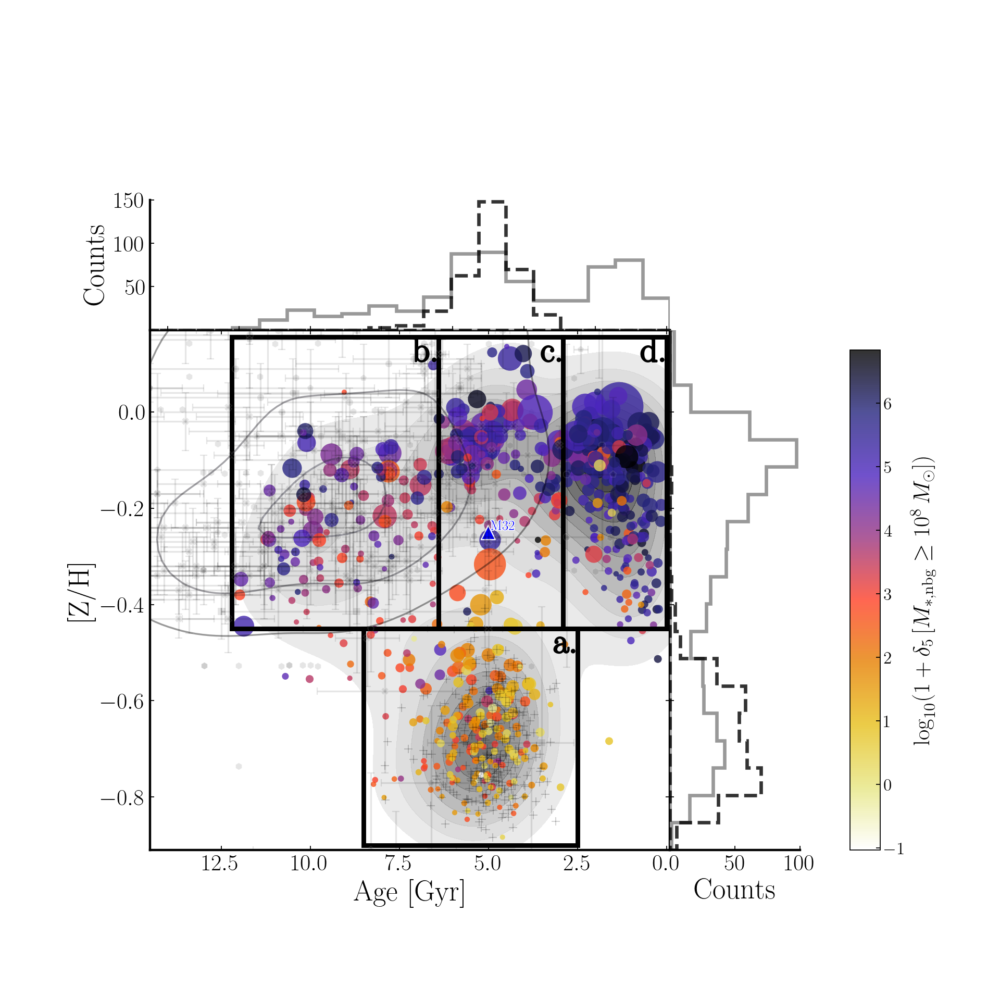

In [6]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import illustris_python as il
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib
from matplotlib.patches import Rectangle
from scipy.stats import gaussian_kde
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
from matplotlib.patches import Ellipse
from matplotlib import patheffects as path_effects
import matplotlib.cm as cm
import pandas as pd
from astroML.plotting import setup_text_plots
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'

setup_text_plots(usetex=True)

# def stacked_hist(ax, data, bins, orientation, colors, edgecolors, alpha):
#     n = len(data)
#     base = np.zeros_like(bins[:-1])
#     for i in range(n):
#         hist, _ = np.histogram(data[i], bins=bins)
#         if orientation == 'horizontal':
#             ax.barh(bins[:-1], hist, left=base, height=np.diff(bins), color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
#         elif orientation == 'vertical':
#             ax.bar(bins[:-1], hist, bottom=base, width=np.diff(bins), color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
#         base += hist
def stacked_hist(ax, data, bins, orientation='vertical', colors=None, edgecolors=None, alpha=0.8):
    n = len(data)
    bottoms = np.zeros_like(bins[:-1])
    for i in range(n):
        counts, _ = np.histogram(data[i], bins=bins)
        if orientation == 'vertical':
            ax.bar(bins[:-1], counts, width=bins[1] - bins[0], bottom=bottoms, align='edge',
                   color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        else:
            ax.barh(bins[:-1], counts, height=bins[1] - bins[0], left=bottoms, align='edge',
                    color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        bottoms += counts


dex = 0.55

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

# sizes = np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]/np.max(np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]) * len(np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]) / 3
M = np.concatenate((np.array(CSSs3['Star mass']), np.array(Normal_Dwarf['Star mass'])),axis=0)
sizes = (M/np.max(M) * len(M)/20) * 5

sizes_0 = sizes[np.array(np.argwhere(np.array((CSSs3['Number'] >= 2) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Distance_grpvir'] > 0)))[:,0])]
# print(len(np.array(CSSs3["MWted-Age"])[np.where(np.array((CSSs3['Number'] >= 2)))]),len(sizes_0))
# sizes_0 = sizes[np.array(np.argwhere((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))[:,0])]
sizes_1 = sizes[np.where(np.array((CSSs3['Number'] < 2)))]
sizes_2 = sizes[np.array(np.argwhere(np.array((Normal_Dwarf['Number'] < 2) & (CSSs3['Distance_grpvir'] > 0)))[:,0])]

fig = plt.figure(figsize=(12, 12), dpi=160, facecolor='white')
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.80, top=0.80)
grid = plt.GridSpec(5, 5, hspace=0, wspace=0)

# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
ax_right.tick_params(right=False, top=False)
ax_top = fig.add_subplot(grid[0, :-1], xticklabels=[])
ax_top.tick_params(right=False, top=False)

ax_main.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
ax_main.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
ax_main.spines['top'].set_linewidth(2)  # 修改顶部轴线宽度
ax_main.spines['right'].set_linewidth(2)  # 修改右部轴线宽度

ax_right.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
ax_top.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
ax_right.spines['bottom'].set_linewidth(2)
# ax_right.spines['right'].set_linewidth(2)
# ax_right.spines['top'].set_linewidth(2)
# ax_right.spines['left'].set_linewidth(2)

# ax_right.spines['bottom'].set_visible(False)
ax_right.spines['right'].set_visible(False)
ax_right.spines['top'].set_visible(False)
ax_right.spines['left'].set_visible(False)

# ax_top.spines['bottom'].set_linewidth(2)
# ax_top.spines['right'].set_linewidth(2)
# ax_top.spines['top'].set_linewidth(2)
ax_top.spines['left'].set_linewidth(2)

ax_top.spines['bottom'].set_visible(False)
ax_top.spines['right'].set_visible(False)
ax_top.spines['top'].set_visible(False)
# ax_top.spines['left'].set_visible(False)

breakingpoint = 67

cl_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
cl_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))] - dex
cl_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
cl_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))] - dex
cl_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0))]
cl_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0))] - dex

grp_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
grp_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))] - dex
grp_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
grp_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))] - dex
grp_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))]
grp_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))] - dex

fl_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
fl_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))] - dex
fl_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
fl_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))] - dex
fl_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))]
fl_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))] - dex
iso_CSSs_age = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
iso_CSSs_ZH = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))] - dex


Age_fl_CSSs = 13.8-np.array(CSSs3['MWted-Age'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Age_grp_CSSs = 13.8-np.array(CSSs3['MWted-Age'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
Age_cl_CSSs = 13.8-np.array(CSSs3['MWted-Age'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
ZH_fl_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))] - dex
ZH_grp_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))] - dex
ZH_cl_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))] - dex


# stacked_hist(ax_top, [Age_fl_CSSs, Age_grp_CSSs, Age_cl_CSSs], bins=np.linspace(-0.1, 14.5, 20), orientation='vertical', colors=[fl, grp, cl], edgecolors=[fl, grp, cl], alpha=0.8)

ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[np.where((CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] > 1))], bins=np.linspace(-0.1,14.5,20), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor='grey', linestyle='-', facecolor='none', alpha=0.8, linewidth=3)

ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[np.where((CSSs3['Distance_grpvir'] == 0) & (CSSs3['Number'] == 1))], bins=np.linspace(-0.1,14.5,20), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor='black', linestyle='--', facecolor='none', alpha=0.8, linewidth=3)                                                                                                                         


ax_top.set_xlim(-0.1,14.5)

ax_top.invert_xaxis()
ax_top.tick_params(axis='y', which='both')
ax_top.tick_params(axis='x', which='major', labelsize=12)


# stacked_hist(ax_right, [ZH_fl_CSSs, ZH_grp_CSSs, ZH_cl_CSSs], bins=np.linspace(-0.36-dex, 0.72-dex, 20), orientation='horizontal', colors=[fl, grp, cl], edgecolors=[fl, grp, cl], alpha=0.8)

ax_right.hist(np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] > 1))] - dex, bins=np.linspace(-0.36-dex, 0.72-dex, 20), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='grey', linestyle='-', facecolor='none', alpha=0.8, linewidth=3)  

ax_right.hist(np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] == 0) & (CSSs3['Number'] == 1))] - dex, bins=np.linspace(-0.36-dex, 0.72-dex, 20), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='black', linestyle='--', facecolor='none', alpha=0.8, linewidth=3)                                                                                                                           

ax_right.set_ylim(-0.36-dex, 0.72-dex)

ax_right.tick_params(axis='x', which='both')
ax_right.tick_params(axis='y', which='major', labelsize=12)

ax_top.set_yticks([50, 100, 150])
ax_top.set_yticklabels([50, 100, 150], fontsize=20)
ax_top.set_ylabel('Counts', fontsize=25)
ax_right.set_xticks([50, 100])
ax_right.set_xticklabels([50, 100], fontsize=20)
ax_right.set_xlabel('Counts', fontsize=25)

# 从CSSs3中提取数据
x = 13.8-np.array(CSSs3["MWted-Age"])[np.where((CSSs3['Distance_grpvir'] > 0))]
y = np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] > 0))] - dex

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.5, x.max()+0.1, 100)
yi = np.linspace(y.min()-0.1, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colors = [(1, 1, 1, 0)] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=11, colors=colors, alpha=0.7)


########################################################################################################################
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')
Ferre2018_SSP_LW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_LW.txt', delim_whitespace=True)
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)
data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)
data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')
data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

combined_age = np.concatenate((Chilingarian2015[' age_ssp'], Ferre2018_SSP_LW['Age(Gyr)'], Ferre2018_SSP_MW['Age(Gyr)'], data_txt_guerou['Age(Gyr)'], data_txt_janz['Age(Gyr)'], data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithouthost['Age'], data_txt_rey['Age(Gyr)']), axis=0)

combined_ZH = np.concatenate((Chilingarian2015[' met_ssp'], Ferre2018_SSP_LW['[Z/H]'], Ferre2018_SSP_MW['[Z/H]'], data_txt_guerou['[Z/H]'], data_txt_janz['[Z/H]'], data_csv_kim2020_cEwithhost['ZH'], data_csv_kim2020_cEwithouthost['ZH'], data_txt_rey['[Z/H]']), axis=0)


# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(combined_age), ~np.isnan(combined_ZH))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_age))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_ZH))
combined_age = combined_age[valid_idx]
combined_ZH = combined_ZH[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([combined_age, combined_ZH]))
xmin, ymin = combined_age.min(), combined_ZH.min()
xmax, ymax = combined_age.max(), combined_ZH.max()

xi = np.linspace(combined_age.min()-0.5, combined_age.max()+0.1, 100)
yi = np.linspace(combined_ZH.min()-0.5, y.max()+0.5, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colormap = plt.cm.bone
colors = [(1, 1, 1, 0)] + list(colormap(np.linspace(0, 1, 10)))  # 添加白色作为最低值颜色

sm = ax_main.contour(xi, yi, zi, levels=3, colors=colors, alpha=0.4)

# Load the data from the uploaded Excel file
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')

# Extracting the correct columns for age and metallicity
age_ssp = Chilingarian2015[' age_ssp']
age_ssp_err = Chilingarian2015[' age_ssp_err']
met_ssp = Chilingarian2015[' met_ssp']
met_ssp_err = Chilingarian2015[' met_ssp_err']

# Creating the age-metallicity diagram
ax_main.errorbar(age_ssp, met_ssp, xerr=age_ssp_err, yerr=met_ssp_err, fmt='X', ecolor='black', alpha=0.1, markerfacecolor='black', markeredgecolor='white', label='cEs (Chilingarian+2015)')

# Read the text file using whitespace as the delimiter
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)

# Extracting relevant data for the age-metallicity diagram
age_ssp_txt = Ferre2018_SSP_MW['Age(Gyr)']
age_ssp_err_txt = Ferre2018_SSP_MW['Age_err']
met_ssp_txt = Ferre2018_SSP_MW['[Z/H]']
met_ssp_err_txt = Ferre2018_SSP_MW['[Z/H]_err']

# Creating the age-metallicity diagram
ax_main.errorbar(age_ssp_txt, met_ssp_txt, xerr=age_ssp_err_txt, yerr=met_ssp_err_txt, fmt='o', ecolor='black', alpha=0.1, markerfacecolor='black', markeredgecolor='white', label='cEs (Ferre+2018)')

data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
             xerr=[data_txt_guerou['Age_err-'], data_txt_guerou['Age_err+']], 
             yerr=[data_txt_guerou['[Z/H]_err-'], data_txt_guerou['[Z/H]_err+']],
             fmt='X', ecolor='black', alpha=0.1, marker='s', markerfacecolor='black', markeredgecolor='white', label='cEs (Guerou+2015)')

# Load the data from the uploaded text file
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
             xerr=[data_txt_janz['Age_err-'], data_txt_janz['Age_err+']], 
             yerr=data_txt_janz['[Z/H]_err'],
             fmt='X', ecolor='black', alpha=0.1, marker='p', markerfacecolor='black', markeredgecolor='white', label='CSSs (Janz+2016)')

data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithhost['ZH'], marker='h', color='black', alpha=0.1, edgecolor='white', label='cEs with host (Kim+2020)')

data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithouthost['Age'], data_csv_kim2020_cEwithouthost['ZH'], marker='h', color='black', alpha=0.1, edgecolor='white', label='cEs without host (Kim+2020)')

# Load the data from the uploaded text file
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram showing individual errors
ax_main.errorbar(data_txt_rey['Age(Gyr)'], data_txt_rey['[Z/H]'],
             xerr=[data_txt_rey['Age_err-'], data_txt_rey['Age_err+']], 
             yerr=[data_txt_rey['[Z/H]_err-'], data_txt_rey['[Z/H]_err+']],
             fmt='8',  # 圆形标记
             ecolor='black', alpha=0.1, 
             markerfacecolor='black', markeredgecolor='white', label='cEs (Rey+2021)')

########################################################################################################################

# 过滤条件
filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0)

# 设置颜色映射
cmap = cm.get_cmap('CMRmap_r')

# 根据 'overdensities' 的值计算颜色
sizes = np.array(CSSs3['Stellarmass'])[filter_condition]/1e8 * 10  # 调整大小的比例因子

cmap = cm.get_cmap('CMRmap_r')
norm = plt.Normalize(vmin=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).min(),
                     vmax=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).max())

# 创建散点图
sc = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition],
                     np.array(CSSs3['[Z/H]_r'])[filter_condition]-dex,
                     c=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]),
                     cmap=cmap, norm=norm, s=sizes, alpha=0.8, edgecolor='none', lw=2)

cbar_ax = fig.add_axes([0.85, 0.15, 0.03, 0.5])  # 参数为[x, y, width, height]，需要根据你的布局进行调整
cbar = plt.colorbar(sc, cax=cbar_ax)
cbar.set_label(r'$\log_{10}(1+\delta_{5} \, [M_{*,\mathrm{nbg}} \geq 10^{8} \, M_{\odot}])$', fontsize=20)

cbar.ax.tick_params(labelsize=15)  # 调整刻度大小

# 添加colorbar
# cax = fig.add_axes([0.46, 0.76, 0.22, 0.015])  # 调整colorbar的位置和大小
# cbar = plt.colorbar(sc, ax=ax_main, orientation='horizontal',cmap='CMRmap_r')
# cbar = plt.colorbar(sc, ax=ax_main, cmap='CMRmap_r')
# cbar.set_label(r'$\mathrm{log}_{10}(1+\delta_{5} [M_{*,nbg}\geq 10^{8}M_{\odot}])$', fontsize=20)

ax_main.scatter(iso_CSSs_age, iso_CSSs_ZH,
                marker='+',c='black',s=50,alpha=0.8,edgecolor='black',label='CSSs (isolated,cen)',lw=0.2)

ax_main.scatter(10**0.7,-0.25, s=150, marker='^', edgecolor='white', color='blue')

text = ax_main.annotate('M32', (10**0.7, -0.25), textcoords="offset points", xytext=(2,2), fontsize=12, color='blue')

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# 反转x轴
ax_main.invert_xaxis()

rect2 = Rectangle((6.4, 0.1 - dex), 5.8, 0.605, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect2)

ax_main.text(rect2.get_x(), rect2.get_y() + rect2.get_height(), "b.", ha='right', va='top', alpha=1,
             fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
             path_effects=[path_effects.withStroke(linewidth=1.5)])

rect3 = Rectangle((2.9, 0.1 - dex), 3.5, 0.605, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect3)

ax_main.text(rect3.get_x(), rect3.get_y() + rect3.get_height(), "c.", ha='right', va='top', alpha=1,
             fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
             path_effects=[path_effects.withStroke(linewidth=1.5)])

rect4 = Rectangle((0, 0.1 - dex), 2.9, 0.605, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect4)

ax_main.text(rect4.get_x(), rect4.get_y() + rect4.get_height(), "d.", ha='right', va='top', alpha=1,
             fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
             path_effects=[path_effects.withStroke(linewidth=1.5)])

rect1 = Rectangle((2.5, -0.35 - dex), 6, 0.45, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect1)

ax_main.text(rect1.get_x(), rect1.get_y() + rect1.get_height(), "a.", ha='right', va='top', alpha=1,
             fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
             path_effects=[path_effects.withStroke(linewidth=1.5)])

ax_main.tick_params(axis='x', direction='in')
ax_main.tick_params(axis='y', direction='in')
ax_main.set_xlim(-0.1, 14.5)
ax_main.invert_xaxis()
ax_main.set_ylim(-0.36 - dex, 0.72 - dex)
ax_main.set_xlabel('Age [Gyr]', fontsize=25)
ax_main.set_ylabel('[Z/H]', fontsize=25)
ax_main.tick_params(axis='both', which='major', labelsize=20)
plt.rcParams['legend.fontsize'] = 20

total_legend_items = 11
ncol = (total_legend_items + 1) // 2  # 使用 // 实现整数除法
plt.savefig('/home/bianyuan/workspace/pic/Age_Z_1'+'.pdf')

/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/tmp/ipykernel_24041/117123834.py:224: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "X" (-> marker='X'). The keyword argument will take precedence.
  ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
/tmp/ipykernel_24041/117123834.py:233: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "X" (-> marker='X'). The keyword argument will take precedence.
  ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
/tmp/ipykernel_24041/117123834.py:271: MatplotlibDeprecationWarning: The get_cmap function was deprecated 

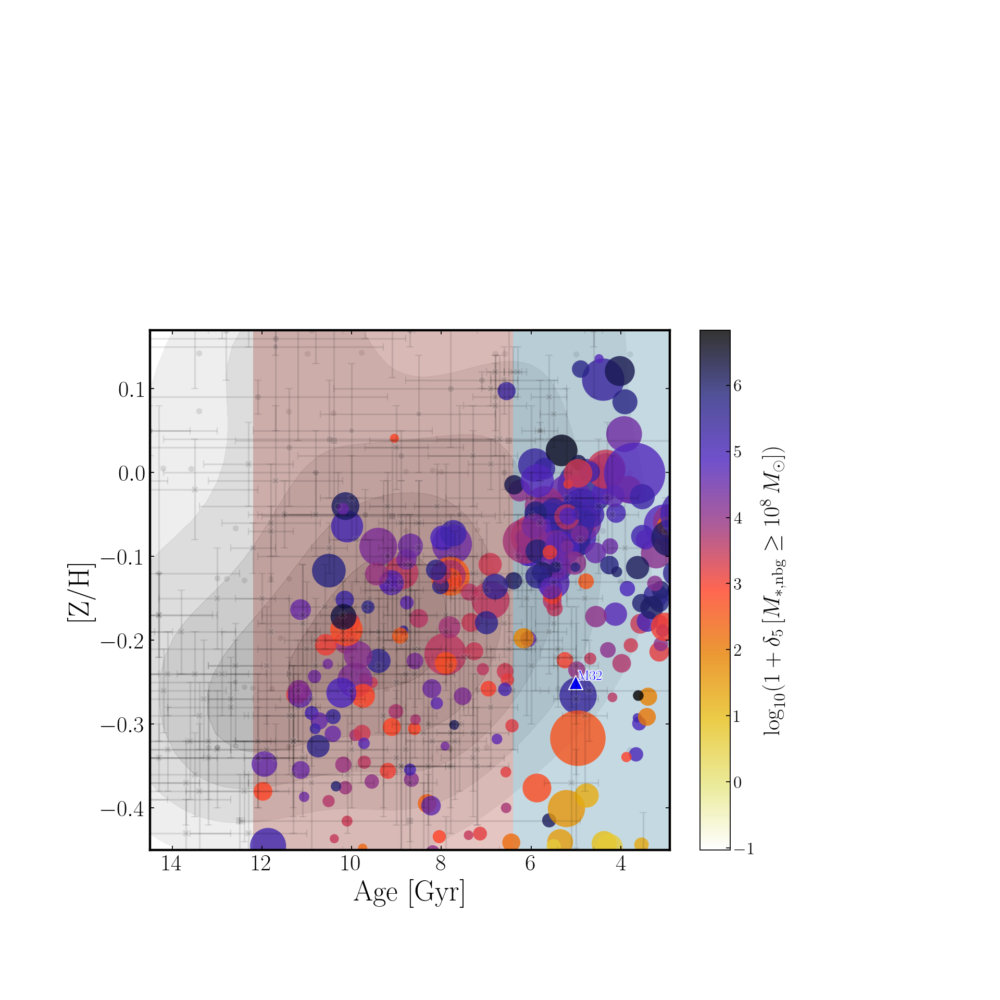

In [28]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import illustris_python as il
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib
from matplotlib.patches import Rectangle
from scipy.stats import gaussian_kde
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
from matplotlib.patches import Ellipse
from matplotlib import patheffects as path_effects
import matplotlib.cm as cm
import pandas as pd
from astroML.plotting import setup_text_plots
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'

setup_text_plots(usetex=True)

# def stacked_hist(ax, data, bins, orientation, colors, edgecolors, alpha):
#     n = len(data)
#     base = np.zeros_like(bins[:-1])
#     for i in range(n):
#         hist, _ = np.histogram(data[i], bins=bins)
#         if orientation == 'horizontal':
#             ax.barh(bins[:-1], hist, left=base, height=np.diff(bins), color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
#         elif orientation == 'vertical':
#             ax.bar(bins[:-1], hist, bottom=base, width=np.diff(bins), color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
#         base += hist
def stacked_hist(ax, data, bins, orientation='vertical', colors=None, edgecolors=None, alpha=0.8):
    n = len(data)
    bottoms = np.zeros_like(bins[:-1])
    for i in range(n):
        counts, _ = np.histogram(data[i], bins=bins)
        if orientation == 'vertical':
            ax.bar(bins[:-1], counts, width=bins[1] - bins[0], bottom=bottoms, align='edge',
                   color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        else:
            ax.barh(bins[:-1], counts, height=bins[1] - bins[0], left=bottoms, align='edge',
                    color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        bottoms += counts


dex = 0.55

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

# sizes = np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]/np.max(np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]) * len(np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]) / 3
M = np.concatenate((np.array(CSSs3['Star mass']), np.array(Normal_Dwarf['Star mass'])),axis=0)
sizes = (M/np.max(M) * len(M)/20) * 5

sizes_0 = sizes[np.array(np.argwhere(np.array((CSSs3['Number'] >= 2) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Distance_grpvir'] > 0)))[:,0])]
# print(len(np.array(CSSs3["MWted-Age"])[np.where(np.array((CSSs3['Number'] >= 2)))]),len(sizes_0))
# sizes_0 = sizes[np.array(np.argwhere((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))[:,0])]
sizes_1 = sizes[np.where(np.array((CSSs3['Number'] < 2)))]
sizes_2 = sizes[np.array(np.argwhere(np.array((Normal_Dwarf['Number'] < 2) & (CSSs3['Distance_grpvir'] > 0)))[:,0])]

fig = plt.figure(figsize=(12, 12), dpi=160, facecolor='white')
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.80, top=0.80)
grid = plt.GridSpec(5, 5, hspace=0, wspace=0)

# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])

ax_main.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
ax_main.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
ax_main.spines['top'].set_linewidth(2)  # 修改顶部轴线宽度
ax_main.spines['right'].set_linewidth(2)  # 修改右部轴线宽度

breakingpoint = 67

cl_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
cl_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))] - dex
cl_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
cl_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))] - dex
cl_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0))]
cl_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0))] - dex

grp_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
grp_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))] - dex
grp_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
grp_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))] - dex
grp_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))]
grp_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))] - dex

fl_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
fl_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))] - dex
fl_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
fl_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))] - dex
fl_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))]
fl_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))] - dex
iso_CSSs_age = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
iso_CSSs_ZH = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))] - dex


Age_fl_CSSs = 13.8-np.array(CSSs3['MWted-Age'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
Age_grp_CSSs = 13.8-np.array(CSSs3['MWted-Age'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
Age_cl_CSSs = 13.8-np.array(CSSs3['MWted-Age'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
ZH_fl_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))] - dex
ZH_grp_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))] - dex
ZH_cl_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))] - dex


# stacked_hist(ax_top, [Age_fl_CSSs, Age_grp_CSSs, Age_cl_CSSs], bins=np.linspace(-0.1, 14.5, 20), orientation='vertical', colors=[fl, grp, cl], edgecolors=[fl, grp, cl], alpha=0.8)


# # 从CSSs3中提取数据
# x = 13.8-np.array(CSSs3["MWted-Age"])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) ) ]
# y = np.array(CSSs3["[Z/H]_r"])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) ) ] - dex

# # 检查是否包含NaN或inf，并删除这些数据点
# valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
# valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
# valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
# x = x[valid_idx]
# y = y[valid_idx]

# # 估算密度分布
# kernel = gaussian_kde(np.vstack([x, y]))
# xmin, ymin = x.min(), y.min()
# xmax, ymax = x.max(), y.max()

# xi = np.linspace(x.min()-0.5, x.max()+0.5, 100)
# yi = np.linspace(y.min()-0.1, y.max()+0.5, 100)

# # 生成网格数据
# X, Y = np.meshgrid(xi,yi)
# positions = np.vstack([X.ravel(), Y.ravel()])
# Z = np.reshape(kernel(positions).T, X.shape)
# xi, yi = np.meshgrid(xi, yi)
# zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# # 将最低值颜色映射设置为白色
# colors = [(1, 1, 1, 0)] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

# sm = ax_main.contourf(xi, yi, zi, levels=11, colors=colors, alpha=0.7)


########################################################################################################################
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')
Ferre2018_SSP_LW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_LW.txt', delim_whitespace=True)
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)
data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)
data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')
data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

combined_age = np.concatenate((Chilingarian2015[' age_ssp'], Ferre2018_SSP_LW['Age(Gyr)'], Ferre2018_SSP_MW['Age(Gyr)'], data_txt_guerou['Age(Gyr)'], data_txt_janz['Age(Gyr)'], data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithouthost['Age'], data_txt_rey['Age(Gyr)']), axis=0)

combined_ZH = np.concatenate((Chilingarian2015[' met_ssp'], Ferre2018_SSP_LW['[Z/H]'], Ferre2018_SSP_MW['[Z/H]'], data_txt_guerou['[Z/H]'], data_txt_janz['[Z/H]'], data_csv_kim2020_cEwithhost['ZH'], data_csv_kim2020_cEwithouthost['ZH'], data_txt_rey['[Z/H]']), axis=0)


# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(combined_age), ~np.isnan(combined_ZH))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_age))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_ZH))
combined_age = combined_age[valid_idx]
combined_ZH = combined_ZH[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([combined_age, combined_ZH]))
xmin, ymin = combined_age.min(), combined_ZH.min()
xmax, ymax = combined_age.max(), combined_ZH.max()

xi = np.linspace(combined_age.min()-0.5, combined_age.max()+0.1, 100)
yi = np.linspace(combined_ZH.min()-0.5, y.max()+0.5, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colormap = plt.cm.binary
colors = [(1, 1, 1, 0)] + list(colormap(np.linspace(0, 1, 10)))  # 添加白色作为最低值颜色

sm = ax_main.contourf(xi, yi, zi, levels=7, colors=colors, alpha=0.6)

# Load the data from the uploaded Excel file
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')

# Extracting the correct columns for age and metallicity
age_ssp = Chilingarian2015[' age_ssp']
age_ssp_err = Chilingarian2015[' age_ssp_err']
met_ssp = Chilingarian2015[' met_ssp']
met_ssp_err = Chilingarian2015[' met_ssp_err']

# Creating the age-metallicity diagram
ax_main.errorbar(age_ssp, met_ssp, xerr=age_ssp_err, yerr=met_ssp_err, fmt='X', ecolor='black', alpha=0.1, markerfacecolor='black', markeredgecolor='white', label='cEs (Chilingarian+2015)')

# Read the text file using whitespace as the delimiter
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)

# Extracting relevant data for the age-metallicity diagram
age_ssp_txt = Ferre2018_SSP_MW['Age(Gyr)']
age_ssp_err_txt = Ferre2018_SSP_MW['Age_err']
met_ssp_txt = Ferre2018_SSP_MW['[Z/H]']
met_ssp_err_txt = Ferre2018_SSP_MW['[Z/H]_err']

# Creating the age-metallicity diagram
ax_main.errorbar(age_ssp_txt, met_ssp_txt, xerr=age_ssp_err_txt, yerr=met_ssp_err_txt, fmt='o', ecolor='black', alpha=0.1, markerfacecolor='black', markeredgecolor='white', label='cEs (Ferre+2018)')

data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
             xerr=[data_txt_guerou['Age_err-'], data_txt_guerou['Age_err+']], 
             yerr=[data_txt_guerou['[Z/H]_err-'], data_txt_guerou['[Z/H]_err+']],
             fmt='X', ecolor='black', alpha=0.1, marker='s', markerfacecolor='black', markeredgecolor='white', label='cEs (Guerou+2015)')

# Load the data from the uploaded text file
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
             xerr=[data_txt_janz['Age_err-'], data_txt_janz['Age_err+']], 
             yerr=data_txt_janz['[Z/H]_err'],
             fmt='X', ecolor='black', alpha=0.1, marker='p', markerfacecolor='black', markeredgecolor='white', label='CSSs (Janz+2016)')

data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithhost['ZH'], marker='h', color='black', alpha=0.1, edgecolor='white', label='cEs with host (Kim+2020)')

data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithouthost['Age'], data_csv_kim2020_cEwithouthost['ZH'], marker='h', color='black', alpha=0.1, edgecolor='white', label='cEs without host (Kim+2020)')

# Load the data from the uploaded text file
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram showing individual errors
ax_main.errorbar(data_txt_rey['Age(Gyr)'], data_txt_rey['[Z/H]'],
             xerr=[data_txt_rey['Age_err-'], data_txt_rey['Age_err+']], 
             yerr=[data_txt_rey['[Z/H]_err-'], data_txt_rey['[Z/H]_err+']],
             fmt='8',  # 圆形标记
             ecolor='black', alpha=0.1, 
             markerfacecolor='black', markeredgecolor='white', label='cEs (Rey+2021)')

########################################################################################################################

rect2 = Rectangle((6.4, 0.1 - dex), 5.8, 0.905, linestyle='-', linewidth=4, edgecolor='none', facecolor=cl, alpha=0.3)
ax_main.add_patch(rect2)

rect3 = Rectangle((2.9, 0.1 - dex), 3.5, 0.905, linestyle='-', linewidth=4, edgecolor='none', facecolor=grp, alpha=0.3)
ax_main.add_patch(rect3)

# 过滤条件
filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0)

# 设置颜色映射
cmap = cm.get_cmap('CMRmap_r')

# 根据 'overdensities' 的值计算颜色
sizes = np.array(CSSs3['Stellarmass'])[filter_condition]/1e8 * 30  # 调整大小的比例因子

cmap = cm.get_cmap('CMRmap_r')
norm = plt.Normalize(vmin=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).min(),
                     vmax=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).max())

# 创建散点图
sc = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition],
                     np.array(CSSs3['[Z/H]_r'])[filter_condition]-dex,
                     c=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]),
                     cmap=cmap, norm=norm, s=sizes, alpha=0.8, edgecolor='none', lw=2)

cbar_ax = fig.add_axes([0.7, 0.15, 0.03, 0.52])  # 参数为[x, y, width, height]，需要根据你的布局进行调整
cbar = plt.colorbar(sc, cax=cbar_ax)
cbar.set_label(r'$\log_{10}(1+\delta_{5} \, [M_{*,\mathrm{nbg}} \geq 10^{8} \, M_{\odot}])$', fontsize=20)

cbar.ax.tick_params(labelsize=15)  # 调整刻度大小

# 添加colorbar
# cax = fig.add_axes([0.46, 0.76, 0.22, 0.015])  # 调整colorbar的位置和大小
# cbar = plt.colorbar(sc, ax=ax_main, orientation='horizontal',cmap='CMRmap_r')
# cbar = plt.colorbar(sc, ax=ax_main, cmap='CMRmap_r')
# cbar.set_label(r'$\mathrm{log}_{10}(1+\delta_{5} [M_{*,nbg}\geq 10^{8}M_{\odot}])$', fontsize=20)

# ax_main.scatter(iso_CSSs_age, iso_CSSs_ZH,
#                 marker='+',c='black',s=50,alpha=0.8,edgecolor='black',label='CSSs (isolated,cen)',lw=0.2)

ax_main.scatter(10**0.7,-0.25, s=150, marker='^', edgecolor='white', color='blue')

text = ax_main.annotate('M32', (10**0.7, -0.25), textcoords="offset points", xytext=(2,2), fontsize=12, color='blue')

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

# 反转x轴
ax_main.invert_xaxis()

# ax_main.text(rect2.get_x(), rect2.get_y() + rect2.get_height(), "b.", ha='right', va='top', alpha=1,
#              fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
#              path_effects=[path_effects.withStroke(linewidth=1.5)])

# rect3 = Rectangle((2.9, 0.1 - dex), 3.5, 0.605, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
# ax_main.add_patch(rect3)

# ax_main.text(rect3.get_x(), rect3.get_y() + rect3.get_height(), "c.", ha='right', va='top', alpha=1,
#              fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
#              path_effects=[path_effects.withStroke(linewidth=1.5)])

# rect4 = Rectangle((0, 0.1 - dex), 2.9, 0.605, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
# ax_main.add_patch(rect4)

# ax_main.text(rect4.get_x(), rect4.get_y() + rect4.get_height(), "d.", ha='right', va='top', alpha=1,
#              fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
#              path_effects=[path_effects.withStroke(linewidth=1.5)])

# rect1 = Rectangle((2.5, -0.35 - dex), 6, 0.45, linestyle='-', linewidth=4, edgecolor='black', facecolor='none')
# ax_main.add_patch(rect1)

# ax_main.text(rect1.get_x(), rect1.get_y() + rect1.get_height(), "a.", ha='right', va='top', alpha=1,
#              fontdict={'size': 30, 'family': 'serif', 'color': 'black'},
#              path_effects=[path_effects.withStroke(linewidth=1.5)])

ax_main.tick_params(axis='x', direction='in')
ax_main.tick_params(axis='y', direction='in')
ax_main.set_xlim(2.9, 14.5)
ax_main.invert_xaxis()
ax_main.set_ylim(0.1 - dex, 0.72 - dex)
ax_main.set_xlabel('Age [Gyr]', fontsize=25)
ax_main.set_ylabel('[Z/H]', fontsize=25)
ax_main.tick_params(axis='both', which='major', labelsize=20)
plt.rcParams['legend.fontsize'] = 20

total_legend_items = 11
ncol = (total_legend_items + 1) // 2  # 使用 // 实现整数除法
plt.savefig('/home/bianyuan/workspace/pic/Age_Z_2'+'.pdf')

/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/tmp/ipykernel_51836/4174131243.py:246: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('CMRmap_r')
/tmp/ipykernel_51836/4174131243.py:272: UserWarning: No data for colormapping provided via 'c'. Parameters 'norm' will be ignored
  sc_None = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_None],
/tmp/ipykernel_51836/4174131243.py:279: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoide

155 48


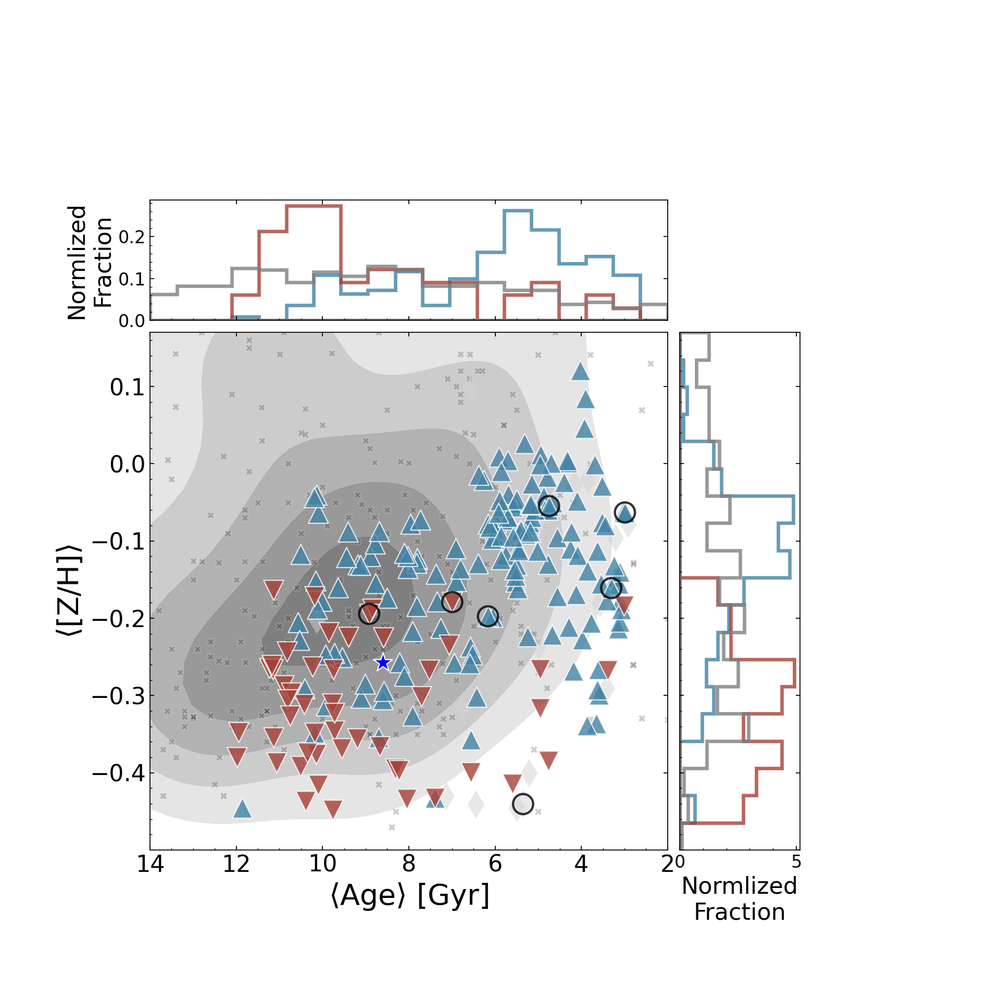

In [9]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import illustris_python as il
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib
from matplotlib.patches import Rectangle
from scipy.stats import gaussian_kde
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
from matplotlib.patches import Ellipse
from matplotlib import patheffects as path_effects
import matplotlib.cm as cm
import pandas as pd
from matplotlib.patches import Circle
from astroML.plotting import setup_text_plots
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'

# setup_text_plots(usetex=True)

def stacked_hist(ax, data, bins, orientation='vertical', colors=None, edgecolors=None, alpha=0.8):
    n = len(data)
    bottoms = np.zeros_like(bins[:-1])
    for i in range(n):
        counts, _ = np.histogram(data[i], bins=bins)
        if orientation == 'vertical':
            ax.bar(bins[:-1], counts, width=bins[1] - bins[0], bottom=bottoms, align='edge',
                   color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        else:
            ax.barh(bins[:-1], counts, height=bins[1] - bins[0], left=bottoms, align='edge',
                    color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        bottoms += counts


dex = 0.55

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

fig = plt.figure(figsize=(12, 12), dpi=160, facecolor='white')
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.80, top=0.80)
grid = plt.GridSpec(5, 5, hspace=0.1, wspace=0.1)

# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_main.tick_params(right=True, top=True)
ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
ax_right.tick_params(right=True, top=True)
ax_top = fig.add_subplot(grid[0, :-1], xticklabels=[])
ax_top.tick_params(right=True, top=True)

# ax_main.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
# ax_main.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
# ax_main.spines['top'].set_linewidth(2)  # 修改顶部轴线宽度
# ax_main.spines['right'].set_linewidth(2)  # 修改右部轴线宽度

filter_condition_TS = np.array(CSSs3['Form_Type']) == 'Tidal Stripping'
filter_condition_BSF = (np.array(CSSs3['Form_Type']) == 'Bursty Star Formation')
filter_condition_TSBSF = (np.array(CSSs3['Form_Type']) == 'TS+BSF')

ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[filter_condition_BSF], bins=np.linspace(2, 14,20), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor=grp, linestyle='-', facecolor='none', alpha=0.8, linewidth=3, density=True)

ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[filter_condition_TS], bins=np.linspace(2, 14,20), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor=cl, linestyle='-', facecolor='none', alpha=0.8, linewidth=3, density=True) 

ax_top.invert_xaxis()
ax_top.minorticks_on()

ax_right.hist(np.array(CSSs3["[Z/H]_r"])[filter_condition_BSF] - dex, bins=np.linspace(0.05-dex, 0.72-dex, 20), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, linestyle='-', facecolor='none', alpha=0.8, linewidth=3, density=True)  

ax_right.hist(np.array(CSSs3["[Z/H]_r"])[filter_condition_TS] - dex, bins=np.linspace(0.05-dex, 0.72-dex, 20), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, linestyle='-', facecolor='none', alpha=0.8, linewidth=3, density=True)
ax_right.minorticks_on()

ax_right.set_xlabel('Normlized\nFraction', fontsize=20)
ax_top.set_ylabel('Normlized\nFraction', fontsize=20)
ax_top.tick_params(axis='both', which='major', labelsize=15)
ax_right.tick_params(axis='both', which='major', labelsize=15)

########################################################################################################################
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')
Ferre2018_SSP_LW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_LW.txt', delim_whitespace=True)
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)
data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)
data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')
data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

combined_age = np.concatenate((Chilingarian2015[' age_ssp'], Ferre2018_SSP_LW['Age(Gyr)'], Ferre2018_SSP_MW['Age(Gyr)'], data_txt_guerou['Age(Gyr)'], data_txt_janz['Age(Gyr)'], data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithouthost['Age'], data_txt_rey['Age(Gyr)']), axis=0)

combined_ZH = np.concatenate((Chilingarian2015[' met_ssp'], Ferre2018_SSP_LW['[Z/H]'], Ferre2018_SSP_MW['[Z/H]'], data_txt_guerou['[Z/H]'], data_txt_janz['[Z/H]'], data_csv_kim2020_cEwithhost['ZH'], data_csv_kim2020_cEwithouthost['ZH'], data_txt_rey['[Z/H]']), axis=0)

ax_top.hist(combined_age, bins=np.linspace(2, 14,20), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor=(127/255,127/255,127/255), alpha=0.8, linestyle='-', facecolor='none', linewidth=3, density=True) 

ax_right.hist(combined_ZH, bins=np.linspace(0.05-dex, 0.72-dex, 20), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=(127/255,127/255,127/255), alpha=0.8, linestyle='-', facecolor='none', linewidth=3, density=True)

ax_right.set_ylim(0.05 - dex, 0.72 - dex)
ax_top.set_xlim(14, 2)

# ax_main.set_xlim(2, 14)
# ax_main.invert_xaxis()
# ax_main.set_ylim(0.05 - dex, 0.72 - dex)

ax_right.tick_params(axis='both', direction='in', which='both')
ax_top.tick_params(axis='both', direction='in', which='both')

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(combined_age), ~np.isnan(combined_ZH))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_age))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_ZH))
combined_age = combined_age[valid_idx]
combined_ZH = combined_ZH[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([combined_age, combined_ZH]))
xmin, ymin = combined_age.min(), combined_ZH.min()
xmax, ymax = combined_age.max(), combined_ZH.max()

xi = np.linspace(combined_age.min()-0.5, combined_age.max()+0.1, 100)
yi = np.linspace(combined_ZH.min()-0.5, combined_ZH.max()+0.5, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colormap = plt.cm.binary
colors = [(1, 1, 1, 0)] + list(colormap(np.linspace(0, 1, 10)))  # 添加白色作为最低值颜色

sm = ax_main.contourf(xi, yi, zi, levels=7, colors=colors, alpha=0.9)

# Load the data from the uploaded Excel file
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')

# Extracting the correct columns for age and metallicity
age_ssp = Chilingarian2015[' age_ssp']
age_ssp_err = Chilingarian2015[' age_ssp_err']
met_ssp = Chilingarian2015[' met_ssp']
met_ssp_err = Chilingarian2015[' met_ssp_err']

# Creating the age-metallicity diagram
# ax_main.errorbar(age_ssp, met_ssp, xerr=age_ssp_err, yerr=met_ssp_err, fmt='X', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='cEs (Chilingarian+2015)')
ax_main.scatter(age_ssp, met_ssp, alpha=0.2, marker='X', color='black', edgecolor='white', label='cEs (Chilingarian+2015)')

# Read the text file using whitespace as the delimiter
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)

# Extracting relevant data for the age-metallicity diagram
age_ssp_txt = Ferre2018_SSP_MW['Age(Gyr)']
age_ssp_err_txt = Ferre2018_SSP_MW['Age_err']
met_ssp_txt = Ferre2018_SSP_MW['[Z/H]']
met_ssp_err_txt = Ferre2018_SSP_MW['[Z/H]_err']

# Creating the age-metallicity diagram
# ax_main.errorbar(age_ssp_txt, met_ssp_txt, xerr=age_ssp_err_txt, yerr=met_ssp_err_txt, fmt='o', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='cEs (Ferre+2018)')
ax_main.scatter(age_ssp_txt, met_ssp_txt, alpha=0.2, marker='X', color='black', edgecolor='white', label='cEs (Ferre+2018)')

data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
# ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
#              xerr=[data_txt_guerou['Age_err-'], data_txt_guerou['Age_err+']], 
#              yerr=[data_txt_guerou['[Z/H]_err-'], data_txt_guerou['[Z/H]_err+']],
#              fmt='X', ecolor='black', alpha=0.2, marker='s', markerfacecolor='black', markeredgecolor='white', label='cEs (Guerou+2015)')
# ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
#              xerr=[data_txt_guerou['Age_err-'], data_txt_guerou['Age_err+']], 
#              yerr=[data_txt_guerou['[Z/H]_err-'], data_txt_guerou['[Z/H]_err+']],
#              ecolor='black', alpha=0.2, marker='s', markerfacecolor='black', markeredgecolor='white', label='cEs (Guerou+2015)')
ax_main.scatter(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'], alpha=0.2, marker='X', color='black', edgecolor='white', label='cEs (Guerou+2015)')

# Load the data from the uploaded text file
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
# ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
#              xerr=[data_txt_janz['Age_err-'], data_txt_janz['Age_err+']], 
#              yerr=data_txt_janz['[Z/H]_err'],
#              fmt='X', ecolor='black', alpha=0.2, marker='p', markerfacecolor='black', markeredgecolor='white', label='CSSs (Janz+2016)')
ax_main.scatter(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'], alpha=0.2, marker='X', color='black', edgecolor='white', label='CSSs (Janz+2016)')

data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithhost['ZH'], marker='X', color='black', alpha=0.2, edgecolor='white', label='cEs with host (Kim+2020)')

data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithouthost['Age'], data_csv_kim2020_cEwithouthost['ZH'], marker='X', color='black', alpha=0.2, edgecolor='white', label='cEs without host (Kim+2020)')

# Load the data from the uploaded text file
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram showing individual errors
# ax_main.errorbar(data_txt_rey['Age(Gyr)'], data_txt_rey['[Z/H]'],
#              xerr=[data_txt_rey['Age_err-'], data_txt_rey['Age_err+']], 
#              yerr=[data_txt_rey['[Z/H]_err-'], data_txt_rey['[Z/H]_err+']],
#              fmt='8',  # 圆形标记
#              ecolor='black', alpha=0.2, 
#              markerfacecolor='black', markeredgecolor='white', label='cEs (Rey+2021)')
ax_main.scatter(data_txt_rey['Age(Gyr)'], data_txt_rey['[Z/H]'],
             alpha=0.2, 
             color='black', marker='X', edgecolor='white', label='cEs (Rey+2021)')

########################################################################################################################

# rect2 = Rectangle((6.4, 0.1 - dex), 10.6, 0.905, linestyle='-', linewidth=4, edgecolor='none', facecolor=cl, alpha=0.3)
# ax_main.add_patch(rect2)

# rect3 = Rectangle((0, 0.1 - dex), 6.4, 0.905, linestyle='-', linewidth=4, edgecolor='none', facecolor=grp, alpha=0.3)
# ax_main.add_patch(rect3)

# 过滤条件
filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0)

# filter_condition_TS = np.array(CSSs3['Form_Type']) == 'Tidal Stripping'
# filter_condition_BSF = (np.array(CSSs3['Form_Type']) == 'Bursty Star Formation')
filter_condition_TS = (np.array(CSSs3['Form_Type']) == 'Tidal Stripping') & (np.array(CSSs3['TS_strength'] >= 0.6))
filter_condition_BSF = (np.array(CSSs3['Form_Type']) == 'Bursty Star Formation') & (np.array(CSSs3['BSF_strength'] > 0.6)) & (np.array(CSSs3['TS_strength'] < 0.6))
filter_condition_None = ((np.array(CSSs3['Form_Type']) == 'Bursty Star Formation') | (np.array(CSSs3['Form_Type']) == 'Tidal Stripping')) & (np.array(CSSs3['BSF_strength'] <= 0.6)) & (np.array(CSSs3['TS_strength'] < 0.6))
filter_condition_TSBSF = (np.array(CSSs3['Form_Type']) == 'TS+BSF')

# 设置颜色映射
cmap = cm.get_cmap('CMRmap_r')
norm = plt.Normalize(vmin=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).min(),
                     vmax=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).max())

# 创建散点图

# sc_TBD = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_TBD],
#                          np.array(CSSs3['[Z/H]_r'])[filter_condition_TBD]-dex,
#                          c='black',
#                          norm=norm, s=50, alpha=0.8, edgecolor='none', lw=1, marker='x',
#                          label='TBD')

age_BSF = 13.8 - np.concatenate((np.array(CSSs3['MWted-Age'])[filter_condition_BSF], 
                                 np.array(CSSs3['MWted-Age'])[np.array(CSSs3['ID']) == 436946], 
                                  np.array(CSSs3['MWted-Age'])[np.array(CSSs3['ID']) == 275692]),axis=0)
ZH_BSF = np.concatenate((np.array(CSSs3['[Z/H]_r'])[filter_condition_BSF],
                         np.array(CSSs3['[Z/H]_r'])[np.array(CSSs3['ID']) == 436946], 
                            np.array(CSSs3['[Z/H]_r'])[np.array(CSSs3['ID']) == 275692]),axis=0) -dex

age_TS = 13.8 - np.concatenate((np.array(CSSs3['MWted-Age'])[filter_condition_TS], 
                                 np.array(CSSs3['MWted-Age'])[np.array(CSSs3['ID']) == 410046], 
                                  np.array(CSSs3['MWted-Age'])[np.array(CSSs3['ID']) == 220728]),axis=0)
ZH_TS = np.concatenate((np.array(CSSs3['[Z/H]_r'])[filter_condition_TS],
                         np.array(CSSs3['[Z/H]_r'])[np.array(CSSs3['ID']) == 410046], 
                            np.array(CSSs3['[Z/H]_r'])[np.array(CSSs3['ID']) == 220728]),axis=0) -dex

sc_None = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_None],
                        np.array(CSSs3['[Z/H]_r'])[filter_condition_None]-dex,
                        c='lightgrey', 
                        norm=norm, s=300, alpha=0.5, edgecolor='None', lw=1, marker='d',
                        label='NoneType')

# 绘制散点图 - Bursty Star Formation
sc_BSF = ax_main.scatter(age_BSF,
                         ZH_BSF,
                         c=grp,
                         norm=norm, s=300, alpha=0.8, edgecolor='white', lw=1, marker='^',
                         label='Bursty Star Formation')

sc_TS = ax_main.scatter(age_TS,
                        ZH_TS,
                        c=cl, 
                        norm=norm, s=300, alpha=0.8, edgecolor='white', lw=1, marker='v',
                        label='Tidal Stripping')

# highlight_ids = [349, 494, 617, 798, 96886, 307581, 324185, 345894, 414930, 433311]
highlight_ids = [386288, 414930, 430876, 436946, 439101, 448833, 475019]

CSSs3['highlight1'] = CSSs3['ID'].isin(highlight_ids)

# 绘制高亮点
highlighted = CSSs3[CSSs3['highlight1']]
ax_main.scatter(13.8 - highlighted['MWted-Age'], 
                highlighted['[Z/H]_r'] - dex, 
                c='none', # 根据需要设置
                s=300, alpha=0.8, edgecolor='black', lw=2) # 根据需要设置

# for ID in highlight_ids:
#     # Extract rows corresponding to the IDs you want to highlight
#     row = CSSs3[CSSs3['ID'] == ID]
    
#     if not row.empty:  # If the ID is found in the DataFrame
#         age = 13.8 - row['MWted-Age'].values[0]
#         z_h = row['[Z/H]_r'].values[0] - dex
        
#         # Annotate the plot with the ID
#         ax_main.annotate(str(ID), (age, z_h), textcoords="offset points", xytext=(5,5), ha='right', fontsize=9, color='black')

# highlight_ids = [494, 96886, 414930]

# CSSs3['highlight2'] = CSSs3['ID'].isin(highlight_ids)

# # 绘制高亮点
# highlighted = CSSs3[CSSs3['highlight2']]
# ax_main.scatter(13.8 - highlighted['MWted-Age'], 
#                 highlighted['[Z/H]_r'] - dex, 
#                 c='none', # 根据需要设置
#                 s=300, alpha=0.8, edgecolor='orange', lw=1) # 根据需要设置

# for ID in highlight_ids:
#     # Extract rows corresponding to the IDs you want to highlight
#     row = CSSs3[CSSs3['ID'] == ID]
    
#     if not row.empty:  # If the ID is found in the DataFrame
#         age = 13.8 - row['MWted-Age'].values[0]
#         z_h = row['[Z/H]_r'].values[0] - dex
        
#         # Annotate the plot with the ID
#         ax_main.annotate(str(ID), (age, z_h), textcoords="offset points", xytext=(5,5), ha='right', fontsize=9, color='orange')

# highlight_ids = [414930]

# CSSs3['highlight3'] = CSSs3['ID'].isin(highlight_ids)

# # 绘制高亮点
# highlighted = CSSs3[CSSs3['highlight3']]
# ax_main.scatter(13.8 - highlighted['MWted-Age'], 
#                 highlighted['[Z/H]_r'] - dex, 
#                 c='none', # 根据需要设置
#                 s=300, alpha=0.8, edgecolor='red', lw=1) # 根据需要设置

# for ID in highlight_ids:
#     # Extract rows corresponding to the IDs you want to highlight
#     row = CSSs3[CSSs3['ID'] == ID]
    
#     if not row.empty:  # If the ID is found in the DataFrame
#         age = 13.8 - row['MWted-Age'].values[0]
#         z_h = row['[Z/H]_r'].values[0] - dex
        
#         # Annotate the plot with the ID
#         ax_main.annotate(str(ID), (age, z_h), textcoords="offset points", xytext=(5,5), ha='right', fontsize=9, color='red')

# sc_TSBSF = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_TSBSF],
#                          np.array(CSSs3['[Z/H]_r'])[filter_condition_TSBSF]-dex,
#                          c='purple',
#                          norm=norm, s=300, alpha=0.8, edgecolor='white', lw=1, marker='h',
#                          label='TS+BSF')

# # 过滤条件
# filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.array(CSSs3['[Z/H]_r']) >= 0.0) & (np.array(CSSs3['Form_Type']) != 'in-situ')

# sc = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition],
#                      np.array(CSSs3['[Z/H]_r'])[filter_condition]-dex,
#                      c=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]),
#                      cmap=cmap, norm=norm, s=300, alpha=0.8, edgecolor='none', lw=2)

# cbar_ax = fig.add_axes([0.7, 0.15, 0.03, 0.52])  # 参数为[x, y, width, height]，需要根据你的布局进行调整
# cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax_main, cax=cbar_ax)
# cbar.set_label(r'$\log_{10}(1+\delta_{5} \, [M_{*,\mathrm{nbg}} \geq 10^{8} \, M_{\odot}])$', fontsize=20)

# cbar.ax.tick_params(labelsize=15)  # 调整刻度大小

ax_main.scatter(8.6,-0.257, s=300, marker='*', edgecolor='white', color='blue')

# text = ax_main.annotate('M32', (8.6, -0.257), textcoords="offset points", xytext=(2,2), fontsize=15, color='blue')

# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

print(len(np.array(CSSs3['[Z/H]_r'])[filter_condition_BSF]), len(np.array(CSSs3['[Z/H]_r'])[filter_condition_TS]))

# 反转x轴
ax_main.invert_xaxis()
ax_main.minorticks_on()
ax_main.tick_params(axis='both', direction='in', which='both')

# ax_main.tick_params(axis='x', direction='in')
# ax_main.tick_params(axis='y', direction='in')
ax_main.set_xlim(2, 14)
ax_main.invert_xaxis()
ax_main.set_ylim(0.05 - dex + 1e-5, 0.72 - dex)
ax_main.set_xlabel(r'$\langle \mathrm{Age}\rangle$ [Gyr]', fontsize=25)
ax_main.set_ylabel(r'$\langle \mathrm{[Z/H]} \rangle$', fontsize=25)
ax_main.tick_params(axis='both', which='major', labelsize=20)
plt.rcParams['legend.fontsize'] = 20

total_legend_items = 11
ncol = (total_legend_items + 1) // 2  # 使用 // 实现整数除法
plt.savefig('/home/bianyuan/workspace/pic/Age_Z_3'+'.pdf')

/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/tmp/ipykernel_135513/3114160604.py:244: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('CMRmap_r')
/tmp/ipykernel_135513/3114160604.py:263: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value 

173 54


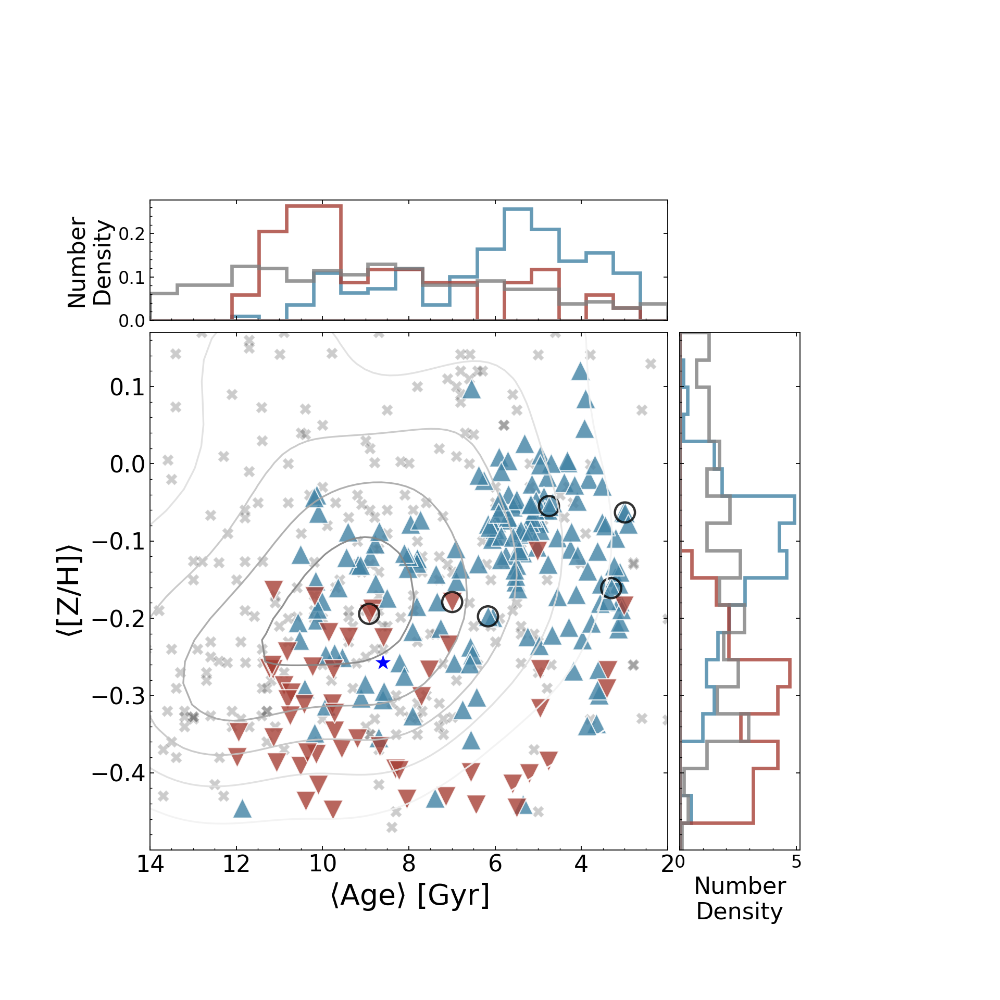

In [39]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import illustris_python as il
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib
from matplotlib.patches import Rectangle
from scipy.stats import gaussian_kde
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
from matplotlib.patches import Ellipse
from matplotlib import patheffects as path_effects
import matplotlib.cm as cm
import pandas as pd
from matplotlib.patches import Circle
from astroML.plotting import setup_text_plots
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'

# setup_text_plots(usetex=True)

def stacked_hist(ax, data, bins, orientation='vertical', colors=None, edgecolors=None, alpha=0.8):
    n = len(data)
    bottoms = np.zeros_like(bins[:-1])
    for i in range(n):
        counts, _ = np.histogram(data[i], bins=bins)
        if orientation == 'vertical':
            ax.bar(bins[:-1], counts, width=bins[1] - bins[0], bottom=bottoms, align='edge',
                   color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        else:
            ax.barh(bins[:-1], counts, height=bins[1] - bins[0], left=bottoms, align='edge',
                    color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        bottoms += counts


dex = 0.55

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

fig = plt.figure(figsize=(12, 12), dpi=160, facecolor='white')
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.80, top=0.80)
grid = plt.GridSpec(5, 5, hspace=0.1, wspace=0.1)

# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_main.tick_params(right=True, top=True)
ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
ax_right.tick_params(right=True, top=True)
ax_top = fig.add_subplot(grid[0, :-1], xticklabels=[])
ax_top.tick_params(right=True, top=True)

# ax_main.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
# ax_main.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
# ax_main.spines['top'].set_linewidth(2)  # 修改顶部轴线宽度
# ax_main.spines['right'].set_linewidth(2)  # 修改右部轴线宽度

filter_condition_TS = np.array(CSSs3['Form_Type']) == 'Tidal Stripping'
filter_condition_BSF = np.array(CSSs3['Form_Type']) == 'Bursty Star Formation'
filter_condition_TSBSF = (np.array(CSSs3['Form_Type']) == 'TS+BSF')

ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[filter_condition_BSF], bins=np.linspace(2, 14,20), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor=grp, linestyle='-', facecolor='none', alpha=0.8, linewidth=3, density=True)

ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[filter_condition_TS], bins=np.linspace(2, 14,20), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor=cl, linestyle='-', facecolor='none', alpha=0.8, linewidth=3, density=True) 

ax_top.invert_xaxis()
ax_top.minorticks_on()

ax_right.hist(np.array(CSSs3["[Z/H]_r"])[filter_condition_BSF] - dex, bins=np.linspace(0.05-dex, 0.72-dex, 20), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=grp, linestyle='-', facecolor='none', alpha=0.8, linewidth=3, density=True)  

ax_right.hist(np.array(CSSs3["[Z/H]_r"])[filter_condition_TS] - dex, bins=np.linspace(0.05-dex, 0.72-dex, 20), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=cl, linestyle='-', facecolor='none', alpha=0.8, linewidth=3, density=True)
ax_right.minorticks_on()

ax_right.set_xlabel('Number\nDensity', fontsize=20)
ax_top.set_ylabel('Number\nDensity', fontsize=20)
ax_top.tick_params(axis='both', which='major', labelsize=15)
ax_right.tick_params(axis='both', which='major', labelsize=15)

########################################################################################################################
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')
Ferre2018_SSP_LW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_LW.txt', delim_whitespace=True)
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)
data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)
data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')
data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

combined_age = np.concatenate((Chilingarian2015[' age_ssp'], Ferre2018_SSP_LW['Age(Gyr)'], Ferre2018_SSP_MW['Age(Gyr)'], data_txt_guerou['Age(Gyr)'], data_txt_janz['Age(Gyr)'], data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithouthost['Age'], data_txt_rey['Age(Gyr)']), axis=0)

combined_ZH = np.concatenate((Chilingarian2015[' met_ssp'], Ferre2018_SSP_LW['[Z/H]'], Ferre2018_SSP_MW['[Z/H]'], data_txt_guerou['[Z/H]'], data_txt_janz['[Z/H]'], data_csv_kim2020_cEwithhost['ZH'], data_csv_kim2020_cEwithouthost['ZH'], data_txt_rey['[Z/H]']), axis=0)

ax_top.hist(combined_age, bins=np.linspace(2, 14,20), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor=(127/255,127/255,127/255), alpha=0.8, linestyle='-', facecolor='none', linewidth=3, density=True) 

ax_right.hist(combined_ZH, bins=np.linspace(0.05-dex, 0.72-dex, 20), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor=(127/255,127/255,127/255), alpha=0.8, linestyle='-', facecolor='none', linewidth=3, density=True)

ax_right.set_ylim(0.05 - dex, 0.72 - dex)
ax_top.set_xlim(14, 2)

# ax_main.set_xlim(2, 14)
# ax_main.invert_xaxis()
# ax_main.set_ylim(0.05 - dex, 0.72 - dex)

ax_right.tick_params(axis='both', direction='in', which='both')
ax_top.tick_params(axis='both', direction='in', which='both')

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(combined_age), ~np.isnan(combined_ZH))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_age))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_ZH))
combined_age = combined_age[valid_idx]
combined_ZH = combined_ZH[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([combined_age, combined_ZH]))
xmin, ymin = combined_age.min(), combined_ZH.min()
xmax, ymax = combined_age.max(), combined_ZH.max()

xi = np.linspace(combined_age.min()-0.5, combined_age.max()+0.1, 100)
yi = np.linspace(combined_ZH.min()-0.5, combined_ZH.max()+0.5, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colormap = plt.cm.Greys
colors = [(1, 1, 1, 0)] + list(colormap(np.linspace(0, 1, 10)))  # 添加白色作为最低值颜色

sm = ax_main.contour(xi, yi, zi, levels=7, colors=colors, alpha=0.9)

# Load the data from the uploaded Excel file
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')

# Extracting the correct columns for age and metallicity
age_ssp = Chilingarian2015[' age_ssp']
age_ssp_err = Chilingarian2015[' age_ssp_err']
met_ssp = Chilingarian2015[' met_ssp']
met_ssp_err = Chilingarian2015[' met_ssp_err']

# Creating the age-metallicity diagram
# ax_main.errorbar(age_ssp, met_ssp, xerr=age_ssp_err, yerr=met_ssp_err, fmt='X', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='cEs (Chilingarian+2015)')
ax_main.scatter(age_ssp, met_ssp, alpha=0.2, marker='X', color='black', edgecolor='white', label='cEs (Chilingarian+2015)', s=100)

# Read the text file using whitespace as the delimiter
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)

# Extracting relevant data for the age-metallicity diagram
age_ssp_txt = Ferre2018_SSP_MW['Age(Gyr)']
age_ssp_err_txt = Ferre2018_SSP_MW['Age_err']
met_ssp_txt = Ferre2018_SSP_MW['[Z/H]']
met_ssp_err_txt = Ferre2018_SSP_MW['[Z/H]_err']

# Creating the age-metallicity diagram
# ax_main.errorbar(age_ssp_txt, met_ssp_txt, xerr=age_ssp_err_txt, yerr=met_ssp_err_txt, fmt='o', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='cEs (Ferre+2018)')
ax_main.scatter(age_ssp_txt, met_ssp_txt, alpha=0.2, marker='X', color='black', edgecolor='white', label='cEs (Ferre+2018)', s=100)

data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
# ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
#              xerr=[data_txt_guerou['Age_err-'], data_txt_guerou['Age_err+']], 
#              yerr=[data_txt_guerou['[Z/H]_err-'], data_txt_guerou['[Z/H]_err+']],
#              fmt='X', ecolor='black', alpha=0.2, marker='s', markerfacecolor='black', markeredgecolor='white', label='cEs (Guerou+2015)')
# ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
#              xerr=[data_txt_guerou['Age_err-'], data_txt_guerou['Age_err+']], 
#              yerr=[data_txt_guerou['[Z/H]_err-'], data_txt_guerou['[Z/H]_err+']],
#              ecolor='black', alpha=0.2, marker='s', markerfacecolor='black', markeredgecolor='white', label='cEs (Guerou+2015)')
ax_main.scatter(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'], alpha=0.2, marker='X', color='black', edgecolor='white', label='cEs (Guerou+2015)', s=100)

# Load the data from the uploaded text file
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
# ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
#              xerr=[data_txt_janz['Age_err-'], data_txt_janz['Age_err+']], 
#              yerr=data_txt_janz['[Z/H]_err'],
#              fmt='X', ecolor='black', alpha=0.2, marker='p', markerfacecolor='black', markeredgecolor='white', label='CSSs (Janz+2016)')
ax_main.scatter(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'], alpha=0.2, marker='X', color='black', edgecolor='white', label='CSSs (Janz+2016)', s=100)

data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithhost['ZH'], marker='X', color='black', alpha=0.2, edgecolor='white', label='cEs with host (Kim+2020)', s=100)

data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithouthost['Age'], data_csv_kim2020_cEwithouthost['ZH'], marker='X', color='black', alpha=0.2, edgecolor='white', label='cEs without host (Kim+2020)', s=100)

# Load the data from the uploaded text file
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram showing individual errors
# ax_main.errorbar(data_txt_rey['Age(Gyr)'], data_txt_rey['[Z/H]'],
#              xerr=[data_txt_rey['Age_err-'], data_txt_rey['Age_err+']], 
#              yerr=[data_txt_rey['[Z/H]_err-'], data_txt_rey['[Z/H]_err+']],
#              fmt='8',  # 圆形标记
#              ecolor='black', alpha=0.2, 
#              markerfacecolor='black', markeredgecolor='white', label='cEs (Rey+2021)')
ax_main.scatter(data_txt_rey['Age(Gyr)'], data_txt_rey['[Z/H]'],
             alpha=0.2, 
             color='black', marker='X', edgecolor='white', label='cEs (Rey+2021)', s=100)

########################################################################################################################

# rect2 = Rectangle((6.4, 0.1 - dex), 10.6, 0.905, linestyle='-', linewidth=4, edgecolor='none', facecolor=cl, alpha=0.3)
# ax_main.add_patch(rect2)

# rect3 = Rectangle((0, 0.1 - dex), 6.4, 0.905, linestyle='-', linewidth=4, edgecolor='none', facecolor=grp, alpha=0.3)
# ax_main.add_patch(rect3)

# 过滤条件
filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0)

# filter_condition_TS = np.array(CSSs3['Form_Type']) == 'Tidal Stripping'
# filter_condition_BSF = (np.array(CSSs3['Form_Type']) == 'Bursty Star Formation')
filter_condition_TS = (np.array(CSSs3['Form_Type']) == 'Tidal Stripping')
filter_condition_BSF = (np.array(CSSs3['Form_Type']) == 'Bursty Star Formation')

# 设置颜色映射
cmap = cm.get_cmap('CMRmap_r')
norm = plt.Normalize(vmin=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).min(),
                     vmax=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).max())

# 创建散点图

# sc_TBD = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_TBD],
#                          np.array(CSSs3['[Z/H]_r'])[filter_condition_TBD]-dex,
#                          c='black',
#                          norm=norm, s=50, alpha=0.8, edgecolor='none', lw=1, marker='x',
#                          label='TBD')

age_BSF = 13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_BSF]
ZH_BSF = np.array(CSSs3['[Z/H]_r'])[filter_condition_BSF] -dex

age_TS = 13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_TS]
ZH_TS = np.array(CSSs3['[Z/H]_r'])[filter_condition_TS] -dex

# 绘制散点图 - Bursty Star Formation
sc_BSF = ax_main.scatter(age_BSF,
                         ZH_BSF,
                         c=grp,
                         norm=norm, s=300, alpha=0.8, edgecolor='white', lw=1, marker='^',
                         label='Bursty Star Formation')

sc_TS = ax_main.scatter(age_TS,
                        ZH_TS,
                        c=cl, 
                        norm=norm, s=300, alpha=0.8, edgecolor='white', lw=1, marker='v',
                        label='Tidal Stripping')

# highlight_ids = [349, 494, 617, 798, 96886, 307581, 324185, 345894, 414930, 433311]
highlight_ids = [386288, 414930, 430876, 436946, 448833, 475019]

CSSs3['highlight1'] = CSSs3['ID'].isin(highlight_ids)

# 绘制高亮点
highlighted = CSSs3[CSSs3['highlight1']]
ax_main.scatter(13.8 - highlighted['MWted-Age'], 
                highlighted['[Z/H]_r'] - dex, 
                c='none', # 根据需要设置
                s=300, alpha=0.8, edgecolor='black', lw=2) # 根据需要设置

# for ID in highlight_ids:
#     # Extract rows corresponding to the IDs you want to highlight
#     row = CSSs3[CSSs3['ID'] == ID]
    
#     if not row.empty:  # If the ID is found in the DataFrame
#         age = 13.8 - row['MWted-Age'].values[0]
#         z_h = row['[Z/H]_r'].values[0] - dex
        
#         # Annotate the plot with the ID
#         ax_main.annotate(str(ID), (age, z_h), textcoords="offset points", xytext=(5,5), ha='right', fontsize=9, color='black')

# highlight_ids = [494, 96886, 414930]

# CSSs3['highlight2'] = CSSs3['ID'].isin(highlight_ids)

# # 绘制高亮点
# highlighted = CSSs3[CSSs3['highlight2']]
# ax_main.scatter(13.8 - highlighted['MWted-Age'], 
#                 highlighted['[Z/H]_r'] - dex, 
#                 c='none', # 根据需要设置
#                 s=300, alpha=0.8, edgecolor='orange', lw=1) # 根据需要设置

# for ID in highlight_ids:
#     # Extract rows corresponding to the IDs you want to highlight
#     row = CSSs3[CSSs3['ID'] == ID]
    
#     if not row.empty:  # If the ID is found in the DataFrame
#         age = 13.8 - row['MWted-Age'].values[0]
#         z_h = row['[Z/H]_r'].values[0] - dex
        
#         # Annotate the plot with the ID
#         ax_main.annotate(str(ID), (age, z_h), textcoords="offset points", xytext=(5,5), ha='right', fontsize=9, color='orange')

# highlight_ids = [414930]

# CSSs3['highlight3'] = CSSs3['ID'].isin(highlight_ids)

# # 绘制高亮点
# highlighted = CSSs3[CSSs3['highlight3']]
# ax_main.scatter(13.8 - highlighted['MWted-Age'], 
#                 highlighted['[Z/H]_r'] - dex, 
#                 c='none', # 根据需要设置
#                 s=300, alpha=0.8, edgecolor='red', lw=1) # 根据需要设置

# for ID in highlight_ids:
#     # Extract rows corresponding to the IDs you want to highlight
#     row = CSSs3[CSSs3['ID'] == ID]
    
#     if not row.empty:  # If the ID is found in the DataFrame
#         age = 13.8 - row['MWted-Age'].values[0]
#         z_h = row['[Z/H]_r'].values[0] - dex
        
#         # Annotate the plot with the ID
#         ax_main.annotate(str(ID), (age, z_h), textcoords="offset points", xytext=(5,5), ha='right', fontsize=9, color='red')

# sc_TSBSF = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_TSBSF],
#                          np.array(CSSs3['[Z/H]_r'])[filter_condition_TSBSF]-dex,
#                          c='purple',
#                          norm=norm, s=300, alpha=0.8, edgecolor='white', lw=1, marker='h',
#                          label='TS+BSF')

# # 过滤条件
# filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.array(CSSs3['[Z/H]_r']) >= 0.0) & (np.array(CSSs3['Form_Type']) != 'in-situ')

# sc = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition],
#                      np.array(CSSs3['[Z/H]_r'])[filter_condition]-dex,
#                      c=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]),
#                      cmap=cmap, norm=norm, s=300, alpha=0.8, edgecolor='none', lw=2)

# cbar_ax = fig.add_axes([0.7, 0.15, 0.03, 0.52])  # 参数为[x, y, width, height]，需要根据你的布局进行调整
# cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax_main, cax=cbar_ax)
# cbar.set_label(r'$\log_{10}(1+\delta_{5} \, [M_{*,\mathrm{nbg}} \geq 10^{8} \, M_{\odot}])$', fontsize=20)

# cbar.ax.tick_params(labelsize=15)  # 调整刻度大小

ax_main.scatter(8.6,-0.257, s=300, marker='*', edgecolor='white', color='blue')

# text = ax_main.annotate('M32', (8.6, -0.257), textcoords="offset points", xytext=(2,2), fontsize=15, color='blue')

# text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

print(len(np.array(CSSs3['[Z/H]_r'])[filter_condition_BSF]), len(np.array(CSSs3['[Z/H]_r'])[filter_condition_TS]))

# 反转x轴
ax_main.invert_xaxis()
ax_main.minorticks_on()
ax_main.tick_params(axis='both', direction='in', which='both')

# ax_main.tick_params(axis='x', direction='in')
# ax_main.tick_params(axis='y', direction='in')
ax_main.set_xlim(2, 14)
ax_main.invert_xaxis()
ax_main.set_ylim(0.05 - dex + 1e-5, 0.72 - dex)
ax_main.set_xlabel(r'$\langle \mathrm{Age}\rangle$ [Gyr]', fontsize=25)
ax_main.set_ylabel(r'$\langle \mathrm{[Z/H]} \rangle$', fontsize=25)
ax_main.tick_params(axis='both', which='major', labelsize=20)
plt.rcParams['legend.fontsize'] = 20

total_legend_items = 11
ncol = (total_legend_items + 1) // 2  # 使用 // 实现整数除法
plt.savefig('/home/bianyuan/workspace/pic/Age_Z_3'+'.pdf')

In [37]:
print(len(np.array(CSSs3['ID'])[filter_condition_TS]))

64


/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/home/bianyuan/.conda/envs/py310/lib/python3.10/site-packages/openpyxl/worksheet/_reader.py:329: UserWarning: Unknown extension is not supported and will be removed
  warn(msg)
/tmp/ipykernel_834957/932710932.py:136: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "X" (-> marker='X'). The keyword argument will take precedence.
  ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
/tmp/ipykernel_834957/932710932.py:145: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "X" (-> marker='X'). The keyword argument will take precedence.
  ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
/tmp/ipykernel_834957/932710932.py:187: MatplotlibDeprecationWarning: The get_cmap function was deprecat

155 79


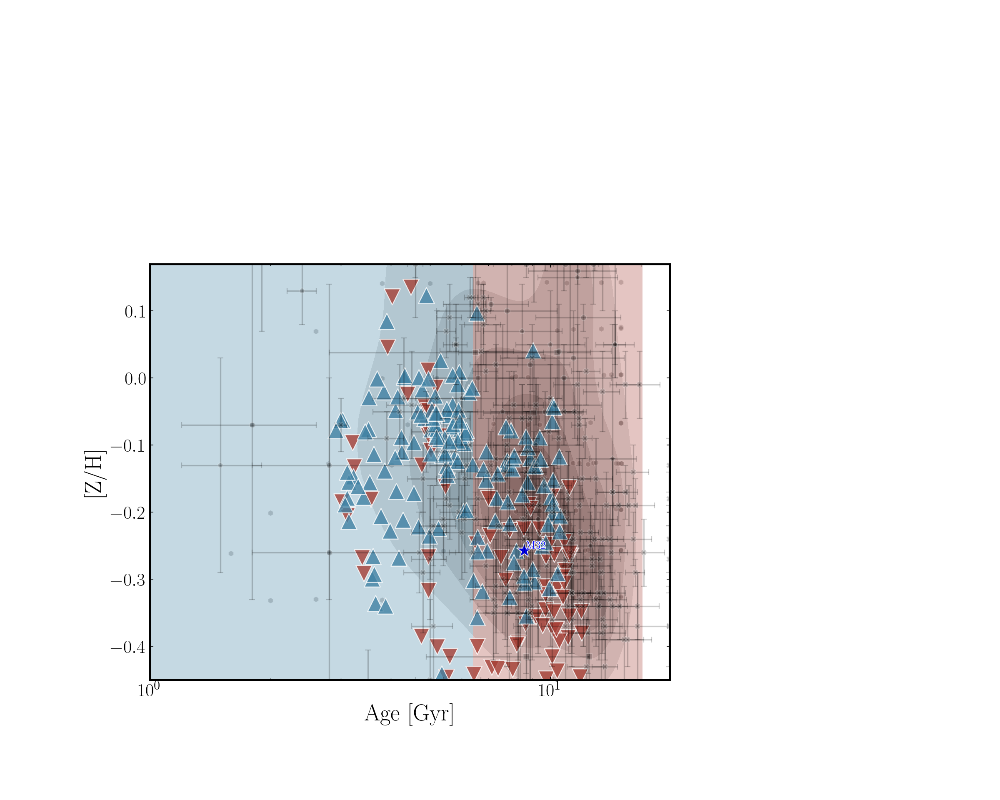

In [5]:
%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import illustris_python as il
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib
from matplotlib.patches import Rectangle
from scipy.stats import gaussian_kde
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
from matplotlib.patches import Ellipse
from matplotlib import patheffects as path_effects
import matplotlib.cm as cm
import pandas as pd
from astroML.plotting import setup_text_plots
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'

setup_text_plots(usetex=True)

def stacked_hist(ax, data, bins, orientation='vertical', colors=None, edgecolors=None, alpha=0.8):
    n = len(data)
    bottoms = np.zeros_like(bins[:-1])
    for i in range(n):
        counts, _ = np.histogram(data[i], bins=bins)
        if orientation == 'vertical':
            ax.bar(bins[:-1], counts, width=bins[1] - bins[0], bottom=bottoms, align='edge',
                   color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        else:
            ax.barh(bins[:-1], counts, height=bins[1] - bins[0], left=bottoms, align='edge',
                    color=colors[i], edgecolor=edgecolors[i], alpha=alpha)
        bottoms += counts


dex = 0.55

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
Normal_Dwarf = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

fig = plt.figure(figsize=(15, 12), dpi=160, facecolor='white')
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.80, top=0.80)
grid = plt.GridSpec(5, 5, hspace=0, wspace=0)

# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])

ax_main.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
ax_main.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
ax_main.spines['top'].set_linewidth(2)  # 修改顶部轴线宽度
ax_main.spines['right'].set_linewidth(2)  # 修改右部轴线宽度


########################################################################################################################
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')
Ferre2018_SSP_LW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_LW.txt', delim_whitespace=True)
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)
data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)
data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')
data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

combined_age = np.concatenate((Chilingarian2015[' age_ssp'], Ferre2018_SSP_LW['Age(Gyr)'], Ferre2018_SSP_MW['Age(Gyr)'], data_txt_guerou['Age(Gyr)'], data_txt_janz['Age(Gyr)'], data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithouthost['Age'], data_txt_rey['Age(Gyr)']), axis=0)

combined_ZH = np.concatenate((Chilingarian2015[' met_ssp'], Ferre2018_SSP_LW['[Z/H]'], Ferre2018_SSP_MW['[Z/H]'], data_txt_guerou['[Z/H]'], data_txt_janz['[Z/H]'], data_csv_kim2020_cEwithhost['ZH'], data_csv_kim2020_cEwithouthost['ZH'], data_txt_rey['[Z/H]']), axis=0)


# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(combined_age), ~np.isnan(combined_ZH))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_age))
valid_idx = np.logical_and(valid_idx, ~np.isinf(combined_ZH))
combined_age = combined_age[valid_idx]
combined_ZH = combined_ZH[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([combined_age, combined_ZH]))
xmin, ymin = combined_age.min(), combined_ZH.min()
xmax, ymax = combined_age.max(), combined_ZH.max()

xi = np.linspace(combined_age.min()-0.5, combined_age.max()+0.1, 100)
yi = np.linspace(combined_ZH.min()-0.5, combined_ZH.max()+0.5, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colormap = plt.cm.binary
colors = [(1, 1, 1, 0)] + list(colormap(np.linspace(0, 1, 10)))  # 添加白色作为最低值颜色

sm = ax_main.contourf(xi, yi, zi, levels=7, colors=colors, alpha=0.9)

# Load the data from the uploaded Excel file
Chilingarian2015 = pd.read_excel('/home/bianyuan/workspace/data/observations/aaa3344_Chilingarian_TableS1.xlsx')

# Extracting the correct columns for age and metallicity
age_ssp = Chilingarian2015[' age_ssp']
age_ssp_err = Chilingarian2015[' age_ssp_err']
met_ssp = Chilingarian2015[' met_ssp']
met_ssp_err = Chilingarian2015[' met_ssp_err']

# Creating the age-metallicity diagram
ax_main.errorbar(age_ssp, met_ssp, xerr=age_ssp_err, yerr=met_ssp_err, fmt='X', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='cEs (Chilingarian+2015)')

# Read the text file using whitespace as the delimiter
Ferre2018_SSP_MW = pd.read_csv('/home/bianyuan/workspace/data/observations/Ferre2018_SSP_MW.txt', delim_whitespace=True)

# Extracting relevant data for the age-metallicity diagram
age_ssp_txt = Ferre2018_SSP_MW['Age(Gyr)']
age_ssp_err_txt = Ferre2018_SSP_MW['Age_err']
met_ssp_txt = Ferre2018_SSP_MW['[Z/H]']
met_ssp_err_txt = Ferre2018_SSP_MW['[Z/H]_err']

# Creating the age-metallicity diagram
ax_main.errorbar(age_ssp_txt, met_ssp_txt, xerr=age_ssp_err_txt, yerr=met_ssp_err_txt, fmt='o', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='cEs (Ferre+2018)')

data_txt_guerou = pd.read_csv('/home/bianyuan/workspace/data/observations/Guerou2015_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
ax_main.errorbar(data_txt_guerou['Age(Gyr)'], data_txt_guerou['[Z/H]'],
             xerr=[data_txt_guerou['Age_err-'], data_txt_guerou['Age_err+']], 
             yerr=[data_txt_guerou['[Z/H]_err-'], data_txt_guerou['[Z/H]_err+']],
             fmt='X', ecolor='black', alpha=0.2, marker='s', markerfacecolor='black', markeredgecolor='white', label='cEs (Guerou+2015)')

# Load the data from the uploaded text file
data_txt_janz = pd.read_csv('/home/bianyuan/workspace/data/observations/Janz2016_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram without averaging the errors
ax_main.errorbar(data_txt_janz['Age(Gyr)'], data_txt_janz['[Z/H]'],
             xerr=[data_txt_janz['Age_err-'], data_txt_janz['Age_err+']], 
             yerr=data_txt_janz['[Z/H]_err'],
             fmt='X', ecolor='black', alpha=0.2, marker='p', markerfacecolor='black', markeredgecolor='white', label='CSSs (Janz+2016)')

data_csv_kim2020_cEwithhost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithhost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithhost['Age'], data_csv_kim2020_cEwithhost['ZH'], marker='h', color='black', alpha=0.2, edgecolor='white', label='cEs with host (Kim+2020)')

data_csv_kim2020_cEwithouthost = pd.read_csv('/home/bianyuan/workspace/data/observations/Kim2020_cEwithouthost_SSP.csv')

# Plotting the age-metallicity diagram without errors
ax_main.scatter(data_csv_kim2020_cEwithouthost['Age'], data_csv_kim2020_cEwithouthost['ZH'], marker='h', color='black', alpha=0.2, edgecolor='white', label='cEs without host (Kim+2020)')

# Load the data from the uploaded text file
data_txt_rey = pd.read_csv('/home/bianyuan/workspace/data/observations/Rey2021_SSP.txt', delim_whitespace=True)

# Creating the age-metallicity diagram showing individual errors
ax_main.errorbar(data_txt_rey['Age(Gyr)'], data_txt_rey['[Z/H]'],
             xerr=[data_txt_rey['Age_err-'], data_txt_rey['Age_err+']], 
             yerr=[data_txt_rey['[Z/H]_err-'], data_txt_rey['[Z/H]_err+']],
             fmt='8',  # 圆形标记
             ecolor='black', alpha=0.2, 
             markerfacecolor='black', markeredgecolor='white', label='cEs (Rey+2021)')

########################################################################################################################

rect2 = Rectangle((6.4, 0.1 - dex), 10.6, 0.905, linestyle='-', linewidth=4, edgecolor='none', facecolor=cl, alpha=0.3)
ax_main.add_patch(rect2)

rect3 = Rectangle((0, 0.1 - dex), 6.4, 0.905, linestyle='-', linewidth=4, edgecolor='none', facecolor=grp, alpha=0.3)
ax_main.add_patch(rect3)

# 过滤条件
filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0)

filter_condition_TS = np.array(CSSs3['Form_Type']) == 'Tidal Stripping'
filter_condition_BSF = (np.array(CSSs3['Form_Type']) == 'Bursty Star Formation')
filter_condition_TSBSF = (np.array(CSSs3['Form_Type']) == 'TS+BSF')

# 设置颜色映射
cmap = cm.get_cmap('CMRmap_r')
norm = plt.Normalize(vmin=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).min(),
                     vmax=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]).max())

# 创建散点图

# sc_TBD = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_TBD],
#                          np.array(CSSs3['[Z/H]_r'])[filter_condition_TBD]-dex,
#                          c='black',
#                          norm=norm, s=50, alpha=0.8, edgecolor='none', lw=1, marker='x',
#                          label='TBD')

sc_TS = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_TS],
                        np.array(CSSs3['[Z/H]_r'])[filter_condition_TS]-dex,
                        c=cl, 
                        norm=norm, s=300, alpha=0.8, edgecolor='white', lw=1, marker='v',
                        label='Tidal Stripping')

# 绘制散点图 - Bursty Star Formation
sc_BSF = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_BSF],
                         np.array(CSSs3['[Z/H]_r'])[filter_condition_BSF]-dex,
                         c=grp,
                         norm=norm, s=300, alpha=0.8, edgecolor='white', lw=1, marker='^',
                         label='Bursty Star Formation')

# sc_TSBSF = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition_TSBSF],
#                          np.array(CSSs3['[Z/H]_r'])[filter_condition_TSBSF]-dex,
#                          c='purple',
#                          norm=norm, s=300, alpha=0.8, edgecolor='white', lw=1, marker='h',
#                          label='TS+BSF')

# # 过滤条件
# filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.array(CSSs3['[Z/H]_r']) >= 0.0) & (np.array(CSSs3['Form_Type']) != 'in-situ')

# sc = ax_main.scatter(13.8 - np.array(CSSs3['MWted-Age'])[filter_condition],
#                      np.array(CSSs3['[Z/H]_r'])[filter_condition]-dex,
#                      c=np.log10(np.array(CSSs3['Overdensity'])[filter_condition]),
#                      cmap=cmap, norm=norm, s=300, alpha=0.8, edgecolor='none', lw=2)

# cbar_ax = fig.add_axes([0.7, 0.15, 0.03, 0.52])  # 参数为[x, y, width, height]，需要根据你的布局进行调整
# cbar = plt.colorbar(cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax_main, cax=cbar_ax)
# cbar.set_label(r'$\log_{10}(1+\delta_{5} \, [M_{*,\mathrm{nbg}} \geq 10^{8} \, M_{\odot}])$', fontsize=20)

# cbar.ax.tick_params(labelsize=15)  # 调整刻度大小

ax_main.scatter(8.6,-0.257, s=300, marker='*', edgecolor='white', color='blue')

text = ax_main.annotate('M32', (8.6, -0.257), textcoords="offset points", xytext=(2,2), fontsize=12, color='blue')

text.set_path_effects([path_effects.withStroke(linewidth=1.5, foreground='white')])

print(len(np.array(CSSs3['[Z/H]_r'])[filter_condition_BSF]), len(np.array(CSSs3['[Z/H]_r'])[filter_condition_TS]))

# 反转x轴
ax_main.invert_xaxis()

ax_main.tick_params(axis='x', direction='in')
ax_main.tick_params(axis='y', direction='in')
# ax_main.set_xlim(0, 17)
ax_main.set_xscale('log')
ax_main.invert_xaxis()
ax_main.set_ylim(0.1 - dex, 0.72 - dex)
ax_main.set_xlabel('Age [Gyr]', fontsize=25)
ax_main.set_ylabel('[Z/H]', fontsize=25)
ax_main.tick_params(axis='both', which='major', labelsize=20)
plt.rcParams['legend.fontsize'] = 20

total_legend_items = 11
ncol = (total_legend_items + 1) // 2  # 使用 // 实现整数除法
plt.savefig('/home/bianyuan/workspace/pic/Age_Z_4'+'.pdf')

In [5]:
filter_condition = (np.array(CSSs3['Number']) > 1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.array(CSSs3['[Z/H]_r']) > 0.1)
print(np.array(CSSs3['ID'])[filter_condition])

[    76    100    108    120    121    122    125    128    129    133
    144    148    152    158    160    161    166    169    173    174
    186    188    192    204    210    221    223    240    254    255
    258    262    263    269    270    271    274    278    293    294
    299    303    304    308    313    320    327    329    349    356
    365    372    395    398    404    414    427    433    434    443
    474    494    516    541    548    617    658    757    778    798
   1121   1144  63918  63931  63945  63950  63988  63990  64001  64002
  64016  64056  64065  64076  64084  64162  64192  64240  64254  96838
  96839  96853  96881  96883  96886  96897  97019  97029 117308 117310
 117319 117323 117324 117328 117329 117330 117343 117346 117357 117361
 117374 117378 117397 117435 117444 117446 117459 143902 143919 143922
 143937 143940 143952 143955 143992 144006 144028 144094 144167 144245
 167408 167434 167437 167438 167445 167453 167459 167460 167461 167466
 16746

In [27]:
MRO_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Traced or Not'] == 0) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]
print(MRO_cl_CSSs)

[   158    161    173    258    278    304    329    349    365    372
    398    443    617    658    757    778   1121  64056  64254  96838
  96839  96897  97029 117319 117444 144167 185022 198224 198258 198273
 208892 208935 220715 220728 265046 289422 289458 324185]


/tmp/ipykernel_135513/4144854959.py:45: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter([], [] ,c=grp, s=300, alpha=0.8, edgecolor='white', lw=1, marker='^',label='CSSs Driven by\nBursty Star Formation')
/tmp/ipykernel_135513/4144854959.py:46: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter([], [] ,c=cl, s=300, alpha=0.8, edgecolor='white', lw=1, marker='v',label='CSSs Dominated by\nTidal Stripping')


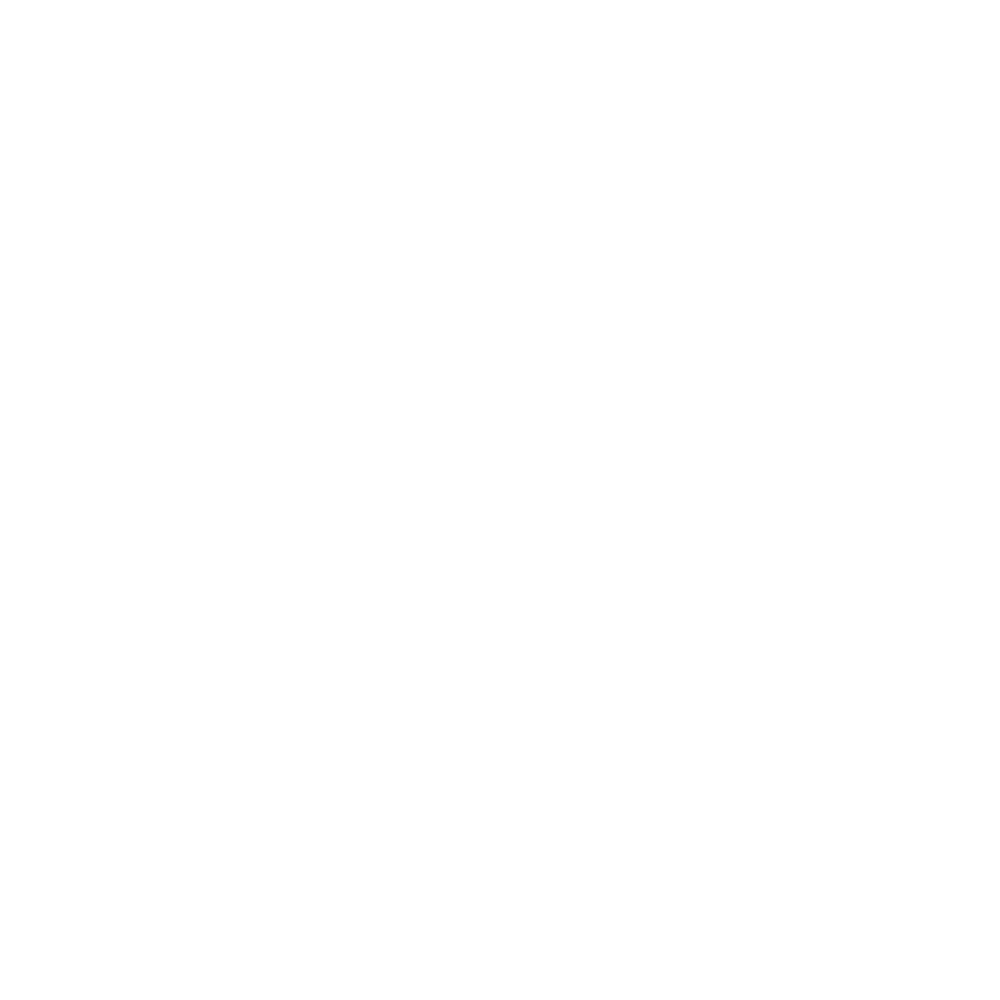

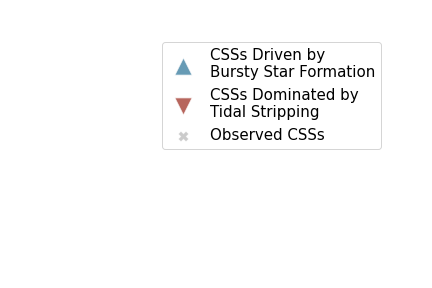

In [47]:
grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

plt.figure(figsize=(12, 12), dpi=160, facecolor='white')

fig, ax = plt.subplots()

# plt.subplots_adjust(left=0.02, bottom=0.01, right=0.6, top=0.9)

# grid = plt.GridSpec(5, 5, hspace=0, wspace=0)

# # 添加子图
# ax_main = fig.add_subplot(grid[1:5, :-1])
# ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
# ax_right.tick_params(right=False, top=False)
# ax_top = fig.add_subplot(grid[0, :-1], xticklabels=[])
# ax_top.tick_params(right=False, top=False)

# ax_right.spines['bottom'].set_visible(False)
# ax_right.spines['right'].set_visible(False)
# ax_right.spines['top'].set_visible(False)
# ax_right.spines['left'].set_visible(False)

# ax_top.spines['bottom'].set_visible(False)
# ax_top.spines['right'].set_visible(False)
# ax_top.spines['top'].set_visible(False)
# ax_top.spines['left'].set_visible(False)

# ax_main.spines['bottom'].set_visible(False)
# ax_main.spines['right'].set_visible(False)
# ax_main.spines['top'].set_visible(False)
# ax_main.spines['left'].set_visible(False)

# plt.scatter([], [] ,marker='o',c=cl,s=300,alpha=0.8,edgecolor='white',lw=1,label='CSSs (cluster,sat)')
# plt.scatter([], [] ,marker='o',c=grp,s=150,alpha=0.8,edgecolor='white',lw=1,label='CSSs (group,sat)')
# plt.scatter([], [] ,marker='o',c=fl,s=50,alpha=0.8,edgecolor='white',lw=1,label='CSSs (field,sat)')

sizes = 1e8/1e8 * 10  # 调整大小的比例因子

# plt.scatter([], [] ,marker='o',c='grey',s=1e10/1e8 * 10,alpha=0.8,edgecolor='none',label=r'$10^{10} M_{\odot}$')
# plt.scatter([], [] ,marker='o',c='grey',s=1e9/1e8 * 10,alpha=0.8,edgecolor='none',label=r'$10^{9} M_{\odot}$')
# plt.scatter([], [] ,marker='o',c='grey',s=1e8/1e8 * 10,alpha=0.8,edgecolor='none',label=r'$10^{8} M_{\odot}$')

plt.scatter([], [] ,c=grp, s=300, alpha=0.8, edgecolor='white', lw=1, marker='^',label='CSSs Driven by\nBursty Star Formation')
plt.scatter([], [] ,c=cl, s=300, alpha=0.8, edgecolor='white', lw=1, marker='v',label='CSSs Dominated by\nTidal Stripping')
# plt.scatter([], [] ,c='black', s=50, alpha=0.8, edgecolor='none', lw=1, marker='x',label='TBD')
# plt.scatter([], [] ,marker='+',c='black',s=50,alpha=0.8,edgecolor='black',label='CSSs (isolated,cen)',lw=0.2)
# plt.scatter([], [], s=300, marker='d', alpha=0.5, color='lightgrey', edgecolor='None', label='NoneType')
plt.scatter([], [], marker='X', s=100, alpha=0.2, color='black', edgecolor='white', label='Observed CSSs')
# plt.errorbar([], [], xerr=[], yerr=[], fmt='X', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='Chilingarian+2015')
# plt.errorbar([], [], xerr=[], yerr=[], fmt='o', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='Ferre+2018')
# plt.errorbar([], [], xerr=[[], []], yerr=[[], []], fmt='s', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='Guerou+2015')
# plt.errorbar([], [], xerr=[[], []], yerr=[], fmt='p', ecolor='black', alpha=0.2, markerfacecolor='black', markeredgecolor='white', label='Janz+2016')
# plt.scatter([], [], marker='h', color='black', edgecolor='white', alpha=0.2, label='Kim+2020')
# plt.scatter([], [], marker='h', color=(254/255,251/255,186/255), edgecolor='black', alpha=0.05, label='cEs without host (Kim+2020)')
# plt.errorbar([], [], xerr=[[], []], yerr=[[], []], fmt='X',ecolor='black', alpha=0.05, markerfacecolor='black', markeredgecolor='white', label='observations')
plt.rcParams['legend.fontsize'] = 15
legend = plt.legend()

# # 获取图例项的总数
# total_legend_items = len(ax.get_legend_handles_labels()[1])

# # 设置图例
# plt.rcParams['legend.fontsize'] = 15
# legend = plt.legend(frameon=False, ncol=total_legend_items)

# 使轴和画布透明
ax.axis('off')
fig.patch.set_visible(False)
plt.savefig('/home/bianyuan/workspace/pic/Age_Z_label.pdf')

/tmp/ipykernel_135513/80664107.py:12: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter([], [], c=grp, s=300, alpha=0.8, edgecolor='white', lw=1, marker='^', label='CSSs Driven by\nBursty Star Formation')
/tmp/ipykernel_135513/80664107.py:13: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  plt.scatter([], [], c=cl, s=300, alpha=0.8, edgecolor='white', lw=1, marker='v', label='CSSs Dominated by\nTidal Stripping')


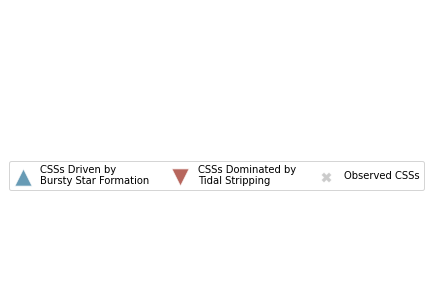

: 

In [58]:
import matplotlib.pyplot as plt
import numpy as np

grp = (65/255, 130/255, 164/255, 0.8)
cl = (166/255, 64/255, 54/255, 0.8)
fl = (240/255, 201/255, 134/255, 0.8)

plt.figure(figsize=(12, 12), dpi=400, facecolor='white')
fig, ax = plt.subplots()

# 添加数据用于示例，这里仅为显示图例而已，实际使用时应替换为真实数据点
plt.scatter([], [], c=grp, s=300, alpha=0.8, edgecolor='white', lw=1, marker='^', label='CSSs Driven by\nBursty Star Formation')
plt.scatter([], [], c=cl, s=300, alpha=0.8, edgecolor='white', lw=1, marker='v', label='CSSs Dominated by\nTidal Stripping')
plt.scatter([], [], marker='X', s=100, alpha=0.2, color='black', edgecolor='white', label='Observed CSSs')

# 调整图例位置到图形下方
plt.rcParams['legend.fontsize'] = 10
legend = plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), ncol=3)

# 调整子图边距
plt.subplots_adjust(left=0.4, right=0.6, top=0.9, bottom=0.5)  # 调整这些值以适应图形和图例

ax.axis('off')  # 隐藏坐标轴
fig.patch.set_visible(False)  # 使画布透明

plt.savefig('/home/bianyuan/workspace/pic/Age_Z_label.pdf')

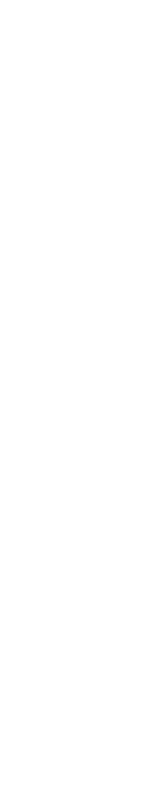

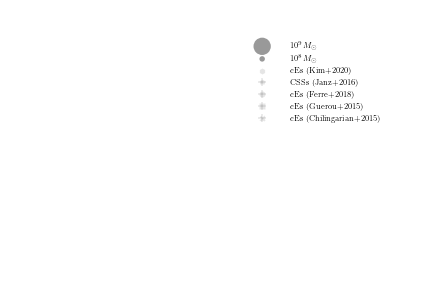

In [40]:
grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

plt.figure(figsize=(1, 5), dpi=160, facecolor='white')

fig, ax = plt.subplots()

# plt.subplots_adjust(left=0.02, bottom=0.01, right=0.6, top=0.9)

# grid = plt.GridSpec(5, 5, hspace=0, wspace=0)

# # 添加子图
# ax_main = fig.add_subplot(grid[1:5, :-1])
# ax_right = fig.add_subplot(grid[1:5, -1], yticklabels=[])
# ax_right.tick_params(right=False, top=False)
# ax_top = fig.add_subplot(grid[0, :-1], xticklabels=[])
# ax_top.tick_params(right=False, top=False)

# ax_right.spines['bottom'].set_visible(False)
# ax_right.spines['right'].set_visible(False)
# ax_right.spines['top'].set_visible(False)
# ax_right.spines['left'].set_visible(False)

# ax_top.spines['bottom'].set_visible(False)
# ax_top.spines['right'].set_visible(False)
# ax_top.spines['top'].set_visible(False)
# ax_top.spines['left'].set_visible(False)

# ax_main.spines['bottom'].set_visible(False)
# ax_main.spines['right'].set_visible(False)
# ax_main.spines['top'].set_visible(False)
# ax_main.spines['left'].set_visible(False)

# plt.scatter([], [] ,marker='o',c=cl,s=300,alpha=0.8,edgecolor='white',lw=1,label='CSSs (cluster,sat)')
# plt.scatter([], [] ,marker='o',c=grp,s=150,alpha=0.8,edgecolor='white',lw=1,label='CSSs (group,sat)')
# plt.scatter([], [] ,marker='o',c=fl,s=50,alpha=0.8,edgecolor='white',lw=1,label='CSSs (field,sat)')

sizes = 1e8/1e8 * 10  # 调整大小的比例因子

# plt.scatter([], [] ,marker='o',c='grey',s=1e10/1e8 * 30,alpha=0.8,edgecolor='none',label=r'$10^{10} M_{\odot}$')
plt.scatter([], [] ,marker='o',c='grey',s=1e9/1e8 * 30,alpha=0.8,edgecolor='none',label=r'$10^{9} M_{\odot}$')
plt.scatter([], [] ,marker='o',c='grey',s=1e8/1e8 * 30,alpha=0.8,edgecolor='none',label=r'$10^{8} M_{\odot}$')

# plt.scatter([], [] ,marker='+',c='black',s=50,alpha=0.8,edgecolor='black',label='CSSs (isolated,cen)',lw=0.2)
plt.scatter([], [], marker='h', color='black', edgecolor='white', alpha=0.1, label='cEs (Kim+2020)')
plt.errorbar([], [], xerr=[[], []], yerr=[], fmt='p', ecolor='black', alpha=0.1, markerfacecolor='black', markeredgecolor='white', label='CSSs (Janz+2016)')
plt.errorbar([], [], xerr=[], yerr=[], fmt='o', ecolor='black', alpha=0.1, markerfacecolor='black', markeredgecolor='white', label='cEs (Ferre+2018)')
plt.errorbar([], [], xerr=[[], []], yerr=[[], []], fmt='s', ecolor='black', alpha=0.1, markerfacecolor='black', markeredgecolor='white', label='cEs (Guerou+2015)')
plt.errorbar([], [], xerr=[], yerr=[], fmt='X', ecolor='black', alpha=0.1, markerfacecolor='black', markeredgecolor='white', label='cEs (Chilingarian+2015)')
# plt.scatter([], [], marker='h', color=(254/255,251/255,186/255), edgecolor='black', alpha=0.05, label='cEs without host (Kim+2020)')
# plt.errorbar([], [], xerr=[[], []], yerr=[[], []], fmt='X',ecolor='black', alpha=0.05, markerfacecolor='black', markeredgecolor='white', label='observations')
plt.rcParams['legend.fontsize'] = 8
legend = plt.legend(frameon=False, handletextpad=2)  # 调整handletextpad的值以增加间距

# # 获取图例项的总数
# total_legend_items = len(ax.get_legend_handles_labels()[1])

# # 设置图例
# plt.rcParams['legend.fontsize'] = 15
# legend = plt.legend(frameon=False, ncol=total_legend_items)

# 使轴和画布透明
ax.axis('off')
fig.patch.set_visible(False)
plt.savefig('/home/bianyuan/workspace/pic/Age_Z_label_3.pdf')

/tmp/ipykernel_58640/1636760220.py:195: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_main.scatter(cl_CSSs_age_0,cl_CSSs_ZH_0 ,marker='o',c=cl,s=150,alpha=0.8,edgecolor='grey',lw=2)
/tmp/ipykernel_58640/1636760220.py:198: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax_main.scatter(grp_CSSs_age_0,grp_CSSs_ZH_0 ,marker='o',c=grp,s=150,alpha=0.8,edgecolor='grey',lw=2)
/tmp/ipykernel_58640/1636760220.py:201: UserWarning: *c

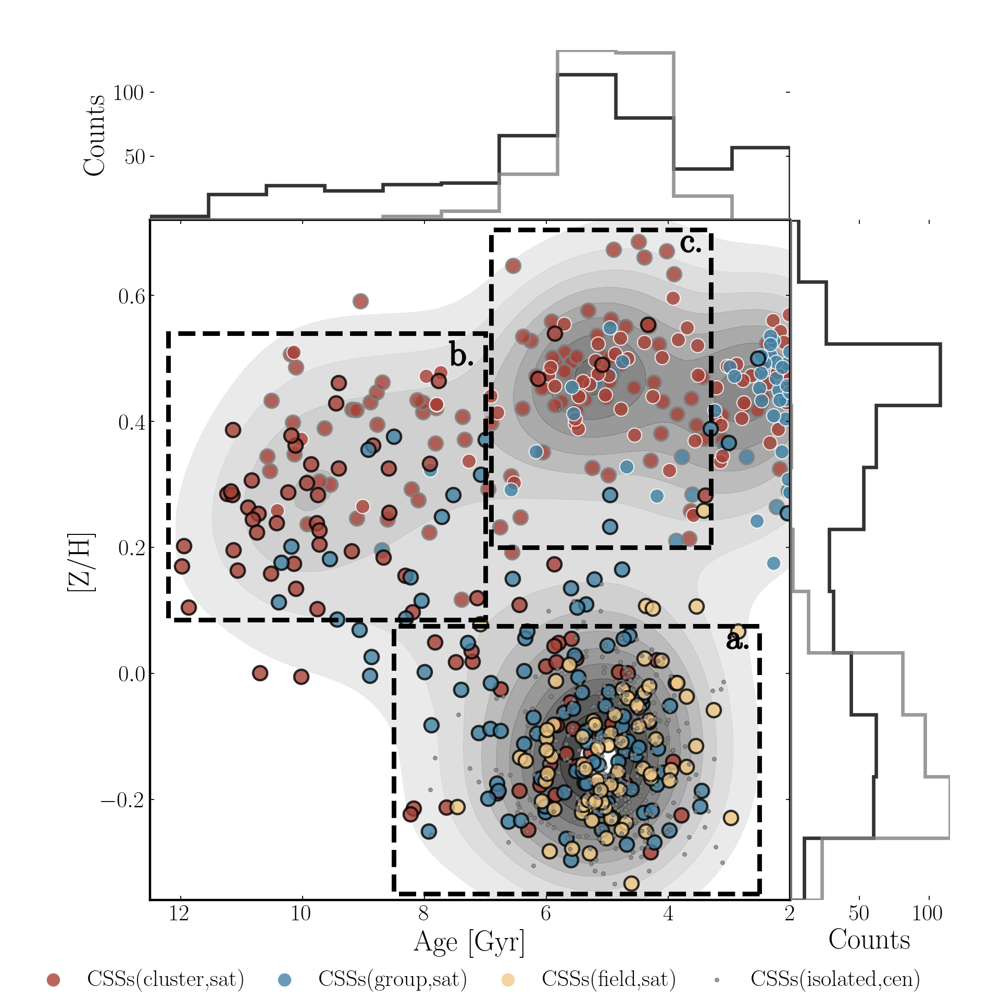

In [25]:
import pandas as pd
import seaborn as sns

# Load the CSV data
CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

# Define the boundaries for the "d" region
x_min, x_max = 0, 2
y_min, y_max = 0.085, 0.61

# Filter out points from the "d" region
mask_d = ~((13.8 - CSSs3["MWted-Age"] >= x_min) & (13.8 - CSSs3["MWted-Age"] <= x_max) & (CSSs3["[Z/H]_r"] >= y_min) & (CSSs3["[Z/H]_r"] <= y_max))
CSSs3 = CSSs3[mask_d]

%matplotlib inline
import sys
sys.path.append("/home/bianyuan/workspace/Grab_TNGgalaxy/")
import illustris_python as il
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import numpy as np
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits import mplot3d
import seaborn as sns
import matplotlib
from matplotlib.patches import Rectangle
from scipy.stats import gaussian_kde
from scipy.interpolate import griddata
from scipy.stats import gaussian_kde
from scipy.stats import binned_statistic
from matplotlib.patches import Ellipse
from matplotlib import patheffects as path_effects
from astroML.plotting import setup_text_plots
%matplotlib widget
run = 'TNG50'
basePath = '/media/bianyuan/data-TNG-1/' + run + '-1/output'

setup_text_plots(usetex=True)

'''color'''

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

# sizes = np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]/np.max(np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]) * len(np.array(CSSs3['Star mass'])[np.where((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))]) / 3
# M = np.concatenate((np.array(CSSs3['Star mass']), np.array(Normal_Dwarf['Star mass'])),axis=0)
# sizes = (M/np.max(M) * len(M)/20) * 5

# sizes_0 = sizes[np.array(np.argwhere(np.array((CSSs3['Number'] >= 2) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Distance_grpvir'] > 0)))[:,0])]
# # print(len(np.array(CSSs3["MWted-Age"])[np.where(np.array((CSSs3['Number'] >= 2)))]),len(sizes_0))
# # sizes_0 = sizes[np.array(np.argwhere((np.log10(CSSs3['Distance']) <= -0.5)&(np.log10(CSSs3['Distance']) >= -1.5))[:,0])]
# sizes_1 = sizes[np.where(np.array((CSSs3['Number'] < 2)))]
# sizes_2 = sizes[np.array(np.argwhere(np.array((Normal_Dwarf['Number'] < 2) & (CSSs3['Distance_grpvir'] > 0)))[:,0])]

fig = plt.figure(figsize=(12, 12), dpi=160, facecolor='white')
plt.subplots_adjust(left=0.15, bottom=0.1, right=0.95, top=0.95)
grid = plt.GridSpec(5, 5, hspace=0, wspace=0)

# 添加子图
ax_main = fig.add_subplot(grid[1:5, :-1])
ax_right = fig.add_subplot(grid[1:5, -1], xticklabels=[], yticklabels=[])
ax_top = fig.add_subplot(grid[0, :-1], xticklabels=[], yticklabels=[])

ax_main.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
ax_main.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
ax_main.spines['top'].set_linewidth(2)  # 修改顶部轴线宽度
ax_main.spines['right'].set_linewidth(2)  # 修改右部轴线宽度

ax_right.spines['left'].set_linewidth(2)  # 修改左边轴线宽度
ax_top.spines['bottom'].set_linewidth(2)  # 修改底部轴线宽度
# ax_right.spines['bottom'].set_linewidth(2)
# ax_right.spines['right'].set_linewidth(2)
# ax_right.spines['top'].set_linewidth(2)
# ax_right.spines['left'].set_linewidth(2)

ax_right.spines['bottom'].set_visible(False)
ax_right.spines['right'].set_visible(False)
ax_right.spines['top'].set_visible(False)
ax_right.spines['left'].set_visible(False)

# ax_top.spines['bottom'].set_linewidth(2)
# ax_top.spines['right'].set_linewidth(2)
# ax_top.spines['top'].set_linewidth(2)
# ax_top.spines['left'].set_linewidth(2)

ax_top.spines['bottom'].set_visible(False)
ax_top.spines['right'].set_visible(False)
ax_top.spines['top'].set_visible(False)
ax_top.spines['left'].set_visible(False)

breakingpoint = 67

cl_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
cl_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
cl_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
cl_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
cl_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0))]
cl_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0))]

grp_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
grp_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
grp_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
grp_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
grp_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))]
grp_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))]

fl_CSSs_age_1 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
fl_CSSs_ZH_1 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint))]
fl_CSSs_age_brk = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
fl_CSSs_ZH_brk = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
fl_CSSs_age_0 = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))]
fl_CSSs_ZH_0 = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))]
iso_CSSs_age = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]
iso_CSSs_ZH = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])==1) & (np.array(CSSs3['Distance_grpvir']) == 0))]

ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[np.where((CSSs3['Distance_grpvir'] > 0))], bins=np.linspace(2,12.2,12), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor='black', facecolor='none', alpha=0.8, linewidth=3)
ax_top.hist(13.8-np.array(CSSs3["MWted-Age"])[np.where((CSSs3['Distance_grpvir'] == 0) & (CSSs3['Number'] == 1))], bins=np.linspace(2,12.2,12), histtype='stepfilled', orientation='vertical', 
                                                                edgecolor='gray', facecolor='none', alpha=0.8, linewidth=3)                                                                                                                         

# sns.histplot(data=cl_CSSs_age, ax=ax_top,color=grp, linestyle='-', linewidth=2, kde=True, bins=10)
# sns.histplot(data=grp_CSSs_age, ax=ax_top, color=cl, linestyle='-', linewidth=2, kde=True, bins=10)
# sns.histplot(data=fl_CSSs_age, ax=ax_top, color=fl, linestyle='-', linewidth=2, kde=True, bins=5)
# sns.histplot(data=iso_CSSs_age, ax=ax_top, color='black', linestyle='--', linewidth=1, kde=True, bins=5)

ax_top.set_xlim(2,12.2)

ax_top.invert_xaxis()
ax_top.set_xticks([])
ax_top.set_yticks([])
# ax_top.tick_params(axis='x', direction='in')
ax_top.tick_params(axis='y', which='both')
ax_top.tick_params(axis='x', which='major', labelsize=12)

ax_right.hist(np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] > 0))], bins=np.linspace(-0.36, 0.72,12), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='black', facecolor='none', alpha=0.8, linewidth=3)
ax_right.hist(np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] == 0) & (CSSs3['Number'] == 1))], bins=np.linspace(-0.36, 0.72,12), histtype='stepfilled', orientation='horizontal', 
                                                                edgecolor='gray', facecolor='none', alpha=0.8, linewidth=3)                                                                                                                           
# sns.histplot(data=cl_CSSs_ZH, ax=ax_right,color=grp, linestyle='-', linewidth=2)
# sns.histplot(data=grp_CSSs_ZH, ax=ax_right, color=cl, linestyle='-', linewidth=2)
# sns.histplot(data=fl_CSSs_ZH, ax=ax_right, color=fl, linestyle='-', linewidth=2)
# sns.histplot(data=iso_CSSs_ZH, ax=ax_right, color='black', linestyle='--', linewidth=1)

ax_right.set_ylim(-0.36, 0.72)

ax_right.tick_params(axis='x', which='both')
ax_right.tick_params(axis='y', which='major', labelsize=12)
ax_right.set_xticks([])
ax_right.set_yticks([])

ax_top.set_yticks([50, 100])
ax_top.set_yticklabels([50, 100], fontsize=20)
ax_top.set_ylabel('Counts', fontsize=25)
ax_right.set_xticks([50, 100])
ax_right.set_xticklabels([50, 100], fontsize=20)
ax_right.set_xlabel('Counts', fontsize=25)

# 从CSSs3中提取数据
# x = 13.8-np.array(CSSs3["MWted-Age"])[np.where( ((13.8-CSSs3['MWted-Age']) >= 4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.085) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) ) ]
# y = np.array(CSSs3["[Z/H]_r"])[np.where( ((13.8-CSSs3['MWted-Age']) >= 4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.085) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) ) ]
x = 13.8-np.array(CSSs3["MWted-Age"])[np.where((CSSs3['Distance_grpvir'] > 0))]
y = np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] > 0))]

# 检查是否包含NaN或inf，并删除这些数据点
valid_idx = np.logical_and(~np.isnan(x), ~np.isnan(y))
valid_idx = np.logical_and(valid_idx, ~np.isinf(x))
valid_idx = np.logical_and(valid_idx, ~np.isinf(y))
x = x[valid_idx]
y = y[valid_idx]

# 估算密度分布
kernel = gaussian_kde(np.vstack([x, y]))
xmin, ymin = x.min(), y.min()
xmax, ymax = x.max(), y.max()

xi = np.linspace(x.min()-0.5, x.max()+0.1, 100)
yi = np.linspace(y.min()-0.1, y.max()+0.1, 100)

# 生成网格数据
X, Y = np.meshgrid(xi,yi)
positions = np.vstack([X.ravel(), Y.ravel()])
Z = np.reshape(kernel(positions).T, X.shape)
xi, yi = np.meshgrid(xi, yi)
zi = griddata((X.ravel(), Y.ravel()), Z.ravel(), (xi, yi), method='cubic')

# 将最低值颜色映射设置为白色
colors = ['white'] + list(plt.cm.Greys(np.linspace(0.2, 1, 10)))  # 使用渐变色设置颜色映射

sm = ax_main.contourf(xi, yi, zi, levels=11, colors=colors, alpha=0.7)


# cl_CSSs_age = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (CSSs3['Traced or Not'] == 1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
# cl_CSSs_ZH = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (CSSs3['Traced or Not'] == 1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (np.log10(CSSs3['Groupmass']) > 13))]
ax_main.scatter(cl_CSSs_age_0,cl_CSSs_ZH_0 ,marker='o',c=cl,s=150,alpha=0.8,edgecolor='grey',lw=2)
# grp_CSSs_age = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
# grp_CSSs_ZH = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13))]
ax_main.scatter(grp_CSSs_age_0,grp_CSSs_ZH_0 ,marker='o',c=grp,s=150,alpha=0.8,edgecolor='grey',lw=2)
# fl_CSSs_age = 13.8-np.array(CSSs3["MWted-Age"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
# fl_CSSs_ZH = np.array(CSSs3["[Z/H]_r"])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0) & (CSSs3['Number'] < 5))]
ax_main.scatter(fl_CSSs_age_0,fl_CSSs_ZH_0 ,marker='o',c=fl,s=150,alpha=0.8,edgecolor='grey',lw=2)

ax_main.scatter(cl_CSSs_age_brk,cl_CSSs_ZH_brk ,marker='o',c=cl,s=150,alpha=0.8,edgecolor='white',lw=1,label='CSSs(cluster,sat)')
ax_main.scatter(grp_CSSs_age_brk,grp_CSSs_ZH_brk ,marker='o',c=grp,s=150,alpha=0.8,edgecolor='white',lw=1,label='CSSs(group,sat)')
ax_main.scatter(fl_CSSs_age_brk,fl_CSSs_ZH_brk ,marker='o',c=fl,s=150,alpha=0.8,edgecolor='white',lw=1,label='CSSs(field,sat)')

ax_main.scatter(cl_CSSs_age_1,cl_CSSs_ZH_1 ,marker='o',c=cl,s=150,alpha=0.8,edgecolor='black',lw=2)
ax_main.scatter(grp_CSSs_age_1,grp_CSSs_ZH_1 ,marker='o',c=grp,s=150,alpha=0.8,edgecolor='black',lw=2)
ax_main.scatter(fl_CSSs_age_1,fl_CSSs_ZH_1 ,marker='o',c=fl,s=150,alpha=0.8,edgecolor='black',lw=2)

ax_main.scatter(iso_CSSs_age, iso_CSSs_ZH,
                marker='.',c='grey',s=50,alpha=0.8,edgecolor='black',label='CSSs(isolated,cen)',lw=0.2)

# 反转x轴
ax_main.invert_xaxis()

rect = Rectangle((7, 0.085), 5.2, 0.455, linestyle='--', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect)

rect = Rectangle((3.3, 0.2), 3.6, 0.505, linestyle='--', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect)

rect = Rectangle((2.5, -0.35), 6, 0.425, linestyle='--', linewidth=4, edgecolor='black', facecolor='none')
ax_main.add_patch(rect)

ax_main.tick_params(axis='x', direction='in')
ax_main.tick_params(axis='y', direction='in')
ax_main.invert_xaxis()
ax_main.set_xlim(12.5,2)
ax_main.set_ylim(-0.36, 0.72)
ax_main.set_xlabel('Age [Gyr]', fontsize=25)
ax_main.set_ylabel('[Z/H]', fontsize=25)
ax_main.tick_params(axis='both', which='major', labelsize=20)
# 标注区域名称
# Metal-Poor Compact Galaxies (MPCGs)
# Metal-Rich Early-Type Compact Galaxies I (MRECGs I)
ax_main.text(3.8, 0.67, "c.",alpha=1,fontdict={'size': 30, 'family': 'serif', 'color': 'black'},path_effects=[path_effects.withStroke(linewidth=1.5)])
# Metal-Rich Early-Type Compact Galaxies II (MRECGs II)
ax_main.text(3.05, 0.04, "a.",alpha=1,fontdict={'size': 30, 'family': 'serif', 'color': 'black'},path_effects=[path_effects.withStroke(linewidth=1.5)])
ax_main.text(7.6, 0.49, "b.",alpha=1,fontdict={'size': 30, 'family': 'serif', 'color': 'black'},path_effects=[path_effects.withStroke(linewidth=1.5)])
plt.rcParams['legend.fontsize'] = 20
# ax_main.legend(frameon=False,handletextpad=0.0000005,bbox_to_anchor=(0.42,0.28))

# 添加图例，并将其放在图的正下方
legend = ax_main.legend(frameon=False, handletextpad=0.0000005, loc='upper center', bbox_to_anchor=(0.5, -0.07), ncol=len(ax_main.get_legend_handles_labels()[1]), columnspacing=0.2)
plt.savefig('/home/bianyuan/workspace/pic/Age_Z'+'.pdf')

In [21]:
len(fl_CSSs_age_1) + len(fl_CSSs_age_brk) + len(fl_CSSs_age_0) + len(grp_CSSs_age_1) + len(grp_CSSs_age_brk) + len(grp_CSSs_age_0) + len(cl_CSSs_age_1) + len(cl_CSSs_age_brk) + len(cl_CSSs_age_0) + len(iso_CSSs_age)

986

In [ ]:
plt.scatter([], [], marker='o',c=cl,s=150,alpha=0.8,edgecolor='white',label='CSSs(cluster,sat)')
plt.scatter([], [], grp_CSSs_ZH_1 ,marker='o',c=grp,s=75,alpha=0.8,edgecolor='white',label='CSSs(group,sat)')
plt.scatter([], [], marker='o',c=fl,s=50,alpha=0.8,edgecolor='white',label='CSSs(field,sat)')
plt.scatter([], [], marker='.',c='grey',s=50,alpha=0.8,edgecolor='white',label='CSSs(isolated,cen)')

# 添加colorbar
cax = fig.add_axes([0.27, 0.20, 0.22, 0.015])  # 调整colorbar的位置和大小
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal',cmap='Greys')
cbar.set_label('Dwarf(isolated,cen)', fontsize=20)
cbar.set_ticks([])
cbar.ax.xaxis.set_label_coords(0.5, -1.1)  # Increase the y-coordinate value (-1.2 in this example)

legend = plt.legend(frameon=False, handletextpad=0.0000005, loc='upper center', bbox_to_anchor=(0.5, -0.07), ncol=len(ax_main.get_legend_handles_labels()[1]), columnspacing=0.2)

(array([56., 85., 83., 95., 90., 42., 35., 11.,  2.,  1.]),
 array([8.00010496, 8.19451849, 8.38893203, 8.58334557, 8.77775911,
        8.97217265, 9.16658618, 9.36099972, 9.55541326, 9.7498268 ,
        9.94424034]),
 [<matplotlib.patches.Polygon at 0x7f3b26d49570>])

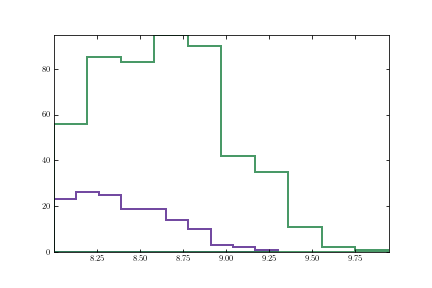

In [76]:
%matplotlib widget
plt.hist(np.log10(Star_grp_CSSs), histtype='stepfilled', orientation='vertical', edgecolor=grp, facecolor='none', alpha=0.8, linewidth=2)
plt.hist(np.log10(Star_cl_CSSs), histtype='stepfilled', orientation='vertical', edgecolor=cl, facecolor='none', alpha=0.8, linewidth=2)

(array([ 6., 25., 38., 44., 43., 18., 18.,  7.,  1.,  1.]),
 array([8.05350653, 8.24257991, 8.43165329, 8.62072667, 8.80980005,
        8.99887343, 9.18794681, 9.3770202 , 9.56609358, 9.75516696,
        9.94424034]),
 [<matplotlib.patches.Polygon at 0x7fad253b8b80>])

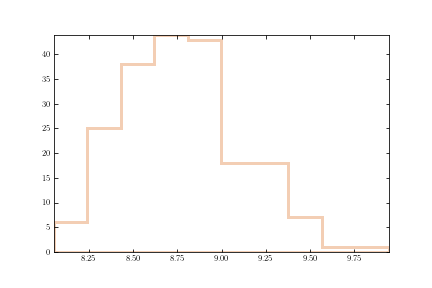

In [21]:
%matplotlib widget
# Csc_lis_0 = np.array(CSSs3['Star mass'])[np.where( (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & ((CSSs3['Star mass'] > 1e9))) ) ]

# Csc_lis_0 = np.array(CSSs3['Star mass'])[np.where( (np.array(CSSs3['type1']) == 'Metal-Rich Old II') ) ]
# Csc_lis_0 = np.array(CSSs3['Star mass'])[np.where( (np.array(CSSs3['type']) == 'Metal-Rich Old') & (CSSs3['Traced or Not'] == 1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) ) ]
Csc_lis_0 = np.array(CSSs3['Star mass'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Traced or Not'] == 1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) ) ]

plt.hist(np.log10(Csc_lis_0), histtype='stepfilled', orientation='vertical', edgecolor=CSSs, facecolor='none', alpha=0.8, linewidth=3, label='Non-isoalted CSSs')

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

Stellarmass_sat_CSSs = np.array(CSSs3['Stellarmass'])[np.where(np.array(CSSs3['Number'])>1)]
Stellarmass_CSSs = np.array(CSSs3['Stellarmass'])[np.where(np.array(CSSs3['Number'])==1)]
Stellarmass_Normal_Dwarf = np.array(Normal_Dwarf['Stellarmass'])[np.where(np.array(Normal_Dwarf['Number'])==1)]

Age_sat_CSSs = np.array(CSSs3['MWted-Age'])[np.where(np.array(CSSs3['Number'])>1)]
Age_CSSs = np.array(CSSs3['MWted-Age'])[np.where(np.array(CSSs3['Number'])==1)]
Age_Normal_Dwarf = np.array(Normal_Dwarf['MWted-Age'])[np.where(np.array(Normal_Dwarf['Number'])==1)]

plt.scatter()

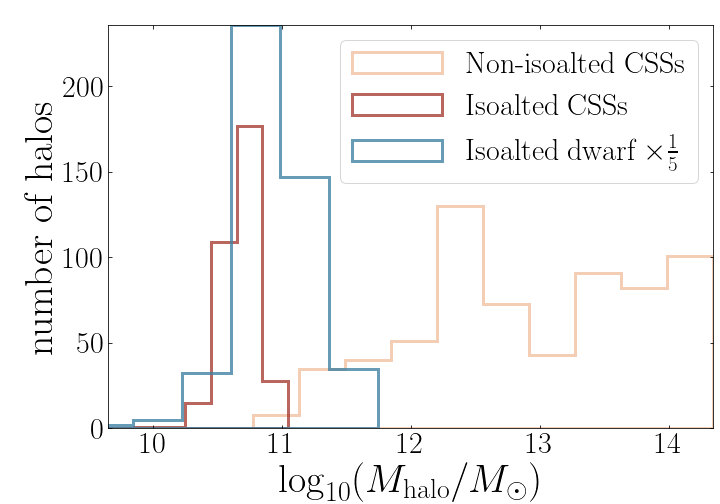

In [13]:
%matplotlib widget
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

'''color'''
CSSs = (240/255,194/255,162/255,0.7)
ND_sat = (21/255,29/255,41/255,0.5)
Iso_CSSs = (166/255,64/255,54/255,0.5)
NDf = (65/255,130/255,164/255,0.5)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)
ND = sns.load_dataset('Normal_Dwarf_1',data_home='/home/bianyuan/workspace/data',cache=True)

Groupmass_CSSs = np.array(CSSs3['Groupmass'])[np.where((CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0))]
Groupmass_iso = np.array(CSSs3['Groupmass'])[np.where((CSSs3['Number'] == 1) & (CSSs3['Distance_grpvir'] == 0))]
Groupmass_ND_iso = np.array(ND['Groupmass'])[np.where((ND['Number'] == 1) & (ND['Distance'] == 0))]
Groupmass_ND_sat = np.array(ND['Groupmass'])[np.where((ND['Number'] > 1) & (ND['Distance'] > 0))]

s_mass_CSSs = np.array(CSSs3['Stellarmass'])[np.where((CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0))]
s_mass_iso = np.array(CSSs3['Stellarmass'])[np.where((CSSs3['Number'] == 1) & (CSSs3['Distance_grpvir'] == 0))]
s_mass_dwarf = np.array(ND['Stellarmass'])[np.where((ND['Number'] == 1) & (ND['Distance'] == 0))]
s_mass_sat_dwarf = np.array(ND['Stellarmass'])[np.where((ND['Number'] > 1) & (ND['Distance'] > 0))]

# fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(20, 7))
fig, ax1 = plt.subplots(figsize=(10, 7))
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.99, top=0.95, wspace=0.15, hspace=0.07)
plt.rcParams['xtick.direction'] = 'in'#将x周的刻度线方向设置向内
plt.rcParams['ytick.direction'] = 'in'#将y轴的刻度方向设置向内

ax1.hist(np.log10(Groupmass_CSSs), histtype='stepfilled', orientation='vertical', edgecolor=CSSs, facecolor='none', alpha=0.8, linewidth=3, label='Non-isoalted CSSs')
ax1.hist(np.log10(Groupmass_iso), histtype='stepfilled', orientation='vertical', edgecolor=Iso_CSSs, facecolor='none', alpha=0.8, linewidth=3, label='Isoalted CSSs')
ax1.hist(np.log10(Groupmass_ND_iso), histtype='stepfilled', orientation='vertical', edgecolor=NDf, facecolor='none', alpha=0.8, linewidth=3, label=r'Isoalted dwarf $\times \frac{1}{5}$', weights=np.ones_like(Groupmass_ND_iso) * 0.2)
# ax1.hist(np.log10(Groupmass_ND_sat), 12, histtype='stepfilled', orientation='vertical', edgecolor=ND_sat, facecolor='none', alpha=0.8, linewidth=3, label='Non-isoalted dwarf', weights=np.ones_like(Groupmass_ND_sat) * 1/3)
ax1.tick_params(axis='x', which='both', labelsize=30)
ax1.tick_params(axis='y', which='both', labelsize=30)
ax1.set_xlim(xmin=np.min(np.log10(Groupmass_ND_iso)[np.where(np.log10(Groupmass_ND_iso)>9)]))
ax1.set_xlabel(r'$\mathrm{log}_{10}(M_{\mathrm{halo}}/M_{\odot})$', fontsize=40)
ax1.set_ylabel(r'number of halos', fontsize=40)

# ax2.hist(np.log10(s_mass_CSSs), histtype='stepfilled', orientation='vertical', edgecolor=CSSs, facecolor='none', alpha=0.8, linewidth=3, label='Non-isoalted CSSs')
# ax2.hist(np.log10(s_mass_iso), histtype='stepfilled', orientation='vertical', edgecolor=Iso_CSSs, facecolor='none', alpha=0.8, linewidth=3, label='Isoalted CSSs')
# ax2.hist(np.log10(s_mass_dwarf), histtype='stepfilled', orientation='vertical', edgecolor=NDf, facecolor='none', alpha=0.8, linewidth=3, label=r'Isoalted dwarf $\times \frac{1}{5}$', weights=np.ones_like(s_mass_dwarf) * 0.2)
# # ax2.hist(np.log10(s_mass_sat_dwarf), 12, histtype='stepfilled', orientation='vertical', edgecolor=ND_sat, facecolor='none', alpha=0.8, linewidth=3, label='Non-isoalted dwarf', weights=np.ones_like(s_mass_sat_dwarf) * 1/3)
# ax2.tick_params(axis='x', which='both', labelsize=15)
# ax2.tick_params(axis='y', which='both', labelsize=15)
# ax2.set_xlabel(r'$\mathrm{log}_{10}(M_{*}/M_{\odot})$', fontsize=20)
# ax2.set_ylabel(r'number of galaxies', fontsize=20)
plt.rcParams['legend.fontsize'] = 30
plt.legend()
plt.savefig('/home/bianyuan/workspace/pic/cluster_statistics'+'.pdf')
# plt.savefig('/home/bianyuan/workspace/pic/cluster_smass_statistics'+'.pdf')

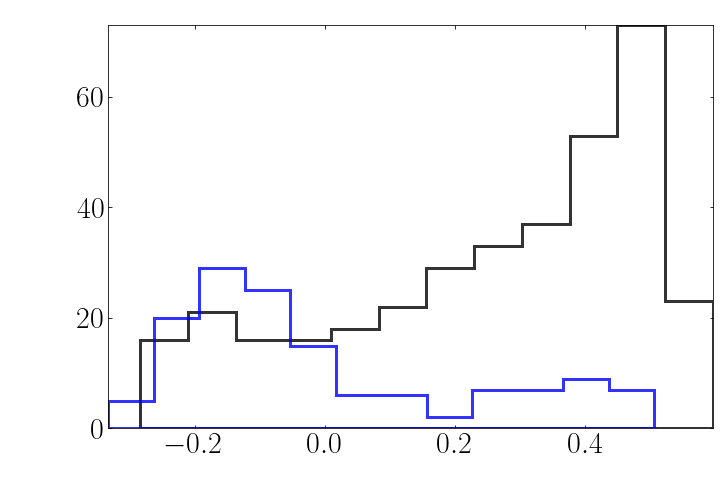

In [40]:
%matplotlib widget
Number_CSSs = np.array(CSSs3['Number'])[np.where((CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0))]
Z_CSSs = np.array(CSSs3['[Z/H]_r'])[np.where((np.array(CSSs3['Number'])>1) & (np.array(CSSs3['Distance_grpvir']) > 0))]
fig, ax = plt.subplots(figsize=(10, 7))
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.99, top=0.95, wspace=0.15, hspace=0.07)
# ax.hist(np.log10(Number_CSSs), 10, histtype='stepfilled', orientation='vertical', edgecolor='black', facecolor='none', linewidth=3, label='Non-isoalted CSSs')
# ax.scatter(np.log10(Number_CSSs), Z_CSSs)
ax.hist(np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Number']) > 1) & (CSSs3['Traced or Not'] == 1))], 12, histtype='stepfilled', orientation='vertical', 
                                                                edgecolor='black', facecolor='none', alpha=0.8, linewidth=3)
ax.hist(np.array(CSSs3["[Z/H]_r"])[np.where((CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Number']) < 1) & (CSSs3['Traced or Not'] == 1))], 12, histtype='stepfilled', orientation='vertical', 
                                                                edgecolor='blue', facecolor='none', alpha=0.8, linewidth=3)
plt.rcParams['legend.fontsize'] = 30
ax.tick_params(axis='x', which='both', labelsize=30)
ax.tick_params(axis='y', which='both', labelsize=30)
# ax.set_xlabel(r'$\mathrm{log}_{10}(N_{\mathrm{member}})$', fontsize=40)
# ax.set_ylabel(r'number of halos', fontsize=40)

[   121    308    320    395    548    798  63931  63950  63990  64002
  64240  96853  96886  97019 117357 117435 144028 167434 167534 184979
 185032 185066 185068 198281 208848 208970 220626 229992 229996 242840
 253892 253938 253978 275568 289414 294887 307581 319736 319748 324153
 338502]
54
14
39


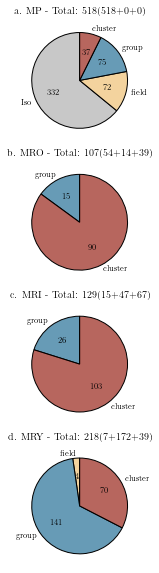

In [18]:
def absolute_value(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return f"{absolute:d}"

breakingpoint = 67
'''Iso'''
Iso_CSSs = np.array(CSSs3['ID'])[np.where( np.array( (CSSs3['Number'] == 1) & (CSSs3['Traced or Not'] == 1) ) )]
'''MP'''
MP_fl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) )]
MP_grp_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) )]
MP_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]

MP_fl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))]
MP_fl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
MP_grp_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))]
MP_grp_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
MP_cl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0)) ]
MP_cl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
'''MRY'''
MRY_fl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) ) ]
MRY_grp_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRY_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]

MRY_fl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0)) ]
MRY_fl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
MRY_grp_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0)) ]
MRY_grp_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
MRY_cl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0)) ]
MRY_cl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
'''MRI'''
MRI_grp_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRI_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]

MRI_grp_CSSs_1 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint)) ]
MRI_grp_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0)) ]
MRI_grp_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
MRI_cl_CSSs_1 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13)  & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint)) ]
MRI_cl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0)) ]
MRI_cl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
'''MRO'''
MRO_grp_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRO_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]

MRO_grp_CSSs_1 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint)) ]
MRO_grp_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0)) ]
MRO_grp_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
MRO_cl_CSSs_1 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint)) ]
MRO_cl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0)) ]
MRO_cl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]

total_MP_0 = len(MP_cl_CSSs_0)+len(MP_grp_CSSs_0)
total_MP_brk = len(MP_cl_CSSs_brk)+len(MP_grp_CSSs_brk)
total_MRY_0 = len(MRY_cl_CSSs_0)+len(MRY_grp_CSSs_0)
total_MRY_brk = len(MRY_cl_CSSs_brk)+len(MRY_grp_CSSs_brk)

total_MRI_1 = len(MRI_cl_CSSs_1)+len(MRI_grp_CSSs_1)
total_MRI_0 = len(MRI_cl_CSSs_0)+len(MRI_grp_CSSs_0)
total_MRI_brk = len(MRI_cl_CSSs_brk)+len(MRI_grp_CSSs_brk)
total_MRO_0 = len(MRO_cl_CSSs_0)+len(MRO_grp_CSSs_0)
total_MRO_brk = len(MRO_cl_CSSs_brk)+len(MRO_grp_CSSs_brk)

import numpy as np
import matplotlib.pyplot as plt
from astroML.plotting import setup_text_plots
#Lets text in plots use latex
setup_text_plots(usetex=True)

# Calculate the total number of CSSs in each category
total_Iso = len(Iso_CSSs)
total_MP = len(MP_fl_CSSs) + len(MP_grp_CSSs) + len(MP_cl_CSSs)
total_MRY = len(MRY_fl_CSSs) + len(MRY_grp_CSSs) + len(MRY_cl_CSSs)
total_MRI = len(MRI_grp_CSSs) + len(MRI_cl_CSSs)
total_MRO = len(MRO_grp_CSSs) + len(MRO_cl_CSSs)

print(MRO_cl_CSSs_1)
# print(len(MRO_cl_CSSs)+len(MRO_grp_CSSs))
print(len(MRO_cl_CSSs_1)+len(MRO_grp_CSSs_1))
print(len(MRO_cl_CSSs_brk)+len(MRO_grp_CSSs_brk))
print(len(MRO_cl_CSSs_0)+len(MRO_grp_CSSs_0))
# Define labels and sizes for the pie charts

# Filter out sizes with zero values
sizes_MP = [val for val in [len(Iso_CSSs), len(MP_fl_CSSs), len(MP_grp_CSSs), len(MP_cl_CSSs)] if val != 0]
sizes_MRY = [val for val in [len(MRY_fl_CSSs), len(MRY_grp_CSSs), len(MRY_cl_CSSs)] if val != 0]
sizes_MRI = [val for val in [len(MRI_grp_CSSs), len(MRI_cl_CSSs)]]
sizes_MRO = [val for val in [len(MRO_grp_CSSs), len(MRO_cl_CSSs)]]

labels = ['Iso', 'field', 'group', 'cluster']
# Filter out labels with zero values
labels_MP = [label for label, val in zip(labels, sizes_MP) if val != 0]

labels = ['field', 'group', 'cluster']
labels_MRY = [label for label, val in zip(labels, sizes_MRY) if val != 0]

labels = ['group', 'cluster']
labels_MRI = [label for label, val in zip(labels, sizes_MRI) if val != 0]
labels_MRO = [label for label, val in zip(labels, sizes_MRO) if val != 0]

# Define colors for 'fl', 'grp', and 'cl'
Iso = (200/255,200/255,200/255)
grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)
colors = [Iso, fl, grp, cl]

# Plot the pie charts
fig, axs = plt.subplots(4, 1,figsize=(2.2,8))

axs[0].pie(sizes_MP, labels=labels_MP, autopct=lambda pct: absolute_value(pct, sizes_MP), startangle=90, colors=colors[:len(sizes_MP)], textprops={'fontsize': 8})
# axs[0].pie(sizes_MP, labels=labels_MP, autopct='%1.1f%%', startangle=90, colors=colors[:len(sizes_MP)],textprops={'fontsize': 8})
axs[0].set_title(f"a. MP - Total: {total_MP+total_Iso}({total_Iso+total_MP-total_MP_brk-total_MP_0}+{total_MP_brk}+{total_MP_0})",fontsize=10)
axs[3].pie(sizes_MRY, labels=labels_MRY, autopct=lambda pct: absolute_value(pct, sizes_MRY), startangle=90, colors=[fl, grp, cl], textprops={'fontsize': 8})
# axs[3].pie(sizes_MRY, labels=labels_MRY, autopct='%1.1f%%', startangle=90, colors=[fl, grp, cl], textprops={'fontsize': 8})
axs[3].set_title(f"d. MRY - Total: {total_MRY}({total_MRY-total_MRY_brk-total_MRY_0}+{total_MRY_brk}+{total_MRY_0})",fontsize=10)
colors = [grp, cl]
axs[2].pie(sizes_MRI, labels=labels_MRI, autopct=lambda pct: absolute_value(pct, sizes_MRI), startangle=90, colors=colors[:len(sizes_MRI)], textprops={'fontsize': 8})
# axs[2].pie(sizes_MRI, labels=labels_MRI, autopct='%1.1f%%', startangle=90, colors=colors[:len(sizes_MRI)],textprops={'fontsize': 8})
axs[2].set_title(f"c. MRI - Total: {total_MRI}({total_MRI-total_MRI_brk-total_MRI_0}+{total_MRI_brk}+{total_MRI_0})",fontsize=10)
axs[1].pie(sizes_MRO, labels=labels_MRO, autopct=lambda pct: absolute_value(pct, sizes_MRO), startangle=90, colors=colors[:len(sizes_MRO)], textprops={'fontsize': 8})
# axs[1].pie(sizes_MRO, labels=labels_MRO, autopct='%1.1f%%', startangle=90, colors=colors[:len(sizes_MRO)],textprops={'fontsize': 8})
axs[1].set_title(f"b. MRO - Total: {total_MRO}({total_MRO-total_MRO_brk-total_MRO_0}+{total_MRO_brk}+{total_MRO_0})",fontsize=10)

# Adjust layout
plt.tight_layout()
plt.savefig('/home/bianyuan/workspace/pic/env_pie.pdf')

[   121    308    320    395    548    798  63931  63950  63990  64002
  64240  96853  96886  97019 117357 117435 144028 167434 167534 184979
 185032 185066 185068 198281 208848 208970 220626 229992 229996 242840
 253892 253938 253978 275568 289414 294887 307581 319736 319748 324153
 338502]
54
14
39


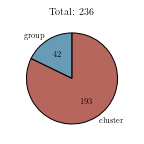

In [53]:
def absolute_value(pct, allvals):
    absolute = int(pct/100.*np.sum(allvals))
    return f"{absolute:d}"

breakingpoint = 67
'''Iso'''
Iso_CSSs = np.array(CSSs3['ID'])[np.where( np.array( (CSSs3['Number'] == 1) & (CSSs3['Traced or Not'] == 1) ) )]
'''MP'''
MP_fl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) )]
MP_grp_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) )]
MP_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]

MP_fl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0))]
MP_fl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
MP_grp_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0))]
MP_grp_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint))]
MP_cl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0)) ]
MP_cl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.5) & ((13.8-CSSs3['MWted-Age']) <= 8.5) & (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
'''MRY'''
MRY_fl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) ) ]
MRY_grp_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRY_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]

MRY_fl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 0)) ]
MRY_fl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
MRY_grp_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0)) ]
MRY_grp_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
MRY_cl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0)) ]
MRY_cl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
'''MRI'''
MRI_grp_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRI_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]

MRI_grp_CSSs_1 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint)) ]
MRI_grp_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0)) ]
MRI_grp_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
MRI_cl_CSSs_1 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13)  & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint)) ]
MRI_cl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0)) ]
MRI_cl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
'''MRO'''
MRO_grp_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRO_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]

MRO_grp_CSSs_1 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint)) ]
MRO_grp_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 0)) ]
MRO_grp_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]
MRO_cl_CSSs_1 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] <= breakingpoint)) ]
MRO_cl_CSSs_0 = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 0)) ]
MRO_cl_CSSs_brk = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) & (CSSs3['Traced or Not'] == 1) & (CSSs3['last_snap'] > breakingpoint)) ]

total_MP_0 = len(MP_cl_CSSs_0)+len(MP_grp_CSSs_0)
total_MP_brk = len(MP_cl_CSSs_brk)+len(MP_grp_CSSs_brk)
total_MRY_0 = len(MRY_cl_CSSs_0)+len(MRY_grp_CSSs_0)
total_MRY_brk = len(MRY_cl_CSSs_brk)+len(MRY_grp_CSSs_brk)

total_MRI_1 = len(MRI_cl_CSSs_1)+len(MRI_grp_CSSs_1)
total_MRI_0 = len(MRI_cl_CSSs_0)+len(MRI_grp_CSSs_0)
total_MRI_brk = len(MRI_cl_CSSs_brk)+len(MRI_grp_CSSs_brk)
total_MRO_0 = len(MRO_cl_CSSs_0)+len(MRO_grp_CSSs_0)
total_MRO_brk = len(MRO_cl_CSSs_brk)+len(MRO_grp_CSSs_brk)

import numpy as np
import matplotlib.pyplot as plt
from astroML.plotting import setup_text_plots
#Lets text in plots use latex
setup_text_plots(usetex=True)

# Calculate the total number of CSSs in each category
total_Iso = len(Iso_CSSs)
total_MP = len(MP_fl_CSSs) + len(MP_grp_CSSs) + len(MP_cl_CSSs)
total_MRY = len(MRY_fl_CSSs) + len(MRY_grp_CSSs) + len(MRY_cl_CSSs)
total_MRI = len(MRI_grp_CSSs) + len(MRI_cl_CSSs)
total_MRO = len(MRO_grp_CSSs) + len(MRO_cl_CSSs)

print(MRO_cl_CSSs_1)
# print(len(MRO_cl_CSSs)+len(MRO_grp_CSSs))
print(len(MRO_cl_CSSs_1)+len(MRO_grp_CSSs_1))
print(len(MRO_cl_CSSs_brk)+len(MRO_grp_CSSs_brk))
print(len(MRO_cl_CSSs_0)+len(MRO_grp_CSSs_0))
# Define labels and sizes for the pie charts

# Filter out sizes with zero values
# sizes_MP = [val for val in [len(Iso_CSSs), len(MP_fl_CSSs), len(MP_grp_CSSs), len(MP_cl_CSSs)] if val != 0]
# sizes_MRY = [val for val in [len(MRY_fl_CSSs), len(MRY_grp_CSSs), len(MRY_cl_CSSs)] if val != 0]
# sizes_MRI = [val for val in [len(MRI_grp_CSSs), len(MRI_cl_CSSs)]]
sizes_MRO = [val for val in [len(MRO_grp_CSSs)+len(MRI_grp_CSSs), len(MRO_cl_CSSs)+len(MRI_cl_CSSs)]]

labels = ['Iso', 'field', 'group', 'cluster']
# Filter out labels with zero values
labels_MP = [label for label, val in zip(labels, sizes_MP) if val != 0]

labels = ['field', 'group', 'cluster']
labels_MRY = [label for label, val in zip(labels, sizes_MRY) if val != 0]

labels = ['group', 'cluster']
labels_MRI = [label for label, val in zip(labels, sizes_MRI) if val != 0]
labels_MRO = [label for label, val in zip(labels, sizes_MRO) if val != 0]

# Define colors for 'fl', 'grp', and 'cl'
Iso = (200/255,200/255,200/255)
grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)
colors = [Iso, fl, grp, cl]

# Plot the pie charts
fig, axs = plt.subplots(1, 1,figsize=(2,2))

# axs[0].pie(sizes_MP, labels=labels_MP, autopct=lambda pct: absolute_value(pct, sizes_MP), startangle=90, colors=colors[:len(sizes_MP)], textprops={'fontsize': 8})
# # axs[0].pie(sizes_MP, labels=labels_MP, autopct='%1.1f%%', startangle=90, colors=colors[:len(sizes_MP)],textprops={'fontsize': 8})
# axs[0].set_title(f"a. MP - Total: {total_MP+total_Iso}({total_Iso+total_MP-total_MP_brk-total_MP_0}+{total_MP_brk}+{total_MP_0})",fontsize=10)
# axs[3].pie(sizes_MRY, labels=labels_MRY, autopct=lambda pct: absolute_value(pct, sizes_MRY), startangle=90, colors=[fl, grp, cl], textprops={'fontsize': 8})
# # axs[3].pie(sizes_MRY, labels=labels_MRY, autopct='%1.1f%%', startangle=90, colors=[fl, grp, cl], textprops={'fontsize': 8})
# axs[3].set_title(f"d. MRY - Total: {total_MRY}({total_MRY-total_MRY_brk-total_MRY_0}+{total_MRY_brk}+{total_MRY_0})",fontsize=10)
colors = [grp, cl]
# axs[1].pie(sizes_MRI, labels=labels_MRI, autopct=lambda pct: absolute_value(pct, sizes_MRI), startangle=90, colors=colors[:len(sizes_MRI)], textprops={'fontsize': 8})
# # axs[2].pie(sizes_MRI, labels=labels_MRI, autopct='%1.1f%%', startangle=90, colors=colors[:len(sizes_MRI)],textprops={'fontsize': 8})
# axs[1].set_title(f"c. MRI - Total: {total_MRI}",fontsize=10)
axs.pie(sizes_MRO, labels=labels_MRO, autopct=lambda pct: absolute_value(pct, sizes_MRO), startangle=90, colors=colors[:len(sizes_MRO)], textprops={'fontsize': 8})
# axs[1].pie(sizes_MRO, labels=labels_MRO, autopct='%1.1f%%', startangle=90, colors=colors[:len(sizes_MRO)],textprops={'fontsize': 8})
axs.set_title(f"Total: {total_MRO+total_MRI}",fontsize=10)

# Adjust layout
plt.tight_layout()
plt.savefig('/home/bianyuan/workspace/pic/env_pie_2.pdf')

In [7]:
print(len(np.array(CSSs3['ID'])[np.where(CSSs3['Traced or Not'] == 1)]))

862


/tmp/ipykernel_20919/1151476156.py:73: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, ticks=color_bins, boundaries=color_bins, format='%.1f')


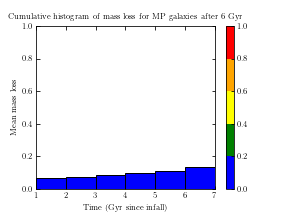

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the new data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_lost_stars_6.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_time_6.txt', header=None, sep=' ')

# Combine the new data into a single DataFrame
data_6 = pd.DataFrame({
    'mass_loss': data_lost_6.stack().values,
    'time': data_time_6.stack().values
})

# Convert the string representation of lists to actual lists of floats
data_6['mass_loss'] = data_6['mass_loss'].apply(lambda x: [float(i) for i in x.split(',')])
data_6['time'] = data_6['time'].apply(lambda x: [float(i) for i in x.split(',')])

# "Explode" the lists to get one row per value
data_6 = data_6.explode('mass_loss').explode('time')

# Convert the columns to numeric
data_6['mass_loss'] = pd.to_numeric(data_6['mass_loss'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the color bins and the corresponding colors
color_bins = np.linspace(0, 1, num=6)
colors = ['blue', 'green', 'yellow', 'orange', 'red']

# Define the time bins
time_bins_new = np.linspace(0, 6, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Define the colormap
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1)

# Calculate the mean mass loss in each time bin
mean_mass_loss_6 = data_6.groupby('time_bin')['mass_loss'].mean()

# Assign each time bin to a color bin based on the mean mass loss
color_bins_for_time_6 = pd.cut(mean_mass_loss_6, bins=color_bins, labels=False, include_lowest=True)

# Prepare the data for the histogram
hist_data_6 = pd.DataFrame({'time_bin': mean_mass_loss_6.index, 'mean_mass_loss': mean_mass_loss_6, 'color_bin': color_bins_for_time_6})

# Define the heights for the parts of the bars
heights = [0.2, 0.2, 0.2, 0.2, 0.2]

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))

# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    hist_data_color_bin_6 = hist_data_6[hist_data_6['color_bin'] == color_bin]
    for row in hist_data_color_bin_6.itertuples():
        # Calculate the bottom and top of the part of the bar
        bottom = sum(heights[:color_bin])
        top = bottom + heights[color_bin]
        if top > row.mean_mass_loss:
            top = row.mean_mass_loss
        # Create the part of the bar
        ax.bar(row.time_bin.right, top - bottom, bottom=bottom, color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
plt.colorbar(sm, ticks=color_bins, boundaries=color_bins, format='%.1f')

# Add labels
plt.xlabel('Time (Gyr since infall)')
plt.ylabel('Mean mass loss')
plt.ylim(0,1)
plt.title('Cumulative histogram of mass loss for MP galaxies after 6 Gyr')

# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{color_bins[i]} - {color_bins[i+1]}') for i in range(len(colors))]

plt.savefig('/home/bianyuan/workspace/pic/MP_masslossratio.pdf')

/tmp/ipykernel_20919/1176702213.py:73: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, ticks=color_bins, boundaries=color_bins, format='%.1f')


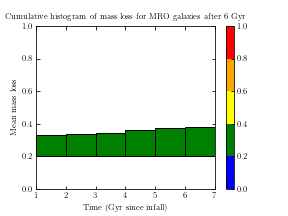

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the new data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_lost_stars_6.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_time_6.txt', header=None, sep=' ')

# Combine the new data into a single DataFrame
data_6 = pd.DataFrame({
    'mass_loss': data_lost_6.stack().values,
    'time': data_time_6.stack().values
})


# Convert the string representation of lists to actual lists of floats
data_6['mass_loss'] = data_6['mass_loss'].apply(lambda x: [float(i) for i in x.split(',')])
data_6['time'] = data_6['time'].apply(lambda x: [float(i) for i in x.split(',')])

# "Explode" the lists to get one row per value
data_6 = data_6.explode('mass_loss').explode('time')

# Convert the columns to numeric
data_6['mass_loss'] = pd.to_numeric(data_6['mass_loss'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the color bins and the corresponding colors
color_bins = np.linspace(0, 1, num=6)
colors = ['blue', 'green', 'yellow', 'orange', 'red']

# Define the time bins
time_bins_new = np.linspace(0, 6, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Define the colormap
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1)

# Calculate the mean mass loss in each time bin
mean_mass_loss_6 = data_6.groupby('time_bin')['mass_loss'].mean()

# Assign each time bin to a color bin based on the mean mass loss
color_bins_for_time_6 = pd.cut(mean_mass_loss_6, bins=color_bins, labels=False, include_lowest=True)

# Prepare the data for the histogram
hist_data_6 = pd.DataFrame({'time_bin': mean_mass_loss_6.index, 'mean_mass_loss': mean_mass_loss_6, 'color_bin': color_bins_for_time_6})

# Define the heights for the parts of the bars
heights = [0.2, 0.2, 0.2, 0.2, 0.2]

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))

# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    hist_data_color_bin_6 = hist_data_6[hist_data_6['color_bin'] == color_bin]
    for row in hist_data_color_bin_6.itertuples():
        # Calculate the bottom and top of the part of the bar
        bottom = sum(heights[:color_bin])
        top = bottom + heights[color_bin]
        if top > row.mean_mass_loss:
            top = row.mean_mass_loss
        # Create the part of the bar
        ax.bar(row.time_bin.right, top - bottom, bottom=bottom, color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
plt.colorbar(sm, ticks=color_bins, boundaries=color_bins, format='%.1f')

# Add labels
plt.xlabel('Time (Gyr since infall)')
plt.ylabel('Mean mass loss')
plt.ylim(0,1)
plt.title('Cumulative histogram of mass loss for MRO galaxies after 6 Gyr')

# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{color_bins[i]} - {color_bins[i+1]}') for i in range(len(colors))]

plt.savefig('/home/bianyuan/workspace/pic/MRO_masslossratio.pdf')

/tmp/ipykernel_20919/893658021.py:73: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(sm, ticks=color_bins, boundaries=color_bins, format='%.1f')


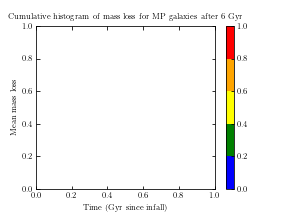

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_new_stars_6.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_time_6.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the color bins and the corresponding colors
color_bins = np.linspace(0, 1, num=6)
colors = ['blue', 'green', 'yellow', 'orange', 'red']

# Define the time bins
time_bins_new = np.linspace(0, 6, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Define the colormap
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1)

# Calculate the mean mass loss in each time bin
mean_new_stars_6 = data_6.groupby('time_bin')['new_stars'].mean()

# Assign each time bin to a color bin based on the mean mass loss
color_bins_for_time_6 = pd.cut(mean_new_stars_6, bins=color_bins, labels=False, include_lowest=True)

# Prepare the data for the histogram
hist_data_6 = pd.DataFrame({'time_bin': mean_new_stars_6.index, 'mean_new_stars': mean_new_stars_6, 'color_bin': color_bins_for_time_6})

# Define the heights for the parts of the bars
heights = [0.2, 0.2, 0.2, 0.2, 0.2]

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))

# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    hist_data_color_bin_6 = hist_data_6[hist_data_6['color_bin'] == color_bin]
    for row in hist_data_color_bin_6.itertuples():
        # Calculate the bottom and top of the part of the bar
        bottom = sum(heights[:color_bin])
        top = bottom + heights[color_bin]
        if top > row.mean_new_stars:
            top = row.mean_new_stars
        # Create the part of the bar
        ax.bar(row.time_bin.right, top - bottom, bottom=bottom, color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
plt.colorbar(sm, ticks=color_bins, boundaries=color_bins, format='%.1f')

# Add labels
plt.xlabel('Time (Gyr since infall)')
plt.ylabel('Mean mass loss')
plt.ylim(0,1)
plt.title('Cumulative histogram of mass loss for MP galaxies after 6 Gyr')

# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{color_bins[i]} - {color_bins[i+1]}') for i in range(len(colors))]

plt.savefig('/home/bianyuan/workspace/pic/MP_newmassratio.png')

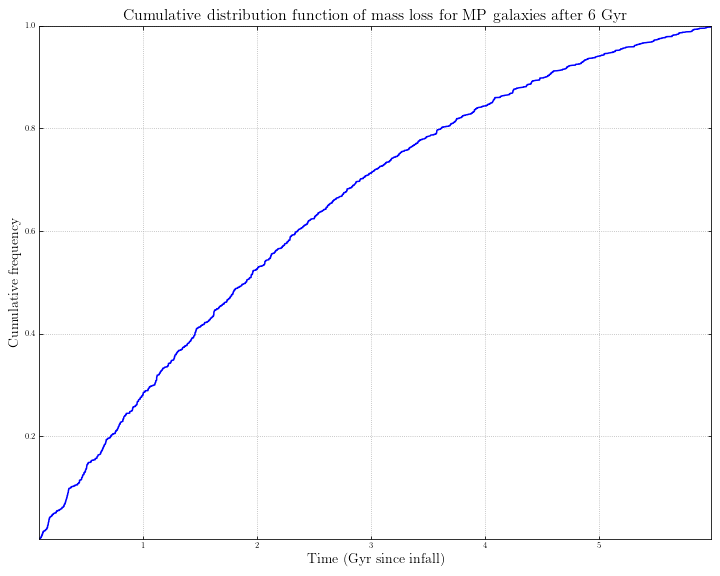

In [6]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_new_stars_6.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_time_6.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'mass_loss': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['mass_loss'] = pd.to_numeric(data_6['mass_loss'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Sort the data by time
data_6_sorted = data_6.sort_values(by='time')

# Calculate the cumulative frequency
data_6_sorted['cumulative_frequency'] = np.arange(1, len(data_6_sorted) + 1) / len(data_6_sorted)

# Plot the cumulative distribution function without color coding
fig, ax = plt.subplots(figsize=(10, 8))

# Draw the line
ax.plot(data_6_sorted['time'], data_6_sorted['cumulative_frequency'], color='blue')

# Add labels
plt.xlabel('Time (Gyr since infall)', fontsize=14)
plt.ylabel('Cumulative frequency', fontsize=14)
plt.title('Cumulative distribution function of mass loss for MP galaxies after 6 Gyr', fontsize=16)

plt.grid(True)
plt.tight_layout()

plt.savefig('/home/bianyuan/workspace/pic/MP_ratio.pdf')

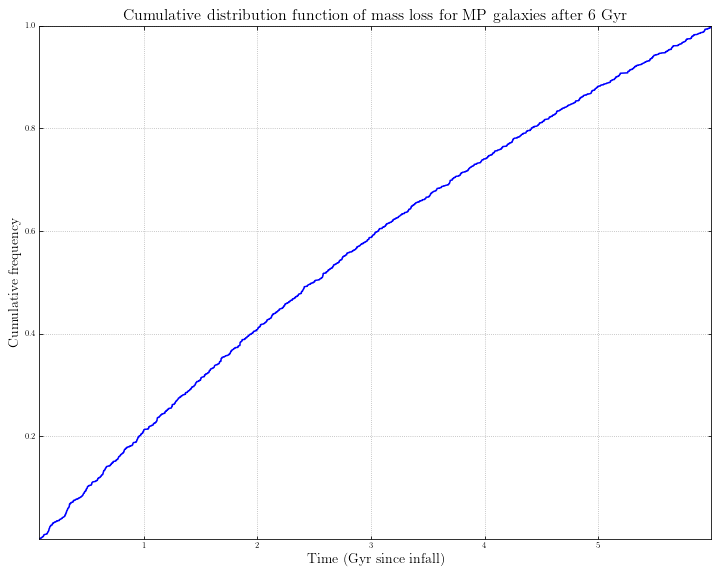

In [7]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_new_stars_6.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_time_6.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'mass_loss': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['mass_loss'] = pd.to_numeric(data_6['mass_loss'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Sort the data by time
data_6_sorted = data_6.sort_values(by='time')

# Calculate the cumulative frequency
data_6_sorted['cumulative_frequency'] = np.arange(1, len(data_6_sorted) + 1) / len(data_6_sorted)

# Plot the cumulative distribution function without color coding
fig, ax = plt.subplots(figsize=(10, 8))

# Draw the line
ax.plot(data_6_sorted['time'], data_6_sorted['cumulative_frequency'], color='blue')

# Add labels
plt.xlabel('Time (Gyr since infall)', fontsize=14)
plt.ylabel('Cumulative frequency', fontsize=14)
plt.title('Cumulative distribution function of mass loss for MP galaxies after 6 Gyr', fontsize=16)

plt.grid(True)
plt.tight_layout()

plt.savefig('/home/bianyuan/workspace/pic/MRO_ratio.pdf')

/tmp/ipykernel_30928/2435463776.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_6_filtered['color_bin'] = pd.cut(data_6_filtered['new_stars'], bins=color_bins, labels=False, include_lowest=True)
/tmp/ipykernel_30928/2435463776.py:72: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')


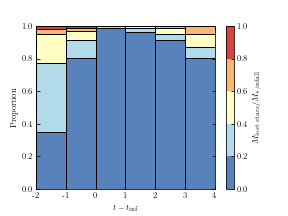

In [24]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_lost_4.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_time_4.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the time bins
time_bins_new = np.linspace(-2, 4, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Filter out outliers that are above a certain threshold
threshold = 1
data_6_filtered = data_6[data_6['new_stars'] <= threshold]

# Assign each mass loss to a color bin
color_bins = np.linspace(0, 1, num=6)
data_6_filtered['color_bin'] = pd.cut(data_6_filtered['new_stars'], bins=color_bins, labels=False, include_lowest=True)

# Calculate the frequency of each color bin in each time bin
color_bin_counts = data_6_filtered.groupby(['time_bin', 'color_bin']).size().unstack(fill_value=0)

# Normalize the frequencies to get proportions
color_bin_props = color_bin_counts.divide(color_bin_counts.sum(axis=1), axis=0)

# Convert 'time_bin' back to IntervalIndex
color_bin_props.index = color_bin_props.index.categories

# Define the colors
colors = [(69/255,116/255,180/255,0.9), (169/255,216/255,233/255,0.9), (254/255,254/255,190/255,0.9), (250/255,173/255,97/255,0.9), (214/255,47/255,39/255,0.9)]

# Define the colormap with the correct range
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1)

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))

# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    # Create the part of the bar
    ax.bar(color_bin_props.index.right, color_bin_props[color_bin], bottom=color_bin_props.iloc[:, :color_bin].sum(axis=1), 
           color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')
cbar.set_label(r'$M_{\mathrm{lost\ stars}}/M_{*,{\mathrm{infall}}}$')

# Add labels
plt.xlabel(r'$t - t_{\mathrm{inf}}$')
plt.ylabel('Proportion')
# plt.xlim(1 ,7)
plt.ylim(0, 1)

plt.xticks([-1, 0, 1, 2, 3, 4, 5], [-2, -1, 0, 1, 2, 3, 4])
# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{i/5:.1f} - {(i+1)/5:.1f}') for i in range(len(colors))]
# plt.legend(handles=patches, loc='upper right')

plt.savefig('/home/bianyuan/workspace/pic/MP_lostmassratio.pdf')

/tmp/ipykernel_30928/210696851.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_6_filtered['color_bin'] = pd.cut(data_6_filtered['new_stars'], bins=color_bins, labels=False, include_lowest=True)
/tmp/ipykernel_30928/210696851.py:72: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')


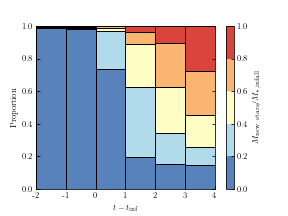

In [29]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_new_4.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_time_4.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the time bins
time_bins_new = np.linspace(-2, 4, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Filter out outliers that are above a certain threshold
threshold = 1
data_6_filtered = data_6[data_6['new_stars'] <= threshold]

# Assign each mass loss to a color bin
color_bins = np.linspace(0, 1, num=6)
data_6_filtered['color_bin'] = pd.cut(data_6_filtered['new_stars'], bins=color_bins, labels=False, include_lowest=True)

# Calculate the frequency of each color bin in each time bin
color_bin_counts = data_6_filtered.groupby(['time_bin', 'color_bin']).size().unstack(fill_value=0)

# Normalize the frequencies to get proportions
color_bin_props = color_bin_counts.divide(color_bin_counts.sum(axis=1), axis=0)

# Convert 'time_bin' back to IntervalIndex
color_bin_props.index = color_bin_props.index.categories

# Define the colors
colors = [(69/255,116/255,180/255,0.9), (169/255,216/255,233/255,0.9), (254/255,254/255,190/255,0.9), (250/255,173/255,97/255,0.9), (214/255,47/255,39/255,0.9)]

# Define the colormap with the correct range
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1)

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))

# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    # Create the part of the bar
    ax.bar(color_bin_props.index.right, color_bin_props[color_bin], bottom=color_bin_props.iloc[:, :color_bin].sum(axis=1), 
           color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')
cbar.set_label(r'$M_{\mathrm{new\ stars}}/M_{*,{\mathrm{infall}}}$')

# Add labels
plt.xlabel(r'$t - t_{\mathrm{inf}}$')
plt.ylabel('Proportion')
# plt.xlim(1 ,7)
plt.ylim(0, 1)

plt.xticks([-1, 0, 1, 2, 3, 4, 5], [-2, -1, 0, 1, 2, 3, 4])
# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{i/5:.1f} - {(i+1)/5:.1f}') for i in range(len(colors))]
# plt.legend(handles=patches, loc='upper right')

plt.savefig('/home/bianyuan/workspace/pic/MP_newmassratio.pdf')

/tmp/ipykernel_30928/2082379281.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_6_filtered['color_bin'] = pd.cut(data_6_filtered['new_stars'], bins=color_bins, labels=False, include_lowest=True)
/tmp/ipykernel_30928/2082379281.py:72: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')


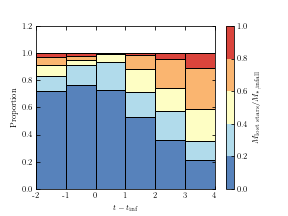

In [30]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_lost_4.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_time_4.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the time bins
time_bins_new = np.linspace(-2, 4, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Filter out outliers that are above a certain threshold
threshold = 1.2
data_6_filtered = data_6[data_6['new_stars'] <= threshold]

# Assign each mass loss to a color bin
color_bins = np.linspace(0, 1, num=6)
data_6_filtered['color_bin'] = pd.cut(data_6_filtered['new_stars'], bins=color_bins, labels=False, include_lowest=True)

# Calculate the frequency of each color bin in each time bin
color_bin_counts = data_6_filtered.groupby(['time_bin', 'color_bin']).size().unstack(fill_value=0)

# Normalize the frequencies to get proportions
color_bin_props = color_bin_counts.divide(color_bin_counts.sum(axis=1), axis=0)

# Convert 'time_bin' back to IntervalIndex
color_bin_props.index = color_bin_props.index.categories

# Define the colors
colors = [(69/255,116/255,180/255,0.9), (169/255,216/255,233/255,0.9), (254/255,254/255,190/255,0.9), (250/255,173/255,97/255,0.9), (214/255,47/255,39/255,0.9)]

# Define the colormap with the correct range
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1)

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))

# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    # Create the part of the bar
    ax.bar(color_bin_props.index.right, color_bin_props[color_bin], bottom=color_bin_props.iloc[:, :color_bin].sum(axis=1), 
           color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')
cbar.set_label(r'$M_{\mathrm{lost\ stars}}/M_{*,{\mathrm{infall}}}$')

# Add labels
plt.xlabel(r'$t - t_{\mathrm{inf}}$')
plt.ylabel('Proportion')
# plt.xlim(1 ,7)
plt.ylim(0, 1.2)
plt.xticks([-1, 0, 1, 2, 3, 4, 5], [-2, -1, 0, 1, 2, 3, 4])

# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{i/5:.1f} - {(i+1)/5:.1f}') for i in range(len(colors))]
# plt.legend(handles=patches, loc='upper right')

plt.savefig('/home/bianyuan/workspace/pic/MRO_lostmassratio.pdf')

/tmp/ipykernel_22893/1137279861.py:43: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_6_filtered['color_bin'] = pd.cut(data_6_filtered['new_stars'], bins=color_bins, labels=False, include_lowest=True)
/tmp/ipykernel_22893/1137279861.py:72: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')


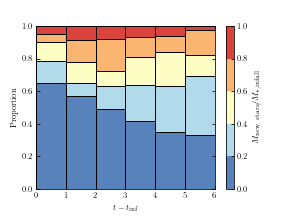

In [16]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_new_stars_6.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_time_6.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the time bins
time_bins_new = np.linspace(0, 6, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Filter out outliers that are above a certain threshold
threshold = 1
data_6_filtered = data_6[data_6['new_stars'] <= threshold]

# Assign each mass loss to a color bin
color_bins = np.linspace(0, 1, num=6)
data_6_filtered['color_bin'] = pd.cut(data_6_filtered['new_stars'], bins=color_bins, labels=False, include_lowest=True)

# Calculate the frequency of each color bin in each time bin
color_bin_counts = data_6_filtered.groupby(['time_bin', 'color_bin']).size().unstack(fill_value=0)

# Normalize the frequencies to get proportions
color_bin_props = color_bin_counts.divide(color_bin_counts.sum(axis=1), axis=0)

# Convert 'time_bin' back to IntervalIndex
color_bin_props.index = color_bin_props.index.categories

# Define the colors
colors = [(69/255,116/255,180/255,0.9), (169/255,216/255,233/255,0.9), (254/255,254/255,190/255,0.9), (250/255,173/255,97/255,0.9), (214/255,47/255,39/255,0.9)]

# Define the colormap with the correct range
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1)

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))

# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    # Create the part of the bar
    ax.bar(color_bin_props.index.right, color_bin_props[color_bin], bottom=color_bin_props.iloc[:, :color_bin].sum(axis=1), 
           color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')
cbar.set_label(r'$M_{\mathrm{new\ stars}}/M_{*,{\mathrm{infall}}}$')

# Add labels
plt.xlabel(r'$t - t_{\mathrm{inf}}$')
plt.ylabel('Proportion')
plt.xlim(1 ,7)
plt.ylim(0, 1)
plt.xticks([1, 2, 3, 4, 5, 6, 7], [0, 1, 2, 3, 4, 5, 6])

# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{i/5:.1f} - {(i+1)/5:.1f}') for i in range(len(colors))]
# plt.legend(handles=patches, loc='upper right')

plt.savefig('/home/bianyuan/workspace/pic/MRO_newmassratio.pdf')

/tmp/ipykernel_30928/3303434782.py:71: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')


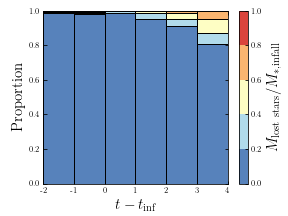

In [45]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_lost_4.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_time_4.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the time bins
time_bins_new = np.linspace(-2, 4, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Cap the 'new_stars' values at 1
data_6['new_stars_capped'] = np.minimum(data_6['new_stars'], 1)

# Assign each mass loss to a color bin
color_bins = np.linspace(0, 1, num=6)
data_6['color_bin'] = pd.cut(data_6['new_stars_capped'], bins=color_bins, labels=False, include_lowest=True)

# Calculate the frequency of each color bin in each time bin
color_bin_counts = data_6.groupby(['time_bin', 'color_bin']).size().unstack(fill_value=0)

# Normalize the frequencies to get proportions
color_bin_props = color_bin_counts.divide(color_bin_counts.sum(axis=1), axis=0)

# Convert 'time_bin' back to IntervalIndex
color_bin_props.index = color_bin_props.index.categories

# Define the colors
colors = [(69/255,116/255,180/255,0.9), (169/255,216/255,233/255,0.9), (254/255,254/255,190/255,0.9), (250/255,173/255,97/255,0.9), (214/255,47/255,39/255,0.9)]

# Define the colormap with the correct range
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1)

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95, wspace=0.15, hspace=0.07)
# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    # Create the part of the bar
    ax.bar(color_bin_props.index.right, color_bin_props[color_bin], bottom=color_bin_props.iloc[:, :color_bin].sum(axis=1), 
           color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')
cbar.set_label(r'$M_{\mathrm{lost\ stars}}/M_{*,{\mathrm{infall}}}$',fontsize=15)

# Add labels
plt.xlabel(r'$t - t_{\mathrm{inf}}$',fontsize=15)
plt.ylabel('Proportion',fontsize=15)
# plt.xlim(1 ,7)
# plt.ylim(0, 1)

plt.xticks([-1, 0, 1, 2, 3, 4, 5], [-2, -1, 0, 1, 2, 3, 4])
# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{i/5:.1f} - {(i+1)/5:.1f}') for i in range(len(colors))]
# plt.legend(handles=patches, loc='upper right')

plt.savefig('/home/bianyuan/workspace/pic/MP_lostmassratio.pdf')

/tmp/ipykernel_30928/1687410244.py:71: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')


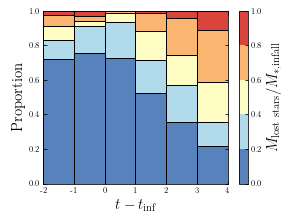

In [46]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_lost_4.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_time_4.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the time bins
time_bins_new = np.linspace(-2, 4, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Cap the 'new_stars' values at 1
data_6['new_stars_capped'] = np.minimum(data_6['new_stars'], 1)

# Assign each mass loss to a color bin
color_bins = np.linspace(0, 1, num=6)
data_6['color_bin'] = pd.cut(data_6['new_stars_capped'], bins=color_bins, labels=False, include_lowest=True)

# Calculate the frequency of each color bin in each time bin
color_bin_counts = data_6.groupby(['time_bin', 'color_bin']).size().unstack(fill_value=0)

# Normalize the frequencies to get proportions
color_bin_props = color_bin_counts.divide(color_bin_counts.sum(axis=1), axis=0)

# Convert 'time_bin' back to IntervalIndex
color_bin_props.index = color_bin_props.index.categories

# Define the colors
colors = [(69/255,116/255,180/255,0.9), (169/255,216/255,233/255,0.9), (254/255,254/255,190/255,0.9), (250/255,173/255,97/255,0.9), (214/255,47/255,39/255,0.9)]

# Define the colormap with the correct range
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1)

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95, wspace=0.15, hspace=0.07)
# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    # Create the part of the bar
    ax.bar(color_bin_props.index.right, color_bin_props[color_bin], bottom=color_bin_props.iloc[:, :color_bin].sum(axis=1), 
           color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ticks=np.linspace(0, 1, 6), boundaries=np.linspace(0, 1, 6), format='%.1f')
cbar.set_label(r'$M_{\mathrm{lost\ stars}}/M_{*,{\mathrm{infall}}}$',fontsize=15)

# Add labels
plt.xlabel(r'$t - t_{\mathrm{inf}}$',fontsize=15)
plt.ylabel('Proportion',fontsize=15)
# plt.xlim(1 ,7)
# plt.ylim(0, 1)

plt.xticks([-1, 0, 1, 2, 3, 4, 5], [-2, -1, 0, 1, 2, 3, 4])
# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{i/5:.1f} - {(i+1)/5:.1f}') for i in range(len(colors))]
# plt.legend(handles=patches, loc='upper right')

plt.savefig('/home/bianyuan/workspace/pic/MRO_lostmassratio.pdf')

/tmp/ipykernel_30928/4194585977.py:71: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 1.2, 6), boundaries=np.linspace(0, 1.2, 6), format='%.1f')


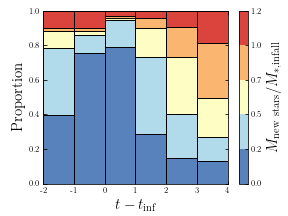

In [47]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_new_4.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_time_4.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the time bins
time_bins_new = np.linspace(-2, 4, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Cap the 'new_stars' values at 1
data_6['new_stars_capped'] = np.minimum(data_6['new_stars'], 1.2)

# Assign each mass loss to a color bin
color_bins = np.linspace(0, 1.2, num=6)
data_6['color_bin'] = pd.cut(data_6['new_stars_capped'], bins=color_bins, labels=False, include_lowest=True)

# Calculate the frequency of each color bin in each time bin
color_bin_counts = data_6.groupby(['time_bin', 'color_bin']).size().unstack(fill_value=0)

# Normalize the frequencies to get proportions
color_bin_props = color_bin_counts.divide(color_bin_counts.sum(axis=1), axis=0)

# Convert 'time_bin' back to IntervalIndex
color_bin_props.index = color_bin_props.index.categories

# Define the colors
colors = [(69/255,116/255,180/255,0.9), (169/255,216/255,233/255,0.9), (254/255,254/255,190/255,0.9), (250/255,173/255,97/255,0.9), (214/255,47/255,39/255,0.9)]

# Define the colormap with the correct range
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1.2)

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95, wspace=0.15, hspace=0.07)
# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    # Create the part of the bar
    ax.bar(color_bin_props.index.right, color_bin_props[color_bin], bottom=color_bin_props.iloc[:, :color_bin].sum(axis=1), 
           color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ticks=np.linspace(0, 1.2, 6), boundaries=np.linspace(0, 1.2, 6), format='%.1f')
cbar.set_label(r'$M_{\mathrm{new\ stars}}/M_{*,{\mathrm{infall}}}$',fontsize=15)

# Add labels
plt.xlabel(r'$t - t_{\mathrm{inf}}$',fontsize=15)
plt.ylabel('Proportion',fontsize=15)
# plt.xlim(1 ,7)
# plt.ylim(0, 1)

plt.xticks([-1, 0, 1, 2, 3, 4, 5], [-2, -1, 0, 1, 2, 3, 4])
# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{i/5:.1f} - {(i+1)/5:.1f}') for i in range(len(colors))]
# plt.legend(handles=patches, loc='upper right')

plt.savefig('/home/bianyuan/workspace/pic/MP_newmassratio.pdf')

/tmp/ipykernel_30928/1063492786.py:71: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 1.2, 6), boundaries=np.linspace(0, 1.2, 6), format='%.1f')


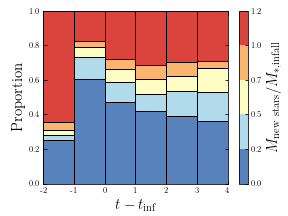

In [49]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_new_4.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MRO/MRO_time_4.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the time bins
time_bins_new = np.linspace(-2, 4, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Cap the 'new_stars' values at 1
data_6['new_stars_capped'] = np.minimum(data_6['new_stars'], 1.2)

# Assign each mass loss to a color bin
color_bins = np.linspace(0, 1.2, num=6)
data_6['color_bin'] = pd.cut(data_6['new_stars_capped'], bins=color_bins, labels=False, include_lowest=True)

# Calculate the frequency of each color bin in each time bin
color_bin_counts = data_6.groupby(['time_bin', 'color_bin']).size().unstack(fill_value=0)

# Normalize the frequencies to get proportions
color_bin_props = color_bin_counts.divide(color_bin_counts.sum(axis=1), axis=0)

# Convert 'time_bin' back to IntervalIndex
color_bin_props.index = color_bin_props.index.categories

# Define the colors
colors = [(69/255,116/255,180/255,0.9), (169/255,216/255,233/255,0.9), (254/255,254/255,190/255,0.9), (250/255,173/255,97/255,0.9), (214/255,47/255,39/255,0.9)]

# Define the colormap with the correct range
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1.2)

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))
plt.subplots_adjust(left=0.15, bottom=0.15, right=0.95, top=0.95, wspace=0.15, hspace=0.07)
# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    # Create the part of the bar
    ax.bar(color_bin_props.index.right, color_bin_props[color_bin], bottom=color_bin_props.iloc[:, :color_bin].sum(axis=1), 
           color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ticks=np.linspace(0, 1.2, 6), boundaries=np.linspace(0, 1.2, 6), format='%.1f')
cbar.set_label(r'$M_{\mathrm{new\ stars}}/M_{*,{\mathrm{infall}}}$',fontsize=15)

# Add labels
plt.xlabel(r'$t - t_{\mathrm{inf}}$',fontsize=15)
plt.ylabel('Proportion',fontsize=15)
# plt.xlim(1 ,7)
# plt.ylim(0, 1)

plt.xticks([-1, 0, 1, 2, 3, 4, 5], [-2, -1, 0, 1, 2, 3, 4])
# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{i/5:.1f} - {(i+1)/5:.1f}') for i in range(len(colors))]
# plt.legend(handles=patches, loc='upper right')

plt.savefig('/home/bianyuan/workspace/pic/MRO_newmassratio.pdf')

/tmp/ipykernel_30928/361413380.py:71: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  cbar = plt.colorbar(sm, ticks=np.linspace(0, 1.2, 6), boundaries=np.linspace(0, 1.2, 6), format='%.1f')


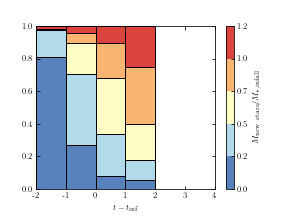

In [11]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.colors import Normalize

# Load the data
data_lost_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_fl_new.txt', header=None, sep=' ')
data_time_6 = pd.read_csv('/home/bianyuan/workspace/data/Massinfall/MP/MP_fl_time.txt', header=None, sep=' ')

# Convert the string representation of lists to actual lists of floats
data_lost_6[0] = data_lost_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])
data_time_6[0] = data_time_6[0].apply(lambda x: [float(i) for i in x.split(',')] if ',' in x else [float(x)])

# Explode the lists to get one row per value
data_lost_6_exploded = data_lost_6[0].explode()
data_time_6_exploded = data_time_6[0].explode()

# Combine the data into a single DataFrame
data_6 = pd.DataFrame({
    'new_stars': data_lost_6_exploded.values,
    'time': data_time_6_exploded.values
})

# Convert the columns to numeric
data_6['new_stars'] = pd.to_numeric(data_6['new_stars'])
data_6['time'] = pd.to_numeric(data_6['time'])

# Define the time bins
time_bins_new = np.linspace(-2, 4, num=7)

# Assign each time to a time bin
data_6['time_bin'] = pd.cut(data_6['time'], bins=time_bins_new)

# Cap the 'new_stars' values at 1
data_6['new_stars_capped'] = np.minimum(data_6['new_stars'], 1.2)

# Assign each mass loss to a color bin
color_bins = np.linspace(0, 1.2, num=6)
data_6['color_bin'] = pd.cut(data_6['new_stars_capped'], bins=color_bins, labels=False, include_lowest=True)

# Calculate the frequency of each color bin in each time bin
color_bin_counts = data_6.groupby(['time_bin', 'color_bin']).size().unstack(fill_value=0)

# Normalize the frequencies to get proportions
color_bin_props = color_bin_counts.divide(color_bin_counts.sum(axis=1), axis=0)

# Convert 'time_bin' back to IntervalIndex
color_bin_props.index = color_bin_props.index.categories

# Define the colors
colors = [(69/255,116/255,180/255,0.9), (169/255,216/255,233/255,0.9), (254/255,254/255,190/255,0.9), (250/255,173/255,97/255,0.9), (214/255,47/255,39/255,0.9)]

# Define the colormap with the correct range
cmap = mcolors.ListedColormap(colors)
norm = Normalize(vmin=0, vmax=1.2)

# Create the histogram
fig, ax = plt.subplots(figsize=(4, 3))

# Iterate over the color bins
for color_bin in range(len(color_bins) - 1):
    # Create the part of the bar
    ax.bar(color_bin_props.index.right, color_bin_props[color_bin], bottom=color_bin_props.iloc[:, :color_bin].sum(axis=1), 
           color=colors[color_bin], edgecolor='black', align='edge', width=np.diff(time_bins_new)[0])

# Create a colorbar
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
cbar = plt.colorbar(sm, ticks=np.linspace(0, 1.2, 6), boundaries=np.linspace(0, 1.2, 6), format='%.1f')
cbar.set_label(r'$M_{\mathrm{new\ stars}}/M_{*,{\mathrm{infall}}}$')

# Add labels
plt.xlabel(r'$t - t_{\mathrm{inf}}$')
# plt.ylabel('Proportion')
# plt.xlim(1 ,7)
plt.ylim(0, 1)

plt.xticks([1, 2, 3, 4, 5, 6, 7], [-2, -1, 0, 1, 2, 3, 4])
# Create a legend
patches = [mpatches.Patch(color=colors[i], label=f'{i/5:.1f} - {(i+1)/5:.1f}') for i in range(len(colors))]
# plt.legend(handles=patches, loc='upper right')

plt.savefig('/home/bianyuan/workspace/pic/MP_fl_newmassratio.pdf')

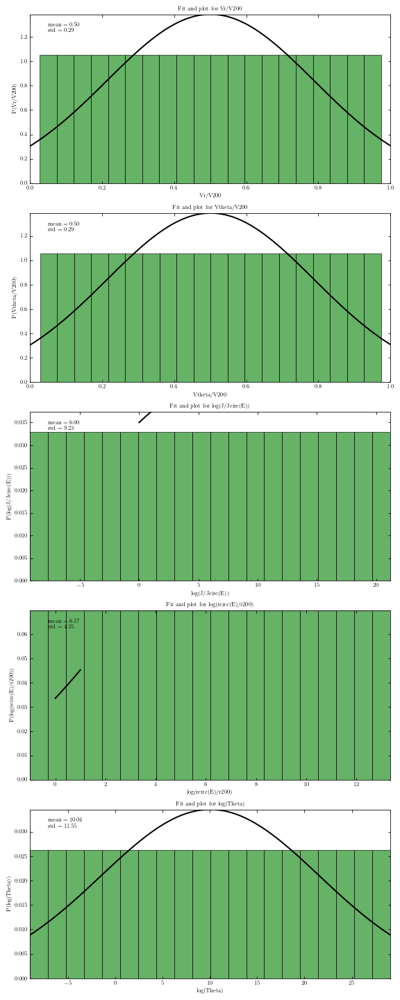

In [24]:
from scipy.optimize import curve_fit
from scipy.stats import norm

frac = 0

# Function to fit (Gaussian)
def gaussian(x, A, mu, sigma):
    return A * np.exp(-(x-mu)**2/(2*sigma**2))

def gaussian_fit_and_plot(x, y, ax, xlabel, ylabel, title):
    """
    Function to fit a Gaussian distribution to the data and plot the histogram and the fitted Gaussian.
    
    Parameters:
    - x: x values of the data
    - y: y values of the data
    - ax: Matplotlib Axes object to plot on
    - xlabel: label for the x-axis
    - ylabel: label for the y-axis
    - title: title for the plot
    """
    # Fit a Gaussian
    mean, std = norm.fit(x)

    # Plot the histogram
    ax.hist(x, bins=20, density=True, alpha=0.6, color='g')

    # Plot the fitted Gaussian
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mean, std)
    ax.plot(x, p, 'k', linewidth=2)
    
    # Set the labels and the title
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)

    # Display the mean and the standard deviation
    textstr = '\n'.join((
        r'$\mathrm{mean}=%.2f$' % (mean, ),
        r'$\mathrm{std}=%.2f$' % (std, )))
    ax.text(0.05, 0.95, textstr, transform=ax.transAxes, verticalalignment='top')

def calculate_variables_fix(file_path, epsilon=1e-10):
    # Constants
    G = 4.302e-6  # gravitational constant in kpc/SM(km/s)^2
    frac = 0

    # Read the HDF5 file
    file = h5py.File(file_path, 'r')

    # Variables to store the results
    Vr_V200_results = []
    Vtheta_V200_results = []
    J_Jcirc_results = []
    rcirc_r200_results = []
    Theta_results = []

    # Loop over all groups in the HDF5 file
    for group in file.keys():

        # Read the data
        x = np.array(file[group]['x'])
        y = np.array(file[group]['y'])
        z = np.array(file[group]['z'])
        vx = np.array(file[group]['vx'])
        vy = np.array(file[group]['vy'])
        vz = np.array(file[group]['vz'])
        Mcen = np.array(file[group]['Mcen'])
        Msat = np.array(file[group]['Msat'])
        r200 = np.array(file[group]['Rvir'])

        # Replace zero values in r200 with epsilon
        r200[r200 == 0] = epsilon

        # Calculate the velocities and distances in spherical coordinates
        v = np.sqrt(vx**2 + vy**2 + vz**2)
        vr = (x*vx + y*vy + z*vz) / np.sqrt(x**2 + y**2 + z**2)
        vtheta = np.sqrt(v**2 - vr**2)
        r = np.sqrt(x**2 + y**2 + z**2)

        # Calculate the total energy E and the angular momentum J
        E = 0.5 * Msat * v**2 - G * Mcen * Msat / r
        J = Msat * vtheta * r

        # Calculate the circular velocity vcirc and the angular momentum for a circular orbit with the same energy Jcirc
        vcirc = np.sqrt(G * Mcen / r)
        Jcirc = Msat * vcirc * r

        # Replace zero values in Jcirc with epsilon
        Jcirc[Jcirc == 0] = epsilon

        # Calculate the parameters
        Vr_V200 = np.abs(vr) / v
        Vtheta_V200 = vtheta / v
        J_Jcirc = J / Jcirc
        rcirc_r200 = r / r200

        # Calculate the compound parameter
        Theta = (rcirc_r200**2) * (J_Jcirc**0.78)

        # Replace zero values in Theta with epsilon
        Theta[Theta == 0] = epsilon

        # Append the results to the result lists
        Vr_V200_results.append(Vr_V200)
        Vtheta_V200_results.append(Vtheta_V200)
        J_Jcirc_results.append(J_Jcirc)
        rcirc_r200_results.append(rcirc_r200)
        Theta_results.append(Theta)

    # Close the HDF5 file
    file.close()

    # Return the results
    return Vr_V200_results, Vtheta_V200_results, J_Jcirc_results, rcirc_r200_results, Theta_results

file_path = '/home/bianyuan/workspace/data/track/MP_cl_orbit2D.hdf5'

# Calculate the variables for the HDF5 file
Vr_V200_results, Vtheta_V200_results, J_Jcirc_results, rcirc_r200_results, Theta_results = calculate_variables_fix(file_path)

# Convert the result lists to arrays
Vr_V200_results = np.concatenate(Vr_V200_results)
Vtheta_V200_results = np.concatenate(Vtheta_V200_results)
J_Jcirc_results = np.concatenate(J_Jcirc_results)
rcirc_r200_results = np.concatenate(rcirc_r200_results)
Theta_results = np.concatenate(Theta_results)

# Replace zero values with a very small number before taking the log
Vr_V200_results[Vr_V200_results == 0] = epsilon
Vtheta_V200_results[Vtheta_V200_results==0] = epsilon
J_Jcirc_results[J_Jcirc_results==0] = epsilon

# Take the log of the results
Vr_V200_results = np.array(np.abs(Vr_V200_results))
Vtheta_V200_results = np.array(Vtheta_V200_results)
log_J_Jcirc_results = np.log10(J_Jcirc_results)
log_rcirc_r200_results = np.log10(rcirc_r200_results)
log_Theta_results = np.log10(Theta_results)

# Calculate the 1D histograms
counts_Vr_V200, edges_Vr_V200 = np.histogram(Vr_V200_results, bins=20, density=True)
counts_Vtheta_V200, edges_Vtheta_V200 = np.histogram(Vtheta_V200_results, bins=20, density=True)
counts_J_Jcirc_log, edges_J_Jcirc_log = np.histogram(log_J_Jcirc_results, bins=20, density=True)
counts_rcirc_r200_log, edges_rcirc_r200_log = np.histogram(log_rcirc_r200_results, bins=20, density=True)
counts_Theta_log, edges_Theta_log = np.histogram(log_Theta_results, bins=20, density=True)

# Calculate the bin centers
bin_centers_Vr_V200 = (edges_Vr_V200[:-1] + edges_Vr_V200[1:]) / 2
bin_centers_Vtheta_V200 = (edges_Vtheta_V200[:-1] + edges_Vtheta_V200[1:]) / 2
bin_centers_J_Jcirc_log = (edges_J_Jcirc_log[:-1] + edges_J_Jcirc_log[1:]) / 2
bin_centers_rcirc_r200_log = (edges_rcirc_r200_log[:-1] + edges_rcirc_r200_log[1:]) / 2
bin_centers_Theta_log = (edges_log_Theta_log[:-1] + edges_log_Theta_log[1:]) / 2

fig, axs = plt.subplots(5, 1, figsize=(8, 20))

gaussian_fit_and_plot(bin_centers_Vr_V200, counts_Vr_V200, axs[0], 'Vr/V200', 'P(Vr/V200)', 'Fit and plot for Vr/V200')
gaussian_fit_and_plot(bin_centers_Vtheta_V200, counts_Vtheta_V200, axs[1], 'Vtheta/V200', 'P(Vtheta/V200)', 'Fit and plot for Vtheta/V200')
gaussian_fit_and_plot(bin_centers_J_Jcirc_log, counts_J_Jcirc_log, axs[2], 'log(J/Jcirc(E))', 'P(log(J/Jcirc(E)))', 'Fit and plot for log(J/Jcirc(E))')
gaussian_fit_and_plot(bin_centers_rcirc_r200_log, counts_rcirc_r200_log, axs[3], 'log(rcirc(E)/r200)', 'P(log(rcirc(E)/r200))', 'Fit and plot for log(rcirc(E)/r200)')
gaussian_fit_and_plot(bin_centers_Theta_log, counts_Theta_log, axs[4], 'log(Theta)', 'P(log(Theta))', 'Fit and plot for log(Theta)')

# Display the plots
plt.tight_layout()
plt.savefig('/home/bianyuan/workspace/pic/track_MP_cl.pdf')

NameError: name 'ax' is not defined

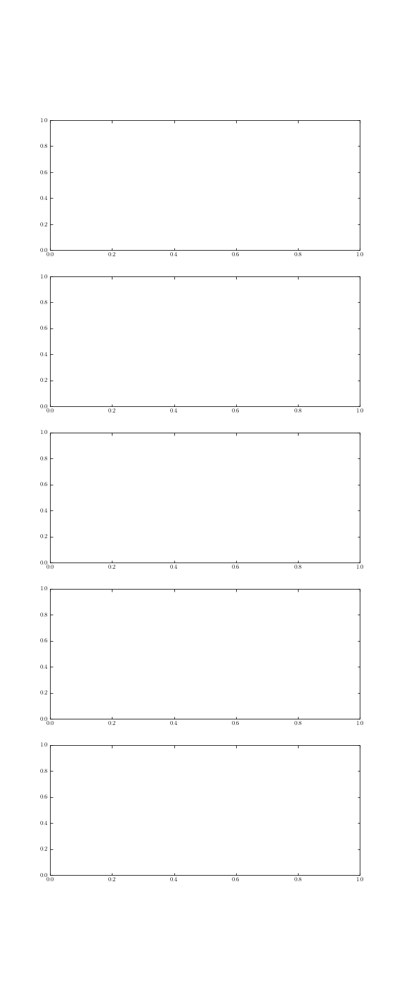

In [3]:
# Retry the previous block
import h5py
import numpy as np
import statsmodels.api as sm
from scipy import stats
from scipy.stats import norm
from scipy.optimize import minimize
from scipy.optimize import curve_fit

def gaussian_func(x, a, x0, sigma):
    """
    Gaussian function for curve_fit

    Parameters:
    x: x value
    a: amplitude
    x0: mean
    sigma: standard deviation

    Returns:
    y value of the Gaussian function
    """
    return a*np.exp(-(x-x0)**2/(2*sigma**2))

def fit_data(x, y, func):
    """
    Fit the function to the data and return the fitted function parameters and covariance

    Parameters:
    x: x value
    y: y value
    func: function to fit

    Returns:
    popt: array, optimal values for the parameters so that the sum of the squared residuals is minimized
    pcov: 2d array, estimated covariance of popt
    """
    popt, pcov = curve_fit(func, x, y, maxfev=2000)
    return popt, pcov

def plot_fit(x, y, func, popt, ax, label):
    """
    Plot the original data and the fitted function

    Parameters:
    x: x value
    y: y value
    func: function to fit
    popt: array, optimal values for the parameters so that the sum of the squared residuals is minimized
    ax: Axes, the axes to draw on
    label: str, the label for the fitted function line
    """
    ax.plot(x, y, 'b-', label='data')
    ax.plot(x, func(x, *popt), 'r-', label=label)

# Define the Gaussian PDF
def gaussian_pdf(x, mu, sigma):
    return (1/(sigma*np.sqrt(2*np.pi))) * np.exp(-(x-mu)**2 / (2*sigma**2))

# Define the negative log likelihood
def neg_log_likelihood(params, data):
    mu, sigma = params
    pdf_vals = gaussian_pdf(data, mu, sigma)
    return -np.sum(np.log(pdf_vals))

def fit_mle_gaussian(data):
    """
    Fit a Gaussian distribution to the given data using maximum likelihood estimation.

    Parameters:
    - data: array-like, the data to be fitted

    Returns:
    - params: tuple, the estimated parameters (mean, standard deviation)
    """
    # Calculate the mean and standard deviation of the data
    mean = np.mean(data)
    std = np.std(data)

    # Return the parameters
    return mean, std

def calculate_variables_fix(file_path, epsilon=1e-10):
    # Constants
    G = 4.302e-6  # gravitational constant in kpc/SM(km/s)^2

    # Read the HDF5 file
    file = h5py.File(file_path, 'r')

    # Variables to store the results
    Vr_V200_results = []
    Vtheta_V200_results = []
    J_Jcirc_results = []
    rcirc_r200_results = []
    Theta_results = []

    # Loop over all groups in the HDF5 file
    for group in file.keys():

        # Read the data
        x = np.array(file[group]['x'])
        y = np.array(file[group]['y'])
        z = np.array(file[group]['z'])
        vx = np.array(file[group]['vx'])
        vy = np.array(file[group]['vy'])
        vz = np.array(file[group]['vz'])
        M200 = np.array(file[group]['M200'])
        r200 = np.array(file[group]['Rvir'])

        # Replace zero values in r200 with epsilon
        V200 = np.sqrt(G*M200/r200)

        # Calculate the velocities and distances in spherical coordinates
        vr = (x*vx + y*vy + z*vz) / np.sqrt(x**2 + y**2 + z**2)
        vtheta = np.sqrt(vx**2 + vy**2 + vz**2 - vr**2)

        # Calculate the parameters
        Vr_V200 = np.abs(vr) / V200
        Vtheta_V200 = vtheta / V200
        J_Jcirc = Vtheta_V200 * np.exp(-(vr**2 + vtheta**2 - V200**2) / (2 * V200**2))
        rcirc_r200 = np.exp((vr**2 + vtheta**2 - V200**2) / (2 * V200**2))

        # Calculate the compound parameter
        Theta = (rcirc_r200**2) * (J_Jcirc**0.78)

        # Append the results to the result lists
        Vr_V200_results.append(Vr_V200)
        Vtheta_V200_results.append(Vtheta_V200)
        J_Jcirc_results.append(J_Jcirc)
        rcirc_r200_results.append(rcirc_r200)
        Theta_results.append(Theta)

    # Close the HDF5 file
    file.close()

    # Convert the result lists to arrays
    Vr_V200_results = np.concatenate(Vr_V200_results)
    Vtheta_V200_results = np.concatenate(Vtheta_V200_results)
    J_Jcirc_results = np.concatenate(J_Jcirc_results)
    rcirc_r200_results = np.concatenate(rcirc_r200_results)
    Theta_results = np.concatenate(Theta_results)

    # Return the results
    return Vr_V200_results, Vtheta_V200_results, J_Jcirc_results, rcirc_r200_results, Theta_results

# file_path = '/home/bianyuan/workspace/data/track/MRY_grp_orbit2D.hdf5'
# # Fetch the results
# Vr_V200_results, Vtheta_V200_results, J_Jcirc_results, rcirc_r200_results, Theta_results = calculate_variables_fix(file_path)

# # Exclude negative and zero values before taking log
# J_Jcirc_results = J_Jcirc_results[J_Jcirc_results > 0]
# J_Jcirc_results[J_Jcirc_results==0] = 1e-10
# rcirc_r200_results = rcirc_r200_results[rcirc_r200_results > 0]
# Theta_results = Theta_results[Theta_results > 0]

# # Plot the distributions
# fig, ax = plt.subplots(5, 1, figsize=(10, 20))
# frac = 0.5

# # Vr/V200
# counts, bins, _ = ax[0].hist(Vr_V200_results, bins=20, density=True, color='blue', alpha=0.6)
# ax[0].plot(bins[:-1], counts)
# Vr_V200 = sm.nonparametric.lowess(counts, bins[:-1], frac=frac)
# ax[0].plot(Vr_V200[:,0], Vr_V200[:,1])
# ax[0].set_xlabel('Vr/V200')
# ax[0].set_ylabel('P(Vr/V200)')

# # Vtheta/V200
# counts, bins, _ = ax[1].hist(Vtheta_V200_results, bins=20, density=True, color='blue', alpha=0.6)
# Vtheta_V200 = sm.nonparametric.lowess(counts, bins[:-1], frac=frac)
# ax[1].plot(Vtheta_V200[:,0], Vtheta_V200[:,1])
# ax[1].set_xlabel('Vtheta/V200')
# ax[1].set_ylabel('P(Vtheta/V200)')

# # log(J/Jcirc(E))
# counts, bins, _ = ax[2].hist(np.log10(J_Jcirc_results), bins=20, density=True, color='blue', alpha=0.6)
# J_Jcirc = sm.nonparametric.lowess(counts, bins[:-1], frac=frac)
# ax[2].plot(J_Jcirc[:,0], J_Jcirc[:,1])
# ax[2].set_xlabel('log(J/Jcirc(E))')
# ax[2].set_ylabel('P(log(J/Jcirc(E)))')

# # log(rcirc(E)/r200)
# counts, bins, _ = ax[3].hist(np.log10(rcirc_r200_results), bins=20, density=True, color='blue', alpha=0.6)
# rcirc_r200 = sm.nonparametric.lowess(counts, bins[:-1], frac=frac)
# ax[3].plot(rcirc_r200[:,0], rcirc_r200[:,1])
# ax[3].set_xlabel('log(rcirc(E)/r200)')
# ax[3].set_ylabel('P(log(rcirc(E)/r200))')

# # log(Theta)
# counts, bins, _ = ax[4].hist(np.log10(Theta_results), bins=20, density=True, color='blue', alpha=0.6)
# Theta_results = sm.nonparametric.lowess(counts, bins[:-1], frac=frac)
# ax[4].plot(Theta_results[:,0], Theta_results[:,1])
# ax[4].set_xlabel('log(Theta)')
# ax[4].set_ylabel('P(log(Theta))')

file_path = '/home/bianyuan/workspace/data/track/MP_cl_orbit2D.hdf5'

# Fetch the results
Vr_V200_results, Vtheta_V200_results, J_Jcirc_results, rcirc_r200_results, Theta_results = calculate_variables_fix(file_path)

# Exclude negative and zero values before taking log
J_Jcirc_results = J_Jcirc_results[J_Jcirc_results > 0]
J_Jcirc_results[J_Jcirc_results==0] = 1e-10
rcirc_r200_results = rcirc_r200_results[rcirc_r200_results > 0]
Theta_results = Theta_results[Theta_results > 0]

# Calculate the 1D histograms
counts_Vr_V200, edges_Vr_V200 = np.histogram(Vr_V200_results, bins=1000, density=True)
counts_Vtheta_V200, edges_Vtheta_V200 = np.histogram(Vtheta_V200_results, bins=1000, density=True)
counts_J_Jcirc_log, edges_J_Jcirc_log = np.histogram(np.log10(J_Jcirc_results), bins=1000, density=True)
counts_rcirc_r200_log, edges_rcirc_r200_log = np.histogram(np.log10(rcirc_r200_results), bins=1000, density=True)
counts_Theta_log, edges_Theta_log = np.histogram(np.log10(Theta_results), bins=1000, density=True)

# Calculate the 1D histograms
counts_Vr_V200, edges_Vr_V200 = np.histogram(Vr_V200_results, bins=1000, density=True)
counts_Vtheta_V200, edges_Vtheta_V200 = np.histogram(Vtheta_V200_results, bins=1000, density=True)
counts_J_Jcirc_log, edges_J_Jcirc_log = np.histogram(np.log10(J_Jcirc_results), bins=1000, density=True)
counts_rcirc_r200_log, edges_rcirc_r200_log = np.histogram(np.log10(rcirc_r200_results), bins=1000, density=True)
counts_Theta_log, edges_Theta_log = np.histogram(np.log10(Theta_results), bins=1000, density=True)

# Calculate the bin centers
bin_centers_Vr_V200 = (edges_Vr_V200[:-1] + edges_Vr_V200[1:]) / 2
bin_centers_Vtheta_V200 = (edges_Vtheta_V200[:-1] + edges_Vtheta_V200[1:]) / 2
bin_centers_J_Jcirc_log = (edges_J_Jcirc_log[:-1] + edges_J_Jcirc_log[1:]) / 2
bin_centers_rcirc_r200_log = (edges_rcirc_r200_log[:-1] + edges_rcirc_r200_log[1:]) / 2
bin_centers_Theta_log = (edges_Theta_log[:-1] + edges_Theta_log[1:]) / 2

# Calculate the maximum likelihood estimates for the parameters of the Gaussian distribution
params_Vr_V200_mle = fit_mle_gaussian(Vr_V200_results)
params_Vtheta_V200_mle = fit_mle_gaussian(Vtheta_V200_results)
params_J_Jcirc_log_mle = fit_mle_gaussian(np.log10(J_Jcirc_results))
params_rcirc_r200_log_mle = fit_mle_gaussian(np.log10(rcirc_r200_results))
params_Theta_log_mle = fit_mle_gaussian(np.log10(Theta_results))

# Create the Gaussian distribution functions with the estimated parameters
gaussian_Vr_V200_mle = stats.norm(loc=params_Vr_V200_mle[0], scale=params_Vr_V200_mle[1])
gaussian_Vtheta_V200_mle = stats.norm(loc=params_Vtheta_V200_mle[0], scale=params_Vtheta_V200_mle[1])
gaussian_J_Jcirc_log_mle = stats.norm(loc=params_J_Jcirc_log_mle[0], scale=params_J_Jcirc_log_mle[1])
gaussian_rcirc_r200_log_mle = stats.norm(loc=params_rcirc_r200_log_mle[0], scale=params_rcirc_r200_log_mle[1])
gaussian_Theta_log_mle = stats.norm(loc=params_Theta_log_mle[0], scale=params_Theta_log_mle[1])

# Fit and plot the parameters
fig_fit, ax_fit = plt.subplots(5, 1, figsize=(8, 20))

# # Vr_V200
# popt_Vr_V200, pcov_Vr_V200 = fit_data(bin_centers_Vr_V200, counts_Vr_V200, gaussian_func)
# plot_fit(bin_centers_Vr_V200, counts_Vr_V200, gaussian_func, popt_Vr_V200, ax_fit[0], 'fit: a=%5.3f, x0=%5.3f, sigma=%5.3f' % tuple(popt_Vr_V200))

# # Vtheta_V200
# popt_Vtheta_V200, pcov_Vtheta_V200 = fit_data(bin_centers_Vtheta_V200, counts_Vtheta_V200, gaussian_func)
# plot_fit(bin_centers_Vtheta_V200, counts_Vtheta_V200, gaussian_func, popt_Vtheta_V200, ax_fit[1], 'fit: a=%5.3f, x0=%5.3f, sigma=%5.3f' % tuple(popt_Vtheta_V200))

# # J_Jcirc_log
# popt_J_Jcirc_log, pcov_J_Jcirc_log = fit_data(bin_centers_J_Jcirc_log, counts_J_Jcirc_log, gaussian_func)
# plot_fit(bin_centers_J_Jcirc_log, counts_J_Jcirc_log, gaussian_func, popt_J_Jcirc_log, ax_fit[2], 'fit: a=%5.3f, x0=%5.3f, sigma=%5.3f' % tuple(popt_J_Jcirc_log))

# # rcirc_r200_log
# popt_rcirc_r200_log, pcov_rcirc_r200_log = fit_data(bin_centers_rcirc_r200_log, counts_rcirc_r200_log, gaussian_func)
# plot_fit(bin_centers_rcirc_r200_log, counts_rcirc_r200_log, gaussian_func, popt_rcirc_r200_log, ax_fit[3], 'fit: a=%5.3f, x0=%5.3f, sigma=%5.3f' % tuple(popt_rcirc_r200_log))

# # Theta_log
# popt_Theta_log, pcov_Theta_log = fit_data(bin_centers_Theta_log, counts_Theta_log, gaussian_func)
# plot_fit(bin_centers_Theta_log, counts_Theta_log, gaussian_func, popt_Theta_log, ax_fit[4], 'fit: a=%5.3f, x0=%5.3f, sigma=%5.3f' % tuple(popt_Theta_log))


# Initial guess for the parameters
init_params = [0, 1]

# Minimize the negative log likelihood
# result_Vr_V200 = minimize(neg_log_likelihood, init_params, args=bin_centers_Vr_V200)
# result_Vtheta_V200 = minimize(neg_log_likelihood, init_params, args=bin_centers_Vtheta_V200)
# result_J_Jcirc_log = minimize(neg_log_likelihood, init_params, args=bin_centers_J_Jcirc_log)
# result_rcirc_r200_log = minimize(neg_log_likelihood, init_params, args=bin_centers_rcirc_r200_log)
# result_Theta_log = minimize(neg_log_likelihood, init_params, args=bin_centers_Theta_log)

# # Print the results
# print("Vr/V200: mu = ", result_Vr_V200.x[0], ", sigma = ", result_Vr_V200.x[1])
# print("Vtheta/V200: mu = ", result_Vtheta_V200.x[0], ", sigma = ", result_Vtheta_V200.x[1])
# print("J/Jcirc(E): mu = ", result_J_Jcirc_log.x[0], ", sigma = ", result_J_Jcirc_log.x[1])
# print("rcirc(E)/r200: mu = ", result_rcirc_r200_log.x[0], ", sigma = ", result_rcirc_r200_log.x[1])
# print("Theta: mu = ", result_Theta_log.x[0], ", sigma = ", result_Theta_log.x[1])

# # Set the labels
# ax_fit[0].set_xlabel('Vr/V200')
# ax_fit[0].set_ylabel('P(Vr/V200)')
# ax_fit[1].set_xlabel('Vtheta/V200')
# ax_fit[1].set_ylabel('P(Vtheta/V200)')
# ax_fit[2].set_xlabel('log(J/Jcirc(E))')
# ax_fit[2].set_ylabel('P(log(J/Jcirc(E)))')
# ax_fit[3].set_xlabel('log(rcirc(E)/r200)')
# ax_fit[3].set_ylabel('P(log(rcirc(E)/r200))')
# ax_fit[4].set_xlabel('log(Theta)')
# ax_fit[4].set_ylabel('P(log(Theta))')

# # Add legends
# ax_fit[0].legend()
# ax_fit[1].legend()
# ax_fit[2].legend()
# ax_fit[3].legend()
# ax_fit[4].legend()

# Vr/V200
ax[0].hist(Vr_V200_results, bins=1000, density=True, color='blue', alpha=0.6, label='Histogram')
x = np.linspace(np.min(Vr_V200_results), np.max(Vr_V200_results), 1000)
y = gaussian_Vr_V200_mle.pdf(x)
ax[0].plot(x, y, 'r', label='Fitted Gaussian')
ax[0].set_xlabel('Vr/V200')
ax[0].set_ylabel('P(Vr/V200)')
ax[0].legend()

# Vtheta/V200
ax[1].hist(Vtheta_V200_results, bins=1000, density=True, color='blue', alpha=0.6, label='Histogram')
x = np.linspace(np.min(Vtheta_V200_results), np.max(Vtheta_V200_results), 1000)
y = gaussian_Vtheta_V200_mle.pdf(x)
ax[1].plot(x, y, 'r', label='Fitted Gaussian')
ax[1].set_xlabel('Vtheta/V200')
ax[1].set_ylabel('P(Vtheta/V200)')
ax[1].legend()

# log(J/Jcirc(E))
ax[2].hist(np.log10(J_Jcirc_results), bins=1000, density=True, color='blue', alpha=0.6, label='Histogram')
x = np.linspace(np.min(np.log10(J_Jcirc_results)), np.max(np.log10(J_Jcirc_results)), 1000)
y = gaussian_J_Jcirc_log_mle.pdf(x)
ax[2].plot(x, y, 'r', label='Fitted Gaussian')
ax[2].set_xlabel('log(J/Jcirc(E))')
ax[2].set_ylabel('P(log(J/Jcirc(E)))')
ax[2].legend()

# log(rcirc(E)/r200)
ax[3].hist(np.log10(rcirc_r200_results), bins=1000, density=True, color='blue', alpha=0.6, label='Histogram')
x = np.linspace(np.min(np.log10(rcirc_r200_results)), np.max(np.log10(rcirc_r200_results)), 1000)
y = gaussian_rcirc_r200_log_mle.pdf(x)
ax[3].plot(x, y, 'r', label='Fitted Gaussian')
ax[3].set_xlabel('log(rcirc(E)/r200)')
ax[3].set_ylabel('P(log(rcirc(E)/r200))')
ax[3].legend()

# log(Theta)
ax[4].hist(np.log10(Theta_results), bins=1000, density=True, color='blue', alpha=0.6, label='Histogram')
x = np.linspace(np.min(np.log10(Theta_results)), np.max(np.log10(Theta_results)), 1000)
y = gaussian_Theta_log_mle.pdf(x)
ax[4].plot(x, y, 'r', label='Fitted Gaussian')
ax[4].set_xlabel('log(Theta)')
ax[4].set_ylabel('P(log(Theta))')
ax[4].legend()

# Display the plots
plt.tight_layout()
plt.savefig('/home/bianyuan/workspace/pic/track_MRY_grp.pdf')

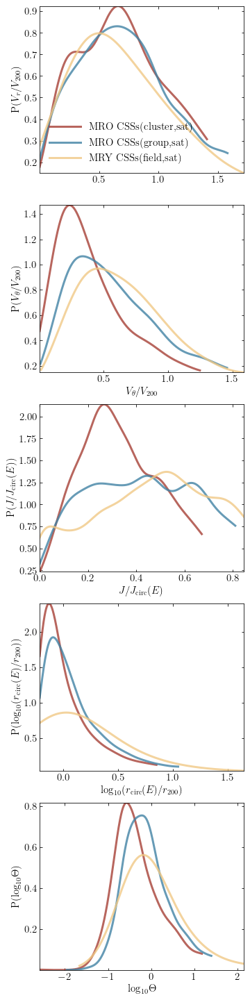

In [17]:
# Retry the previous block
import h5py
import numpy as np
import statsmodels.api as sm
from scipy import stats
from scipy.stats import norm
from scipy.optimize import minimize
from scipy.optimize import curve_fit
from scipy.stats import gaussian_kde

def gaussian_func(x, a, x0, sigma):
    """
    Gaussian function for curve_fit

    Parameters:
    x: x value
    a: amplitude
    x0: mean
    sigma: standard deviation

    Returns:
    y value of the Gaussian function
    """
    return a*np.exp(-(x-x0)**2/(2*sigma**2))

def fit_data(x, y, func):
    """
    Fit the function to the data and return the fitted function parameters and covariance

    Parameters:
    x: x value
    y: y value
    func: function to fit

    Returns:
    popt: array, optimal values for the parameters so that the sum of the squared residuals is minimized
    pcov: 2d array, estimated covariance of popt
    """
    popt, pcov = curve_fit(func, x, y, maxfev=2000)
    return popt, pcov

def plot_fit(x, y, func, popt, ax, label):
    """
    Plot the original data and the fitted function

    Parameters:
    x: x value
    y: y value
    func: function to fit
    popt: array, optimal values for the parameters so that the sum of the squared residuals is minimized
    ax: Axes, the axes to draw on
    label: str, the label for the fitted function line
    """
    ax.plot(x, y, 'b-', label='data')
    ax.plot(x, func(x, *popt), 'r-', label=label)

# Define the Gaussian PDF
def gaussian_pdf(x, mu, sigma):
    return (1/(sigma*np.sqrt(2*np.pi))) * np.exp(-(x-mu)**2 / (2*sigma**2))

# Define the negative log likelihood
def neg_log_likelihood(params, data):
    mu, sigma = params
    pdf_vals = gaussian_pdf(data, mu, sigma)
    return -np.sum(np.log(pdf_vals))

def fit_mle_gaussian(data):
    """
    Fit a Gaussian distribution to the given data using maximum likelihood estimation.

    Parameters:
    - data: array-like, the data to be fitted

    Returns:
    - params: tuple, the estimated parameters (mean, standard deviation)
    """
    # Calculate the mean and standard deviation of the data
    mean = np.mean(data)
    std = np.std(data)

    # Return the parameters
    return mean, std

def calculate_variables_fix(file_path, epsilon=1e-10):
    # Constants
    G = 4.302e-6  # gravitational constant in kpc/SM(km/s)^2

    # Read the HDF5 file
    file = h5py.File(file_path, 'r')

    # Variables to store the results
    Vr_V200_results = []
    Vtheta_V200_results = []
    J_Jcirc_results = []
    rcirc_r200_results = []
    Theta_results = []

    # Loop over all groups in the HDF5 file
    for group in file.keys():
        # Read the data
        x = np.array(file[group]['x'])
        y = np.array(file[group]['y'])
        z = np.array(file[group]['z'])
        vx = np.array(file[group]['vx'])
        vy = np.array(file[group]['vy'])
        vz = np.array(file[group]['vz'])
        M200 = np.array(file[group]['M200'])
        r200 = np.array(file[group]['Rvir'])

        # Replace zero values in r200 with epsilon
        # r200[r200 == 0] = epsilon

        V200 = np.sqrt(G*M200/r200)

        # Calculate the velocities and distances in spherical coordinates
        vr = (x*vx + y*vy + z*vz) / np.sqrt(x**2 + y**2 + z**2)
        vtheta = np.sqrt(vx**2 + vy**2 + vz**2 - vr**2)

        # Calculate the parameters
        Vr_V200 = np.abs(vr) / V200
        Vtheta_V200 = vtheta / V200
        J_Jcirc = Vtheta_V200 * np.exp(-(vr**2 + vtheta**2 - V200**2) / (2 * V200**2))
        rcirc_r200 = np.exp((vr**2 + vtheta**2 - V200**2) / (2 * V200**2))

        # Calculate the compound parameter
        Theta = (rcirc_r200**2) * (J_Jcirc**0.78)

        # Replace zero values in Theta with epsilon
        # Theta[Theta == 0] = epsilon

        # Append the results to the result lists
        Vr_V200_results.append(Vr_V200)
        Vtheta_V200_results.append(Vtheta_V200)
        J_Jcirc_results.append(J_Jcirc)
        rcirc_r200_results.append(rcirc_r200)
        Theta_results.append(Theta)

    # Close the HDF5 file
    file.close()

    # Convert the result lists to arrays
    Vr_V200_results = np.concatenate(Vr_V200_results)
    Vtheta_V200_results = np.concatenate(Vtheta_V200_results)
    J_Jcirc_results = np.concatenate(J_Jcirc_results)
    rcirc_r200_results = np.concatenate(rcirc_r200_results)
    Theta_results = np.concatenate(Theta_results)

    # J_Jcirc_results = J_Jcirc_results[J_Jcirc_results > 0]
    # Vr_V200_results = Vr_V200_results[np.isfinite(Vr_V200_results)]
    # Vtheta_V200_results = Vtheta_V200_results[np.isfinite(Vtheta_V200_results)]
    # J_Jcirc_results = J_Jcirc_results[np.isfinite(J_Jcirc_results)]
    # rcirc_r200_results = rcirc_r200_results[np.isfinite(rcirc_r200_results)]
    # Theta_results = Theta_results[np.isfinite(Theta_results)]
    J_Jcirc_results[J_Jcirc_results==0] = 1e-10
    # rcirc_r200_results = rcirc_r200_results[rcirc_r200_results > 0]
    Theta_results = Theta_results[Theta_results > 0]

    # Return the results
    return Vr_V200_results, Vtheta_V200_results, J_Jcirc_results, rcirc_r200_results, Theta_results

MP_cl_path = '/home/bianyuan/workspace/data/track/MP_cl_orbit2D.hdf5'
MP_grp_path = '/home/bianyuan/workspace/data/track/MP_grp_orbit2D.hdf5'
MP_fl_path = '/home/bianyuan/workspace/data/track/MP_fl_orbit2D.hdf5'

# Fetch the results
Vr_V200_results_MP_cl, Vtheta_V200_results_MP_cl, J_Jcirc_results_MP_cl, rcirc_r200_results_MP_cl, Theta_results_MP_cl = calculate_variables_fix(MP_cl_path)
Vr_V200_results_MP_grp, Vtheta_V200_results_MP_grp, J_Jcirc_results_MP_grp, rcirc_r200_results_MP_grp, Theta_results_MP_grp = calculate_variables_fix(MP_grp_path)
Vr_V200_results_MP_fl, Vtheta_V200_results_MP_fl, J_Jcirc_results_MP_fl, rcirc_r200_results_MP_fl, Theta_results_MP_fl = calculate_variables_fix(MP_fl_path)

# print(J_Jcirc_results_MP_grp)

# Calculate the kernel density estimates for the datasets
kde_Vr_V200_MP_cl = gaussian_kde((Vr_V200_results_MP_cl))
kde_Vtheta_V200_MP_cl = gaussian_kde((Vtheta_V200_results_MP_cl))
kde_J_Jcirc_MP_cl = gaussian_kde((J_Jcirc_results_MP_cl))
kde_rcirc_r200_log_MP_cl = gaussian_kde(np.log10(rcirc_r200_results_MP_cl))
kde_Theta_log_MP_cl = gaussian_kde(np.log10(Theta_results_MP_cl))

kde_Vr_V200_MP_grp = gaussian_kde((Vr_V200_results_MP_grp))
kde_Vtheta_V200_MP_grp = gaussian_kde((Vtheta_V200_results_MP_grp))
kde_J_Jcirc_MP_grp = gaussian_kde((J_Jcirc_results_MP_grp))
kde_rcirc_r200_log_MP_grp = gaussian_kde(np.log10(rcirc_r200_results_MP_grp))
kde_Theta_log_MP_grp = gaussian_kde(np.log10(Theta_results_MP_grp))

kde_Vr_V200_MP_fl = gaussian_kde((Vr_V200_results_MP_fl))
kde_Vtheta_V200_MP_fl = gaussian_kde((Vtheta_V200_results_MP_fl))
kde_J_Jcirc_MP_fl = gaussian_kde((J_Jcirc_results_MP_fl))
kde_rcirc_r200_log_MP_fl = gaussian_kde(np.log10(rcirc_r200_results_MP_fl))
kde_Theta_log_MP_fl = gaussian_kde(np.log10(Theta_results_MP_fl))

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

fig, ax = plt.subplots(5, 1, figsize=(5, 20))
# Vr/V200
# ax[0].hist(Vr_V200_results, bins=150, density=True, color='blue', alpha=0.6, label='Histogram')
x_MP_cl = np.linspace(np.percentile(Vr_V200_results_MP_cl,0), np.percentile(Vr_V200_results_MP_cl,90), 1000)
y_MP_cl = kde_Vr_V200_MP_cl(x_MP_cl)
x_MP_grp = np.linspace(np.percentile(Vr_V200_results_MP_grp,0), np.percentile(Vr_V200_results_MP_grp,90), 1000)
y_MP_grp = kde_Vr_V200_MP_grp(x_MP_grp)
x_MP_fl = np.linspace(np.percentile(Vr_V200_results_MP_fl,0), np.percentile(Vr_V200_results_MP_fl,90), 1000)
y_MP_fl = kde_Vr_V200_MP_fl(x_MP_fl)
ax[0].plot(x_MP_cl, y_MP_cl, color=cl, linewidth=3, linestyle = '-', label='MRO CSSs(cluster,sat)')
ax[0].plot(x_MP_grp, y_MP_grp, color=grp, linewidth=3, linestyle = '-', label='MRO CSSs(group,sat)')
ax[0].plot(x_MP_fl, y_MP_fl, color=fl, linewidth=3, linestyle = '-', label='MRY CSSs(field,sat)')
# lower_bound = np.percentile(Vr_V200_results_MP_cl, 0)
# upper_bound = np.percentile(Vr_V200_results_MP_cl, 90)
# Vr_V200_results_MP_cl = Vr_V200_results_MP_cl[(Vr_V200_results_MP_cl >= lower_bound) & (Vr_V200_results_MP_cl <= upper_bound)]
# ax[0].hist(Vr_V200_results_MP_cl, bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=cl, facecolor='none', alpha=0.8, linewidth=3, label='MP CSSs(cluster,sat)')
# lower_bound = np.percentile(Vr_V200_results_MP_grp, 0)
# upper_bound = np.percentile(Vr_V200_results_MP_grp, 90)
# Vr_V200_results_MP_grp = Vr_V200_results_MP_grp[(Vr_V200_results_MP_grp >= lower_bound) & (Vr_V200_results_MP_grp <= upper_bound)]
# ax[0].hist(Vr_V200_results_MP_grp, bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=grp, facecolor='none', alpha=0.8, linewidth=3, label='MP CSSs(group,sat)')
# lower_bound = np.percentile(Vr_V200_results_MP_fl, 0)
# upper_bound = np.percentile(Vr_V200_results_MP_fl, 90)
# Vr_V200_results_MP_fl = Vr_V200_results_MP_fl[(Vr_V200_results_MP_fl >= lower_bound) & (Vr_V200_results_MP_fl <= upper_bound)]
# ax[0].hist(Vr_V200_results_MP_fl, bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=fl, facecolor='none', alpha=0.8, linewidth=3, label='MP CSSs(field,sat)')
# ax[0].set_xlabel('$V_{r}/V_{\mathrm{200}}$',fontsize=15)
ax[0].set_ylabel('$\mathrm{P}(V_{r}/V_{\mathrm{200}})$',fontsize=15)
ax[0].legend(frameon=False)
plt.rcParams['legend.fontsize'] = 15
ax[0].tick_params(axis='x', which='both', labelsize=15)
ax[0].tick_params(axis='y', which='both', labelsize=15)

# Vtheta/V200
# ax[1].hist(Vtheta_V200_results, bins=150, density=True, color='blue', alpha=0.6, label='Histogram')
x_MP_cl = np.linspace(np.percentile(Vtheta_V200_results_MP_cl,0), np.percentile(Vtheta_V200_results_MP_cl,90), 1000)
y_MP_cl = kde_Vtheta_V200_MP_cl(x_MP_cl)
x_MP_grp = np.linspace(np.percentile(Vtheta_V200_results_MP_grp,0), np.percentile(Vtheta_V200_results_MP_grp,90), 1000)
y_MP_grp = kde_Vtheta_V200_MP_grp(x_MP_grp)
x_MP_fl = np.linspace(np.percentile(Vtheta_V200_results_MP_fl,0), np.percentile(Vtheta_V200_results_MP_fl,90), 1000)
y_MP_fl = kde_Vtheta_V200_MP_fl(x_MP_fl)
ax[1].plot(x_MP_cl, y_MP_cl, color=cl, linewidth=3, linestyle = '-')
ax[1].plot(x_MP_grp, y_MP_grp, color=grp, linewidth=3, linestyle = '-')
ax[1].plot(x_MP_fl, y_MP_fl, color=fl, linewidth=3, linestyle = '-')
# ax[1].hist(Vtheta_V200_results_MP_cl, bins=15, density=True, histtype='stepfilled',
#                                                                 edgecolor=cl, facecolor='none', alpha=0.8, linewidth=3)
# ax[1].hist(Vtheta_V200_results_MP_grp, bins=15, density=True, histtype='stepfilled',
#                                                                 edgecolor=grp, facecolor='none', alpha=0.8, linewidth=3)
# ax[1].hist(Vtheta_V200_results_MP_fl, bins=15, density=True, histtype='stepfilled',
#                                                                 edgecolor=fl, facecolor='none', alpha=0.8, linewidth=3)
# lower_bound = np.percentile(Vtheta_V200_results_MP_cl, 0)
# upper_bound = np.percentile(Vtheta_V200_results_MP_cl, 90)
# Vtheta_V200_results_MP_cl = Vtheta_V200_results_MP_cl[(Vtheta_V200_results_MP_cl >= lower_bound) & (Vtheta_V200_results_MP_cl <= upper_bound)]
# ax[1].hist(Vtheta_V200_results_MP_cl, bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=cl, facecolor='none', alpha=0.8, linewidth=3)
# lower_bound = np.percentile(Vtheta_V200_results_MP_grp, 0)
# upper_bound = np.percentile(Vtheta_V200_results_MP_grp, 90)
# Vtheta_V200_results_MP_grp = Vtheta_V200_results_MP_grp[(Vtheta_V200_results_MP_grp >= lower_bound) & (Vtheta_V200_results_MP_grp <= upper_bound)]
# ax[1].hist(Vtheta_V200_results_MP_grp, bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=grp, facecolor='none', alpha=0.8, linewidth=3)
# lower_bound = np.percentile(Vtheta_V200_results_MP_fl, 0)
# upper_bound = np.percentile(Vtheta_V200_results_MP_fl, 90)
# Vtheta_V200_results_MP_fl = Vtheta_V200_results_MP_fl[(Vtheta_V200_results_MP_fl >= lower_bound) & (Vtheta_V200_results_MP_fl <= upper_bound)]
# ax[1].hist(Vtheta_V200_results_MP_fl, bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=fl, facecolor='none', alpha=0.8, linewidth=3)
ax[1].set_xlabel(r'$V_{\theta}/V_{\mathrm{200}}$',fontsize=15)
ax[1].set_ylabel(r'$\mathrm{P}(V_{\theta}/V_{\mathrm{200}}$)',fontsize=15)
ax[1].tick_params(axis='x', which='both', labelsize=15)
ax[1].tick_params(axis='y', which='both', labelsize=15)
# ax[1].legend()

# log(J/Jcirc(E))
# ax[2].hist(np.log10(J_Jcirc_results), bins=150, density=True, color='blue', alpha=0.6, label='Histogram')
x_MP_cl = np.linspace(np.percentile(J_Jcirc_results_MP_cl,0), np.percentile(J_Jcirc_results_MP_cl,90), 1000)
y_MP_cl = kde_J_Jcirc_MP_cl(x_MP_cl)
x_MP_grp = np.linspace(np.percentile(J_Jcirc_results_MP_grp,0), np.percentile(J_Jcirc_results_MP_grp,90), 1000)
y_MP_grp = kde_J_Jcirc_MP_grp(x_MP_grp)
x_MP_fl = np.linspace(np.percentile(J_Jcirc_results_MP_fl,0), np.percentile(J_Jcirc_results_MP_fl,90), 1000)
y_MP_fl = kde_J_Jcirc_MP_fl(x_MP_fl)
ax[2].plot(x_MRO_cl, y_MRO_cl, color=cl, linewidth=3, linestyle = '--')
ax[2].plot(x_MRO_grp, y_MRO_grp, color=grp, linewidth=3, linestyle = '--')
# lower_bound = np.percentile(J_Jcirc_results_MP_cl, 0)
# upper_bound = np.percentile(J_Jcirc_results_MP_cl, 90)
# J_Jcirc_results_MP_cl = J_Jcirc_results_MP_cl[(J_Jcirc_results_MP_cl >= lower_bound) & (J_Jcirc_results_MP_cl <= upper_bound)]
# ax[2].hist(J_Jcirc_results_MP_cl, bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=cl, facecolor='none', alpha=0.8, linewidth=3)
# lower_bound = np.percentile(J_Jcirc_results_MP_grp, 0)
# upper_bound = np.percentile(J_Jcirc_results_MP_grp, 90)
# J_Jcirc_results_MP_grp = J_Jcirc_results_MP_grp[(J_Jcirc_results_MP_grp >= lower_bound) & (J_Jcirc_results_MP_grp <= upper_bound)]
# ax[2].hist(J_Jcirc_results_MP_grp, bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=grp, facecolor='none', alpha=0.8, linewidth=3)
# lower_bound = np.percentile(J_Jcirc_results_MP_fl, 0)
# upper_bound = np.percentile(J_Jcirc_results_MP_fl, 90)
# J_Jcirc_results_MP_fl = J_Jcirc_results_MP_fl[(J_Jcirc_results_MP_fl >= lower_bound) & (J_Jcirc_results_MP_fl <= upper_bound)]
# ax[2].hist(J_Jcirc_results_MP_fl, bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=fl, facecolor='none', alpha=0.8, linewidth=3)
ax[2].set_xlabel('$J/J_{\mathrm{circ}}(E)$',fontsize=15)
ax[2].set_ylabel('$\mathrm{P}(J/J_{\mathrm{circ}}(E))$',fontsize=15)
ax[2].tick_params(axis='x', which='both', labelsize=15)
ax[2].tick_params(axis='y', which='both', labelsize=15)
# ax[2].legend()

# log(rcirc(E)/r200)
# ax[3].hist(np.log10(rcirc_r200_results), bins=150, density=True, color='blue', alpha=0.6, label='Histogram')
x_MP_cl = np.linspace(np.percentile(np.log10(rcirc_r200_results_MP_cl),0), np.percentile(np.log10(rcirc_r200_results_MP_cl),95), 1000)
y_MP_cl = kde_rcirc_r200_log_MP_cl(x_MP_cl)
x_MP_grp = np.linspace(np.percentile(np.log10(rcirc_r200_results_MP_grp),0), np.percentile(np.log10(rcirc_r200_results_MP_grp),95), 1000)
y_MP_grp = kde_rcirc_r200_log_MP_grp(x_MP_grp)
x_MP_fl = np.linspace(np.percentile(np.log10(rcirc_r200_results_MP_fl),0), np.percentile(np.log10(rcirc_r200_results_MP_fl),95), 1000)
y_MP_fl = kde_rcirc_r200_log_MP_fl(x_MP_fl)
ax[3].plot(x_MRO_cl, y_MRO_cl, color=cl, linewidth=3, linestyle = '--')
ax[3].plot(x_MRO_grp, y_MRO_grp, color=grp, linewidth=3, linestyle = '--')
# lower_bound = np.percentile(rcirc_r200_results_MP_cl, 0)
# upper_bound = np.percentile(rcirc_r200_results_MP_cl, 90)
# rcirc_r200_results_MP_cl = rcirc_r200_results_MP_cl[(rcirc_r200_results_MP_cl >= lower_bound) & (rcirc_r200_results_MP_cl <= upper_bound)]
# ax[3].hist(np.log10(rcirc_r200_results_MP_cl), bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=cl, facecolor='none', alpha=0.8, linewidth=3)
# lower_bound = np.percentile(rcirc_r200_results_MP_grp, 0)
# upper_bound = np.percentile(rcirc_r200_results_MP_grp, 90)
# rcirc_r200_results_MP_grp = rcirc_r200_results_MP_grp[(rcirc_r200_results_MP_grp >= lower_bound) & (rcirc_r200_results_MP_grp <= upper_bound)]
# ax[3].hist(np.log10(rcirc_r200_results_MP_grp), bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=grp, facecolor='none', alpha=0.8, linewidth=3)
# lower_bound = np.percentile(rcirc_r200_results_MP_fl, 0)
# upper_bound = np.percentile(rcirc_r200_results_MP_fl, 90)
# rcirc_r200_results_MP_fl = rcirc_r200_results_MP_fl[(rcirc_r200_results_MP_fl >= lower_bound) & (rcirc_r200_results_MP_fl <= upper_bound)]
# ax[3].hist(np.log10(rcirc_r200_results_MP_fl), bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=fl, facecolor='none', alpha=0.8, linewidth=3)
ax[3].set_xlabel('$\mathrm{log}_{10}(r_{\mathrm{circ}}(E)/r_{\mathrm{200}})$',fontsize=15)
ax[3].set_ylabel('$\mathrm{P}(\mathrm{log}_{10}(r_{\mathrm{circ}}(E)/r_{\mathrm{200}}))$',fontsize=15)
ax[3].tick_params(axis='x', which='both', labelsize=15)
ax[3].tick_params(axis='y', which='both', labelsize=15)
# ax[3].legend()

# log(Theta)
# ax[4].hist(np.log10(Theta_results), bins=150, density=True, color='blue', alpha=0.6, label='Histogram')
x_MP_cl = np.linspace(np.percentile(np.log10(Theta_results_MP_cl),0), np.percentile(np.log10(Theta_results_MP_cl),95), 1000)
y_MP_cl = kde_Theta_log_MP_cl(x_MP_cl)
x_MP_grp = np.linspace(np.percentile(np.log10(Theta_results_MP_grp),0), np.percentile(np.log10(Theta_results_MP_grp),95), 1000)
y_MP_grp = kde_Theta_log_MP_grp(x_MP_grp)
x_MP_fl = np.linspace(np.percentile(np.log10(Theta_results_MP_fl),0), np.percentile(np.log10(Theta_results_MP_fl),95), 1000)
y_MP_fl = kde_Theta_log_MP_fl(x_MP_fl)
ax[4].plot(x_MRO_cl, y_MRO_cl, color=cl, linewidth=3, linestyle = '--')
ax[4].plot(x_MRO_grp, y_MRO_grp, color=grp, linewidth=3, linestyle = '--')
# lower_bound = np.percentile(Theta_results_MP_cl, 0)
# upper_bound = np.percentile(Theta_results_MP_cl, 90)
# Theta_results_MP_cl = Theta_results_MP_cl[(Theta_results_MP_cl >= lower_bound) & (Theta_results_MP_cl <= upper_bound)]
# ax[4].hist(np.log10(Theta_results_MP_cl), bins=10, density=True, histtype='stepfilled', 
#                                                                 edgecolor=cl, facecolor='none', alpha=0.8, linewidth=3)
# lower_bound = np.percentile(Theta_results_MP_grp, 0)
# upper_bound = np.percentile(Theta_results_MP_grp, 90)
# Theta_results_MP_grp = Theta_results_MP_grp[(Theta_results_MP_grp >= lower_bound) & (Theta_results_MP_grp <= upper_bound)]
# ax[4].hist(np.log10(Theta_results_MP_grp), bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=grp, facecolor='none', alpha=0.8, linewidth=3)
# lower_bound = np.percentile(Theta_results_MP_fl, 0)
# upper_bound = np.percentile(Theta_results_MP_fl, 90)
# Theta_results_MP_fl = Theta_results_MP_fl[(Theta_results_MP_fl >= lower_bound) & (Theta_results_MP_fl <= upper_bound)]
# ax[4].hist(np.log10(Theta_results_MP_fl), bins=10, density=True, histtype='stepfilled',
#                                                                 edgecolor=fl, facecolor='none', alpha=0.8, linewidth=3)
ax[4].set_xlabel('$\mathrm{log}_{10}\Theta$',fontsize=15)
ax[4].set_ylabel('$\mathrm{P}(\mathrm{log}_{10}\Theta)$',fontsize=15)
ax[4].tick_params(axis='x', which='both', labelsize=15)
ax[4].tick_params(axis='y', which='both', labelsize=15)
# ax[4].legend()
# Display the plots
plt.tight_layout()
plt.savefig('/home/bianyuan/workspace/pic/track_MRO.pdf')

In [51]:
import h5py
# Define the function to calculate the variables with the corrected expression for rcirc_r200
def calculate_variables_corrected(file_path, epsilon=1e-10):
    # Constants
    G = 4.302e-6  # gravitational constant in kpc/SM(km/s)^2

    # Read the HDF5 file
    file = h5py.File(file_path, 'r')

    # Variables to store the results
    Vr_V200_results = []
    Vtheta_V200_results = []
    J_Jcirc_results = []
    rcirc_r200_results = []
    Theta_results = []

    # Loop over all groups in the HDF5 file
    for group in file.keys():
        # Read the data
        x = np.array(file[group]['x'])
        y = np.array(file[group]['y'])
        z = np.array(file[group]['z'])
        vx = np.array(file[group]['vx'])
        vy = np.array(file[group]['vy'])
        vz = np.array(file[group]['vz'])
        V200 = np.array(file[group]['V200'])
        r200 = np.array(file[group]['Rvir'])

        # Replace zero values in r200 with epsilon
        r200[r200 == 0] = epsilon

        # Calculate the velocities and distances in spherical coordinates
        vr = (x*vx + y*vy + z*vz) / np.sqrt(x**2 + y**2 + z**2)
        vtheta = np.sqrt(vx**2 + vy**2 + vz**2 - vr**2)

        # Calculate the parameters
        Vr_V200 = np.abs(vr) / V200
        Vtheta_V200 = vtheta / V200
        J_Jcirc = Vtheta_V200 * np.exp(-(vr**2 + vtheta**2 - V200**2) / (2 * V200**2))
        rcirc_r200 = np.exp((vr**2 + vtheta**2 - V200**2) / (2 * V200**2))

        # Calculate the compound parameter
        Theta = (rcirc_r200**2) * (J_Jcirc**0.78)

        # Replace zero values in Theta with epsilon
        Theta[Theta == 0] = epsilon

        # Append the results to the result lists
        Vr_V200_results.append(Vr_V200)
        Vtheta_V200_results.append(Vtheta_V200)
        J_Jcirc_results.append(J_Jcirc)
        rcirc_r200_results.append(rcirc_r200)
        Theta_results.append(Theta)

    # Close the HDF5 file
    file.close()

    # Convert the result lists to arrays
    Vr_V200_results = np.concatenate(Vr_V200_results)
    Vtheta_V200_results = np.concatenate(Vtheta_V200_results)
    J_Jcirc_results = np.concatenate(J_Jcirc_results)
    rcirc_r200_results = np.concatenate(rcirc_r200_results)
    Theta_results = np.concatenate(Theta_results)

    # Return the results
    return Vr_V200_results, Vtheta_V200_results, J_Jcirc_results, rcirc_r200_results, Theta_results


In [4]:
def calculate_variables_fix(file_path, epsilon=1e-10):
    # Constants
    G = 4.302e-6  # gravitational constant in kpc/SM(km/s)^2

    # Read the HDF5 file
    file = h5py.File(file_path, 'r')

    # Variables to store the results
    Vr_V200_results = []
    Vtheta_V200_results = []
    J_Jcirc_results = []
    rcirc_r200_results = []
    Theta_results = []

    # Loop over all groups in the HDF5 file
    for group in file.keys():
        # Read the data
        x = np.array(file[group]['x'][0])
        y = np.array(file[group]['y'][0])
        z = np.array(file[group]['z'][0])
        vx = np.array(file[group]['vx'][0])
        vy = np.array(file[group]['vy'][0])
        vz = np.array(file[group]['vz'][0])
        M200 = np.array(file[group]['M200'])
        r200 = np.array(file[group]['Rvir'])

        # Replace zero values in r200 with epsilon
        # r200[r200 == 0] = epsilon

        V200 = np.sqrt(G*M200/r200)

        # Calculate the velocities and distances in spherical coordinates
        vr = (x*vx + y*vy + z*vz) / np.sqrt(x**2 + y**2 + z**2)
        vtheta = np.sqrt(vx**2 + vy**2 + vz**2 - vr**2)

        # Calculate the parameters
        Vr_V200 = np.abs(vr) / V200
        Vtheta_V200 = vtheta / V200
        J_Jcirc = Vtheta_V200 * np.exp(-(vr**2 + vtheta**2 - V200**2) / (2 * V200**2))
        rcirc_r200 = np.exp((vr**2 + vtheta**2 - V200**2) / (2 * V200**2))

        # Calculate the compound parameter
        Theta = (rcirc_r200**2) * (J_Jcirc**0.78)

        # Replace zero values in Theta with epsilon
        # Theta[Theta == 0] = epsilon

        # Append the results to the result lists
        Vr_V200_results.append(Vr_V200)
        Vtheta_V200_results.append(Vtheta_V200)
        J_Jcirc_results.append(J_Jcirc)
        rcirc_r200_results.append(rcirc_r200)
        Theta_results.append(Theta)

    # Close the HDF5 file
    file.close()

    # Convert the result lists to arrays
    # Vr_V200_results = np.concatenate(Vr_V200_results)
    # Vtheta_V200_results = np.concatenate(Vtheta_V200_results)
    # J_Jcirc_results = np.concatenate(J_Jcirc_results)
    # rcirc_r200_results = np.concatenate(rcirc_r200_results)
    # Theta_results = np.concatenate(Theta_results)
    Vr_V200_results = np.array(Vr_V200_results)
    Vtheta_V200_results = np.array(Vtheta_V200_results)
    J_Jcirc_results = np.array(J_Jcirc_results)
    rcirc_r200_results = np.array(rcirc_r200_results)
    Theta_results = np.array(Theta_results)

    # J_Jcirc_results = J_Jcirc_results[J_Jcirc_results > 0]
    # Vr_V200_results = Vr_V200_results[np.isfinite(Vr_V200_results)]
    # Vtheta_V200_results = Vtheta_V200_results[np.isfinite(Vtheta_V200_results)]
    # J_Jcirc_results = J_Jcirc_results[np.isfinite(J_Jcirc_results)]
    # rcirc_r200_results = rcirc_r200_results[np.isfinite(rcirc_r200_results)]
    # Theta_results = Theta_results[np.isfinite(Theta_results)]
    J_Jcirc_results[J_Jcirc_results==0] = 1e-10
    # rcirc_r200_results = rcirc_r200_results[rcirc_r200_results > 0]
    Theta_results = Theta_results[Theta_results > 0]

    # Return the results
    return Vr_V200_results, Vtheta_V200_results, J_Jcirc_results, rcirc_r200_results, Theta_results

In [5]:
from scipy.stats import gaussian_kde

MP_cl_path = '/home/bianyuan/workspace/data/track/MP_cl_orbit2D.hdf5'
MP_grp_path = '/home/bianyuan/workspace/data/track/MP_grp_orbit2D.hdf5'
MP_fl_path = '/home/bianyuan/workspace/data/track/MP_fl_orbit2D.hdf5'

# Fetch the results
Vr_V200_results_MP_cl, Vtheta_V200_results_MP_cl, J_Jcirc_results_MP_cl, rcirc_r200_results_MP_cl, Theta_results_MP_cl = calculate_variables_fix(MP_cl_path)
Vr_V200_results_MP_grp, Vtheta_V200_results_MP_grp, J_Jcirc_results_MP_grp, rcirc_r200_results_MP_grp, Theta_results_MP_grp = calculate_variables_fix(MP_grp_path)
Vr_V200_results_MP_fl, Vtheta_V200_results_MP_fl, J_Jcirc_results_MP_fl, rcirc_r200_results_MP_fl, Theta_results_MP_fl = calculate_variables_fix(MP_fl_path)

MRO_cl_path = '/home/bianyuan/workspace/data/track/MRO_cl_orbit2D.hdf5'
MRO_grp_path = '/home/bianyuan/workspace/data/track/MRO_grp_orbit2D.hdf5'

Vr_V200_results_MRO_cl, Vtheta_V200_results_MRO_cl, J_Jcirc_results_MRO_cl, rcirc_r200_results_MRO_cl, Theta_results_MRO_cl = calculate_variables_fix(MRO_cl_path)
Vr_V200_results_MRO_grp, Vtheta_V200_results_MRO_grp, J_Jcirc_results_MRO_grp, rcirc_r200_results_MRO_grp, Theta_results_MRO_grp = calculate_variables_fix(MRO_grp_path)

MRI_cl_path = '/home/bianyuan/workspace/data/track/MRI_cl_orbit2D.hdf5'
MRI_grp_path = '/home/bianyuan/workspace/data/track/MRI_grp_orbit2D.hdf5'

Vr_V200_results_MRI_cl, Vtheta_V200_results_MRI_cl, J_Jcirc_results_MRI_cl, rcirc_r200_results_MRI_cl, Theta_results_MRI_cl = calculate_variables_fix(MRI_cl_path)
Vr_V200_results_MRI_grp, Vtheta_V200_results_MRI_grp, J_Jcirc_results_MRI_grp, rcirc_r200_results_MRI_grp, Theta_results_MRI_grp = calculate_variables_fix(MRI_grp_path)

MRY_cl_path = '/home/bianyuan/workspace/data/track/MRY_cl_orbit2D.hdf5'
MRY_grp_path = '/home/bianyuan/workspace/data/track/MRY_grp_orbit2D.hdf5'

Vr_V200_results_MRY_cl, Vtheta_V200_results_MRY_cl, J_Jcirc_results_MRY_cl, rcirc_r200_results_MRY_cl, Theta_results_MRY_cl = calculate_variables_fix(MRY_cl_path)
Vr_V200_results_MRY_grp, Vtheta_V200_results_MRY_grp, J_Jcirc_results_MRY_grp, rcirc_r200_results_MRY_grp, Theta_results_MRY_grp = calculate_variables_fix(MRY_grp_path)

# Calculate the kernel density estimates for the datasets
kde_Vr_V200_MP_cl = gaussian_kde((Vr_V200_results_MP_cl))
kde_Vtheta_V200_MP_cl = gaussian_kde((Vtheta_V200_results_MP_cl))
kde_J_Jcirc_MP_cl = gaussian_kde((J_Jcirc_results_MP_cl))
kde_rcirc_r200_log_MP_cl = gaussian_kde(np.log10(rcirc_r200_results_MP_cl))
kde_Theta_log_MP_cl = gaussian_kde(np.log10(Theta_results_MP_cl))

kde_Vr_V200_MP_grp = gaussian_kde((Vr_V200_results_MP_grp))
kde_Vtheta_V200_MP_grp = gaussian_kde((Vtheta_V200_results_MP_grp))
kde_J_Jcirc_MP_grp = gaussian_kde((J_Jcirc_results_MP_grp))
kde_rcirc_r200_log_MP_grp = gaussian_kde(rcirc_r200_results_MP_grp)
kde_Theta_log_MP_grp = gaussian_kde(np.log10(Theta_results_MP_grp))

kde_Vr_V200_MP_fl = gaussian_kde((Vr_V200_results_MP_fl))
kde_Vtheta_V200_MP_fl = gaussian_kde((Vtheta_V200_results_MP_fl))
kde_J_Jcirc_MP_fl = gaussian_kde((J_Jcirc_results_MP_fl))
kde_rcirc_r200_log_MP_fl = gaussian_kde(rcirc_r200_results_MP_fl)
kde_Theta_log_MP_fl = gaussian_kde(np.log10(Theta_results_MP_fl))

kde_Vr_V200_MRO_cl = gaussian_kde((Vr_V200_results_MRO_cl))
kde_Vtheta_V200_MRO_cl = gaussian_kde((Vtheta_V200_results_MRO_cl))
kde_J_Jcirc_MRO_cl = gaussian_kde((J_Jcirc_results_MRO_cl))
kde_rcirc_r200_log_MRO_cl = gaussian_kde(rcirc_r200_results_MRO_cl)
kde_Theta_log_MRO_cl = gaussian_kde(np.log10(Theta_results_MRO_cl))

kde_Vr_V200_MRO_grp = gaussian_kde((Vr_V200_results_MRO_grp))
kde_Vtheta_V200_MRO_grp = gaussian_kde((Vtheta_V200_results_MRO_grp))
kde_J_Jcirc_MRO_grp = gaussian_kde((J_Jcirc_results_MRO_grp))
kde_rcirc_r200_log_MRO_grp = gaussian_kde(rcirc_r200_results_MRO_grp)
kde_Theta_log_MRO_grp = gaussian_kde(np.log10(Theta_results_MRO_grp))

kde_Vr_V200_MRI_cl = gaussian_kde((Vr_V200_results_MRI_cl))
kde_Vtheta_V200_MRI_cl = gaussian_kde((Vtheta_V200_results_MRI_cl))
kde_J_Jcirc_MRI_cl = gaussian_kde((J_Jcirc_results_MRI_cl))
kde_rcirc_r200_log_MRI_cl = gaussian_kde(rcirc_r200_results_MRI_cl)
kde_Theta_log_MRI_cl = gaussian_kde(np.log10(Theta_results_MRI_cl))

kde_Vr_V200_MRI_grp = gaussian_kde((Vr_V200_results_MRI_grp))
kde_Vtheta_V200_MRI_grp = gaussian_kde((Vtheta_V200_results_MRI_grp))
kde_J_Jcirc_MRI_grp = gaussian_kde((J_Jcirc_results_MRI_grp))
kde_rcirc_r200_log_MRI_grp = gaussian_kde(rcirc_r200_results_MRI_grp)
kde_Theta_log_MRI_grp = gaussian_kde(np.log10(Theta_results_MRI_grp))

kde_Vr_V200_MRY_cl = gaussian_kde((Vr_V200_results_MRY_cl))
kde_Vtheta_V200_MRY_cl = gaussian_kde((Vtheta_V200_results_MRY_cl))
kde_J_Jcirc_MRY_cl = gaussian_kde((J_Jcirc_results_MRY_cl))
kde_rcirc_r200_log_MRY_cl = gaussian_kde(rcirc_r200_results_MRY_cl)
kde_Theta_log_MRY_cl = gaussian_kde(np.log10(Theta_results_MRY_cl))

kde_Vr_V200_MRY_grp = gaussian_kde((Vr_V200_results_MRY_grp))
kde_Vtheta_V200_MRY_grp = gaussian_kde((Vtheta_V200_results_MRY_grp))
kde_J_Jcirc_MRY_grp = gaussian_kde((J_Jcirc_results_MRY_grp))
kde_rcirc_r200_log_MRY_grp = gaussian_kde(rcirc_r200_results_MRY_grp)
kde_Theta_log_MRY_grp = gaussian_kde(np.log10(Theta_results_MRY_grp))

/home/bianyuan/.local/lib/python3.10/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


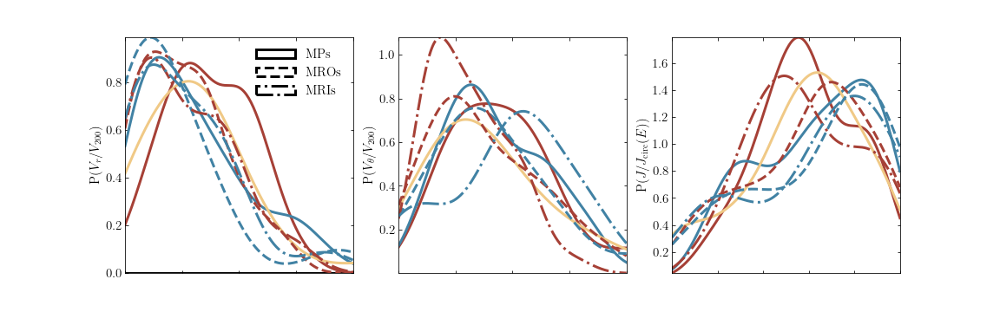

In [9]:
import seaborn as sns

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

fig, ax = plt.subplots(1, 3, figsize=(16, 5))

x_MP_cl = np.linspace(np.percentile(Vr_V200_results_MP_cl,0), np.percentile(Vr_V200_results_MP_cl,100), 20)
y_MP_cl = kde_Vr_V200_MP_cl(x_MP_cl)
x_MP_grp = np.linspace(np.percentile(Vr_V200_results_MP_grp,0), np.percentile(Vr_V200_results_MP_grp,100), 1000)
y_MP_grp = kde_Vr_V200_MP_grp(x_MP_grp)
x_MP_fl = np.linspace(np.percentile(Vr_V200_results_MP_fl,0), np.percentile(Vr_V200_results_MP_fl,100), 1000)
y_MP_fl = kde_Vr_V200_MP_fl(x_MP_fl)

x_MRO_cl = np.linspace(np.percentile(Vr_V200_results_MRO_cl,0), np.percentile(Vr_V200_results_MRO_cl,100), 1000)
y_MRO_cl = kde_Vr_V200_MRO_cl(x_MRO_cl)
x_MRO_grp = np.linspace(np.percentile(Vr_V200_results_MRO_grp,0), np.percentile(Vr_V200_results_MRO_grp,100), 1000)
y_MRO_grp = kde_Vr_V200_MRO_grp(x_MRO_grp)

x_MRI_cl = np.linspace(np.percentile(Vr_V200_results_MRI_cl,0), np.percentile(Vr_V200_results_MRI_cl,100), 1000)
y_MRI_cl = kde_Vr_V200_MRI_cl(x_MRI_cl)
x_MRI_grp = np.linspace(np.percentile(Vr_V200_results_MRI_grp,0), np.percentile(Vr_V200_results_MRI_grp,100), 1000)
y_MRI_grp = kde_Vr_V200_MRI_grp(x_MRI_grp)

x_MRY_cl = np.linspace(np.percentile(Vr_V200_results_MRY_cl,0), np.percentile(Vr_V200_results_MRY_cl,100), 1000)
y_MRY_cl = kde_Vr_V200_MRY_cl(x_MRY_cl)
x_MRY_grp = np.linspace(np.percentile(Vr_V200_results_MRY_grp,0), np.percentile(Vr_V200_results_MRY_grp,100), 1000)
y_MRY_grp = kde_Vr_V200_MRY_grp(x_MRY_grp)

# ax[0].plot(x_MP_cl, y_MP_cl, color=cl, linewidth=3, linestyle = '-', label='MP CSSs(cluster,sat)')
# ax[0].plot(x_MP_grp, y_MP_grp, color=grp, linewidth=3, linestyle = '-', label='MP CSSs(group,sat)')
# ax[0].plot(x_MP_fl, y_MP_fl, color=fl, linewidth=3, linestyle = '-', label='MP CSSs(field,sat)')

#########################################################
'''hist'''

# ax[0].hist(Vr_V200_results_MP_cl, bins = np.linspace(0,2,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# ax[0].hist(Vr_V200_results_MP_grp, bins = np.linspace(0,2,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# ax[0].hist(Vr_V200_results_MP_fl, bins = np.linspace(0,2,9), edgecolor=fl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')

# ax[0].hist(Vr_V200_results_MRO_cl, bins = np.linspace(0,2,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')
# ax[0].hist(Vr_V200_results_MRO_grp, bins = np.linspace(0,2,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')

# ax[0].hist(Vr_V200_results_MRI_cl, bins = np.linspace(0,2,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')
# ax[0].hist(Vr_V200_results_MRI_grp, bins = np.linspace(0,2,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')

############################################################
'''kde'''

sns.kdeplot(Vr_V200_results_MP_cl, ax=ax[0], color=cl, linestyle='-', linewidth=3, fill=False, clip=(0, 2))
sns.kdeplot(Vr_V200_results_MP_grp, ax=ax[0], color=grp, linestyle='-', linewidth=3, fill=False, clip=(0, 2))
sns.kdeplot(Vr_V200_results_MP_fl, ax=ax[0], color=fl, linestyle='-', linewidth=3, fill=False, clip=(0, 2))

sns.kdeplot(Vr_V200_results_MRO_cl, ax=ax[0], color=cl, linestyle='--', linewidth=3, fill=False, clip=(0, 2))
sns.kdeplot(Vr_V200_results_MRO_grp, ax=ax[0], color=grp, linestyle='--', linewidth=3, fill=False, clip=(0, 2))

sns.kdeplot(Vr_V200_results_MRI_cl, ax=ax[0], color=cl, linestyle='-.', linewidth=3, fill=False, clip=(0, 2))
sns.kdeplot(Vr_V200_results_MRI_grp, ax=ax[0], color=grp, linestyle='-.', linewidth=3, fill=False, clip=(0, 2))

############################################################

# ax[0].hist(Vr_V200_results_MRY_cl, bins = np.linspace(0,2,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled', label='MRY CSSs(cluster,sat)')
# ax[0].hist(Vr_V200_results_MRY_grp, bins = np.linspace(0,2,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled', label='MRY CSSs(group,sat)')

# ax[0].plot(x_MRO_cl, y_MRO_cl, color=cl, linewidth=3, linestyle = '--', label='MRO CSSs(cluster,sat)')
# ax[0].plot(x_MRO_grp, y_MRO_grp, color=grp, linewidth=3, linestyle = '--', label='MRO CSSs(cluster,sat)')

# ax[0].plot(x_MRI_cl, y_MRI_cl, color=cl, linewidth=3, linestyle = '-.', label='MRI CSSs(cluster,sat)')
# ax[0].plot(x_MRI_grp, y_MRI_grp, color=grp, linewidth=3, linestyle = '-.', label='MRI CSSs(group,sat)')

# ax[0].plot(x_MRY_cl, y_MRY_cl, color=cl, linewidth=3, linestyle = ':', label='MRY CSSs(cluster,sat)')
# ax[0].plot(x_MRY_grp, y_MRY_grp, color=grp, linewidth=3, linestyle = ':', label='MRY CSSs(group,sat)')

ax[0].hist([], bins = np.linspace(0,2,9), edgecolor='black', facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled', label='MPs')
ax[0].hist([], bins = np.linspace(0,2,9), edgecolor='black', facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled', label='MROs')
ax[0].hist([], bins = np.linspace(0,2,9), edgecolor='black', facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled', label='MRIs')

# 清除x和y轴的刻度
# ax[0].set_xticks([])
# ax[0].set_yticks([])
# 隐藏x轴和y轴的刻度标签
ax[0].tick_params(axis='both', which='both', labelbottom=False)

ax[0].set_xlabel('',fontsize=15)
# ax[0].set_xlabel(r'$V_{\mathrm{r}}/V_{\mathrm{200}}$',fontsize=15)
ax[0].set_ylabel('$\mathrm{P}(V_{r}/V_{\mathrm{200}})$',fontsize=15)
ax[0].legend(frameon=False)
plt.rcParams['legend.fontsize'] = 15
ax[0].tick_params(axis='x', which='both', labelsize=15)
ax[0].tick_params(axis='y', which='both', labelsize=15)

x_MP_cl = np.linspace(np.percentile(Vtheta_V200_results_MP_cl,0), np.percentile(Vtheta_V200_results_MP_cl,100), 1000)
y_MP_cl = kde_Vtheta_V200_MP_cl(x_MP_cl)
x_MP_grp = np.linspace(np.percentile(Vtheta_V200_results_MP_grp,0), np.percentile(Vtheta_V200_results_MP_grp,100), 1000)
y_MP_grp = kde_Vtheta_V200_MP_grp(x_MP_grp)
x_MP_fl = np.linspace(np.percentile(Vtheta_V200_results_MP_fl,0), np.percentile(Vtheta_V200_results_MP_fl,100), 1000)
y_MP_fl = kde_Vtheta_V200_MP_fl(x_MP_fl)

x_MRO_cl = np.linspace(np.percentile(Vtheta_V200_results_MRO_cl,0), np.percentile(Vtheta_V200_results_MRO_cl,100), 1000)
y_MRO_cl = kde_Vtheta_V200_MRO_cl(x_MRO_cl)
x_MRO_grp = np.linspace(np.percentile(Vtheta_V200_results_MRO_grp,0), np.percentile(Vtheta_V200_results_MRO_grp,100), 1000)
y_MRO_grp = kde_Vtheta_V200_MRO_grp(x_MRO_grp)

x_MRI_cl = np.linspace(np.percentile(Vtheta_V200_results_MRI_cl,0), np.percentile(Vtheta_V200_results_MRI_cl,100), 1000)
y_MRI_cl = kde_Vtheta_V200_MRI_cl(x_MRI_cl)
x_MRI_grp = np.linspace(np.percentile(Vtheta_V200_results_MRI_grp,0), np.percentile(Vtheta_V200_results_MRI_grp,100), 1000)
y_MRI_grp = kde_Vtheta_V200_MRI_grp(x_MRI_grp)

x_MRY_cl = np.linspace(np.percentile(Vtheta_V200_results_MRY_cl,0), np.percentile(Vtheta_V200_results_MRY_cl,100), 1000)
y_MRY_cl = kde_Vtheta_V200_MRY_cl(x_MRY_cl)
x_MRY_grp = np.linspace(np.percentile(Vtheta_V200_results_MRY_grp,0), np.percentile(Vtheta_V200_results_MRY_grp,100), 1000)
y_MRY_grp = kde_Vtheta_V200_MRY_grp(x_MRY_grp)

# ax[1].plot(x_MP_cl, y_MP_cl, color=cl, linewidth=3, linestyle = '-')
# ax[1].plot(x_MP_grp, y_MP_grp, color=grp, linewidth=3, linestyle = '-')
# ax[1].plot(x_MP_fl, y_MP_fl, color=fl, linewidth=3, linestyle = '-')

########################################################################
'''hist'''

# ax[1].hist(Vtheta_V200_results_MP_cl, bins = np.linspace(0,2,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# ax[1].hist(Vtheta_V200_results_MP_grp, bins = np.linspace(0,2,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# ax[1].hist(Vtheta_V200_results_MP_fl, bins = np.linspace(0,2,9), edgecolor=fl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')

# ax[1].hist(Vtheta_V200_results_MRO_cl, bins = np.linspace(0,2,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')
# ax[1].hist(Vtheta_V200_results_MRO_grp, bins = np.linspace(0,2,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')

# ax[1].hist(Vtheta_V200_results_MRI_cl, bins = np.linspace(0,2,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')
# ax[1].hist(Vtheta_V200_results_MRI_grp, bins = np.linspace(0,2,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')

#########################################################################
'''kdeplot'''

sns.kdeplot(Vtheta_V200_results_MP_cl, ax=ax[1], color=cl, linestyle='-', linewidth=3, fill=False, clip=(0, 2))
sns.kdeplot(Vtheta_V200_results_MP_grp, ax=ax[1], color=grp, linestyle='-', linewidth=3, fill=False, clip=(0, 2))
sns.kdeplot(Vtheta_V200_results_MP_fl, ax=ax[1], color=fl, linestyle='-', linewidth=3, fill=False, clip=(0, 2))

sns.kdeplot(Vtheta_V200_results_MRO_cl, ax=ax[1], color=cl, linestyle='--', linewidth=3, fill=False, clip=(0, 2))
sns.kdeplot(Vtheta_V200_results_MRO_grp, ax=ax[1], color=grp, linestyle='--', linewidth=3, fill=False, clip=(0, 2))

sns.kdeplot(Vtheta_V200_results_MRI_cl, ax=ax[1], color=cl, linestyle='-.', linewidth=3, fill=False, clip=(0, 2))
sns.kdeplot(Vtheta_V200_results_MRI_grp, ax=ax[1], color=grp, linestyle='-.', linewidth=3, fill=False, clip=(0, 2))

#########################################################################

# ax[1].hist(Vtheta_V200_results_MRY_cl, bins = np.linspace(0,2,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled')
# ax[1].hist(Vtheta_V200_results_MRY_grp, bins = np.linspace(0,2,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled')

# ax[1].plot(x_MRO_cl, y_MRO_cl, color=cl, linewidth=3, linestyle = '--')
# ax[1].plot(x_MRO_grp, y_MRO_grp, color=grp, linewidth=3, linestyle = '--')

# ax[1].plot(x_MRI_cl, y_MRI_cl, color=cl, linewidth=3, linestyle = '-.')
# ax[1].plot(x_MRI_grp, y_MRI_grp, color=grp, linewidth=3, linestyle = '-.')

# ax[1].plot(x_MRY_cl, y_MRY_cl, color=cl, linewidth=3, linestyle = ':')
# ax[1].plot(x_MRY_grp, y_MRY_grp, color=grp, linewidth=3, linestyle = ':')

# 清除x和y轴的刻度
# ax[1].set_xticks([])
# ax[1].set_yticks([])
ax[1].tick_params(axis='both', which='both', labelbottom=False)

ax[1].set_xlabel('',fontsize=15)
# ax[1].set_xlabel(r'$V_{\theta}/V_{\mathrm{200}}$',fontsize=15)
ax[1].set_ylabel(r'$\mathrm{P}(V_{\theta}/V_{\mathrm{200}}$)',fontsize=15)
ax[1].tick_params(axis='x', which='both', labelsize=15)
ax[1].tick_params(axis='y', which='both', labelsize=15)

x_MP_cl = np.linspace(np.percentile(J_Jcirc_results_MP_cl,0), np.percentile(J_Jcirc_results_MP_cl,100), 1000)
y_MP_cl = kde_J_Jcirc_MP_cl(x_MP_cl)
x_MP_grp = np.linspace(np.percentile(J_Jcirc_results_MP_grp,0), np.percentile(J_Jcirc_results_MP_grp,100), 1000)
y_MP_grp = kde_J_Jcirc_MP_grp(x_MP_grp)
x_MP_fl = np.linspace(np.percentile(J_Jcirc_results_MP_fl,0), np.percentile(J_Jcirc_results_MP_fl,100), 1000)
y_MP_fl = kde_J_Jcirc_MP_fl(x_MP_fl)

x_MRO_cl = np.linspace(np.percentile(J_Jcirc_results_MRO_cl,0), np.percentile(J_Jcirc_results_MRO_cl,100), 100)
y_MRO_cl = kde_J_Jcirc_MRO_cl(x_MRO_cl)
x_MRO_grp = np.linspace(np.percentile(J_Jcirc_results_MRO_grp,0), np.percentile(J_Jcirc_results_MRO_grp,100), 100)
y_MRO_grp = kde_J_Jcirc_MRO_grp(x_MRO_grp)

x_MRI_cl = np.linspace(np.percentile(J_Jcirc_results_MRI_cl,0), np.percentile(J_Jcirc_results_MRI_cl,100), 100)
y_MRI_cl = kde_J_Jcirc_MRI_cl(x_MRI_cl)
x_MRI_grp = np.linspace(np.percentile(J_Jcirc_results_MRI_grp,0), np.percentile(J_Jcirc_results_MRI_grp,100), 100)
y_MRI_grp = kde_J_Jcirc_MRI_grp(x_MRI_grp)

x_MRY_cl = np.linspace(np.percentile(J_Jcirc_results_MRY_cl,0), np.percentile(J_Jcirc_results_MRY_cl,100), 100)
y_MRY_cl = kde_J_Jcirc_MRY_cl(x_MRY_cl)
x_MRY_grp = np.linspace(np.percentile(J_Jcirc_results_MRY_grp,0), np.percentile(J_Jcirc_results_MRY_grp,100), 100)
y_MRY_grp = kde_J_Jcirc_MRY_grp(x_MRY_grp)

# ax[2].plot(x_MP_cl, y_MP_cl, color=cl, linewidth=3, linestyle = '-')
# ax[2].plot(x_MP_grp, y_MP_grp, color=grp, linewidth=3, linestyle = '-')
# ax[2].plot(x_MP_fl, y_MP_fl, color=fl, linewidth=3, linestyle = '-')

####################################################################
'''hist'''

# ax[2].hist(J_Jcirc_results_MP_cl, bins = np.linspace(0,1,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# ax[2].hist(J_Jcirc_results_MP_grp, bins = np.linspace(0,1,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# ax[2].hist(J_Jcirc_results_MP_fl, bins = np.linspace(0,1,9), edgecolor=fl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')

# ax[2].hist(J_Jcirc_results_MRO_cl, bins = np.linspace(0,1,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')
# ax[2].hist(J_Jcirc_results_MRO_grp, bins = np.linspace(0,1,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')

# ax[2].hist(J_Jcirc_results_MRI_cl, bins = np.linspace(0,1,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')
# ax[2].hist(J_Jcirc_results_MRI_grp, bins = np.linspace(0,1,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')

######################################################################
'''kdeplot'''

sns.kdeplot(J_Jcirc_results_MP_cl, ax=ax[2], color=cl, linestyle='-', linewidth=3, fill=False, clip=(0, 1))
sns.kdeplot(J_Jcirc_results_MP_grp, ax=ax[2], color=grp, linestyle='-', linewidth=3, fill=False, clip=(0, 1))
sns.kdeplot(J_Jcirc_results_MP_fl, ax=ax[2], color=fl, linestyle='-', linewidth=3, fill=False, clip=(0, 1))

sns.kdeplot(J_Jcirc_results_MRO_cl, ax=ax[2], color=cl, linestyle='--', linewidth=3, fill=False, clip=(0, 1))
sns.kdeplot(J_Jcirc_results_MRO_grp, ax=ax[2], color=grp, linestyle='--', linewidth=3, fill=False, clip=(0, 1))

sns.kdeplot(J_Jcirc_results_MRI_cl, ax=ax[2], color=cl, linestyle='-.', linewidth=3, fill=False, clip=(0, 1))
sns.kdeplot(J_Jcirc_results_MRI_grp, ax=ax[2], color=grp, linestyle='-.', linewidth=3, fill=False, clip=(0, 1))

######################################################################

# ax[2].hist(J_Jcirc_results_MRY_cl, bins = np.linspace(0,1,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled')
# ax[2].hist(J_Jcirc_results_MRY_grp, bins = np.linspace(0,1,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled')

# ax[2].plot(x_MRO_cl, y_MRO_cl, color=cl, linewidth=3, linestyle = '--')
# ax[2].plot(x_MRO_grp, y_MRO_grp, color=grp, linewidth=3, linestyle = '--')

# ax[2].plot(x_MRI_cl, y_MRI_cl, color=cl, linewidth=3, linestyle = '-.')
# ax[2].plot(x_MRI_grp, y_MRI_grp, color=grp, linewidth=3, linestyle = '-.')

# ax[2].plot(x_MRY_cl, y_MRY_cl, color=cl, linewidth=3, linestyle = ':')
# ax[2].plot(x_MRY_grp, y_MRY_grp, color=grp, linewidth=3, linestyle = ':')

# 清除x和y轴的刻度
# ax[2].set_xticks([])
# ax[2].set_yticks([])
ax[2].tick_params(axis='both', which='both', labelbottom=False)

ax[2].set_xlabel('',fontsize=15)
# ax[2].set_xlabel('$J/J_{\mathrm{circ}}(E)$',fontsize=15)
ax[2].set_ylabel('$\mathrm{P}(J/J_{\mathrm{circ}}(E))$',fontsize=15)
ax[2].tick_params(axis='x', which='both', labelsize=15)
ax[2].tick_params(axis='y', which='both', labelsize=15)

###############################################################################################################################################

# x_MP_cl = np.linspace(np.percentile(rcirc_r200_results_MP_cl,0), np.percentile(rcirc_r200_results_MP_cl,100), 1000)
# y_MP_cl = kde_rcirc_r200_log_MP_cl(x_MP_cl)
# x_MP_grp = np.linspace(np.percentile(rcirc_r200_results_MP_grp,0), np.percentile(rcirc_r200_results_MP_grp,100), 1000)
# y_MP_grp = kde_rcirc_r200_log_MP_grp(x_MP_grp)
# x_MP_fl = np.linspace(np.percentile(rcirc_r200_results_MP_fl,0), np.percentile(rcirc_r200_results_MP_fl,100), 1000)
# y_MP_fl = kde_rcirc_r200_log_MP_fl(x_MP_fl)

# x_MRO_cl = np.linspace(np.percentile(rcirc_r200_results_MRO_cl,0), np.percentile(rcirc_r200_results_MRO_cl,100), 1000)
# y_MRO_cl = kde_rcirc_r200_log_MRO_cl(x_MRO_cl)
# x_MRO_grp = np.linspace(np.percentile(rcirc_r200_results_MRO_grp,0), np.percentile(rcirc_r200_results_MRO_grp,100), 1000)
# y_MRO_grp = kde_rcirc_r200_log_MRO_grp(x_MRO_grp)

# x_MRI_cl = np.linspace(np.percentile(rcirc_r200_results_MRI_cl,0), np.percentile(rcirc_r200_results_MRI_cl,100), 1000)
# y_MRI_cl = kde_rcirc_r200_log_MRI_cl(x_MRI_cl)
# x_MRI_grp = np.linspace(np.percentile(rcirc_r200_results_MRI_grp,0), np.percentile(rcirc_r200_results_MRI_grp,100), 1000)
# y_MRI_grp = kde_rcirc_r200_log_MRI_grp(x_MRI_grp)

# x_MRY_cl = np.linspace(np.percentile(rcirc_r200_results_MRY_cl,0), np.percentile(rcirc_r200_results_MRY_cl,100), 1000)
# y_MRY_cl = kde_rcirc_r200_log_MRY_cl(x_MRY_cl)
# x_MRY_grp = np.linspace(np.percentile(rcirc_r200_results_MRY_grp,0), np.percentile(rcirc_r200_results_MRY_grp,100), 1000)
# y_MRY_grp = kde_rcirc_r200_log_MRY_grp(x_MRY_grp)
# # ax[3].plot(x_MP_cl, y_MP_cl, color=cl, linewidth=3, linestyle = '-')
# # ax[3].plot(x_MP_grp, y_MP_grp, color=grp, linewidth=3, linestyle = '-')
# # ax[3].plot(x_MP_fl, y_MP_fl, color=fl, linewidth=3, linestyle = '-')

# ########################################################################
# '''hist'''

# # ax[3].hist(rcirc_r200_results_MP_cl, bins = np.linspace(0.6,1.8,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# # ax[3].hist(rcirc_r200_results_MP_grp, bins = np.linspace(0.6,1.8,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# # ax[3].hist(rcirc_r200_results_MP_fl, bins = np.linspace(0.6,1.8,9), edgecolor=fl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')

# # ax[3].hist(rcirc_r200_results_MRO_cl, bins = np.linspace(0.6,1.8,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')
# # ax[3].hist(rcirc_r200_results_MRO_grp, bins = np.linspace(0.6,1.8,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')

# # ax[3].hist(rcirc_r200_results_MRI_cl, bins = np.linspace(0.6,1.8,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')
# # ax[3].hist(rcirc_r200_results_MRI_grp, bins = np.linspace(0.6,1.8,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')

# ########################################################################
# '''kdeplot'''

# sns.kdeplot(rcirc_r200_results_MP_cl, ax=ax[3], color=cl, linestyle='-', linewidth=3, fill=True, clip=(0.6, 1.8))
# sns.kdeplot(rcirc_r200_results_MP_grp, ax=ax[3], color=grp, linestyle='-', linewidth=3, fill=True, clip=(0.6, 1.8))
# sns.kdeplot(rcirc_r200_results_MP_fl, ax=ax[3], color=fl, linestyle='-', linewidth=3, fill=True, clip=(0.6, 1.8))

# sns.kdeplot(rcirc_r200_results_MRO_cl, ax=ax[3], color=cl, linestyle='--', linewidth=3, fill=True, clip=(0.6, 1.8))
# sns.kdeplot(rcirc_r200_results_MRO_grp, ax=ax[3], color=grp, linestyle='--', linewidth=3, fill=True, clip=(0.6, 1.8))

# sns.kdeplot(rcirc_r200_results_MRI_cl, ax=ax[3], color=cl, linestyle='-.', linewidth=3, fill=True, clip=(0.6, 1.8))
# sns.kdeplot(rcirc_r200_results_MRI_grp, ax=ax[3], color=grp, linestyle='-.', linewidth=3, fill=True, clip=(0.6, 1.8))

# ########################################################################
# # ax[3].hist(rcirc_r200_results_MRY_cl, bins = np.linspace(0.6,1.8,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled')
# # ax[3].hist(rcirc_r200_results_MRY_grp, bins = np.linspace(0.6,1.8,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled')

# # ax[3].plot(x_MRO_cl, y_MRO_cl, color=cl, linewidth=3, linestyle = '--')
# # ax[3].plot(x_MRO_grp, y_MRO_grp, color=grp, linewidth=3, linestyle = '--')

# # ax[3].plot(x_MRI_cl, y_MRI_cl, color=cl, linewidth=3, linestyle = '-.')
# # ax[3].plot(x_MRI_grp, y_MRI_grp, color=grp, linewidth=3, linestyle = '-.')

# # ax[3].plot(x_MRY_cl, y_MRY_cl, color=cl, linewidth=3, linestyle = ':')
# # ax[3].plot(x_MRY_grp, y_MRY_grp, color=grp, linewidth=3, linestyle = ':')
# ax[3].set_xlabel('$r_{\mathrm{circ}}(E)/r_{\mathrm{200}}$',fontsize=15)
# ax[3].set_ylabel('$\mathrm{P}(r_{\mathrm{circ}}(E)/r_{\mathrm{200}})$',fontsize=15)
# ax[3].tick_params(axis='x', which='both', labelsize=15)
# ax[3].tick_params(axis='y', which='both', labelsize=15)

# x_MP_cl = np.linspace(np.percentile(np.log10(Theta_results_MP_cl),0), np.percentile(np.log10(Theta_results_MP_cl),100), 1000)
# y_MP_cl = kde_Theta_log_MP_cl(x_MP_cl)
# x_MP_grp = np.linspace(np.percentile(np.log10(Theta_results_MP_grp),0), np.percentile(np.log10(Theta_results_MP_grp),100), 1000)
# y_MP_grp = kde_Theta_log_MP_grp(x_MP_grp)
# x_MP_fl = np.linspace(np.percentile(np.log10(Theta_results_MP_fl),0), np.percentile(np.log10(Theta_results_MP_fl),100), 1000)
# y_MP_fl = kde_Theta_log_MP_fl(x_MP_fl)

# x_MRO_cl = np.linspace(np.percentile(np.log10(Theta_results_MRO_cl),0), np.percentile(np.log10(Theta_results_MRO_cl),100), 1000)
# y_MRO_cl = kde_Theta_log_MRO_cl(x_MRO_cl)
# x_MRO_grp = np.linspace(np.percentile(np.log10(Theta_results_MRO_grp),0), np.percentile(np.log10(Theta_results_MRO_grp),100), 1000)
# y_MRO_grp = kde_Theta_log_MRO_grp(x_MRO_grp)

# x_MRI_cl = np.linspace(np.percentile(np.log10(Theta_results_MRI_cl),0), np.percentile(np.log10(Theta_results_MRI_cl),100), 1000)
# y_MRI_cl = kde_Theta_log_MRI_cl(x_MRI_cl)
# x_MRI_grp = np.linspace(np.percentile(np.log10(Theta_results_MRI_grp),0), np.percentile(np.log10(Theta_results_MRI_grp),100), 1000)
# y_MRI_grp = kde_Theta_log_MRI_grp(x_MRI_grp)

# x_MRY_cl = np.linspace(np.percentile(np.log10(Theta_results_MRY_cl),0), np.percentile(np.log10(Theta_results_MRY_cl),100), 1000)
# y_MRY_cl = kde_Theta_log_MRY_cl(x_MRY_cl)
# x_MRY_grp = np.linspace(np.percentile(np.log10(Theta_results_MRY_grp),0), np.percentile(np.log10(Theta_results_MRY_grp),100), 1000)
# y_MRY_grp = kde_Theta_log_MRY_grp(x_MRY_grp)
# # ax[4].plot(x_MP_cl, y_MP_cl, color=cl, linewidth=3, linestyle = '-')
# # ax[4].plot(x_MP_grp, y_MP_grp, color=grp, linewidth=3, linestyle = '-')
# # ax[4].plot(x_MP_fl, y_MP_fl, color=fl, linewidth=3, linestyle = '-')

# #########################################################################
# '''hist'''

# # ax[4].hist(np.log10(rcirc_r200_results_MP_cl), bins = np.linspace(-1.5,1.5,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# # ax[4].hist(np.log10(rcirc_r200_results_MP_grp), bins = np.linspace(-1.5,1.5,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# # ax[4].hist(np.log10(rcirc_r200_results_MP_fl), bins = np.linspace(-1.5,1.5,9), edgecolor=fl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')

# # ax[4].hist(np.log10(Theta_results_MRO_cl), bins = np.linspace(-1.5,1.5,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')
# # ax[4].hist(np.log10(Theta_results_MRO_grp), bins = np.linspace(-1.5,1.5,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')

# # ax[4].hist(np.log10(Theta_results_MRI_cl), bins = np.linspace(-1.5,1.5,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')
# # ax[4].hist(np.log10(Theta_results_MRI_grp), bins = np.linspace(-1.5,1.5,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')

# #########################################################################
# '''kdeplot'''

# sns.kdeplot(np.log10(Theta_results_MP_cl), ax=ax[4], color=cl, linestyle='-', linewidth=3, fill=True, clip=(-1.5, 1.5))
# sns.kdeplot(np.log10(Theta_results_MP_grp), ax=ax[4], color=grp, linestyle='-', linewidth=3, fill=True, clip=(-1.5, 1.5))
# sns.kdeplot(np.log10(Theta_results_MP_fl), ax=ax[4], color=fl, linestyle='-', linewidth=3, fill=True, clip=(-1.5, 1.5))

# sns.kdeplot(np.log10(Theta_results_MRO_cl), ax=ax[4], color=cl, linestyle='--', linewidth=3, fill=True, clip=(-1.5, 1.5))
# sns.kdeplot(np.log10(Theta_results_MRO_grp), ax=ax[4], color=grp, linestyle='--', linewidth=3, fill=True, clip=(-1.5, 1.5))

# sns.kdeplot(np.log10(Theta_results_MRI_cl), ax=ax[4], color=cl, linestyle='-.', linewidth=3, fill=True, clip=(-1.5, 1.5))
# sns.kdeplot(np.log10(Theta_results_MRI_grp), ax=ax[4], color=grp, linestyle='-.', linewidth=3, fill=True, clip=(-1.5, 1.5))

# # ax[4].hist(np.log10(Theta_results_MRY_cl), bins = np.linspace(-1.5,1.5,9), edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled')
# # ax[4].hist(np.log10(Theta_results_MRY_grp), bins = np.linspace(-1.5,1.5,9), edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = ':', histtype='stepfilled')

# # ax[4].plot(x_MRO_cl, y_MRO_cl, color=cl, linewidth=3, linestyle = '--')
# # ax[4].plot(x_MRO_grp, y_MRO_grp, color=grp, linewidth=3, linestyle = '--')

# # ax[4].plot(x_MRI_cl, y_MRI_cl, color=cl, linewidth=3, linestyle = '-.')
# # ax[4].plot(x_MRI_grp, y_MRI_grp, color=grp, linewidth=3, linestyle = '-.')

# # ax[4].plot(x_MRY_cl, y_MRY_cl, color=cl, linewidth=3, linestyle = ':')
# # ax[4].plot(x_MRY_grp, y_MRY_grp, color=grp, linewidth=3, linestyle = ':')
# ax[4].set_xlabel('$\mathrm{log}_{10}\Theta$',fontsize=15)
# ax[4].set_ylabel('$\mathrm{P}(\mathrm{log}_{10}\Theta)$',fontsize=15)
# ax[4].tick_params(axis='x', which='both', labelsize=15)
# ax[4].tick_params(axis='y', which='both', labelsize=15)

###############################################################################################################################################

# ax[4].legend()
# Display the plots
# plt.tight_layout()
plt.savefig('/home/bianyuan/workspace/pic/track.pdf')

/home/bianyuan/.local/lib/python3.10/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in divide
  return n/db/n.sum(), bin_edges


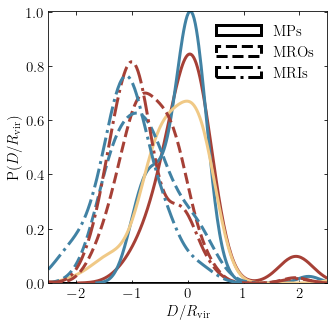

In [26]:
def plot_kde_converted_to_counts(data, color, linestyle, ax):
    # KDE 计算
    kde = gaussian_kde(data)
    x_range = np.linspace(min(data), max(data), 500)
    kde_values = kde(x_range)

    # 将密度转换为数量
    counts = kde_values * len(data) * np.diff(x_range)[0]

    # 绘制调整后的曲线
    ax.plot(x_range, counts, color=color, linestyle=linestyle, linewidth=3)

grp = (65/255,130/255,164/255,0.8)
cl = (166/255,64/255,54/255,0.8)
fl = (240/255,201/255,134/255,0.8)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

'''MP'''
MP_fl_dis = np.array(CSSs3['Distance_grpvir'])[np.where( (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] < 5) )]
MP_grp_dis = np.array(CSSs3['Distance_grpvir'])[np.where( (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) )]
MP_cl_dis = np.array(CSSs3['Distance_grpvir'])[np.where( (np.array(CSSs3['[Z/H]_r']) <= 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]
MP_dis = np.concatenate((MP_fl_dis, MP_grp_dis, MP_cl_dis), axis=0)
'''MRY'''
MRY_grp_dis = np.array(CSSs3['Distance_grpvir'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRY_cl_dis = np.array(CSSs3['Distance_grpvir'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 0) & ((13.8-CSSs3['MWted-Age']) <= 2.9) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]
MRY_dis = np.concatenate((MRY_grp_dis, MRY_cl_dis), axis=0)
'''MRI'''
MRI_grp_dis = np.array(CSSs3['Distance_grpvir'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRI_cl_dis = np.array(CSSs3['Distance_grpvir'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]
MRI_dis = np.concatenate((MRI_grp_dis, MRI_cl_dis), axis=0)
'''MRO'''
MRO_grp_dis = np.array(CSSs3['Distance_grpvir'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRO_cl_dis = np.array(CSSs3['Distance_grpvir'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 6.4) & ((13.8-CSSs3['MWted-Age']) <= 12.2) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]
MRO_dis = np.concatenate((MRO_grp_dis, MRO_cl_dis), axis=0)

fig, ax = plt.subplots(1, 1, figsize=(5, 5))

'''kde'''

# 调用函数绘制调整后的 KDE 图
# plot_kde_converted_to_counts(MP_cl_dis, cl, '-', ax)
# plot_kde_converted_to_counts(MP_grp_dis, grp, '-', ax)
# plot_kde_converted_to_counts(MP_fl_dis, fl, '-', ax)

# plot_kde_converted_to_counts(MRO_cl_dis, cl, '--', ax)
# plot_kde_converted_to_counts(MRO_grp_dis, grp, '--', ax)

# plot_kde_converted_to_counts(MRI_cl_dis, cl, '-.', ax)
# plot_kde_converted_to_counts(MRI_grp_dis, grp, '-.', ax)

sns.kdeplot(np.log10(MP_cl_dis), ax=ax, color=cl, linestyle='-', linewidth=3, fill=False, clip=(-2.5, 2.5))
sns.kdeplot(np.log10(MP_grp_dis), ax=ax, color=grp, linestyle='-', linewidth=3, fill=False, clip=(-2.5, 2.5))
sns.kdeplot(np.log10(MP_fl_dis), ax=ax, color=fl, linestyle='-', linewidth=3, fill=False, clip=(-2.5, 2.5))

sns.kdeplot(np.log10(MRO_cl_dis), ax=ax, color=cl, linestyle='--', linewidth=3, fill=False, clip=(-2.5, 2.5))
sns.kdeplot(np.log10(MRO_grp_dis), ax=ax, color=grp, linestyle='--', linewidth=3, fill=False, clip=(-2.5, 2.5))

sns.kdeplot(np.log10(MRI_cl_dis), ax=ax, color=cl, linestyle='-.', linewidth=3, fill=False, clip=(-2.5, 2.5))
sns.kdeplot(np.log10(MRI_grp_dis), ax=ax, color=grp, linestyle='-.', linewidth=3, fill=False, clip=(-2.5, 2.5))

# ax.hist(MP_cl_dis, edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# ax.hist(MP_grp_dis, edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')
# ax.hist(MP_fl_dis, edgecolor=fl, facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled')

# ax.hist(MRO_cl_dis, edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# ax.hist(MRO_grp_dis, edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')

# ax.hist(MRI_cl_dis, edgecolor=cl, facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled')
# ax.hist(MRI_grp_dis, edgecolor=grp, facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled')

ax.hist([], bins = np.linspace(-2.5,2.5,9), edgecolor='black', facecolor='none', linewidth=3, density=True, linestyle = '-', histtype='stepfilled', label='MPs')
ax.hist([], bins = np.linspace(-2.5,2.5,9), edgecolor='black', facecolor='none', linewidth=3, density=True, linestyle = '--', histtype='stepfilled', label='MROs')
ax.hist([], bins = np.linspace(-2.5,2.5,9), edgecolor='black', facecolor='none', linewidth=3, density=True, linestyle = '-.', histtype='stepfilled', label='MRIs')

ax.set_xlabel(r'$D/R_{\mathrm{vir}}$',fontsize=15)
ax.set_ylabel(r'$\mathrm{P}(D/R_{\mathrm{vir}})$',fontsize=15)
ax.legend(frameon=False)
plt.rcParams['legend.fontsize'] = 15
ax.tick_params(axis='x', which='both', labelsize=15)
ax.tick_params(axis='y', which='both', labelsize=15)

plt.savefig('/home/bianyuan/workspace/pic/Distance.pdf')

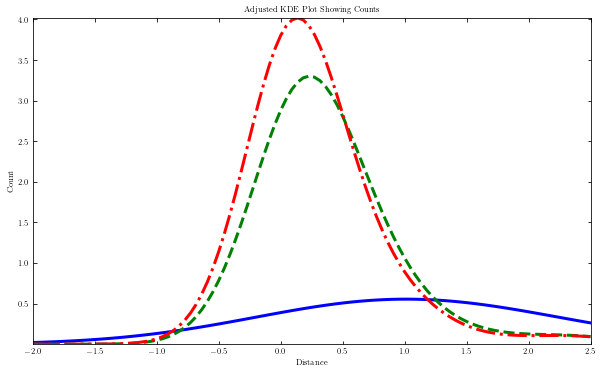

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

def convert_kde_to_counts(data, x_values, bin_width):
    kde = gaussian_kde(data, bw_method=bin_width)
    kde_density = kde(x_values)
    counts = kde_density * len(data) * bin_width
    return counts

# 定义 x 轴的值范围
x_min, x_max, n_bins = -2, 2.5, 100
x_values = np.linspace(x_min, x_max, n_bins)
bin_width = (x_max - x_min) / n_bins

# 绘制调整后的 KDE
plt.figure(figsize=(10, 6))

plt.plot(x_values, convert_kde_to_counts(MP_cl_dis, x_values, bin_width), color='blue', linestyle='-', linewidth=3)
plt.plot(x_values, convert_kde_to_counts(MRO_cl_dis, x_values, bin_width), color='green', linestyle='--', linewidth=3)
plt.plot(x_values, convert_kde_to_counts(MRI_cl_dis, x_values, bin_width), color='red', linestyle='-.', linewidth=3)

plt.xlabel('Distance')
plt.ylabel('Count')
plt.title('Adjusted KDE Plot Showing Counts')
plt.savefig('/home/bianyuan/workspace/pic/Distance.pdf')

In [ ]:
x_MRY_cl = np.linspace(np.percentile(Vr_V200_results_MRY_cl,0), np.percentile(Vr_V200_results_MRY_cl,90), 1000)
y_MRY_cl = kde_Vr_V200_MRY_cl(x_MRY_cl)
x_MRY_grp = np.linspace(np.percentile(Vr_V200_results_MRY_grp,0), np.percentile(Vr_V200_results_MRY_grp,90), 1000)
y_MRY_grp = kde_Vr_V200_MRY_grp(x_MRY_grp)

In [ ]:
ax[0].plot(x_MRY_cl, y_MRY_cl, color=cl, linewidth=3, linestyle = '.')
ax[0].plot(x_MRY_grp, y_MRY_grp, color=grp, linewidth=3, linestyle = '.')

In [ ]:
x_MP_cl = np.linspace(np.percentile(np.log10(rcirc_r200_results_MP_cl),0), np.percentile(np.log10(rcirc_r200_results_MP_cl),100), 1000)
y_MP_cl = kde_rcirc_r200_log_MP_cl(x_MP_cl)
x_MP_grp = np.linspace(np.percentile(np.log10(rcirc_r200_results_MP_grp),0), np.percentile(np.log10(rcirc_r200_results_MP_grp),100), 1000)
y_MP_grp = kde_rcirc_r200_log_MP_grp(x_MP_grp)
x_MP_fl = np.linspace(np.percentile(np.log10(rcirc_r200_results_MP_fl),0), np.percentile(np.log10(rcirc_r200_results_MP_fl),100), 1000)
y_MP_fl = kde_rcirc_r200_log_MP_fl(x_MP_fl)

x_MRO_cl = np.linspace(np.percentile(np.log10(rcirc_r200_results_MRO_cl),0), np.percentile(np.log10(rcirc_r200_results_MRO_cl),90), 1000)
y_MRO_cl = kde_rcirc_r200_log_MRO_cl(x_MRO_cl)
x_MRO_grp = np.linspace(np.percentile(np.log10(rcirc_r200_results_MRO_grp),0), np.percentile(np.log10(rcirc_r200_results_MRO_grp),90), 1000)
y_MRO_grp = kde_rcirc_r200_log_MRO_grp(x_MRO_grp)

x_MRI_cl = np.linspace(np.percentile(np.log10(rcirc_r200_results_MRI_cl),0), np.percentile(np.log10(rcirc_r200_results_MRI_cl),90), 1000)
y_MRI_cl = kde_rcirc_r200_log_MRI_cl(x_MRI_cl)
x_MRI_grp = np.linspace(np.percentile(np.log10(rcirc_r200_results_MRI_grp),0), np.percentile(np.log10(rcirc_r200_results_MRI_grp),90), 1000)
y_MRI_grp = kde_rcirc_r200_log_MRI_grp(x_MRI_grp)

x_MRY_cl = np.linspace(np.percentile(np.log10(rcirc_r200_results_MRY_cl),0), np.percentile(np.log10(rcirc_r200_results_MRY_cl),90), 1000)
y_MRY_cl = kde_rcirc_r200_log_MRY_cl(x_MRY_cl)
x_MRY_grp = np.linspace(np.percentile(np.log10(rcirc_r200_results_MRY_grp),0), np.percentile(np.log10(rcirc_r200_results_MRY_grp),90), 1000)
y_MRY_grp = kde_rcirc_r200_log_MRY_grp(x_MRY_grp)

In [ ]:
ax[4].plot(x_MP_cl, y_MP_cl, color=cl, linewidth=3, linestyle = '-')
ax[4].plot(x_MP_grp, y_MP_grp, color=grp, linewidth=3, linestyle = '-')
ax[4].plot(x_MP_fl, y_MP_fl, color=fl, linewidth=3, linestyle = '-')

ax[4].plot(x_MRO_cl, y_MRO_cl, color=cl, linewidth=3, linestyle = '--')
ax[4].plot(x_MRO_grp, y_MRO_grp, color=grp, linewidth=3, linestyle = '--')

ax[4].plot(x_MRI_cl, y_MRI_cl, color=cl, linewidth=3, linestyle = '-.')
ax[4].plot(x_MRI_grp, y_MRI_grp, color=grp, linewidth=3, linestyle = '-.')

ax[4].plot(x_MRY_cl, y_MRY_cl, color=cl, linewidth=3, linestyle = '.')
ax[4].plot(x_MRY_grp, y_MRY_grp, color=grp, linewidth=3, linestyle = '.')

In [4]:
from Project_galaxy import deIllustrisTNG_galaxy
import csv
import seaborn as sns
a = 1
H0 = 67.74
h = H0/100.
WM = 0.3089
WV = 0.6911
Tyr = 977.8
WR = 4.165E-5/(h*h)   # includes 3 massless neutrino species, T0 = 2.72528
WK = 1-WM-WR-WV
n = 1000

desktop_path = "/home/bianyuan/workspace/data/"   # 新创建的txt文件的存放路径 
full_path = desktop_path + 'age.csv'          #也可以创建一个.doc的word文档

with open('/home/bianyuan/workspace/data/age.csv','w') as file:
    writer = csv.writer(file)
    writer.writerow(["ID","MWted-Age"])
    file = open(full_path, 'w')                  # w 的含义为可进行读写                           
    file.close() 

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

for i in np.array(CSSs3['ID']):
    galaxy = deIllustrisTNG_galaxy(i, deproject=True, align_with='star', radius_align_max=10.,
                                radius_align_min=0., centmode='pot', snapshot=99, basePath=basePath, run=run)
    az = galaxy.s['tform']  # scale factor
    m = galaxy.s['mass'][az>0]
    age = 0.
    for jj in range(n):
        a = az*(jj+0.5)/n
        adot = (WK+(WM/a)+(WR/(a*a))+(WV*a*a))**0.5
        age = age + adot**(-1)

    zage = az*age/n
    zage_Gyr = (Tyr/H0)*zage  # this is calculate age
    zage_Gyr = zage_Gyr[zage_Gyr>0]
    # MWage = np.dot(m,zage_Gyr)/np.sum(m)
    MWage = 13.8 - np.dot(m,zage_Gyr)/np.sum(m)

    with open('/home/bianyuan/workspace/data/age.csv','a') as file:
        row = [i, MWage]
        out = open("/home/bianyuan/workspace/data/age.csv", "a")
        csv_writer = csv.writer(out, dialect = "excel")
        csv_writer.writerow(row)
        file.close() 

Header: {'BoxSize': 35000.0, 'FlagDoubleprecision': 0, 'Git_commit': b'd203ec8b07c7e2bdda5f608aa0babea46d603699', 'Git_date': b'Thu Apr 7 14:14:27 2016 +0200', 'HubbleParam': 0.6774, 'Ngroups_ThisFile': 1, 'Ngroups_Total': 10247012, 'Nids_ThisFile': 13513936, 'Nids_Total': 9471772986, 'Nsubgroups_ThisFile': 63864, 'Nsubgroups_Total': 5688113, 'NumFiles': 680, 'Omega0': 0.3089, 'OmegaLambda': 0.6911, 'Redshift': 2.220446049250313e-16, 'Time': 0.9999999999999998}
dict_keys(['count', 'Coordinates', 'Velocities', 'Masses', 'ParticleIDs', 'GFM_StellarFormationTime'])
dict_keys(['count'])
dict_keys(['count', 'Coordinates', 'Velocities', 'ParticleIDs'])
Main galaxy: 132288 1 2
Keys: ['pos', 'x', 'y', 'z', 'vel', 'vx', 'vy', 'vz', 'mass']
Bins: 33 Maximum radius used: 3.3100547714674327
Effective radius: 0.300914070133403 kpc; 0.5593066896763992
rvir,mvir,vvir 41.87275998003279 7844833758.40332 28.389731266462235
radius_align: 3.00914070133403 41.87275998003279
Header: {'BoxSize': 35000.0, 'Fl

Header: {'BoxSize': 35000.0, 'FlagDoubleprecision': 0, 'Git_commit': b'd203ec8b07c7e2bdda5f608aa0babea46d603699', 'Git_date': b'Thu Apr 7 14:14:27 2016 +0200', 'HubbleParam': 0.6774, 'Ngroups_ThisFile': 1, 'Ngroups_Total': 10247012, 'Nids_ThisFile': 13513936, 'Nids_Total': 9471772986, 'Nsubgroups_ThisFile': 63864, 'Nsubgroups_Total': 5688113, 'NumFiles': 680, 'Omega0': 0.3089, 'OmegaLambda': 0.6911, 'Redshift': 2.220446049250313e-16, 'Time': 0.9999999999999998}
dict_keys(['count', 'Coordinates', 'Velocities', 'Masses', 'ParticleIDs', 'GFM_StellarFormationTime'])
dict_keys(['count', 'Coordinates', 'Velocities', 'Masses', 'ParticleIDs'])
dict_keys(['count', 'Coordinates', 'Velocities', 'ParticleIDs'])
Main galaxy: 14037 88921 155032
Keys: ['pos', 'x', 'y', 'z', 'vel', 'vx', 'vy', 'vz', 'mass']
Bins: 1068 Maximum radius used: 106.89795625253548
Effective radius: 0.5004585966879003 kpc; 0.5275669932420204
rvir,mvir,vvir 90.60568852596509 79479545806.94336 61.430656820604355
radius_align: 5

In [14]:
matching_ids = sns.load_dataset('matching_ids',data_home='/home/bianyuan/workspace/data',cache=True)

CSSs3 = sns.load_dataset('CSSs3',data_home='/home/bianyuan/workspace/data',cache=True)

ID = np.array(matching_ids['snap99'])

MRI_grp_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (CSSs3['Number'] >= 5) & (np.log10(CSSs3['Groupmass']) <= 13) ) ]
MRI_cl_CSSs = np.array(CSSs3['ID'])[np.where( ((13.8-CSSs3['MWted-Age']) >= 2.9) & ((13.8-CSSs3['MWted-Age']) <= 6.4) & (np.array(CSSs3['[Z/H]_r']) > 0.1) & (CSSs3['Number'] > 1) & (CSSs3['Distance_grpvir'] > 0) & (np.log10(CSSs3['Groupmass']) > 13) ) ]

MRI_ID = np.concatenate((MRI_grp_CSSs, MRI_cl_CSSs), axis=0)

print(np.intersect1d(ID, MRI_ID))
print(len(np.intersect1d(ID, MRI_ID)))

[   100    108    120    122    125    129    133    152    160    166
    169    174    188    192    204    223    240    255    262    269
    271    274    293    294    303    313    327    356    404    414
    427    434    541  63988  64001 117323 117329 117330 117374 117397
 117446 117459 143902 143919 144245 167504 167506 184993 185008 185053
 220656 242838 242850 264910 264957 275567 275588 275608 275629 275670
 275692 282803 282804 282806 282809 282812 282816 282839 289408 289412
 289415 300936 313735 324152 324183 368858 368862 368863 368880 377692
 386288 388560 388570 398791 430873 436946 438152 448833 469491 482893]
90


In [28]:
# Finding the intersection of IDs
common_ids = np.intersect1d(ID, MRI_ID)

# Extracting 'snap67' values for the matching IDs in matching_ids
matching_snap67_values = matching_ids[matching_ids['snap99'].isin(common_ids)]['snap67']

print(np.array(matching_snap67_values))

[   118  92816  92870  92816  92889  92816  92886      1    112      3
     11    181 261417    131     45 295828 115152 115194 115152 115190
 115152 115154 105136 105228 216079 216081     11    185 160834 160842
 160813 190043 190077 190043 190042 190043 166602 166626 166602 166632
 166641     11     54 184181    171 280993 281008 392041 392042 237964
 307254 307264 307254 307264 276421 276422 276430 317880 297999 298005
 327093 327096 327104 376070 376076 268469]


In [93]:
import h5py
import numpy as np

def calculate_variables_fix(input_file_path, output_file_path, epsilon=1e-10):
    # Constants
    G = 4.302e-6  # gravitational constant in kpc/SM(km/s)^2

    # Open the input HDF5 file
    with h5py.File(input_file_path, 'r') as infile, h5py.File(output_file_path, 'w') as outfile:
        # Loop over all groups (galaxies) in the HDF5 file
        for group in infile.keys():
            # Read the data for each galaxy
            Time = np.array(infile[group]['time'])
            x = np.array(infile[group]['x'])
            y = np.array(infile[group]['y'])
            z = np.array(infile[group]['z'])
            vx = np.array(infile[group]['vx'])
            vy = np.array(infile[group]['vy'])
            vz = np.array(infile[group]['vz'])
            M200 = np.array(infile[group]['M200'])
            r200 = np.array(infile[group]['Rvir'])

            V200 = np.sqrt(G * M200 / r200)

            # Calculate velocities and distances in spherical coordinates
            vr = (x * vx + y * vy + z * vz) / np.sqrt(x**2 + y**2 + z**2)
            vtheta = np.sqrt(vx**2 + vy**2 + vz**2 - vr**2)

            # Calculate parameters
            Vr_V200 = np.abs(vr) / V200
            Vtheta_V200 = vtheta / V200
            V_ratio = Vtheta_V200 / Vr_V200
            J_Jcirc = Vtheta_V200 * np.exp(-(vr**2 + vtheta**2 - V200**2) / (2 * V200**2))
            rcirc_r200 = np.exp((vr**2 + vtheta**2 - V200**2) / (2 * V200**2))
            Theta = (rcirc_r200**2) * (J_Jcirc**0.78)

            # Correct zero values if needed
            J_Jcirc[J_Jcirc == 0] = epsilon
            # Theta[Theta == 0] = epsilon
            Theta = Theta[Theta > 0]

            # Create a new group in the output file and save the calculated data
            out_group = outfile.create_group(group)
            out_group.create_dataset('time', data=Time)
            out_group.create_dataset('Vr_V200', data=Vr_V200)
            out_group.create_dataset('Vtheta_V200', data=Vtheta_V200)
            out_group.create_dataset('V_ratio', data=V_ratio)
            out_group.create_dataset('J_Jcirc', data=J_Jcirc)
            out_group.create_dataset('rcirc_r200', data=rcirc_r200)
            out_group.create_dataset('Theta', data=Theta)

    return output_file_path

# Example usage
# output_file_path = calculate_variables_fix('input_file.h5', 'output_file.h5')

In [94]:
MP_cl_path = '/home/bianyuan/workspace/data/track/MP_cl_orbit2D.hdf5'
MP_grp_path = '/home/bianyuan/workspace/data/track/MP_grp_orbit2D.hdf5'
MP_fl_path = '/home/bianyuan/workspace/data/track/MP_fl_orbit2D.hdf5'

MP_cl_parameter_track_path = '/home/bianyuan/workspace/data/track/MP_cl_parameter2D.hdf5'
MP_grp_parameter_track_path = '/home/bianyuan/workspace/data/track/MP_grp_parameter2D.hdf5'
MP_fl_parameter_track_path = '/home/bianyuan/workspace/data/track/MP_fl_parameter2D.hdf5'

# Fetch the results
MP_cl_parameter_track_path = calculate_variables_fix(MP_cl_path, MP_cl_parameter_track_path)
MP_grp_parameter_track_path = calculate_variables_fix(MP_grp_path, MP_grp_parameter_track_path)
MP_fl_parameter_track_path = calculate_variables_fix(MP_fl_path, MP_fl_parameter_track_path)

MRO_cl_path = '/home/bianyuan/workspace/data/track/MRO_cl_orbit2D.hdf5'
MRO_grp_path = '/home/bianyuan/workspace/data/track/MRO_grp_orbit2D.hdf5'

MRO_cl_parameter_track_path = '/home/bianyuan/workspace/data/track/MRO_cl_parameter2D.hdf5'
MRO_grp_parameter_track_path = '/home/bianyuan/workspace/data/track/MRO_grp_parameter2D.hdf5'

MRO_cl_parameter_track_path = calculate_variables_fix(MRO_cl_path, MRO_cl_parameter_track_path)
MRO_grp_parameter_track_path = calculate_variables_fix(MRO_grp_path, MRO_grp_parameter_track_path)

MRI_cl_path = '/home/bianyuan/workspace/data/track/MRI_cl_orbit2D.hdf5'
MRI_grp_path = '/home/bianyuan/workspace/data/track/MRI_grp_orbit2D.hdf5'

MRI_cl_parameter_track_path = '/home/bianyuan/workspace/data/track/MRI_cl_parameter2D.hdf5'
MRI_grp_parameter_track_path = '/home/bianyuan/workspace/data/track/MRI_grp_parameter2D.hdf5'

MRI_cl_parameter_track_path = calculate_variables_fix(MRI_cl_path, MRI_cl_parameter_track_path)
MRI_grp_parameter_track_path = calculate_variables_fix(MRI_grp_path, MRI_grp_parameter_track_path)

MRY_cl_path = '/home/bianyuan/workspace/data/track/MRY_cl_orbit2D.hdf5'
MRY_grp_path = '/home/bianyuan/workspace/data/track/MRY_grp_orbit2D.hdf5'

MRY_cl_parameter_track_path = '/home/bianyuan/workspace/data/track/MRY_cl_parameter2D.hdf5'
MRY_grp_parameter_track_path = '/home/bianyuan/workspace/data/track/MRY_grp_parameter2D.hdf5'

MRY_cl_parameter_track_path = calculate_variables_fix(MRY_cl_path, MRY_cl_parameter_track_path)
MRY_grp_parameter_track_path = calculate_variables_fix(MRY_grp_path, MRY_grp_parameter_track_path)

In [91]:
import h5py

# Open the HDF5 file
file_meta = h5py.File('/home/bianyuan/workspace/data/track/MP_cl_parameter2D.hdf5', 'r')

# Function to recursively print the data structure
def print_structure(item, indent=""):
    if isinstance(item, h5py.Group):
        print(indent + "Group: " + item.name)
        for key in item.keys():
            print_structure(item[key], indent + "    ")
    elif isinstance(item, h5py.Dataset):
        print(indent + "Dataset: " + item.name)

# Call the function to print the structure
print_structure(file_meta)

# Close the file
file_meta.close()

Group: /
    Group: /117303
        Dataset: /117303/J_Jcirc
        Dataset: /117303/Theta
        Dataset: /117303/V_ratio
        Dataset: /117303/Vr_V200
        Dataset: /117303/Vtheta_V200
        Dataset: /117303/rcirc_r200
        Dataset: /117303/time
    Group: /117317
        Dataset: /117317/J_Jcirc
        Dataset: /117317/Theta
        Dataset: /117317/V_ratio
        Dataset: /117317/Vr_V200
        Dataset: /117317/Vtheta_V200
        Dataset: /117317/rcirc_r200
        Dataset: /117317/time
    Group: /117347
        Dataset: /117347/J_Jcirc
        Dataset: /117347/Theta
        Dataset: /117347/V_ratio
        Dataset: /117347/Vr_V200
        Dataset: /117347/Vtheta_V200
        Dataset: /117347/rcirc_r200
        Dataset: /117347/time
    Group: /143927
        Dataset: /143927/J_Jcirc
        Dataset: /143927/Theta
        Dataset: /143927/V_ratio
        Dataset: /143927/Vr_V200
        Dataset: /143927/Vtheta_V200
        Dataset: /143927/rcirc_r200
        Datas

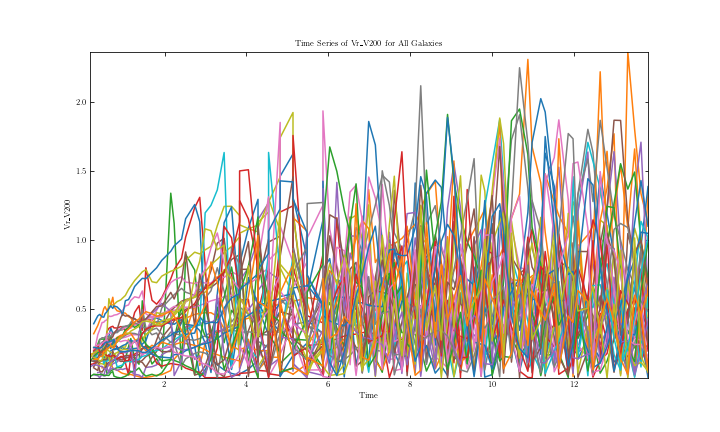

In [43]:
import h5py
import matplotlib.pyplot as plt

# out_group.create_dataset('Vr_V200', data=Vr_V200)
# out_group.create_dataset('Vtheta_V200', data=Vtheta_V200)
# out_group.create_dataset('J_Jcirc', data=J_Jcirc)
# out_group.create_dataset('rcirc_r200', data=rcirc_r200)
# out_group.create_dataset('Theta', data=Theta)

def plot_all_galaxies(file_path, dataset_name):
    # 打开HDF5文件
    with h5py.File(file_path, 'r') as file:
        plt.figure(figsize=(10, 6))

        # 遍历每个组（星系）
        for group_name in file.keys():
            group = file[group_name]

            # 确保所需的数据集存在
            if dataset_name in group:
                time = group['time'][...]
                data = group[dataset_name][...]

                # 绘制每个星系的数据
                plt.plot(time, data, label=f"Galaxy {group_name}")

        plt.title(f"Time Series of {dataset_name} for All Galaxies")
        plt.xlabel('Time')
        plt.ylabel(dataset_name)
        # plt.legend()
        plt.savefig('/home/bianyuan/workspace/pic/track_Vr.pdf')

plot_all_galaxies('/home/bianyuan/workspace/data/track/MRO_cl_parameter2D.hdf5', 'Vr_V200')

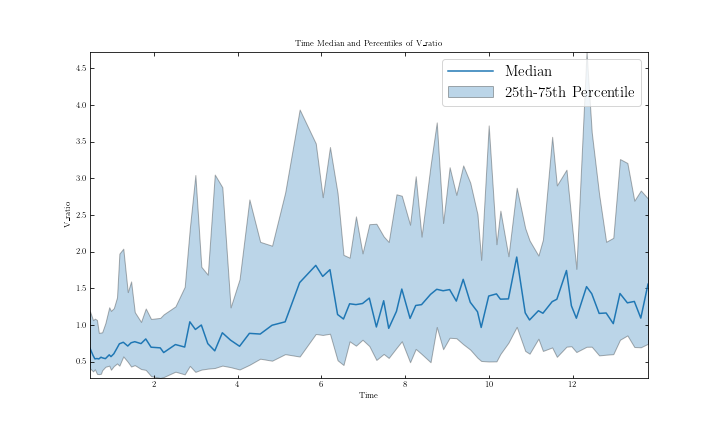

In [96]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

def plot_median_and_percentiles_over_time(file_path, dataset_name):
    with h5py.File(file_path, 'r') as file:
        all_data = []

        # 获取时间数据（假设每个星系的时间数据都相同）
        time = file[next(iter(file.keys()))]['time'][...]

        # 初始化一个与时间长度相同的列表来存储每个时间点的所有数据值
        data_at_each_time_point = {t: [] for t in time}

        # 收集每个星系的数据
        for group_name in file.keys():
            group = file[group_name]
            if dataset_name in group:
                data = group[dataset_name][...]
                for t, d in zip(time, data):
                    data_at_each_time_point[t].append(d)

        # 计算每个时间点的中位数和百分位数
        median_over_time = []
        p25_over_time = []
        p75_over_time = []
        for t in time:
            data_points = data_at_each_time_point[t]
            median_over_time.append(np.median(data_points))
            p25_over_time.append(np.percentile(data_points, 25))
            p75_over_time.append(np.percentile(data_points, 75))

        # 绘制图表
        plt.figure(figsize=(10, 6))
        plt.plot(time, median_over_time, label='Median')
        plt.fill_between(time, p25_over_time, p75_over_time, alpha=0.3, label='25th-75th Percentile')
        plt.title(f"Time Median and Percentiles of {dataset_name}")
        plt.xlabel('Time')
        plt.ylabel(dataset_name)
        plt.legend()
        plt.savefig('/home/bianyuan/workspace/pic/track_V_ratio.pdf')

# 使用示例
plot_median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MRO_cl_parameter2D.hdf5', 'V_ratio')

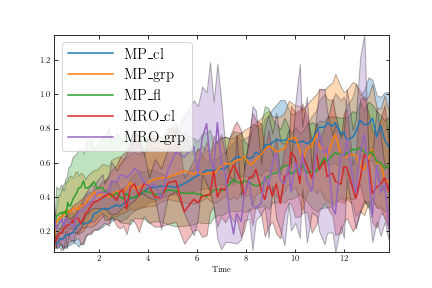

In [99]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

def median_and_percentiles_over_time(file_path, dataset_name):
    with h5py.File(file_path, 'r') as file:
        time_data = {}
        for group in file:
            time = file[group]['time'][...]
            data = file[group]['Vr_V200'][...]
            for t, d in zip(time, data):
                if t not in time_data:
                    time_data[t] = []
                time_data[t].append(d)

        # 计算每个时间点的中位数和百分位数
        times = sorted(time_data.keys())
        medians = [np.median(time_data[t]) for t in times]
        p25 = [np.percentile(time_data[t], 25) for t in times]
        p75 = [np.percentile(time_data[t], 75) for t in times]

        return times, medians, p25, p75
    
'''Vr'''
times_MP_cl_Vr, median_MP_cl_Vr, p25_MP_cl_Vr, p75_MP_cl_Vr = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MP_cl_parameter2D.hdf5', 'Vr_V200')
times_MP_grp_Vr, median_MP_grp_Vr, p25_MP_grp_Vr, p75_MP_grp_Vr = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MP_grp_parameter2D.hdf5', 'Vr_V200')
times_MP_fl_Vr, median_MP_fl_Vr, p25_MP_fl_Vr, p75_MP_fl_Vr = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MP_fl_parameter2D.hdf5', 'Vr_V200')

times_MRO_cl_Vr, median_MRO_cl_Vr, p25_MRO_cl_Vr, p75_MRO_cl_Vr = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MRO_cl_parameter2D.hdf5', 'Vr_V200')
times_MRO_grp_Vr, median_MRO_grp_Vr, p25_MRO_grp_Vr, p75_MRO_grp_Vr = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MRO_grp_parameter2D.hdf5', 'Vr_V200')

'''Vtheta'''
times_MP_cl_Vtheta, median_MP_cl_Vtheta, p25_MP_cl_Vtheta, p75_MP_cl_Vtheta = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MP_cl_parameter2D.hdf5', 'Vtheta_V200')
times_MP_grp_Vtheta, median_MP_grp_Vtheta, p25_MP_grp_Vtheta, p75_MP_grp_Vtheta = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MP_grp_parameter2D.hdf5', 'Vtheta_V200')
times_MP_fl_Vtheta, median_MP_fl_Vtheta, p25_MP_fl_Vtheta, p75_MP_fl_Vtheta = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MP_fl_parameter2D.hdf5', 'Vtheta_V200')

times_MRO_cl_Vtheta, median_MRO_cl_Vtheta, p25_MRO_cl_Vtheta, p75_MRO_cl_Vtheta = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MRO_cl_parameter2D.hdf5', 'Vtheta_V200')
times_MRO_grp_Vtheta, median_MRO_grp_Vtheta, p25_MRO_grp_Vtheta, p75_MRO_grp_Vtheta = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MRO_grp_parameter2D.hdf5', 'Vtheta_V200')

'''V_ratio'''
times_MP_cl_Vratio, median_MP_cl_Vratio, p25_MP_cl_Vratio, p75_MP_cl_Vratio = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MP_cl_parameter2D.hdf5', 'V_ratio')
times_MP_grp_Vratio, median_MP_grp_Vratio, p25_MP_grp_Vratio, p75_MP_grp_Vratio = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MP_grp_parameter2D.hdf5', 'V_ratio')
times_MP_fl_Vratio, median_MP_fl_Vratio, p25_MP_fl_Vratio, p75_MP_fl_Vratio = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MP_fl_parameter2D.hdf5', 'V_ratio')

times_MRO_cl_Vratio, median_MRO_cl_Vratio, p25_MRO_cl_Vratio, p75_MRO_cl_Vratio = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MRO_cl_parameter2D.hdf5', 'V_ratio')
times_MRO_grp_Vratio, median_MRO_grp_Vratio, p25_MRO_grp_Vratio, p75_MRO_grp_Vratio = median_and_percentiles_over_time('/home/bianyuan/workspace/data/track/MRO_grp_parameter2D.hdf5', 'V_ratio')

plt.figure()

plt.plot(times_MP_cl_Vr, median_MP_cl_Vratio, label='MP_cl')
plt.fill_between(times_MP_cl_Vr, p25_MP_cl_Vratio, p75_MP_cl_Vratio, alpha=0.3)
plt.plot(times_MP_grp_Vr, median_MP_grp_Vratio, label='MP_grp')
plt.fill_between(times_MP_grp_Vr, p25_MP_grp_Vratio, p75_MP_grp_Vratio, alpha=0.3)
plt.plot(times_MP_fl_Vr, median_MP_fl_Vratio, label='MP_fl')
plt.fill_between(times_MP_fl_Vr, p25_MP_fl_Vratio, p75_MP_fl_Vratio, alpha=0.3)
plt.plot(times_MRO_cl_Vr, median_MRO_cl_Vratio, label='MRO_cl')
plt.fill_between(times_MRO_cl_Vr, p25_MRO_cl_Vratio, p75_MRO_cl_Vratio, alpha=0.3)
plt.plot(times_MRO_grp_Vr, median_MRO_grp_Vratio, label='MRO_grp')
plt.fill_between(times_MRO_grp_Vr, p25_MRO_grp_Vratio, p75_MRO_grp_Vratio, alpha=0.3)

# plt.plot(times_MP_cl, median_MP_cl, label='MP_cl')
# plt.fill_between(times_MP_cl, p25_MP_cl, p75_MP_cl, alpha=0.3)
# plt.plot(times_MP_grp, median_MP_grp, label='MP_grp')
# plt.fill_between(times_MP_grp, p25_MP_grp, p75_MP_grp, alpha=0.3)
# plt.plot(times_MP_fl, median_MP_fl, label='MP_fl')
# plt.fill_between(times_MP_fl, p25_MP_fl, p75_MP_fl, alpha=0.3)
# plt.plot(times_MRO_cl, median_MRO_cl, label='MRO_cl')
# plt.fill_between(times_MRO_cl, p25_MRO_cl, p75_MRO_cl, alpha=0.3)
# plt.plot(times_MRO_grp, median_MRO_grp, label='MRO_grp')
# plt.fill_between(times_MRO_grp, p25_MRO_grp, p75_MRO_grp, alpha=0.3)
# plt.title(f"Time Median and Percentiles of {dataset_name}")
plt.xlabel('Time')
# plt.ylabel(dataset_name)
plt.legend()
plt.savefig('/home/bianyuan/workspace/pic/track_V_ratio.pdf')

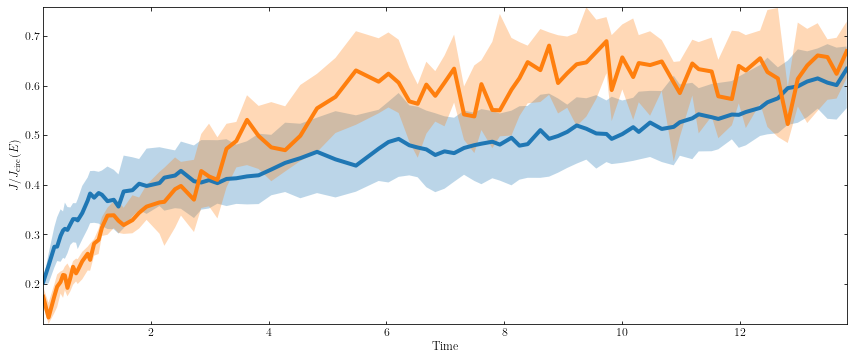

In [68]:
# out_group.create_dataset('Vr_V200', data=Vr_V200)
# out_group.create_dataset('Vtheta_V200', data=Vtheta_V200)
# out_group.create_dataset('J_Jcirc', data=J_Jcirc)
# out_group.create_dataset('rcirc_r200', data=rcirc_r200)
# out_group.create_dataset('Theta', data=Theta)

# 定义函数计算多个文件中每个时间点的中位数和百分位数
def combined_median_and_percentiles(file_paths, dataset_name):
    time_data = {}

    for file_path in file_paths:
        with h5py.File(file_path, 'r') as file:
            for group in file:
                time = file[group]['time'][...]
                data = file[group][dataset_name][...]
                for t, d in zip(time, data):
                    if t not in time_data:
                        time_data[t] = []
                    time_data[t].append(d)

    # 计算每个时间点的中位数和百分位数
    times = sorted(time_data.keys())
    medians = [np.median(time_data[t]) for t in times]
    p25 = [np.percentile(time_data[t], 40) for t in times]
    p75 = [np.percentile(time_data[t], 60) for t in times]

    return times, medians, p25, p75

# MP和MRO文件路径列表
mp_file_paths = [
    '/home/bianyuan/workspace/data/track/MP_cl_parameter2D.hdf5',
    '/home/bianyuan/workspace/data/track/MP_grp_parameter2D.hdf5',
    '/home/bianyuan/workspace/data/track/MP_fl_parameter2D.hdf5'
]
mro_file_paths = [
    '/home/bianyuan/workspace/data/track/MRO_cl_parameter2D.hdf5',
    '/home/bianyuan/workspace/data/track/MRO_grp_parameter2D.hdf5'
]

# 数据集名称
dataset_name = 'J_Jcirc'

# Vr_V200
# Vtheta_V200
# J_Jcirc

# 计算MP和MRO文件的统计数据
times_mp, median_mp, p25_mp, p75_mp = combined_median_and_percentiles(mp_file_paths, dataset_name)
times_mro, median_mro, p25_mro, p75_mro = combined_median_and_percentiles(mro_file_paths, dataset_name)

# 绘制图表
plt.figure(figsize=(12,5), facecolor='none')
plt.subplots_adjust(left=0.05, bottom=0.10, right=0.98, top=0.98, wspace=0.15, hspace=0.07)
plt.plot(times_mp, median_mp, linewidth=4, label='MPs')
plt.fill_between(times_mp, p25_mp, p75_mp, alpha=0.3, edgecolor='none')
plt.plot(times_mro, median_mro, linewidth=4, label='MROs')
plt.fill_between(times_mro, p25_mro, p75_mro, alpha=0.3, edgecolor='none')

# plt.plot(times_mp, np.log10(median_mp), linewidth=4)
# plt.fill_between(times_mp, np.log10(p25_mp), np.log10(p75_mp), alpha=0.3, edgecolor='none')
# plt.plot(times_mro, np.log10(median_mro),linewidth=4)
# plt.fill_between(times_mro, np.log10(p25_mro), np.log10(p75_mro), alpha=0.3, edgecolor='none')

# ax[1].set_ylabel(r'$\mathrm{P}(V_{\theta}/V_{\mathrm{200}}$)',fontsize=15)
# ax[2].set_ylabel('$\mathrm{P}(J/J_{\mathrm{circ}}(E))$',fontsize=15)
# ax[3].set_ylabel('$\mathrm{P}(r_{\mathrm{circ}}(E)/r_{\mathrm{200}})$',fontsize=15)
# ax[4].set_ylabel('$\mathrm{P}(\mathrm{log}_{10}\Theta)$',fontsize=15)

plt.tick_params(axis='x', which='both', labelsize=12)
plt.tick_params(axis='y', which='both', labelsize=12)
plt.xlabel('Time',fontsize=12)
# plt.ylabel(r'$\mathrm{V}_{r}/\mathrm{V}_{200}$',fontsize=12)
# plt.ylabel(r'$V_{\theta}/V_{\mathrm{200}}$',fontsize=12)
plt.ylabel('$J/J_{\mathrm{circ}}(E)$',fontsize=12)
# plt.ylabel(r'$r_{\mathrm{circ}}(E)/r_{\mathrm{200}}$',fontsize=12)
# plt.ylabel(r'$\mathrm{log}_{10}\Theta$',fontsize=12)
# plt.legend(frameon=False)
plt.savefig('/home/bianyuan/workspace/pic/track_'+dataset_name+'.pdf')

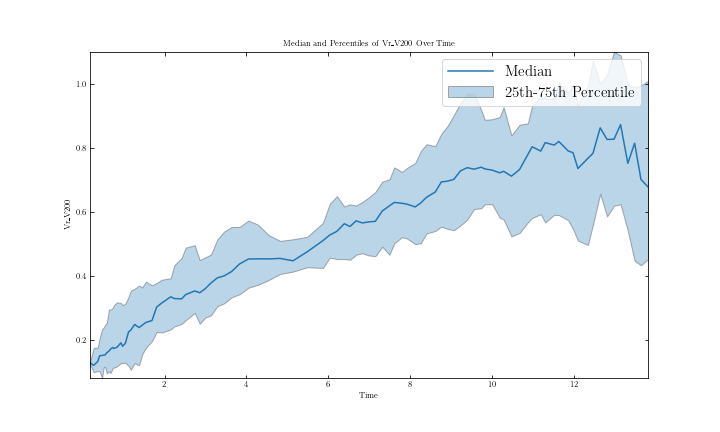

In [82]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

# 打开HDF5文件
with h5py.File('/home/bianyuan/workspace/data/track/MP_cl_parameter2D.hdf5', 'r') as file:
    time_data = {}
    for group in file:
        time = file[group]['time'][...]
        data = file[group]['Vr_V200'][...]
        for t, d in zip(time, data):
            if t not in time_data:
                time_data[t] = []
            time_data[t].append(d)

# 计算每个时间点的中位数和百分位数
times = sorted(time_data.keys())
medians = [np.median(time_data[t]) for t in times]
p25 = [np.percentile(time_data[t], 25) for t in times]
p75 = [np.percentile(time_data[t], 75) for t in times]

# 绘图
plt.figure(figsize=(10, 6))
plt.plot(times, medians, label='Median')
plt.fill_between(times, p25, p75, alpha=0.3, label='25th-75th Percentile')
plt.xlabel('Time')
plt.ylabel('Vr_V200')
plt.title('Median and Percentiles of Vr_V200 Over Time')
plt.legend()
plt.savefig('/home/bianyuan/workspace/pic/track_J_Jcirc_MP_cl.pdf')